### 1.2.1 : EDA: Advanced Feature Extraction.


In [56]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc

import re
from nltk.corpus import stopwords
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
import re
from nltk.corpus import stopwords
# This package is used for finding longest common subsequence between two strings
# you can write your own dp code for this
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
from fuzzywuzzy import fuzz
from sklearn.manifold import TSNE
# Import the Required lib packages for WORD-Cloud generation
# https://stackoverflow.com/questions/45625434/how-to-install-wordcloud-in-python3-6
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image

In [60]:
#https://stackoverflow.com/questions/12468179/unicodedecodeerror-utf8-codec-cant-decode-byte-0x9c
if os.path.isfile('df_fe_without_preprocessing_train.csv'):
    df = pd.read_csv("df_fe_without_preprocessing_train.csv",encoding='latin-1')
    df = df.fillna('')
    df.head()
else:
    print("get df_fe_without_preprocessing_train.csv from drive or run the previous notebook")


if os.path.isfile('df_fe_without_preprocessing_test.csv'):
    df_test = pd.read_csv("df_fe_without_preprocessing_test.csv",encoding='latin-1')
    df_test = df_test.fillna('')
    df_test.head()
else:
    print("get df_fe_without_preprocessing_train.csv from drive or run the previous notebook")    
    
    

In [61]:
df.head(2)

,Unnamed: 0,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,250993,250993,365004,365005,How do I get diagnosed with depression?,How do psychiatrists or psychologists diagnose...,0,1,1,39,58,7,7,3.0,14.0,0.214286,2,0
1,79287,79287,135021,135022,Are morning assemblies important in schools?,Is it true that if you have a bath at night it...,0,2,1,44,119,6,25,4.0,29.0,0.137931,3,1


In [62]:
df_test.head(2)

,Unnamed: 0,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,106215,106215,175011,67004,What is the best book on data-structures for b...,Which is the best book for data structures and...,1,1,1,55,71,9,12,5.0,20.0,0.250,2,0
1,15496,15496,29601,29602,How do I gain profit from stock?,How do I gain more profit from stock trading?,1,1,2,32,45,7,9,6.0,16.0,0.375,3,1


<h2> 3.4 Preprocessing of Text </h2>

- Preprocessing:
    - Removing html tags 
    - Removing Punctuations
    - Performing stemming
    - Removing Stopwords
    - Expanding contractions etc.

In [63]:
from nltk.corpus import stopwords
#import nltk

#nltk.download('stopwords')
# To get the results in 4 decemal points
SAFE_DIV = 0.0001 

STOP_WORDS = stopwords.words("english")


def preprocess(x):
    x = str(x).lower()
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    porter = PorterStemmer()
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ', x)
    
    
    if type(x) == type(''):
        x = porter.stem(x)
        example1 = BeautifulSoup(x)
        x = example1.get_text()
               
    
    return x
    

- Function to Compute and get the features : With 2 parameters of Question 1 and Question 2

<h2> 3.5 Advanced Feature Extraction (NLP and Fuzzy Features) </h2>

Definition:
- __Token__: You get a token by splitting sentence a space
- __Stop_Word__ : stop words as per NLTK.
- __Word__ : A token that is not a stop_word


Features:
- __cwc_min__ :  Ratio of common_word_count to min lenghth of word count of Q1 and Q2 <br>cwc_min = common_word_count / (min(len(q1_words), len(q2_words))
<br>
<br>
- __cwc_max__ :  Ratio of common_word_count to max lenghth of word count of Q1 and Q2 <br>cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
<br>
<br>
- __csc_min__ :  Ratio of common_stop_count to min lenghth of stop count of Q1 and Q2 <br> csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
<br>
<br>
- __csc_max__ :  Ratio of common_stop_count to max lenghth of stop count of Q1 and Q2<br>csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
<br>
<br>
- __ctc_min__ :  Ratio of common_token_count to min lenghth of token count of Q1 and Q2<br>ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
<br>
<br>

- __ctc_max__ :  Ratio of common_token_count to max lenghth of token count of Q1 and Q2<br>ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
<br>
<br>
        
- __last_word_eq__ :  Check if Last word of both questions is equal or not<br>last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
<br>
<br>

- __first_word_eq__ :  Check if First word of both questions is equal or not<br>first_word_eq = int(q1_tokens[0] == q2_tokens[0])
<br>
<br>
        
- __abs_len_diff__ :  Abs. length difference<br>abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
<br>
<br>

- __mean_len__ :  Average Token Length of both Questions<br>mean_len = (len(q1_tokens) + len(q2_tokens))/2
<br>
<br>


- __fuzz_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>

- __fuzz_partial_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_sort_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_set_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>





- __longest_substr_ratio__ :  Ratio of length longest common substring to min lenghth of token count of Q1 and Q2<br>longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))


In [64]:

#https://www.geeksforgeeks.org/longest-common-substring-dp-29/
def lcsubstrings(X, Y): 
    m = len(X) 
    n = len(Y) 
      
    # Create a table to store lengths of 
    # longest common suffixes of substrings.  
    # Note that LCSuff[i][j] contains the  
    # length of longest common suffix of  
    # X[0...i-1] and Y[0...j-1]. The first 
    # row and first column entries have no 
    # logical meaning, they are used only 
    # for simplicity of the program. 
      
    # LCSuff is the table with zero  
    # value initially in each cell 
    LCSuff = [[0 for k in range(n+1)] for l in range(m+1)] 
      
    # To store the length of  
    # longest common substring 
    result = 0 
  
    # Following steps to build 
    # LCSuff[m+1][n+1] in bottom up fashion 
    for i in range(m + 1): 
        for j in range(n + 1): 
            if (i == 0 or j == 0): 
                LCSuff[i][j] = 0
            elif (X[i-1] == Y[j-1]): 
                LCSuff[i][j] = LCSuff[i-1][j-1] + 1
                result = max(result, LCSuff[i][j]) 
            else: 
                LCSuff[i][j] = 0
    return result 

In [65]:
lcsubstrings('www.geeksforgeeks','www.geeksforgeeks.org')

17

In [66]:
def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    print(q1_stops)
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features

# get the Longest Common sub string

def get_longest_substr_ratio(a, b):
    strs = lcsubstrings(a, b)
    if strs== 0:
        return 0
    else:
        return strs / (min(len(a), len(b)) + 1)

def extract_features(df):
    # preprocessing each question
    df["question1"] = df["question1"].fillna("").apply(preprocess)
    df["question2"] = df["question2"].fillna("").apply(preprocess)

    print("token features...")
    
    # Merging Features with dataset
    
    token_features = df.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    df["cwc_min"]       = list(map(lambda x: x[0], token_features))
    df["cwc_max"]       = list(map(lambda x: x[1], token_features))
    df["csc_min"]       = list(map(lambda x: x[2], token_features))
    df["csc_max"]       = list(map(lambda x: x[3], token_features))
    df["ctc_min"]       = list(map(lambda x: x[4], token_features))
    df["ctc_max"]       = list(map(lambda x: x[5], token_features))
    df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    df["first_word_eq"] = list(map(lambda x: x[7], token_features))
    df["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    df["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    
    # do read this blog: http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
    # https://stackoverflow.com/questions/31806695/when-to-use-which-fuzz-function-to-compare-2-strings
    # https://github.com/seatgeek/fuzzywuzzy
    print("fuzzy features..")

    df["token_set_ratio"]       = df.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    # The token sort approach involves tokenizing the string in question, sorting the tokens alphabetically, and 
    # then joining them back into a string We then compare the transformed strings with a simple ratio().
    df["token_sort_ratio"]      = df.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    df["fuzz_ratio"]            = df.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    df["fuzz_partial_ratio"]    = df.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    df["longest_substr_ratio"]  = df.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    return df

In [67]:
if os.path.isfile('nlp_features_train.csv'):
    df = pd.read_csv("nlp_features_train.csv",encoding='latin-1')
    df.fillna('')
else:
    print("Extracting features for train:")
    df = pd.read_csv("train.csv")
    df = extract_features(df)
    df.to_csv("nlp_features_train.csv", index=False)
df.head(2)

Extracting features for train:
token features...
{'with', 'i', 'how', 'do'}
{'in', 'are'}
{'that', 'is', 'the', 'in', 'there', 'any', 'are'}
{'should', 'i', 'for'}
{'about', 'after', 'you', 'do', 'what'}
{'is', 'the', 'which', 'and', 'why'}
{'can'}
{'the', 'can', 'of', 'an', 'how', 'you'}
{'myself', 'more', 'can', 'how', 'i'}
{'i', 'how', 'do', 'a'}
{'i', 'how', 'as', 'can'}
{'is', 'a', 'not', 'being', 'how'}
{'by', 'from', 'can', 'doing', 'how', 'some', 'i'}
{'a', 'for', 'at', 'how', 'do', 'or', 'i'}
{'you', 'own'}
{'into', 'from', 'a', 'can', 'to', 'how', 'be'}
{'am', 'have', 'a', 'after', 'in', 'if', 'do', 'i', 'what'}
{'other', 'what', 'some', 'own', 'than', 'are'}
{'to', 'in', 'for', 'what', 'are'}
{'into', 'can', 'i', 'any', 'on'}
{'i', 'how', 'do', 'and'}
{'over', 'is', 'own'}
{'does', 'in', 'when', 'a'}
{'is', 'to', 'a', 'what', 'it', 'be'}
{'of', 'in', 'what', 'be'}
{'your', 'in', 'what', 'are'}
{'how', 'is', 'in'}
{'is', 'more', 'which', 'for', 'or'}
{'is', 'the', 'after', 'i

{'does', 'why', 'their'}
{'my', 'why', 'is'}
{'is', 'what', 'own'}
{'does', 'how', 'a', 'for'}
{'can', 'once', 'at', 'how', 'you'}
{'is'}
{'is', 'what', 'the'}
{'is', 'the', 'in', 'who', 'your'}
{'how', 'were', 'in'}
{'that', 'can', 'of', 'in', 'not', 'some', 'do', 'i', 'what', 'are'}
{'while', 'in', 'for', 'as', 'and', 'why', 'are'}
{'am', 'is', 'to', 'the', 'a', 'having', 'there', 'i', 'on'}
{'why', 'the', 'did', 'for'}
{'that', 'have', 'a', 'to', 'the', 'for', 'how', 'do', 'or', 'i', 'it'}
{'does', 'how'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'am', 'from', 'to', 'a', 'the', 'but', 'or', 'i', 'what', 'are'}
{'is', 'what'}
{'most', 'is', 'the', 'to', 'in', 'your', 'you', 'had', 'what'}
{'about', 'have', 'the', 'to', 'they', 'and', 'what', 'are'}
{'i', 'how', 'do', 'a'}
{'am', 'can', 'not', 'how', 'i'}
{'is', 'in', 'it', 'to'}
{'will', 'what', 'be'}
{'to', 'a', 'can', 'in', 'how', 'i'}
{'from', 'doing', 'should', 'do', 'why', 'we', 'be'}
{'is', 'again', 'have', 'the', 'you', 

{'by', 'can', 'between', 'how', 'i'}
{'is', 'to', 'of', 'how', 'and', 'why', 'it'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'why', 'now', 'and'}
{'a', 'the', 'of', 'did', 'he', 'up', 'and', 'what'}
{'when', 'not', 'doing', 'should', 'do', 'i', 'what'}
{'i', 'how', 'this', 'can'}
{'am', 'have', 'the', 'of', 'in', 'for', 'during', 'i', 'will', 'be'}
{'is', 'what', 'own'}
{'to', 'a', 'the', 'what', 'are'}
{'is', 'the', 'm', 'an', 'in', 'for', 'or', 'what'}
{'is', 'of', 'in', 'how', 'out'}
{'what', 'are', 'the'}
{'more', 'is', 'to', 'the', 'what'}
{'to', 'if', 'what', 'and'}
{'once', 'i', 'this'}
{'so', 'doing', 'with', 'there', 'and', 'or', 'why', 'on', 'are'}
{'most', 'about', 'the', 'what', 'are'}
{'from', 'can', 'my', 'how', 'i'}
{'why', 'do'}
{'than', 'have', 'are'}
{'is', 'whom', 'to', 'the', 'of', 'other', 'for', 'there'}
{'we', 'an', 'in', 'when'}
{'will', 'the', 'for'}
{'during', 'i', 'how', 'can'}
{'i', 'how', 'from', 'do'}
{'between', 'is', 'what', 'the'}
{'a', 'to', 'an

{'i', 'how', 'do', 'for'}
{'is', 'to', 'a', 'for', 'as', 'it'}
{'what', 'are', 'the'}
{'is', 'more', 'which', 'in', 'or'}
{'how', 'in', 'for'}
{'is', 'have', 'a', 'to', 'can', 'which', 'my', 'i'}
{'a', 'how', 'you', 'do', 'on'}
{'i', 'how', 's', 'can'}
{'or', 'more', 'are'}
{'after', 'is'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'more', 'can', 'in', 'not', 'why'}
{'is', 'the', 'of', 'this', 'what'}
{'is', 'to', 'how', 'own', 'it'}
{'what', 'you', 'if', 'it', 'be'}
{'is', 'what'}
{'how', 'is', 'the', 'and'}
{'from', 'can', 'my', 'how', 'i'}
{'my', 'i', 'how', 'can'}
{'should', 'how', 'a'}
{'is', 'the', 'of', 'an', 'what'}
{'when', 'the', 'to', 'which', 'will', 'be'}
{'of', 'is', 'what', 'the'}
{'a', 'for', 'there', 'will', 'be'}
{'is', 'the', 'of', 'and', 'what'}
{'to', 'i', 'in', 'do'}
{'of', 'who', 'the', 'are'}
{'is', 'the', 'my', 'if', 'i', 'it'}
{'the', 'can', 'in', 'you', 'do', 'what', 'are'}
{'the', 'a', 'of', 'how', 'own', 'or', 'what', 'are'}
{'an', 'can'}


{'the', 'of', 'in', 'for', 'how', 'will'}
{'more', 'can', 'how', 'and', 'i', 'be'}
{'which', 'is', 'the', 'for'}
{'how', 'can'}
{'when', 'their', 'do', 'why', 'we'}
{'why', 'in', 'you', 'do'}
{'to', 'the', 'in', 'for', 'should', 'what', 'be'}
{'does', 'how', 'in', 'a'}
{'is', 'what', 'the'}
{'that', 'is', 'an', 'not', 'does', 'there'}
{'i', 'where', 'can'}
{'is', 'about', 'the', 'to', 'how', 'and', 'i', 'what'}
{'how', 'a', 'can'}
{'i', 'that', 'a', 'does', 'what', 'or', 'if', 'it'}
{'of', 'what', 'the'}
{'is', 'in', 'what', 'by'}
{'is', 'the', 'a', 'of', 'in', 'this', 'with', 'there'}
{'about', 'by', 'the', 'can', 'an', 'now', 'what'}
{'is', 'the', 'in', 'and', 'why'}
{'into', 'which', 'the', 'be'}
{'on', 'the', 'of', 'and', 'will', 'what', 'be'}
{'which', 'have'}
{'the', 'can', 'of', 'at', 'i'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'of', 'you', 'what', 'do'}
{'the', 'can', 'of', 'in', 'for', 'own', 'what', 'be'}
{'is', 'the', 'of', 'which', 'in', 'was', 'what'}
{'how', 'in', 

{'is', 'from', 'the'}
{'the', 'in', 'with', 'how', 'and'}
{'from', 'the', 'of', 'where', 'in', 'should', 'or', 'we'}
{'is', 's', 'for', 'your', 'own', 'what'}
{'why', 'more', 'the', 'for'}
{'i', 'how', 'to', 'can'}
{'of', 'how', 'there', 'their', 'what', 'are'}
{'is', 'what', 'from'}
{'is', 'to', 'the', 'you', 'own', 'what'}
{'is', 'what', 'the'}
{'most', 'is', 'the', 'in', 'who'}
{'is', 'to', 'the', 'with', 'what'}
{'why', 'some', 'are'}
{'should', 'i', 'how', 'for'}
{'am', 'i', 'is', 'have', 'a', 'not', 'do', 'why', 'because', 'it'}
{'are', 'why', 'some', 'do'}
{'i', 'how', 'for', 'can'}
{'is', 'for', 'your', 'and', 'what'}
{'a', 'of', 'all', 'not', 'how', 'there', 'are'}
{'about', 'some', 'what', 'are'}
{'is', 'to', 'the', 'can', 'a', 'in', 'at', 'how', 'what'}
{'is', 'a'}
{'you', 'did'}
{'how', 'be', 'can'}
{'is', 'this', 'how', 'do', 'own', 'on'}
{'does', 'how', 'the'}
{'the', 'a', 'of', 'to', 'in', 'for', 'should', 'what', 'be'}
{'or', 'why', 'not', 'can'}
{'to', 'of', 'in', 'for

{'to', 'is', 'the', 'a'}
{'the', 'for', 'at', 'how', 'do', 'i'}
{'all', 'is', 'what', 'about'}
{'the', 'can', 'not', 'how', 'and', 'if', 'are', 'be'}
{'to', 'he', 'for', 'does', 'how', 'and', 'will', 'it'}
{'is', 'to', 'in', 'what', 'it'}
{'is', 'what', 'a', 'and'}
{'why', 'about', 'is', 'they', 'to', 'in', 'at', 'there', 'you', 'do', 'if', 'what', 'are'}
{'is', 'what'}
{'why', 'they', 'do'}
{'does', 'more', 'than'}
{'is', 'what'}
{'any', 'did', 'own'}
{'i', 'how', 'the', 'do'}
{'a', 'can', 'in', 'how', 'few', 'i'}
{'in', 'for', 'there', 'any', 'are'}
{'i', 'how', 'by', 'do'}
{'my', 'i', 'how', 'do'}
{'is', 'the', 'a', 'of', 'with', 'what'}
{'of', 'which', 'into', 'the'}
{'when', 'my', 'should', 'having', 'with', 'do', 'i', 'what'}
{'to', 'the', 'up', 'what', 'are'}
{'i', 'how', 'from', 'do'}
{'an', 'is', 'it', 'to'}
{'i', 'how', 'some', 'can'}
{'to', 'can', 'a', 'how', 'i', 'me'}
{'the', 'a', 'of', 'and', 'what', 'are'}
{'is', 'when', 'the', 'to', 'of', 'we', 'what', 'are'}
{'to', 'a'

{'the', 'did', 'he', 'in', 'for', 'why'}
{'am', 'is', 'about', 'from', 'a', 'to', 'so', 'my', 'an', 'in', 'not', 'this', 'for', 'should', 'but', 'and', 'do', 'i', 'what'}
{'to', 'a', 'of', 'and', 'what'}
{'so', 'why', 'are'}
{'that', 'for', 'some', 'what', 'are'}
{'which', 'is', 'in'}
{'has', 'the', 'between', 'and', 'why'}
{'most', 'when', 'the', 'of', 'with', 'your', 'some', 'you', 'what', 'are'}
{'should', 'in', 'the', 'be'}
{'am', 'in', 'if', 'for', 'should', 'i'}
{'is', 'the', 'in', 'who', 't'}
{'who', 'your', 'are'}
{'the', 'can', 'for', 'what', 'be'}
{'should', 'i', 'do'}
{'which', 'in', 'the', 'are'}
{'is', 'a', 'to', 'who', 'or', 'be'}
{'my', 'i', 'how', 'do'}
{'is', 'to', 'in', 'only', 'what', 'how', 'who', 'it', 'are'}
{'i', 'how', 'do', 'a'}
{'how', 'the', 'did'}
{'is', 'a', 'the', 'for', 'what'}
{'the', 'of', 'some', 'what', 'are'}
{'i', 'in', 'and', 'can'}
{'a', 'can', 'in', 'only', 'you', 'few', 'if', 'what', 'are'}
{'is', 'to', 'in', 'with', 'it'}
{'how', 'you', 'a', 'f

{'what', 'is', 'you', 'to'}
{'is', 'what', 'the', 'for'}
{'is', 'a', 'in', 'for', 'what'}
{'with', 'why', 'do'}
{'when', 'a', 'how', 'do', 'or', 'i', 'on'}
{'of', 'having', 'do', 'and', 'why'}
{'with', 'will', 'the'}
{'most', 'the', 'of', 'or', 'what', 'are'}
{'of', 'in', 'how', 'there', 'are'}
{'the', 'can', 'in', 'you', 'what'}
{'my', 'with', 'how', 'do', 'i'}
{'to', 'which', 'is', 'the'}
{'should', 'which', 'a'}
{'is', 'to', 'where', 'does', 'how', 'and', 'its'}
{'to', 'my', 'how', 'do', 'i'}
{'is', 'what', 'the'}
{'of', 'be', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'i', 'how', 'in', 'do'}
{'i', 'how', 'when', 'do'}
{'about', 'the', 'some', 'and', 'what', 'are'}
{'the', 'can', 'in', 'how', 'we'}
{'is', 'to', 'a', 'my', 'not', 'if', 'i', 'any', 'will'}
{'to', 'some', 'what', 'are'}
{'after'}
{'the', 'to', 'does', 'how', 'and', 'on'}
{'through', 'is', 'the', 'to', 'which', 'for', 'or', 'why'}
{'they', 'to', 'a', 'can', 'in', 'your', 'you', 'if', 'on'}
{'i', 'how', 'that', 'do'

{'of', 'is', 'what', 'the'}
{'is', 'the', 'should', 'i', 'what'}
{'is', 'when', 'to', 'the', 'it'}
{'that', 'it', 'now', 'being', 'you', 'before', 'what', 'be'}
{'who'}
{'is', 'from', 'the', 'of', 'what', 'its'}
{'is', 'to', 'a', 'not', 'it'}
{'by', 'can', 'just', 'no', 'and', 'i'}
{'why', 'on', 'do', 'the'}
{'with', 'how'}
{'is', 'the', 'to', 'of', 'in', 'for', 'her', 'it'}
{'of', 'is', 'what'}
{'the', 'in', 'you', 'was', 'what'}
{'should', 'do', 'what', 'a'}
{'is', 'about', 'the', 'to', 'of', 'between', 'while', 'in', 'only', 'what', 'should', 'and', 'if', 'it', 'be'}
{'to', 'can', 'in', 'how', 'i'}
{'they', 'to', 'the', 'just', 'do', 'why', 'on'}
{'i', 'how', 'do', 'a'}
{'the', 'of', 'and', 'what', 'are'}
{'in', 'for', 'and', 'what', 'are'}
{'how', 'is'}
{'with', 'i', 'how', 'can'}
{'is', 'the', 'of', 'why', 'what'}
{'why', 'is', 'in'}
{'which', 'the', 'are'}
{'is', 'a'}
{'before', 'there', 'was', 'a'}
{'on', 'some', 'what', 'are'}
{'to', 'the', 'can', 'in', 'for', 'what', 'be'}
{'t

{'my', 'i', 'how', 'do'}
{'on', 'what', 'are', 'own'}
{'should', 'to', 'how', 'the'}
{'is', 'from', 'the', 'which', 'in', 'for', 'what'}
{'more', 'a', 'in', 'do', 'or', 'i'}
{'some', 'what', 'are'}
{'is', 'the', 'in', 'there', 'what'}
set()
{'for', 'some', 'and', 'what', 'are'}
{'how', 'we', 'the', 'can'}
{'my', 'how', 'do', 'i', 'on'}
{'is', 'to', 'the', 'in', 'what'}
{'is', 'did', 'the', 'of', 'how', 'what'}
{'was', 'if', 'what', 'a'}
{'they', 'a', 'the', 'of', 'can', 'you', 'and', 'do'}
{'of', 'your', 'is', 'what'}
{'is', 'in', 'what', 'the'}
{'at', 'is', 'a'}
{'is', 'from', 'to', 'such', 'this', 'does', 'how', 'who', 'as', 'on'}
{'on', 'while', 'an', 'in', 'if', 'what'}
{'how', 'a', 'can'}
{'how', 'it', 'can'}
{'the', 'of', 'some', 'what', 'are'}
{'which', 'is', 'the'}
{'the', 'in', 'how', 'and', 'are'}
{'is', 'when', 'to', 'the', 'on'}
{'my', 'in', 'what'}
{'does', 'how', 'the', 'for'}
{'is', 'to', 'which', 'or', 'on'}
{'in', 'do', 'the'}
{'is', 'to', 'in', 'what', 'it'}
{'a', 'ca

{'were', 'our'}
{'to', 'a', 'how', 'do', 'i'}
{'am', 'me', 'to', 'which', 'in', 'not', 'for', 'but', 'i', 'will', 'it', 'out', 'be'}
{'as', 'why', 'is', 'the'}
{'by', 'in', 'some', 'what', 'are'}
{'is', 'in', 'what'}
{'a', 'can', 'of', 'the', 'where', 'i'}
{'have', 'the', 'to', 'of', 'in', 'does', 'what'}
{'the', 'at', 'how', 'do', 'and', 'same', 'i'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'for', 'who', 'there', 'but', 'and', 'why', 'on', 'are'}
{'is', 'the', 'can', 'to', 'yourself', 'you', 'do', 'what'}
{'about', 'some', 'what', 'are'}
{'is', 'to', 'the', 'for', 'what'}
{'has', 'to', 'his', 'how', 'and', 'why'}
{'the', 'can', 'how', 'on', 'be'}
{'at', 'than', 'of', 'do'}
{'so', 'or', 'why', 'do'}
{'a', 'the', 'between', 'and', 'what', 'are'}
{'should', 'i', 'what'}
{'should', 'i', 'how', 'of'}
{'should', 'some', 'what', 'are'}
{'a', 'my', 'in', 'as', 'how', 'i', 'me'}
{'i', 'how', 'you', 'do'}
{'how', 'is', 'the'}
{'by', 'some', 'their', 'during', 'what', 'are'}
{'myself', 'is', 't

{'is', 'to', 'the', 'a', 'what', 'on'}
{'is'}
{'am', 'by', 'a', 'can', 'the', 'of', 'in', 'with', 'how', 'i'}
{'i', 'in', 'where', 'can'}
{'is', 'to', 'the', 'for', 'your', 'what'}
{'does', 'now'}
{'am', 'i', 'is', 'to', 'after', 'not', 'for', 'there', 'or', 'if', 'me'}
{'by', 'when', 'to', 'the', 'she', 'was', 'what'}
set()
{'is', 'what', 'to'}
{'is', 'what', 'the'}
{'should', 'i', 'what', 'on'}
{'how', 'our', 'can'}
{'the', 'in', 'for', 'how', 'do', 'i'}
{'that', 'what', 'are', 'the'}
{'i', 'how', 'do'}
{'of', 'is', 'what', 'the'}
{'is', 'won', 'the', 'your', 'what'}
{'how', 'in', 'the', 'do'}
{'was', 'if', 'what', 'the'}
{'how', 'do'}
{'is'}
{'is', 'what'}
{'is', 'to', 'the', 'your', 'what'}
{'how', 'are'}
{'how', 'from', 'you', 'can'}
{'most', 'to', 'a', 'for', 'and', 'what', 'are', 'be'}
{'is', 'in', 'what', 'the'}
{'is', 'the', 'doing', 'our', 'with', 'and'}
{'most', 'is', 'in', 'your', 'what'}
{'is', 'when', 'it', 'in', 'does', 'how', 'and', 'on'}
{'is', 'a', 'in', 'for', 'what'

{'of', 'some', 'what', 'are'}
{'more', 'is', 'to', 'the', 'it', 'at', 'same', 'than'}
{'a', 'an', 'how', 'do', 'i'}
{'is', 'when', 'to', 'the', 'of', 'what'}
{'in', 'the', 'was'}
{'to', 'a', 'does', 'how', 'their'}
{'or', 'be', 'of', 'can'}
{'the', 'of', 'doing', 'what', 'are'}
{'to', 'can', 'if', 'for', 'how', 'do', 'i'}
{'my', 'i', 'how', 'do'}
{'who', 'is'}
{'about', 'them', 'of', 'should', 'who', 'some', 'and', 'what', 'are'}
{'i', 'an', 'on', 'can'}
{'is', 'by', 'a', 'the', 'to', 'not', 'at', 'you', 'do', 'it'}
{'as', 'why', 'has', 'this'}
{'is', 'what'}
{'how', 'in', 'are'}
{'can', 'some', 'these', 'i', 'on'}
{'can', 'in', 'where', 'very', 'i'}
{'by', 'from', 'the', 'they', 'a', 'and', 'why', 'what', 'are'}
{'is', 'that', 'the', 'can', 'a', 'which', 'for', 'you', 'and', 'me'}
{'is', 'of', 'which', 'in', 'for', 'some', 'or', 'what', 'are'}
{'do'}
{'what', 'do'}
{'i', 'my', 'were', 'should', 'how', 'you', 'if'}
{'is', 'of', 'you', 'what', 'out'}
{'for', 'what', 'are', 'the'}
{'is',

{'an', 'is', 'what'}
{'the', 'of', 'and', 'what', 'are'}
{'how', 'do'}
{'to', 'the', 'was'}
{'that', 'not', 's', 'do', 'what', 'are'}
{'of', 'in', 'being', 'some', 'what', 'are'}
{'is', 'a', 'the', 'of', 'in', 'there', 'own', 'it'}
{'should', 'what'}
{'any', 'there', 'in', 'are'}
{'is', 'to', 'the', 'which', 'for'}
{'by', 'myself', 'for', 'how', 'do', 'i'}
{'with', 'is', 'the', 'a'}
{'my', 'i', 'in', 'can'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'to', 'a', 'in', 'should', 'do', 'what'}
{'or', 'which', 'is'}
{'which', 'is', 'for'}
{'is', 'of', 'all', 'your', 'and', 'why', 'what'}
{'to', 'what', 'are'}
{'what', 'are', 'and'}
{'my', 'i', 'how', 'can'}
{'is', 'to', 'who', 'there', 'on', 'out'}
{'you', 'by', 'what', 'do'}
{'the', 'of', 'in', 'at', 'and', 'what', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'how', 'is', 'own'}
{'when', 'did', 'so', 'how', 'she', 'and', 'own', 'if'}
{'to', 'his', 'can', 'after', 'an', 'for'}
{'that', 'what', 'are', 'the'}
{'from', 'the', 'between', 'and

{'a', 'can', 'under', 'my', 'no', 'what', 'she', 'but', 'was', 'and', 'do', 'i', 'it'}
{'which', 'is', 'the'}
{'of', 'not', 'for', 'why', 'are'}
{'the', 'in', 'your', 'what', 'are'}
{'from', 'a', 'can', 'how', 'you', 'own', 'out'}
{'some', 'what', 'are', 'the'}
{'why', 'is', 'then', 'to', 'the', 'it', 'of', 'not', 'if', 'than'}
{'is', 'the', 'now', 'what', 'out'}
{'to', 'does', 'what', 'it', 'be'}
{'have', 'to', 'a', 'does', 'it'}
{'the', 'in', 'if', 'all', 'same', 'why', 'we', 'are'}
{'to', 'is', 'what', 'the'}
{'does', 'how', 'it', 'to'}
{'is', 'in', 'being', 'there', 'or', 'any', 'are'}
{'is', 'from', 'the', 'can', 'an', 'your', 'or'}
{'can', 'where', 'there', 'and', 'any', 'are'}
{'about', 'have', 'your', 'you', 'why'}
{'than', 'a', 'other', 'how', 'on', 'are'}
{'have', 'what', 'do'}
{'am', 'a', 'can', 'the', 'an', 'not', 'if', 'for', 'as', 'i', 'on'}
{'during', 'in', 'what', 'are'}
{'what', 'are', 'for'}
{'should', 'what'}
{'to', 'my', 'not', 'with', 'should', 'do', 'i', 'what', '

{'my', 'how', 'you', 'do'}
{'is', 'they', 'the', 'a', 'of', 'between', 'can', 'an', 'how', 'and', 'what', 'be'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'is', 'to', 'the', 'of', 'in', 'and'}
{'should', 'why', 'in'}
{'on', 'a', 'in', 'does', 'what'}
{'with', 'an', 'have', 'did'}
{'is', 'the', 'of', 'how', 'on'}
{'the', 'of', 'how', 'and', 'will'}
{'from', 'to', 'in', 'now', 'you', 'what'}
{'have', 'when', 'the', 'in', 'your', 'you', 'been'}
{'with', 'a', 'can'}
{'some', 'what', 'are', 'for'}
{'with', 'which', 'have', 'no'}
{'or', 'who', 'was'}
{'to', 'did', 'which', 'how', 'you'}
{'should', 'i', 'this'}
{'why', 'in', 'do'}
{'more', 'to', 'should', 'some', 'do', 'i', 'what'}
{'which', 'in', 'the', 'are'}
{'i', 'how', 'a', 'can'}
{'or', 'which', 'is', 'an'}
{'can', 'my', 'in', 'how', 'or', 'i'}
{'is', 'the', 'of', 'in', 'own', 'what'}
{'is'}
{'for', 'what', 'are', 'the'}
{'of', 'is', 'what', 'the'}
{'be', 'can'}
{'with', 'which', 'most', 'a'}
{'why', 'other', 'do'}
{'is', 'a', 'fo

{'i', 'how', 'can'}
{'most', 'is', 'the', 'in', 'who', 'your'}
{'to', 'can', 'an', 'in', 'do', 'what'}
{'in', 'what', 'are', 'the'}
{'about', 'some', 'what', 'are'}
{'most', 'is', 'the', 'of', 'in', 'who', 'your', 'on'}
{'which', 'in', 'the', 'are'}
{'can', 'an', 'at', 'how', 'i', 'be'}
{'why', 'the', 'can', 'it', 'so', 'them', 'not', 'do', 'before', 'we'}
{'which', 'the', 'are', 'for'}
{'is', 'to', 'it', 'doing', 'your', 'you', 'and', 'what', 'are'}
{'so', 'why', 'is'}
{'is', 'a'}
{'does', 'why', 'in'}
{'is', 'for'}
{'which', 'is', 'the'}
{'is', 'a', 'our'}
{'a', 'with', 'how', 'do', 'i'}
{'i', 'how', 'can'}
{'how', 'you', 'can'}
{'i', 'how', 'do', 'a'}
{'on', 'that', 'they', 'to', 'the', 'while', 'should', 'both', 'your', 'some', 'do', 'what', 'are', 'be'}
{'the', 'under', 'for', 'what', 'are'}
{'is', 'a', 'of', 'it', 'some', 'what', 'are'}
{'is', 'the', 'under', 'which', 'in'}
{'or', 'why', 'not', 'can'}
{'how', 'is', 'in', 'a'}
{'is', 'what', 'the', 'for'}
{'is', 'the', 'between', 

{'from', 'a', 'the', 'what', 'are'}
{'on', 'the', 'of', 'between', 'its', 'and', 'own', 'what', 'are'}
{'of', 'some', 'what', 'are'}
{'to', 'does', 'how', 'and', 'own', 'what', 'its'}
{'is', 'for', 'your', 'own', 'what'}
{'is', 'to', 'the', 'of', 'what'}
{'is', 'what'}
{'will'}
{'at', 'what', 'did', 'and'}
{'after', 'their', 'can'}
{'is', 'what', 'about'}
{'am', 'by', 'the', 'of', 'not', 'does', 'i', 'what'}
{'its', 'is', 'what', 'and'}
{'do'}
{'to', 'what', 'the'}
{'the', 'of', 'and', 'what', 'are'}
{'my', 'i', 'how', 'for'}
{'in', 'what', 'are', 'the'}
{'to', 'an', 'in', 'does', 'what', 'it', 'be'}
{'in', 'some', 'what', 'are'}
{'the', 'can', 'being', 'how', 'i'}
{'they', 'when', 'do', 'i', 'on', 'me'}
{'is', 'to', 'a', 'not', 'it', 'be'}
{'the', 'can', 'in', 'not', 'why'}
{'the', 'can', 'of', 'my', 'how', 'i'}
{'into', 'is', 'to', 'the', 'them', 'in', 'and', 'it'}
{'why', 'is', 'than', 'a'}
{'the', 'were', 'for', 'you', 'what'}
{'is', 'to', 'for', 'do', 'it'}
{'under', 'what', 'are'

{'is', 'your', 'and', 'why', 'what'}
{'through', 'am', 'to', 'a', 'an', 'if', 'with', 'as', 'and', 'i', 'it'}
{'into', 'can', 'my', 'in', 'who', 'i'}
{'what', 'are'}
{'of', 'is', 'what', 'the'}
{'am', 'about', 'is', 'that', 'the', 'can', 'a', 'an', 'in', 'if', 'this', 'i', 'what'}
{'for', 'what', 'are', 'the'}
{'of', 'which', 'me', 'can'}
{'is', 'what', 'the'}
{'what', 'to', 'the'}
{'of', 'is', 'what', 'the'}
{'is', 'a', 'as', 'why', 'are'}
{'most', 'by', 'the', 'in', 'what', 'are'}
{'have', 'to', 'a', 'in', 'how', 'do', 'i'}
{'of', 'is', 'what'}
{'is', 'the', 'his', 'own', 'what'}
{'of', 'is', 'what', 'the'}
{'did', 'in', 'your', 'how', 'you'}
{'to', 'a', 'the', 'while', 'what', 'are'}
{'is', 'to', 'how', 'you', 'do', 'we'}
{'to', 'did', 'of', 'the', 'why'}
{'of', 'is', 'what', 'the'}
{'that', 'a', 'of', 'with', 'some', 'what', 'are'}
{'the', 'of', 'some', 'what', 'are'}
{'am', 'i', 'by', 'is', 'when', 'the', 'most', 'at', 'does', 'why'}
{'after', 'is', 'the'}
{'to', 'does', 'how', 'a

{'does', 'how', 'have', 'the'}
{'in', 'what', 'are', 'the'}
{'which', 'your', 'most', 'the'}
{'should', 'i', 'how'}
{'a', 'can'}
{'i', 'how', 'do', 'a'}
{'why', 'is', 'own'}
{'of', 'was', 'a'}
{'did', 'the', 'in', 'where', 'their'}
{'is', 'the', 'after', 'my', 'should', 'do', 'i', 'what'}
{'is', 'again', 'the', 'of', 'we', 'being', 'for', 'and', 'same', 'it'}
{'a', 'being', 'does', 'how', 'over'}
{'how', 'is', 'for'}
{'that', 'by', 'have', 'the', 'can', 'so', 'of', 'they', 'not', 'do', 'or', 'why', 'any', 'on', 'be'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'a', 'the', 'can', 'as', 'be'}
{'an', 'is', 'what'}
{'is', 'what', 'the'}
{'my', 'me', 'not', 'does'}
{'by', 'my', 'for', 'how', 'do', 'i', 'on'}
{'have', 'to', 'no', 'with', 'will', 'be'}
{'the', 'did', 'after', 'in', 'why'}
{'a', 'the', 'other', 'in', 'how', 'or', 'before'}
{'how', 'are'}
{'when', 'did', 'the', 'where', 'and'}
{'when', 'a', 'does', 'what', 'she', 'it'}
{'i', 'in', 'where', 'can'}
{'is', 'have', 'from', 'a'

{'by', 'has', 'a', 'of', 'in', 'for', 'as', 'been', 'if', 'what'}
{'is', 'in', 'what', 'a'}
{'the', 'of', 'which', 'in', 'was'}
{'that', 'is', 'has', 'the', 'to', 'you', 'what'}
{'with', 'what'}
{'to', 'a', 'does', 'how', 'it', 'be'}
{'the', 'which', 'in', 'for', 'are'}
{'the', 'of', 'after', 'what', 'are'}
{'in', 'what', 'do'}
{'with', 'no', 'and', 'can'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'is', 'to', 'the', 'a', 'an', 'if', 'up', 'for', 'and', 'i', 'will', 'what', 'be'}
{'does', 'in', 'the'}
set()
{'to', 'my', 'not', 'our', 'should', 'does', 'with', 'this', 'what', 'her', 'i', 'on', 'be'}
{'is', 'in'}
{'through', 'how', 'can'}
{'does', 'what'}
{'you', 'is', 'what', 'the'}
{'the', 'had', 'if', 'what', 'be'}
{'to', 'is', 'what', 'the'}
{'with', 'are', 'for'}
{'by', 'is', 'when', 'the', 'what'}
{'to', 'how', 'what', 'are'}
{'more', 'the', 'in', 'what', 'your', 'and', 'than', 'are'}
{'why', 'is'}
{'of', 'what', 'are', 'this'}
{'what', 'do', 'the'}
{'in', 'do', 'and'}
{'should', 'i

{'how', 'in', 'do'}
{'the', 'of', 'what', 'on', 'are'}
{'a', 'can', 'my', 'how', 'i'}
{'i', 'why', 'not', 'can'}
{'how', 'is', 'in'}
{'is', 'to', 'a', 'in', 'what'}
{'of', 'does', 'what'}
{'a', 'can'}
{'is', 'have', 'to', 'the', 'after', 'he', 'in', 'against', 'him', 'had', 'why'}
{'the', 'where', 'do', 'from'}
{'of', 'is', 'what', 'the'}
{'most', 'the', 'a', 'of', 'what', 'are'}
{'which', 'is', 'has', 'what'}
{'is', 'the', 'a', 'of', 'against'}
{'then', 'the', 'with', 'do', 'own', 'very'}
{'from', 'my', 'should', 'how', 'i'}
{'to', 'is', 'what', 'the'}
{'i', 'how', 'do'}
{'most', 'is', 'the', 'in', 'what'}
{'how', 'is', 'it', 'to'}
{'of', 'some', 'what', 'are'}
{'what', 'are', 'the'}
{'over', 'how', 'a'}
{'is', 'a', 'of', 'there', 'and', 'are'}
{'is', 'to', 'for', 'how', 'it'}
{'of', 'in', 'can'}
{'the', 'for', 'you', 'do', 'what'}
{'a', 'to', 'the', 'ma', 'in', 'what', 'on'}
{'does', 'how'}
{'my', 'i', 'how', 'can'}
{'the', 'in', 'or', 'we', 'are'}
{'or', 'are'}
{'is', 'there', 'in',

{'i', 'how', 'do'}
{'to', 'of', 'with', 'and', 'what', 'are'}
{'from', 'my', 'how', 'do', 'i', 'on'}
{'has', 'can', 'it', 'my', 'after', 'how', 'been', 'i', 'on'}
{'is', 'they', 'the', 'have', 'of', 'do', 'what', 'are'}
{'ourselves', 'not', 'but', 'why', 'we', 'are'}
{'is', 'a', 'with', 'does', 'how', 'it'}
{'what', 'are', 'the'}
{'with', 'which', 'some', 'are'}
{'is', 'the', 'did', 'of', 'it', 'how', 'what', 'its'}
{'does', 'how'}
{'of', 'is', 'what', 'the'}
{'do', 'in', 'what', 'to'}
{'to', 'can', 'my', 'an', 'at', 'how', 'i', 'on'}
{'an', 'for', 'how', 'do', 'i'}
{'have', 'to', 'a', 'does', 'any', 'be'}
{'to', 'the', 'in', 'does', 'what'}
{'who', 'in', 'was'}
{'can', 'up', 'how', 'and', 'i'}
{'is', 'have', 'the', 'which', 'you', 'and', 'why'}
{'is', 'by', 'a', 'as', 'your', 'what'}
{'to', 'a', 'for', 'some', 'what', 'are'}
{'what', 'are', 'the'}
{'is', 'the', 'of', 'which', 'for'}
{'most', 'is', 'has', 'to', 'a', 'of', 'my', 'just', 'not', 'this', 'at', 'does', 'who', 'with', 'own',

{'of', 'which', 'the', 'are'}
{'did', 'the', 'with', 'how', 'some', 'and', 'why'}
{'to', 'some', 'what', 'are'}
{'a', 'the', 'of', 'or', 'what', 'are'}
{'before', 'what', 'was', 'the'}
{'is', 'more', 'when', 'to', 'a', 'they', 'have', 'the', 'in', 'with', 'why'}
{'is', 'the', 'how', 'was', 'what'}
{'i', 'how', 'can'}
{'the', 'to', 'in', 'this', 'does', 'how', 'and', 'own', 'what', 'are'}
{'which', 'is', 'in', 'the'}
{'more', 'than', 'do'}
{'to', 'in', 'what', 'was', 'it'}
{'is', 'from', 'to', 'a', 'in', 'there', 'any'}
{'that', 'a', 'can', 'to', 'in', 'if', 'i', 'it'}
{'is', 'what'}
{'why', 'is', 'in', 'not'}
{'a', 'of', 'in', 'for', 'and', 'what', 'are'}
{'the', 'what', 'and', 'on', 'are'}
{'why', 'the', 'do'}
{'is', 'to', 'the', 'how', 'it'}
{'is', 'what'}
{'most', 'is', 'the', 'of', 'which', 'in', 'out'}
{'who', 'your', 'is'}
{'in', 'for', 'how', 'do', 'i'}
{'that', 'is', 'the', 'a', 'in', 'what'}
{'is', 'to', 'of', 'how', 'it'}
{'which', 'is', 'in', 'the'}
{'is', 'what', 'the'}
{'h

{'i', 'how', 'do'}
{'in'}
{'is', 'in', 'an', 'being'}
{'to', 'a', 'the', 'did', 'he', 'own', 'if', 'what'}
{'have', 'a', 'can', 'how', 'you'}
{'to', 'a', 'which', 'in', 'some', 'or', 'are'}
{'is', 'to', 'the', 'your', 'what', 'out'}
{'is', 'what', 'a'}
{'i', 'how', 'in', 'do'}
{'that', 'is', 'whom', 'to', 'can', 'my', 'if', 'up', 'with', 'what', 'do', 'or', 'i', 'will', 'her', 'me'}
{'to', 'a', 'how', 'do', 'i'}
{'is', 'the', 'of', 'all', 'what'}
{'i', 'if', 'what', 'from'}
{'my', 'i', 'how', 'can'}
{'of', 'is', 'what', 'the'}
{'to', 'can', 'a', 'do', 'i', 'what'}
{'has', 'my', 'this', 'should', 'do', 'i', 'what'}
{'have', 'can', 'of', 'my', 'how', 'own', 'i', 'her'}
{'have', 'of', 'in', 'do', 'their', 'or', 'why'}
{'that', 'is', 'and', 'why', 'what'}
{'of', 'on', 'what', 'the'}
{'on', 'is', 'when', 'to', 'your', 'or', 'it'}
{'can', 'my', 'just', 'not', 'him', 'but', 'do', 'i', 'what'}
{'is'}
{'of', 'for', 'should', 'and', 'or', 'i', 'be'}
{'when', 'the', 'they', 'them', 'were', 'where

{'that', 'is', 'not', 'only', 'with', 'but', 'their', 'or', 'why', 'it'}
{'is', 'what', 'a'}
{'of', 'what', 'are', 'the'}
{'is', 'to', 'the', 'of', 'what'}
{'any', 'how', 'is', 'in'}
{'is', 'what', 'the'}
{'is', 'when', 'the', 'of', 'an', 'in', 'not', 'does', 'why'}
{'to', 'can', 'how', 'you', 'any', 'on', 'me'}
{'is', 'the', 'of', 'your', 'what'}
{'from', 'a', 'the', 'in', 'not', 'do', 'why', 'we'}
{'have', 'a', 'the', 'if', 'for', 'does', 'and', 'i', 'too', 'it'}
{'i', 'how', 'do'}
{'about', 'the', 'you', 'do', 'what'}
{'am', 'is', 'that', 'a', 'the', 'not', 'if', 'or', 'i', 'what'}
{'to', 'have', 'did', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'are', 'that', 'as', 'do'}
{'is', 'what'}
{'to', 'my', 'should', 'do', 'i', 'what'}
{'to', 'a', 'should', 'do', 'i', 'what'}
{'how', 'do'}
{'is', 'in', 'and', 'what', 'its'}
{'i', 'how', 'can'}
{'is', 'to', 'the', 'an', 'what'}
{'why', 'was'}
{'into', 'is', 'a', 'can', 'my', 'which', 'how', 'own', 'i'}
{'was', 'if', 'the', 'and'}
{'how'

{'can', 'for', 'what', 'do', 'we'}
{'is', 'from', 'can', 'which', 'in', 'there', 'any', 'we'}
{'the', 'm', 'in', 'was', 'why'}
{'is', 'to', 'at', 'what', 'it'}
{'the', 'between', 'and', 'what', 'are'}
{'which'}
{'is', 'what'}
{'from', 'to', 'can', 'my', 'how', 'i'}
{'that', 'the', 'a', 'while', 'were', 'being', 'for', 'at', 'and', 'what'}
{'that', 'can', 'some', 'what', 'are'}
{'to', 'not', 'how', 'do', 'and', 'i', 'it'}
{'into', 'can', 'an', 'how', 'i'}
{'is', 'to', 'if', 'how', 'some', 'you', 'do', 'i'}
{'so', 'in', 'does', 'why', 'are'}
{'my', 'with', 'how', 'do', 'i'}
{'through', 'is', 'to', 'for', 'their', 'it'}
{'how', 'in', 'are'}
{'is', 'to', 'the', 'it', 'for', 'what'}
{'the', 'a', 'can', 'at', 'how', 'same'}
{'is'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'has', 'they', 'a', 'have', 'the', 'now', 'not', 'at', 'what', 'should', 'was', 'and', 'do', 'been', 'i', 'it', 'me'}
{'is', 'to', 'a', 'an', 'who', 'there', 'out'}
{'that', 'is', 'the', 'in', 'your', 'what'}
{'how', 

{'i', 'an', 'on', 'can'}
{'most', 'is', 'the', 'of', 'which', 'in', 'these', 'out'}
{'is', 'in', 'the'}
{'what', 'are', 'the'}
{'a', 'how', 'you', 'do', 'on'}
{'is', 'from', 'a', 'to', 'of', 'what'}
{'have', 'it', 'you', 'if', 'any', 'what', 'be'}
{'how', 'we', 'can'}
{'does', 'why', 'it', 'to'}
{'by', 'the', 'did', 'his', 'to', 'and', 'it'}
{'i', 'how', 'can'}
{'can', 'of', 'which', 'them', 'in', 'do', 'what', 'd', 'be'}
{'on', 'more', 'to', 'my', 'should', 'do', 'i', 'what'}
{'when', 'the', 'of', 'will', 'be'}
{'is', 'what', 'the', 'for'}
{'my', 'for', 'how', 'do', 'i'}
{'the', 'can', 'in', 'where', 'i'}
{'is', 'to', 'a', 'my', 'what', 'on'}
{'to', 'can', 'at', 'do', 'any'}
{'will', 'a'}
{'is', 'it', 'to'}
{'most', 'the', 'who', 'on', 'are'}
{'myself', 'to', 'can', 'how', 'i'}
{'should', 'my', 'i', 'him'}
{'how', 'be', 'a', 'for'}
{'the', 'in', 'and', 'will', 'be'}
{'of', 'what', 'are', 'the'}
{'to', 'the', 'a', 'of', 'in', 'down', 'what', 'are'}
{'does', 'what'}
{'a', 'of', 'for', '

{'how', 'do', 'a'}
{'of', 'what'}
{'the', 'a', 'of', 'at', 'if', 'will', 'its'}
{'does', 'how'}
{'the', 'of', 'in', 'and', 'what', 'are'}
{'i', 'how', 'a', 'can'}
{'is', 'what', 'the'}
{'won', 'have', 'of', 'there', 'had', 'been', 'if', 'what'}
{'between', 'some', 'what', 'are'}
{'by', 'the', 'other', 'in', 's', 'what', 'and', 'on', 'are'}
{'how', 'to'}
{'do'}
{'i', 'how', 'a', 'for'}
{'about', 'to', 'a', 'my', 'her'}
{'what', 'are', 'for'}
{'a', 'can', 'for', 'and', 'few', 'what', 'be'}
{'how', 'is', 'the'}
{'is', 'what'}
{'into', 'is', 'then', 'the', 'it', 'does', 'if', 'what'}
{'the', 'between', 'in', 'and', 'what', 'are'}
{'i', 'how', 'in', 'do'}
{'that', 'more', 'a', 'can', 'them', 'such', 'm', 'for', 'as', 'how', 'do', 'and', 'i'}
{'is', 'my', 'if', 'how', 'do', 'i'}
{'through', 'is', 'a', 'the', 'to', 'in', 'its'}
{'about', 'have', 'the', 'how', 'do', 'their', 'been', 'on'}
{'on', 'what', 'do', 'the'}
{'did', 'not', 'as', 'own', 'during', 'why'}
{'to', 'the', 'in', 'and', 'what'

{'has', 'a', 'can', 'how', 'him', 'if', 'on'}
{'to', 'how', 'a', 'can'}
{'is', 'the', 'under', 'in', 'what'}
{'you', 'are'}
{'to', 'the', 'in', 'what', 'are'}
{'between', 'is', 'what', 'and'}
{'the', 'of', 'and', 'what', 'are'}
{'why', 'do', 'and'}
{'to', 'a', 'in', 'with', 'what'}
{'is', 'an', 'a'}
{'about', 'some', 'what', 'are'}
{'to', 'can', 'my', 'how', 'i'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'that', 'a', 'can', 'so', 'in', 'how', 'and', 'i', 'it'}
{'am', 'that', 'can', 'this', 'how', 'and', 'i'}
{'of', 'is', 'what', 'the'}
{'is', 'have', 'to', 'the', 'a', 'an', 'what'}
{'at', 'is', 'what'}
{'which', 'is', 'in', 'the'}
{'did', 'of', 'an', 'in', 'how', 'your', 'you', 'do', 'and', 'what', 'are'}
{'to', 'can', 'my', 'do', 'i', 'what'}
{'is', 'to', 'the', 'in', 'what'}
{'is', 'the', 'a', 'same', 'such', 'in', 'as', 'or'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'can', 'my', 'how', 'but', 'i'}
{'is', 'have', 'the', 'to', 'of', 'an', 'in', 'if', 'f

{'how', 'did'}
{'is', 'the', 'a', 'of', 'with', 'what'}
{'in', 'when', 'what'}
{'into', 'off', 'how', 'do', 'i'}
{'is', 'the', 'a', 'of', 'what'}
{'about', 'should', 'at', 'i', 'be'}
{'can', 'an', 'in', 'both', 'at', 'and'}
{'is', 'the', 'between', 'and', 'what'}
{'how', 'you', 'do'}
{'is', 'of', 'some', 'its', 'and', 'what', 'are'}
{'how', 'you', 'did', 'this'}
{'i', 'how', 'can'}
{'how', 'is', 'a'}
{'the', 'can', 'for', 'what', 'be'}
{'to', 'the', 'in', 'if', 'what'}
{'into', 'about', 'a', 'how', 'you'}
{'to', 'some', 'what', 'are'}
{'that', 'is', 'have', 'the', 'a', 'in', 'will', 'it'}
{'to', 'a', 'should', 'with', 'do', 'and', 'i', 'what'}
{'if', 'what', 'our'}
{'so', 'why', 'is'}
{'does', 'how', 'the', 'and'}
{'to', 'is', 'what', 'the'}
{'between', 'is', 'what', 'and'}
{'is', 'the', 'of', 'in', 'this', 'what'}
{'is', 'a', 'which', 'for', 'or'}
{'the', 'can', 'not', 'for', 'against', 'you', 'why', 'be'}
{'in', 'what', 'are', 'the'}
{'is', 'an', 'in', 'you', 'during', 'what'}
{'is',

{'that', 'the', 'for', 'does', 'how', 'do', 'why', 'will', 'it'}
{'how', 'your', 'you', 'can'}
{'to', 'at', 'what', 'are'}
set()
{'is', 'it', 'to'}
{'with', 'what', 'a', 'be'}
{'i', 'how', 'do', 'a'}
{'to', 'what', 'are', 'the'}
{'of', 'does', 'how', 'the'}
{'can', 'this', 'how', 'over', 'i'}
{'to', 'a', 'some', 'what', 'are'}
{'a', 'in', 'should', 'with', 'do', 'i', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'can', 'of', 'my', 'how', 'i'}
{'have', 'all', 'in', 'do', 'what'}
{'you', 'do', 'a'}
{'is', 'in', 'what'}
{'by', 'the', 'of', 'and', 'will', 'what', 'be'}
{'that', 'have', 'the', 'of', 'both', 'at', 'been', 'if', 'what'}
{'they', 'have', 'to', 'above', 'with', 'how', 'do', 'and'}
{'is', 'that', 'to', 'a', 'so', 'can', 'it'}
{'more', 'other', 'does', 'why', 'than'}
{'on', 'about', 'when', 'them', 'having', 'with', 'their', 'what'}
{'that', 'is', 'when', 'did', 'you', 'do', 'what'}
{'how', 'is', 'for'}
{'am', 'is', 'from', 'a', 'can', 'in', 'but', 'and', 'i', 'it'}
{'o

{'your', 'and', 'why', 'what', 'are'}
{'is', 'the', 'a', 'of', 'what'}
{'into', 'the', 'in', 'for', 'what', 'are'}
{'by', 'is', 'it', 'to'}
{'the', 'a', 'of', 'why', 'are'}
{'an', 'is', 'in', 'what'}
{'a', 'can', 'with', 'how', 'i'}
{'been', 'how', 'has', 'in'}
{'a', 'to', 'for', 'should', 'as', 'do', 'i', 'what'}
{'of', 'how', 'do', 'or', 'i'}
{'how', 'is'}
{'of', 'other', 'do', 'and', 'what'}
{'i', 'how', 'in', 'do'}
{'to', 'with', 'some', 'what', 'are'}
{'a', 'the', 'between', 'and', 'what'}
{'the', 'of', 'in', 'and', 'will', 'what', 'be'}
{'is', 'what', 'the', 'for'}
{'after', 'in', 'if', 'how', 'i'}
{'that', 'has', 'when', 'the', 'other', 'in', 'some', 'do', 'and', 'been', 'why', 'it'}
{'or', 'which', 'is', 'for'}
{'myself', 'can', 'with', 'how', 'i'}
{'how', 'do'}
{'the', 'after', 'in', 'and', 'their', 'what', 'are'}
{'of', 'in', 'both', 'how', 'you', 'and'}
{'does'}
{'that', 'has', 'more', 'how', 'you', 'do', 'than'}
{'why', 'has', 'a'}
{'does'}
{'i', 'how', 'do'}
{'is', 'from',

{'is', 'what'}
{'that', 'a', 'to', 'an', 'in', 'does', 'how', 'or'}
{'is', 'they', 'the', 'of', 'in', 'their', 'own', 'and', 'do', 'what', 'are'}
{'in', 'what', 'are', 'the'}
{'the', 'of', 'in', 'at', 'and', 'what', 'are'}
{'did', 'the', 'not', 'and', 'if', 'what'}
{'is', 'the', 'of', 'own', 'what'}
{'is', 'of', 'being', 'for', 'why'}
{'have', 'to', 'the', 'do', 'why'}
{'from', 'all', 'our', 'if', 'what'}
{'is', 'what', 'own'}
{'should', 'an', 'what'}
{'should', 'in', 'for'}
{'on', 'to', 'an', 'in', 'off', 'how', 'if', 'what'}
{'is', 'now'}
{'has', 'a', 'to', 'of', 'he', 'should', 'she', 'do', 'if', 'what'}
{'is', 'to', 'a', 'the', 'for', 'what'}
{'why', 'it', 'the'}
{'by', 'to', 'a', 'what', 'was', 'if', 'it'}
{'is', 'between', 'there', 'and', 'any'}
{'a', 'how', 'you', 'do', 'if'}
{'how', 'did', 'when', 'and'}
{'to', 'what', 'are', 'the'}
{'is', 'when', 'how', 'do', 'i', 'it'}
{'to', 'is', 'what', 'the'}
{'is', 'in', 'what', 'the'}
{'that', 'a', 'can', 'where', 'i'}
{'or', 'how', 'wi

{'about', 'is', 'the', 'in', 's', 'what'}
{'to', 'can', 'my', 'how', 'very', 'i'}
{'of', 'what', 'are', 'the'}
{'i', 'how', 'do'}
{'only', 'is', 'for'}
{'has', 'the', 'to', 'of', 'been'}
{'a', 'can', 'my', 'in', 'if', 'now', 'i'}
{'that', 'is', 'the', 'a', 'should', 'what'}
{'that', 'your', 'is', 'what'}
{'i', 'how', 'in', 'do'}
{'why', 'is', 'in'}
{'so', 'to', 'why', 'are'}
{'i', 'in', 'where', 'can'}
set()
{'is', 'for', 'how', 'there', 'or', 'out'}
{'to', 'how', 'your', 'you', 'do'}
{'a', 'can', 'of', 'with', 'at', 'i'}
{'by', 'to', 'does', 'how', 'it'}
{'of', 'is', 'there', 'a'}
{'i', 'how', 'do'}
{'i', 'can'}
{'is', 'what', 'the', 'for'}
{'why', 'are'}
{'in', 'being', 'and', 'why', 'are'}
{'how', 'we', 'in', 'are'}
{'of', 'is', 'what', 'the'}
{'that', 'a', 'can', 'he', 'not', 'and', 'if'}
{'my', 'i', 'how', 'can'}
{'i', 'how', 'the', 'do'}
{'of', 'what', 'are', 'the'}
{'my', 'i', 'how', 'do'}
{'some', 'what', 'are', 'and'}
{'is', 'a', 'the', 'to', 'which', 'in', 'for'}
{'most', 'is

{'the', 'can', 'in', 'how', 'and'}
{'of', 'i', 'where', 'can'}
{'on', 'that', 'the', 'of', 'some', 'what', 'are'}
{'is', 'the', 'other', 'what', 'and', 'than'}
{'i', 'is', 'can', 'it', 'my', 'not', 'how', 'and', 'why', 'on'}
{'into', 'my', 'how', 'do', 'i'}
{'is', 'the', 'under', 'which', 'and'}
{'is', 'to', 'the', 'same', 'it'}
{'of', 'why', 'in', 'are'}
{'is', 'to', 'the', 'a', 'and'}
{'most', 'is', 'what', 'the'}
{'to', 'the', 'so', 'in', 'why', 'are'}
{'does', 'why', 'a'}
{'does', 'why', 'by', 'the'}
{'is', 'what', 'the'}
{'is', 'that', 'to', 'so', 'yourself', 'you', 'it'}
{'most', 'has', 'the', 'of', 'which', 'in'}
{'my', 'i', 'how', 'can'}
{'how', 'do'}
{'my', 'i', 'how', 'can'}
{'by', 'myself', 'can', 'of', 'this', 'how', 'i', 'out'}
{'is', 'what', 'a'}
{'most', 'on', 'the', 'of', 'some', 'you', 'what', 'are'}
{'how', 'in', 'are', 'a'}
{'from', 'to', 'does', 'what', 'it'}
{'is', 'to', 'the', 'a', 'in', 'what'}
{'about', 'they', 'in', 'how', 'do', 'or'}
{'the', 'of', 'at', 'and',

{'by', 'the', 'of', 'some', 'what', 'are'}
{'by', 'a', 'his', 'can', 'in', 'for', 'how'}
{'i', 'how', 'can'}
{'the', 'with', 'how', 'and', 'will', 'be'}
{'at', 'how', 'is', 'the'}
{'i', 'how', 'do', 'for'}
{'to', 'of', 'in', 'not', 'do', 'why', 'we'}
{'i', 'how', 'do'}
{'herself', 'by', 'a', 'can'}
{'is', 'that', 'to', 'each', 'of', 'after', 'he', 'it', 'other', 'in', 'not', 'for', 'how', 'and', 'because', 'her', 'be'}
{'in', 'the', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'in', 'what'}
{'is', 'have', 'the', 'you', 'what'}
{'can'}
{'about', 'the', 'of', 'own', 'what', 'are'}
{'does', 'how'}
{'is', 'what'}
{'on', 'is', 'to', 'what', 'it'}
{'is', 'a', 'the', 'other', 'and', 'why', 'on'}
{'in', 'what', 'are', 'the'}
{'why', 'your', 'what', 'are'}
{'is', 'which', 'in', 'and', 'why'}
{'a', 'in', 'for', 'how', 'do', 'i'}
{'most', 'that', 'about', 'the', 'a', 'do', 'what'}
{'is', 'what'}
{'am', 'that', 'is', 'the', 'so', 'only', 'who', 'i'}
{'on', 'the', 'it', 'all', 'what', 'and

{'you', 'can'}
{'you', 'where', 'a', 'can'}
{'in', 'what', 'own', 'on', 'are'}
{'of', 'which', 'the', 'are'}
{'is', 'to', 'the', 'what', 'are'}
{'a', 'not', 'for', 'having', 'should', 'do', 'i', 'what'}
{'from', 'to', 'the', 'what', 'are'}
{'why', 'than', 'do'}
{'is', 'the', 'of', 'in', 'what'}
{'is', 'there', 'any', 'for'}
{'i', 'how', 'do', 'a'}
{'how', 'in', 'you', 'can'}
{'is', 'it', 'to', 'be'}
{'from', 'a', 'can', 'not', 'why', 'we', 'out'}
{'why', 'than'}
{'i', 'how', 'do', 'a'}
{'is', 'the', 'of', 'with', 'what'}
{'when', 'to', 'some', 'what', 'are'}
{'what', 'are', 'the'}
{'that', 'to', 'a', 'the', 'of', 'does', 'who', 'you', 'if', 'are'}
{'a', 'can', 'of', 'in', 'for', 'with', 'what'}
{'what', 'are', 'the'}
{'the', 'all', 'in', 'what', 'are'}
{'more', 'a', 'of', 'how', 'you', 'do'}
set()
{'most', 'is', 'the', 'of', 'your', 'what'}
{'i', 'how', 'do'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'does', 'more', 'than', 'a'}
{'how', 'you', 'do'}
{'is', 'to', 'the', 'which', 'do'}
{

{'about', 'can', 'of', 'other', 'how', 'i', 'what', 'me'}
{'did', 'up', 'with', 'and', 'why'}
{'is', 'the', 'in', 'where', 'this'}
{'to', 'have', 'do', 'a'}
{'of', 'i', 'where', 'can'}
{'to', 'my', 'how', 'do', 'i', 'it'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'yourself', 'you', 'do'}
{'is', 'the', 'a', 'after', 'was', 'own', 'or', 'it'}
{'does', 'how', 'a'}
{'i', 'is', 'to', 'can', 'not', 'how', 'or', 'if'}
{'can', 'of', 'my', 'how', 'i'}
{'a', 'of', 'in', 'what', 'are'}
{'can', 'of', 'my', 'for', 'some', 'you', 'me'}
{'on', 'to', 'the', 'a', 'in', 'do', 'what', 'are'}
{'is', 'to', 'a', 'for', 'it'}
{'is', 'in', 'the'}
{'who', 'is'}
{'why', 'have', 'do'}
{'why', 'that', 'the', 'to', 'did', 'he', 'in', 'him', 'she', 'was', 'if'}
{'that', 'were', 'some', 'do', 'why'}
{'during', 'what', 'to', 'the'}
{'have', 'the', 'from', 'you', 'what', 'are'}
{'that', 'to', 'the', 'a', 'with', 'how', 'you', 'do', 'are'}
{'between', 'and'}
{'is', 'from', 'to', 'the', 'all', 'our', 'this', 

{'is', 'the', 'between', 'and', 'what'}
{'the', 'in', 'not', 'only', 'but', 'do', 'why'}
{'is', 'what', 'for'}
{'that', 'a', 'the', 'for', 'some', 'during', 'what', 'are'}
{'about', 'a', 'other', 'for', 'how', 'there', 'you', 'and', 'do', 'any', 'than', 'are'}
{'is', 'the', 'for', 'i', 'what'}
{'some', 'what', 'are'}
{'a', 'can', 'of', 'the', 'how', 'and', 'me'}
{'of', 'how', 'the', 'can'}
{'is', 'the', 'of', 'and', 'what'}
{'how', 'is', 'the', 'and'}
{'they', 'the', 'to', 'of', 'an', 'not', 'as', 'do', 'if', 'what', 'are'}
{'of', 'between', 'and', 'what', 'are'}
{'is', 'the', 'of', 'after', 'doing', 'and', 'what'}
{'to', 'is', 'what', 'the'}
{'most', 'is', 'what'}
{'your', 'is', 'what'}
{'to', 'my', 'if', 'up', 'should', 'do', 'and', 'i', 'what'}
{'how', 'are', 'and'}
{'by', 'is', 'there', 'to'}
{'is', 'what'}
{'most', 'is', 'have', 'the', 'can', 'an', 'and', 'i', 'what'}
{'of', 'an', 'in', 'the'}
{'how', 'can'}
{'is', 'about', 'the', 'of', 'in', 'this', 'and', 'what'}
{'more', 'all',

{'is', 'an'}
{'to', 'can', 'in', 'what', 'be'}
{'a', 'the', 'of', 'in', 'does'}
{'the', 'which', 'for', 'and', 'are'}
{'my', 'all', 'why', 'on', 'are'}
{'is', 'to', 'the', 'its', 'and', 'what', 'are'}
{'of', 'with', 'some', 'do', 'why', 'it'}
{'the', 'of', 'your', 'what', 'are'}
{'does', 'what', 'this'}
{'your', 'is', 'what', 'about'}
{'have', 'the', 'from', 'of', 'how'}
{'my', 'i', 'how', 'do'}
{'the', 'of', 'some', 'what', 'are'}
{'is'}
{'a', 'of', 'in', 'how', 'are'}
{'of', 'this', 'how', 'do', 'i', 'out'}
{'of', 'i', 'what', 'should'}
{'how', 'is', 'for'}
{'on', 'is', 'the', 'your', 'what'}
{'from', 'the', 'can', 'of', 'my', 'to', 'not', 'this', 'only', 'does', 'there', 'and', 'any', 'it', 'are'}
{'the', 'to', 'so', 'do', 'or', 'why', 'we', 'be'}
{'is', 'what', 'the'}
{'why', 'in', 'are', 'a'}
{'that', 'can', 'so', 'my', 'all', 'how', 'their', 'i'}
{'most', 'the', 'which', 'in', 'are'}
{'does', 'is', 'what', 'its'}
{'how', 'your', 'you', 'do'}
{'is', 'do', 'and'}
{'is', 'what', 'th

{'from', 'the', 'did', 'where', 'in', 'those', 'own'}
{'should', 'or', 'i'}
{'of', 'is', 'what', 'the'}
{'when', 'the', 'and', 'was', 'why'}
{'a', 'after', 'being', 'was', 'what'}
{'when', 'a', 'you', 'do', 'and'}
{'have', 'to', 'from', 'my', 'if', 'should', 'how', 'i', 'it'}
{'i', 'how', 'is', 'can'}
{'can', 'my', 'up', 'how', 'i'}
{'my', 'for', 'how', 'do', 'i'}
{'have', 'an', 'down', 'or', 'will'}
{'what', 'are', 'for'}
{'the', 'in', 'what', 'it', 'are'}
{'a', 'to', 'my', 'for', 's', 'with', 'it', 'me'}
{'is', 'of', 'my', 'not', 'why'}
{'the', 'a', 'of', 'how', 'do'}
{'am', 'i', 'how', 'can'}
{'has', 'have', 'a', 'my', 'only', 'should', 'been', 'i'}
{'is', 'the', 'to', 'of', 'does', 'how', 'and', 'or', 'any', 'what'}
{'can', 'of', 'which', 'them', 'in', 'do', 'what', 'be'}
{'how', 'in', 'are'}
{'they', 'the', 'can', 'my', 'not', 'only', 'how', 'but', 'and', 'do', 'i', 'it', 'are'}
{'more', 'when', 'the', 'to', 'of', 'which', 'did', 'he', 'were', 'in', 'who', 'she', 'was', 'and', 'th

{'am', 'i', 'that', 'the', 'in', 'not', 'at', 'and', 'if', 'are'}
{'more', 'have', 'a', 'now', 'for', 'does', 'than'}
{'or', 'were', 'the'}
{'how', 'is', 'it', 'to'}
{'is', 'to', 'the', 'this', 'how', 'and', 'do', 'what', 'own'}
{'were', 'not', 'in', 'with', 'why'}
{'i', 'how', 'can'}
{'is', 'the', 'of', 'some', 'what'}
{'some', 'what', 'are'}
{'i', 'how', 'can'}
{'to', 'the', 'you', 'own', 'what', 'are'}
{'is', 'a', 'can', 'my', 'in', 'or', 'i'}
{'of', 'some', 'what', 'are'}
{'why', 'have', 'a', 'and'}
{'the', 'be'}
{'by', 'we', 'a', 'can'}
{'that', 'can'}
{'on', 'the', 'of', 'and', 'or', 'will', 'what', 'be'}
{'why', 'on', 'do'}
{'the', 'can', 'in', 'where', 'i'}
{'which', 'the', 'are', 'for'}
{'a', 'can', 'in', 'with', 'and', 'i'}
{'which', 'is', 'the'}
{'is', 'from', 'to', 'the', 'in', 'what', 'how', 'does', 'and', 'it'}
{'that', 'has', 'a', 'of', 'in', 'there', 'any', 'are'}
{'can'}
{'is', 'the'}
{'a', 'of', 'in', 'how', 'are'}
{'they', 'from', 'other', 'how', 'do', 'are'}
{'how',

{'in', 'what', 'are', 'the'}
{'is'}
{'is', 'the', 'to', 'of', 'does', 'how', 'and', 'what'}
{'to', 'a', 'should', 'how', 'i'}
{'am', 'when', 'so', 'should', 'do', 'i', 'what'}
{'is', 'a', 'the', 'which', 'for'}
{'how', 'is', 'the', 'for'}
{'to', 'the', 'should', 'their', 'if'}
{'the', 'of', 'being', 'how', 'do', 'i'}
{'to', 'is', 'in', 'a'}
{'i', 'will', 'when', 'the'}
{'is', 'what', 'a'}
{'have', 'what', 'do', 'from'}
{'that', 'the', 'of', 'as', 'same', 'are'}
{'a', 'to', 'my', 'if', 'for', 'should', 'do', 'and', 'i', 'what'}
{'is', 'that', 'have', 'the', 'can', 'so', 'not', 'in', 'there', 'i', 'any'}
{'most', 'is', 'the', 'can', 'i', 'what'}
{'how', 'more', 'can'}
{'a', 'can', 'under', 'which', 'in', 'there', 'and', 'their', 'are'}
{'into', 'other', 'this', 'who', 'do'}
{'is', 'to', 'for', 'your', 'you', 'and', 'do', 'will', 'what'}
{'that', 'more', 'a', 'to', 'the', 'in', 'should', 'how', 'you', 'if'}
{'on', 'a', 'can', 'some', 'you', 'out', 'what', 'are'}
{'i', 'how', 'do', 'and'}


{'is', 'to', 'the', 'our', 'what', 'on'}
{'when', 'did'}
{'does', 'what'}
{'is', 'the', 'a', 'of', 'my', 'it', 'how', 'i', 'than'}
{'is', 'too'}
{'is', 'for', 'there', 'own', 'any'}
{'what', 'their', 'do', 'and', 'on'}
{'how', 'the', 'do', 'and'}
{'is', 'in', 'what'}
{'than', 'they', 'to', 'a', 'so', 'if', 'do', 'why', 'on'}
{'my', 'for', 'should', 'do', 'i', 'what'}
{'how', 'is', 'the'}
{'the', 'in', 'all', 'how', 'do', 'i'}
{'that', 'a', 'do', 'why', 'on', 'are'}
{'is', 'by', 'to', 'of', 'in', 'there', 'any', 'be'}
{'about', 'some', 'what', 'are'}
{'am', 'is', 'to', 'my', 'in', 'if', 'and', 'i', 'it'}
{'with', 'i', 'how', 'do'}
{'most', 'is', 'have', 'the', 'you', 'what'}
{'why', 'is'}
{'of', 'what', 'are', 'the'}
{'a', 'can', 'to', 'all', 'in', 'i', 'what'}
{'of', 'what', 'are', 'the'}
{'is', 'to', 'a', 'there', 'on'}
{'is', 'to', 'the', 'a', 'own', 'what'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'of', 'is', 'what', 'the'}
{'when', 'the', 'were', 'for', 'was'

{'of', 'how', 'the'}
{'should', 'while', 'for', 'be'}
{'how', 'are'}
{'why', 'in', 'are'}
{'i', 'how'}
{'my', 'i', 'how', 'do'}
{'your', 'you', 'can'}
{'that', 'the', 'your', 'what', 'are'}
{'am', 'is', 'a', 'the', 'in', 'if', 'how', 'i', 'it'}
{'any', 'in', 'do'}
{'to', 'what', 'are', 'the'}
{'on', 'how', 'in', 'are'}
{'who', 'is', 'the', 's'}
{'only', 'is', 'the', 'for'}
{'does', 'in', 'what', 'do'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'through', 'that', 'a', 'to', 'can', 'how', 'i'}
{'a', 'as', 'how', 'do', 'i'}
{'into', 'when', 'a', 'does', 'you', 'very', 'why', 'it'}
{'is', 'the', 'of', 'in', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'have', 'the', 'of', 'other', 'against', 'do', 'why', 'what'}
{'from', 'to', 'a', 'if', 'i', 'will', 'it', 'be'}
{'is', 'more', 'a', 'can', 'where', 'for', 'but', 'you', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'how', 'will', 'the', 'own'}
{'into', 'i', 'can'}
{'of', 'which', 'after', 'in', 'at', 'and', 'are'}


{'can', 'in', 'where', 'own', 'i'}
{'which', 'is', 'in', 'the'}
{'i', 'how', 'in', 'do'}
{'the', 'a', 'of', 'having', 'what', 'are'}
{'is', 'under', 'now', 'off', 'how', 'had', 'or', 'if', 'than', 'be'}
{'what', 'are', 'the'}
{'i', 'how', 'an', 'do'}
{'is', 'to', 'the', 'can', 'a', 'if', 'what'}
{'during', 'the', 'a'}
{'to', 'the', 'a', 'in', 'some', 'during', 'what', 'are'}
{'is', 'in', 'what', 'the'}
{'will', 'the'}
{'that', 'from', 'a', 'not', 'some', 'what', 'are'}
{'my', 'for', 'should', 'how', 'i'}
{'does', 'an', 'have', 'the'}
{'i', 'how', 'do'}
{'from', 'was'}
{'on', 'is', 'have', 'the', 'you', 'what'}
{'most', 'can', 'where', 'in', 'own', 'i'}
{'is', 'to', 'the', 'a', 'what'}
{'by', 'the', 'an', 'what', 'are'}
{'from', 'a', 'can', 'in', 'for'}
{'my', 'who', 'how', 'do', 'i'}
{'is', 'to', 'the', 'in', 'for', 'what', 'it'}
{'most', 'is', 'the', 'of', 'for', 'what'}
{'i', 'how', 'a', 'can'}
{'the', 'in', 'for', 'what', 'are'}
{'is', 'what'}
{'is', 'what', 'the'}
{'is', 'to', 'of'

{'to', 'their', 'do'}
{'what'}
{'for', 'what', 'are', 'the'}
{'about', 'can', 'in', 'where', 'i'}
{'that', 'each', 'in', 'does', 'how', 'be'}
{'is', 'what', 'a'}
{'is', 'the', 'of', 'for', 'and', 'what', 'its'}
{'i', 'how', 'a', 'can'}
{'most', 'to', 'in', 'not', 'but', 'you', 'will', 'what'}
{'they', 'to', 'not', 'should', 'you', 'if', 'are', 'be'}
{'is', 'can', 'with', 'there', 'do', 'we'}
{'is', 'to', 'the', 'my', 'in', 'own', 'what'}
{'is', 'it', 'to'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'in', 'or', 'what', 'are'}
{'is', 'the', 'once', 'for', 'with', 'does', 'your', 'and', 'it'}
{'no', 'with', 'how', 'do', 'i'}
{'is', 'the', 'of', 'in', 'what'}
{'with', 'your', 'you', 'do', 'what'}
{'how', 'you', 'do', 'a'}
{'is', 'to', 'in', 'what', 'it'}
{'of', 'my', 'and', 'will', 'what', 'be'}
{'is', 'a', 'can', 'my', 'in', 'if', 'up', 'i'}
{'a', 'can', 'an', 'now', 'does', 'on'}
{'of', 'your', 'is', 'what'}
{'the', 'for', 'some', 'what', 'are'}
{'on', 'the', 'after', 'while', 'you'

{'more', 'have', 'of', 'not', 'how', 'do', 'and', 'these', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'has', 'from', 'to', 'of', 'any', 'it'}
{'to', 'is', 'what', 'the'}
{'m', 'will', 'when', 'the'}
{'who', 'why', 'to', 'and'}
{'that', 'is', 'the', 'can', 'which', 'in', 'be'}
{'i', 'how', 'a'}
{'the', 'of', 'which', 'some', 'are'}
{'to', 'the', 'of', 'with', 'how', 'your', 'you', 'do', 'i'}
{'of', 'what', 'are', 'the'}
{'how', 'is', 'for'}
{'is', 'the', 'against'}
{'the', 'to', 'of', 'a', 'in', 'some', 'what', 'are'}
{'it', 'you', 'is', 'what'}
{'can', 'of', 'my', 'all', 'how', 'i', 'on'}
{'the', 'of', 'some', 'what', 'are'}
{'how', 'to'}
{'i', 'how', 'do'}
{'i', 'how', 'do'}
{'i', 'where', 'can'}
{'is', 'to', 'the', 'in', 'where'}
{'all', 'what', 'are', 'the'}
{'my', 'i', 'how', 'do'}
{'how', 'from', 'we', 'can'}
{'that', 'now', 'own', 'will', 'what'}
{'is', 'it', 'to'}
{'of', 'does', 'what', 'the'}
{'they', 'the', 'of', 'not', 'do', 'why'}
{'that', 'by', 'a', 'can', 'so', 'd

{'a', 'of', 'how', 'you', 'on', 'are'}
{'can', 'my', 'how', 'and', 'i', 'on'}
{'is', 'to', 'the', 'for', 'what'}
{'i', 'how', 'do', 'a'}
{'does', 'what', 'own'}
{'is', 'what'}
{'most', 'is', 'what', 'the'}
{'the', 'of', 'and', 'what', 'are'}
{'or', 'is'}
{'most', 'the', 'in', 'you', 'what'}
{'is', 'what', 'the'}
{'to', 'as', 'do'}
{'is', 'the', 'which', 'for', 'or'}
{'you', 'where', 'do'}
{'should', 'i', 'how', 'for'}
{'is', 'own'}
{'how', 'are'}
{'myself', 'from', 'to', 'my', 'in', 'how', 'do', 'and', 'i'}
{'most', 'that', 'is', 'the', 'to', 'of', 'in', 'your', 'you', 'what'}
{'an', 'is', 'in', 'it'}
{'is', 'it', 'to', 'a'}
{'why', 'is', 'not', 'against'}
{'of', 'is', 'what', 'the'}
{'has', 'have', 'a', 'so', 'does', 'how', 'and', 'on'}
{'which', 'you'}
{'you', 'what', 'to'}
{'is', 'in', 'being', 'there', 'and', 'any'}
{'to', 'the', 'a', 'how', 'you'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'a', 'to', 'which', 'in', 's', 'for', 'it'}
{'the', 'of', 'in', 'will', 'what', 'be'}
{'

{'have', 'to', 'a', 'an', 'in', 'as', 'i', 'what'}
{'who', 'is', 'was'}
{'the', 'in', 'for', 'what', 'are'}
{'that', 'is', 'the', 'of', 'how', 'you', 'do', 'and', 'its'}
{'to', 'the', 'which', 'in', 'what', 'was', 'and', 'before', 'it'}
{'does'}
{'why', 'can', 'my', 'not', 'i'}
{'that', 'what', 'are'}
{'how', 'is'}
{'is', 'that', 'from', 'a', 'the', 'to', 'where', 'for', 'at', 'who', 'and', 'what'}
{'does'}
{'is', 'to', 'the', 'a', 'which', 'as', 'and'}
{'that', 'an', 'does', 'what', 'than', 'its'}
{'which', 'is', 'the', 'for'}
{'is', 'can', 'in', 'only', 'both', 'and', 'or', 'if', 'we'}
{'is', 'when', 'a', 'the', 'does', 'how'}
{'they', 'the', 'to', 'his', 'between', 'were', 'all', 'not', 'and', 'was', 'her', 'why', 'what'}
{'i', 'how', 'can'}
{'a', 'can', 'my', 'this', 'only', 'how', 'i', 'd'}
{'can', 'where', 'in', 'for', 'very', 'i'}
{'do'}
{'is', 'a', 'of', 'what', 'on'}
{'is', 'what', 'the'}
{'most', 'the', 'of', 'in', 'your', 'was', 'what'}
{'what', 'are', 'the'}
{'or', 'which',

{'is', 'that', 'a', 'his', 'of', 'my', 'he', 'in', 'him', 'some', 'own'}
{'why', 'did', 'and'}
{'have', 'not', 'if', 'how', 'do', 'or', 'i'}
{'all', 'what', 'are', 'the'}
{'that', 'no', 'you', 'do', 'was', 'if', 'what'}
{'your', 'and', 'why', 'what', 'are'}
{'out', 'do'}
{'in', 'for'}
{'an', 'is', 'what'}
{'how', 'are'}
{'in', 'what'}
{'if', 'won', 'what', 'the'}
{'is'}
{'to', 'is', 'what', 'the'}
{'a', 'can', 'while', 'being', 'how', 'we'}
{'is', 'from', 'to', 'a', 'of', 'once', 'at', 'what'}
{'or', 'which', 'is'}
{'have', 'of', 'which', 'my', 'should', 'as', 'i'}
{'is', 'what', 'the', 'from'}
{'does', 'why', 'in', 'the'}
{'why', 'do'}
{'a', 'of', 'were', 'in', 'own', 'what'}
{'most', 'from', 'to', 'the', 'how', 'you', 'do', 'out'}
{'will'}
{'how', 'your', 'to', 'can'}
{'have', 'a', 'not', 'do', 'why'}
{'to', 'is', 'what', 'the'}
{'what', 'a'}
{'is', 'a', 'between', 'there', 'and'}
{'me', 'what', 'did', 'and'}
{'is', 'the', 'to', 'of', 'it', 'how', 'or', 'what'}
{'is', 'to', 'the', 'o

{'my', 'how', 'do', 'own', 'i'}
{'the', 'of', 'for', 'how', 'do', 'i'}
{'is', 'the', 'in', 'for', 'why'}
{'i', 'so', 'should', 'how', 'and', 'do', 'if', 'will'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'is', 'which', 'you', 'or', 'it', 'are'}
{'from', 'an', 'up', 'how', 'do', 'on'}
{'in', 'for', 'how', 'you', 'will', 'on'}
{'is', 'to', 'the', 'in', 'where'}
{'she', 'when', 'what', 'did'}
{'the', 'in', 'not', 's', 'does', 'do', 'why'}
{'by', 'is', 'about', 'the', 'of', 'in', 'how', 'and', 'what'}
{'is', 'what', 'own'}
{'in', 'what', 'was', 'the'}
{'why', 'is', 'do', 'a'}
{'how', 'do', 'and'}
{'to', 'in', 'you', 'do', 'or', 'its'}
{'to', 'is', 'what', 'the'}
{'have', 'all', 'in', 'do', 'what'}
{'which', 'is', 'and'}
{'from', 'to', 'his', 'of', 'other', 'in', 'where', 'does', 'there', 'own', 'any', 'are'}
{'should', 'or', 'i', 'at'}
{'that', 'a', 'not', 'how', 'do', 'i', 'will', 'me'}
{'as', 'why', 'is', 'a'}
{'on', 'about', 'that', 'they', 'the', 'of', 'not', 'some', 'you', 'do',

{'of', 'were', 'what', 'the'}
{'the', 'can', 'my', 'with', 'how', 'i'}
{'is', 'to', 'the', 'and', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'can', 'how', 'your', 'you', 'if'}
{'most', 'the', 'of', 'who', 'are'}
{'into', 'been', 'the'}
{'while', 'in', 'with', 'what', 'should', 'and', 'do', 'i', 'her'}
{'does', 'if', 'then', 'how'}
{'is', 'what', 'a', 'for'}
{'is', 'by', 'to', 'the', 'yourself', 'what'}
{'is', 'a', 'which', 'in', 'and'}
{'is', 'to', 'for', 'what', 'it'}
{'in', 'what', 'are', 'the'}
{'is', 'to', 'the', 'a', 'in', 'what'}
{'is', 'the', 'a', 'to', 'in', 's', 'what', 'how', 'do', 'will', 'it', 'be'}
{'be', 'what', 'for', 'can'}
{'of', 'your', 'is', 'what'}
{'can', 'in', 'where', 'i', 'on'}
{'have', 'did', 'of', 'which', 'not'}
{'that', 'have', 'at', 'your', 'you', 'on', 'are'}
{'is', 'a'}
{'has', 'can', 'my', 'who', 'i'}
{'in', 'some', 'what', 'are'}
{'how', 'an', 'all', 'by'}
{'does', 'about'}
{'of', 'which', 'have'}
{'of', 'is', 'what', 'the'}
{'is', 'a', 'in'

{'the', 'to', 'after', 'and', 'before', 'what', 'are'}
{'of', 'is', 'what', 'the'}
{'i', 'how', 'can'}
{'have', 'which', 'in', 'for', 'should', 'i'}
{'is', 'what'}
{'how', 'in', 'do'}
{'does', 'what'}
{'a', 'in', 'how', 'do', 'i'}
{'is', 'to', 'the', 'of', 'which', 'in'}
{'into', 'is', 'he', 'where', 'doing', 'and', 'these', 'what'}
{'is', 'what'}
{'should', 'what', 'a'}
{'who', 'and', 'are', 'a'}
{'in', 'can'}
{'is', 'what', 'to', 'and'}
{'when', 'how', 'you', 'do', 'are'}
{'how', 'you', 'do', 'own'}
{'to', 'the', 'and', 'or', 'why', 'what', 'are'}
{'can', 'my', 'how', 'i', 'on'}
{'can', 'in', 'where', 'for', 'own', 'i'}
{'or', 'why', 'is'}
{'i', 'it', 'my', 'not', 'how', 'do', 'why', 'will', 'on'}
{'the', 'a', 'of', 'in', 'for', 'some', 'own', 'what', 'are'}
{'that', 'is', 'other', 'does', 'there', 'on'}
{'is', 'they', 'the', 'to', 'for', 'against', 'what', 'their', 'and', 'it'}
{'it', 'is', 'what', 'a'}
{'how', 'on', 'are'}
{'the', 'to', 'should', 'how', 'i'}
{'in', 'what', 'are', '

{'is', 'the', 'of', 'in', 'what'}
{'my', 'i', 'how', 'can'}
{'the', 'a', 'of', 'how', 'do', 'i'}
{'is', 'a', 'his', 'so', 'my', 'he', 'now', 'this', 'does', 'but', 'had', 'what'}
{'am', 'to', 'can', 'of', 'my', 'which', 'each', 'for', 'with', 'at', 'or', 'i', 'me'}
{'to', 'can', 'where', 'or', 'i'}
{'of', 'does'}
{'is', 'what'}
{'from', 'the', 'a', 'did', 'where', 'if', 'our', 'this', 'how', 'was', 'before', 'it'}
{'you', 'your', 'what'}
{'am', 'i', 'is', 'has', 'from', 'my', 'against', 'having', 'with', 'at', 'and', 'if', 'her'}
{'is', 'in', 'any', 'for'}
{'should', 'which', 'i', 'or'}
{'is', 'from', 'a', 'an', 'how'}
{'is', 'what'}
{'will', 'be'}
{'is', 'the', 'between', 'and', 'what'}
{'after', 'how'}
{'a', 'with', 'who', 'as', 'are'}
{'to', 'not', 'should', 'over', 'be'}
{'i', 'how', 'do'}
{'when', 'to', 'some', 'and', 'what', 'are'}
{'most', 'is', 'that', 'to', 'not', 'you', 'do', 'what', 'be'}
{'on', 'do', 'and'}
{'is', 'a', 'the', 'of', 'it', 'in', 'as', 'there', 'why', 'on'}
{'

{'or', 'how', 'is', 'from'}
{'to', 'a', 'the', 'in', 'who', 'how', 'do', 'own', 'will', 'are'}
{'i', 'how', 'a', 'can'}
{'when', 'can', 'my', 'not', 'do', 'i', 'what'}
{'over', 'that', 'what', 'are'}
{'they', 'in', 'for', 'and', 'what', 'are'}
{'who'}
{'is', 'of', 'it', 'other', 'what', 'or', 'on'}
{'am', 'about', 'have', 'the', 'to', 'so', 'can', 'an', 'all', 'not', 'with', 'how', 'but', 'you', 'and', 'do', 'i', 'any', 'me'}
{'to', 'an', 'what', 'on', 'are'}
{'the', 'in', 'for', 'how', 'do', 'and', 'i'}
{'in', 'what', 'are', 'and'}
{'to', 'a', 'what', 'was', 'or', 'if', 'it'}
{'a', 'can', 'in', 'for', 'how', 'we'}
{'is', 'of', 'no', 'there', 'why'}
{'should', 'why'}
{'to', 'a', 'an', 'should', 'do', 'i', 'what', 'be'}
{'which', 'most', 'on', 'the'}
{'than', 'to', 'a', 'can', 'the', 'other', 'how', 'i', 'on'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'of', 'what', 'are', 'and'}
{'by', 'when', 'a', 'the', 'of

{'me', 'that', 'a', 'can', 'of', 'for', 'will', 'out'}
{'which', 'what', 'are', 'the'}
{'which', 'is', 'the'}
{'that', 'the', 'his', 'in', 'should', 'her', 'what', 'are'}
{'of', 'is', 'what'}
{'as', 'why', 'they', 'are'}
{'of', 'does', 'the'}
{'between', 'is', 'what', 'and'}
{'is', 'from', 'to', 'a', 'the', 'of', 'in', 'now', 'for', 'there'}
{'can', 'an', 'with', 'i', 'will', 'it'}
{'is', 'the', 'of', 'not', 'why'}
{'for', 'what', 'are', 'the'}
{'of', 'what', 'do'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'how', 'are', 'and'}
{'is', 'more', 'which', 'and', 'or'}
{'to', 'the', 'did', 'he', 'does', 'how'}
{'how', 'the', 'did'}
{'a', 'to', 'with', 'how', 'and', 'be'}
{'to', 'the', 'an', 'in', 'what', 'are'}
{'them', 'my', 'how', 'do', 'i'}
{'does', 'in', 'what'}
{'to', 'under', 'how', 'do', 'i'}
{'an', 'is', 'what'}
{'a', 'the', 'in', 'how', 'you', 'do', 'and', 'or', 'what', 'are'}
{'from', 'the', 'to', 'where', 'does', 'how', 'and', 'these'}
{'can', 'in', 'where', 'for', 'i'}
{'to'

{'in', 'what', 'are', 'the'}
{'that', 'is', 'about', 'a', 'the', 'what', 'are'}
{'who', 'more', 'some', 'are'}
{'of', 'which', 'has', 'and'}
{'is', 'the', 'of', 'in', 'and', 'why'}
{'a', 'can', 'my', 'in', 'for', 'be'}
{'is', 'the', 'of', 'this', 'what'}
{'should', 'how', 'we', 'for'}
{'how', 'on', 'can'}
{'is', 'to', 'a', 'an', 'in', 'who', 'some', 'what'}
{'is', 'to', 'the', 'of', 'and', 'or'}
{'is', 'to', 'a', 'what', 'it'}
{'to', 'a', 'of', 'will', 'be'}
{'is', 'by', 'to', 'the', 'yourself', 'what'}
{'you', 'by', 'what', 'do'}
{'which', 'is'}
{'is', 'to', 'a', 'in', 'as', 'and', 'it', 'be'}
{'a', 'as', 'how', 'do', 'i'}
{'to', 'what', 'a'}
{'by', 'the', 'at', 'how', 'was', 'on'}
{'the', 'to', 'in', 'any', 'will', 'what', 'be'}
{'is', 'what', 'the', 'own'}
{'is', 'to', 'the', 'what', 'on'}
{'why', 'to', 'for', 'do', 'i'}
{'to', 'of', 'an', 'should', 'at', 'i'}
{'of', 'what', 'are', 'the'}
{'why', 'is', 'to'}
{'into', 'a', 'how', 'you', 'was', 'if'}
{'the', 'so', 'does', 'how', 'why'

{'is', 'the', 'a', 'should', 'as', 'i', 'what'}
{'the', 'can', 'my', 'in', 'how', 'i'}
{'can', 'my', 'how', 'i', 'on'}
{'the', 'what', 'you', 'do', 'on'}
{'is', 'when', 'to', 'the', 'at', 'your', 'she', 'you', 'what'}
{'is', 'the', 'of', 'all', 'who'}
{'my', 'an', 'in', 'can'}
{'i', 'how', 'the', 'can'}
{'a', 'can', 'for', 'how', 'i'}
{'to', 'is', 'what', 'the'}
{'to', 'a', 'of', 'before', 'doing', 'up', 'do', 'i', 'any'}
{'is', 'that', 'more', 'the', 'a', 'not', 'in', 'should', 'and', 'will', 'too'}
{'of', 'my', 'why', 'is'}
{'is', 'the', 'some', 'why', 'what'}
{'or', 'which', 'is'}
{'am', 'to', 'a', 'my', 'in', 'not', 'should', 'but', 'do', 'i', 'what', 'are'}
{'to', 'can', 'all', 'how', 'i'}
{'can', 'of', 'my', 'how', 'i'}
{'of', 'in', 'with', 'what', 'are'}
{'did', 'a', 'his', 'in', 'had', 'why'}
{'i', 'how', 'do', 'a'}
{'i', 'how', 'on', 'can'}
{'does', 'by', 'to'}
{'who', 'is'}
{'the', 'of', 'some', 'what', 'are'}
{'how', 'is', 'a'}
{'the', 'can', 'at', 'how', 'i'}
{'to', 'is', '

{'is', 'what', 'the'}
{'is', 'to', 'a', 'what', 'it', 'be'}
{'to', 'how', 'is', 'a'}
{'what', 'are', 'the'}
{'some', 'what', 'are'}
{'can', 'in', 'where', 'very', 'i'}
{'into', 'why', 'is', 'the'}
{'i', 'how', 'can'}
{'the', 'after', 'and', 'what', 'are'}
{'him', 'some', 'do', 'and', 'why'}
{'should', 'which', 'we', 'for'}
{'what', 'do'}
{'can', 'my', 'in', 'how', 'i'}
{'is', 'what'}
{'to', 'a', 'after', 'does', 'how', 'it'}
{'which', 'on', 'are'}
{'of', 'which', 'for', 'should', 'these', 'i'}
{'a', 'his', 'can', 'how', 'himself'}
{'have', 'not', 'for', 'should', 'you'}
{'i', 'in', 'where', 'can'}
{'is', 'to', 'the', 'for', 'what', 'its'}
{'does', 'the'}
{'does', 'by', 'are'}
{'that', 'is', 'have', 'to', 'a', 'an', 'in', 'your', 'you', 'if', 'it'}
{'most', 'is', 'the', 'in', 'who'}
{'i', 'how', 'in', 'can'}
{'is', 'what'}
{'it', 'my', 'other', 'for', 'does', 'as', 'how', 'you', 'was', 'do', 'what'}
{'you', 'do'}
{'have', 'a', 'to', 'my', 'in', 'should', 'but', 'do', 'very', 'i', 'what'

{'of', 'what', 'the'}
{'if', 'what'}
{'of', 'which', 'your', 'some', 'are'}
{'a', 'to', 'for', 'does', 'how', 'it'}
{'a', 'of', 'not', 'as', 'how', 'you', 'do', 'own', 'and', 'or', 'on'}
{'they', 'the', 'to', 'in', 'at', 'how', 'those', 'do', 'what', 'are'}
{'in', 'for', 'some', 'what', 'are'}
{'who', 'will', 'the'}
{'to', 'is', 'what', 'the'}
{'who', 'the', 'was'}
{'i', 'how', 'do'}
{'you', 'most', 'what', 'the'}
{'to', 'the', 'how', 'you', 'do'}
{'most', 'is', 'the', 'a', 'in', 'for', 'what'}
{'have', 'to', 'a', 'does', 'what', 'or', 'it'}
{'how', 'is'}
{'why', 'do'}
{'why', 'is', 'not'}
{'or', 'which', 'why', 'is'}
{'is', 'the', 'of', 'this', 'or', 'any'}
{'can', 'of', 'how', 'i', 'on', 'be'}
{'is', 'the', 'of', 'in', 'at', 'what'}
{'i', 'how', 'in', 'can'}
{'in', 'to'}
{'have', 'the', 'm', 'do', 'their', 'why', 'on'}
{'is', 'in', 'up', 'how', 'you', 'do', 'what'}
{'is', 'no', 'how', 'but', 'do', 'i'}
{'does'}
{'what', 'for'}
{'i', 'in', 'where', 'can'}
{'they', 'the', 'of', 'in', '

{'the', 'what', 'and', 'own', 'or', 'if', 'it', 'its'}
{'from', 'the', 'how', 'was', 'if'}
{'for', 'should', 'how', 'you', 'i', 'will', 'on', 'me'}
{'were', 'where', 'who', 'and', 'before', 'we'}
{'my', 'how', 'do', 'i', 'on'}
{'does', 'why', 'is', 'not'}
{'am', 'in', 'this', 'at', 'how', 'and', 'do', 'very', 'i'}
{'to', 'in', 'for', 'what', 'are'}
{'can'}
{'i', 'how', 'in', 'do'}
{'the', 'can', 'not', 'where', 'y', 'but', 'i', 'it'}
{'is', 'which', 'your', 'and', 'why'}
{'or', 'is'}
{'to', 'which', 'is', 'the'}
{'we', 'can'}
{'is', 'a', 'his', 'in', 'for', 'no', 'who', 'your', 'and', 'what'}
{'to', 'how', 'you', 'do'}
{'of', 'is', 'the', 'and'}
{'is', 'has', 'when', 'to', 'not', 'in', 'why', 'it'}
{'the', 'a', 'he', 'in', 'was', 'own', 'had', 'before', 'what'}
{'or', 'which', 'is'}
{'my', 'an', 'as', 'how', 'do', 'i'}
{'to', 'which', 'is', 'the'}
{'does', 'how', 'in', 'a'}
{'when', 'a', 'in', 'with', 'how', 'do', 'i', 'we', 'are'}
{'that', 'the', 'of', 'there', 'any', 'are'}
{'i', 'a'

{'is', 'it', 'the', 'for'}
{'to', 'what', 'are', 'the'}
{'to', 'of', 'which', 'in', 'with', 'should', 'i', 'it'}
{'when', 'a', 'which', 'in', 'does', 'and'}
{'of', 'i', 'how', 'do'}
{'is', 'from', 'does', 'how', 'what', 'it'}
{'is', 'to', 'the', 'of', 'not', 'why'}
{'does', 'how', 'your', 'a'}
{'from', 'a', 'which', 'this', 'as', 'does', 'i', 'what'}
{'i', 'from', 'how', 'was', 'do', 'why'}
{'to', 'the', 'for', 'what', 'are'}
{'or', 'is', 'for'}
{'my', 'i', 'how', 'do'}
{'you', 'in', 'what', 'to'}
{'to', 'the', 'of', 'in', 'does', 'how', 'own'}
{'why', 'you', 'if', 'can'}
{'my', 'who'}
{'is', 'the', 'of', 'in', 'what'}
{'is', 'a'}
{'has', 'a', 'an', 'with', 'had'}
{'how', 'is', 'in', 'and'}
{'does', 'what'}
{'is', 'the', 'in', 'where', 'or', 'on'}
{'can', 'my', 'how', 'and', 'i', 'out'}
{'is', 'that', 'the', 'a', 'of', 'each', 'after', 'at', 'and', 'if', 'what'}
{'is', 'the', 'in', 'at', 'very', 'why'}
{'is', 'to', 'the', 'which', 'you'}
{'from', 'to', 'other', 'there', 'and', 'own', '

{'for', 'what', 'are', 'the'}
{'about', 'have', 'a', 'the', 'did', 'just', 'not', 'for', 'but', 'you', 'because'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'your', 'is', 'a'}
{'is', 'you', 'do', 'the'}
{'is', 'the', 'of', 'an', 'you', 'what'}
{'other', 'any', 'there', 'are'}
{'is', 'what', 'a'}
{'is', 'the', 'for', 'and', 'why', 'what'}
{'is', 'can', 'it', 'how', 'and', 'what', 'be'}
{'how', 'there', 'are'}
{'is', 'has', 'the', 'a', 'after', 'he', 'just', 'not', 'with', 'or', 'been', 'on', 'me'}
{'with', 'i', 'how', 'do'}
{'my', 'i', 'what', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'that', 'is', 'to', 'the', 'you', 'what'}
{'how', 'the', 'are', 'and'}
{'how', 'the', 'for'}
{'the', 'can', 'of', 'which', 'my', 'where', 'in', 'and', 'i', 'are'}
{'a', 'of', 'in', 'for', 'and', 'what', 'are'}
{'why', 'an', 'a'}
{'own'}
{'is', 'in', 'what', 'the'}
{'which', 'most', 'is', 'the'}
{'who', 'is', 'the'}
{'in'}
{'has', 'to', 'the', 'who', 'or'}
{'to', 'a', 'the', 'in', 'does

{'i', 'how', 'can'}
{'to', 'the', 'what', 'on', 'are'}
{'with', 'what'}
{'of', 'will', 'in', 'and'}
{'a', 'his', 'the', 'it', 'does', 'her', 'why', 'on'}
{'how', 'you', 'do', 'a'}
{'is', 'to', 'against', 'as', 'why', 'it', 'be'}
{'is', 'what'}
{'i', 'how', 'do'}
{'a', 'of', 'for', 'what', 'are'}
{'most', 'from', 'the', 'of', 'which', 'will', 'out'}
{'i', 'how', 'in', 'can'}
{'the', 'can', 'of', 'a', 'how', 'i'}
{'how', 'is', 'in'}
{'how', 'you', 'do'}
{'a', 'the', 'at', 'how', 'do', 'and', 'same', 'i'}
{'a', 'and', 'for'}
{'is', 'the', 'which', 'in', 'for', 'it'}
{'to', 'what', 'are'}
{'of', 'what', 'are', 'the'}
{'is', 'by', 'myself', 'to', 'the', 'what'}
{'so', 'why', 'are', 'with'}
{'have', 'a', 'this', 'at', 'does', 'do', 'own', 'and'}
{'my', 'who', 'how', 'do', 'on'}
{'into', 'the', 'a', 'of', 'can'}
{'i', 'how', 'can'}
{'or', 'how', 'is'}
{'is', 'than'}
{'is', 'by', 'the', 'of', 'if', 'what'}
{'that', 'the', 'in', 'what', 'are'}
{'is', 'there', 'in', 'the'}
{'of', 'is', 'what', '

{'as', 'why', 'is', 'not'}
{'is', 'the', 'which', 'an', 'in', 'for'}
{'is', 'in', 'what', 'the'}
{'to', 'is', 'what', 'the'}
{'into', 'how', 'did', 'our'}
{'have', 'the', 'each', 'of', 'can', 'a', 'other', 'in', 'with', 'but', 'and', 'their', 'same', 'if', 'are'}
{'am', 'have', 'a', 'can', 'under', 'the', 'in', 'not', 'how', 'but', 'and', 'i'}
{'to', 'the', 'after', 'what', 'it'}
{'to', 'can', 'in', 'how', 'you', 'do', 'what', 'are'}
{'how', 'is', 'the'}
{'should', 'be'}
{'is', 'when', 'the', 'of', 'it', 'and', 'what'}
{'by', 'can', 'them', 'how', 'your', 'you'}
{'how', 'is'}
{'most', 'his', 'of', 'my', 'he', 'if', 'should', 'at', 'i', 'on', 'be'}
{'i', 'so', 'if', 'should', 'and', 'before', 'what'}
{'to', 'the', 'with', 'what', 'are'}
{'more', 'they', 'the', 'to', 'so', 'of', 'his', 'while', 'being', 'with', 'some', 'do', 'their', 'and', 'why', 'on', 'own'}
{'does', 'where'}
{'is', 'has', 'a', 'it', 'where', 'does', 'there', 'been', 'if', 'what'}
{'is', 'to', 'the', 'over', 'what'}
{'

{'which', 'is', 'in', 'the'}
{'most', 'is', 'by', 'have', 'the', 'a', 'in', 'you', 'what'}
{'on', 'what', 'are'}
{'can', 'my', 'how', 'i', 'on'}
{'is', 'the', 'what', 'you', 'on'}
{'in', 'you', 'do', 'and'}
{'to', 'my', 'for', 'how', 'do', 'i'}
{'a', 'for', 'some', 'and', 'what', 'are'}
{'why', 'do'}
{'is', 'a', 'in', 'being', 'what', 'it'}
{'how', 'we', 'can'}
{'is', 'a', 'for'}
{'of', 'who', 'is', 'the'}
{'the', 'were', 'not', 'during', 'why'}
{'do', 'does', 'what', 'a'}
{'of', 'is', 'what', 'the'}
{'why', 'were'}
{'a', 'for', 'you', 'do', 'before', 'what'}
{'most', 'the', 'in', 'what', 'are'}
{'is', 'that', 'a', 'can', 'of', 'the', 'how', 'you', 'why', 'on'}
{'is', 'a', 'which', 'for', 'or'}
{'in', 'what', 'are', 'the'}
{'are', 'for'}
{'can'}
{'on', 'is', 'the', 'of', 'under', 'for', 'what'}
{'why', 'my', 'should', 'her', 'i', 'what', 'me'}
{'when', 'the', 'does', 'what', 'it', 'are'}
{'is', 'a', 'with', 'but', 'what'}
{'of', 'in', 'some', 'what', 'are'}
{'there', 'been', 'that', 'h

{'who', 'the'}
{'who', 'is', 'in', 'own'}
{'or', 'who', 'the'}
{'is', 'the', 'of', 'at', 'what'}
{'your', 'what', 'are'}
{'an', 'in', 'should', 'yourself', 'how', 'you'}
{'which', 'how', 'you', 'do'}
{'does', 'your', 'some', 'you', 'and', 'if', 'it'}
{'how', 'was', 'against'}
{'that', 'can', 'an', 'not', 'how', 'or', 'will', 'on', 'be'}
{'the', 'of', 'in', 'against', 'does', 'off', 'some', 'what'}
{'after', 'how', 'on', 'a'}
{'the', 'of', 'as', 'and', 'what', 'are'}
{'in', 'the', 'was'}
{'a', 'with', 'how', 'do', 'i'}
{'have', 'did', 'a', 'he', 'for', 'do', 'what'}
{'is', 'my', 'does', 'down', 'and', 'during', 'very', 'it', 'out'}
{'of', 'some', 'what', 'are'}
{'what', 'was', 'the'}
{'i', 'how', 'do'}
{'is', 'the', 'of', 'which', 'for'}
{'to', 'is', 'what', 'the'}
{'should', 'i', 'how', 'the'}
{'to', 'the', 'in', 'what', 'are'}
{'is', 'has', 'he', 'who', 'what'}
{'about', 'to', 'so', 'do', 'why', 'on'}
{'can'}
{'between', 'is', 'what', 'and'}
{'to', 'is', 'what', 'the'}
{'how', 'a', 'c

{'how', 'in', 'have', 'and'}
{'to', 'my', 'how', 'do', 'i'}
{'or', 'any', 'there', 'are'}
{'by', 'what', 'are', 'the'}
{'which', 'in', 'the', 'are'}
{'the', 'a', 'in', 'where', 'for', 'you', 'if'}
{'my', 'i', 'how', 'can'}
{'who', 'the', 'to', 'be'}
{'the', 'can', 'in', 'how', 'you'}
{'which', 'does'}
{'is', 'there', 'any', 'for'}
{'about', 'is', 'what', 'the'}
{'has', 'in', 'a', 'from'}
{'is', 'a', 'the', 'in', 'and', 'or', 'before', 'what', 'are'}
{'who', 'will'}
{'is', 'the', 'to', 'between', 'with', 'and', 'what'}
{'is', 'how', 'you', 'do', 'if', 'on'}
{'is', 'to', 'at', 'what', 'it'}
{'that', 'is', 'a', 'of', 'an', 'this', 'she', 'some', 'had', 'do', 'was', 'why', 'too', 'it'}
{'that', 'is', 'not', 'do', 'it'}
{'at', 'what', 'should', 'a'}
{'to', 'of', 'you', 'do', 'own', 'and', 'what'}
{'when', 'a', 'the', 'an', 'not', 'with', 'how', 'you', 'do'}
{'your', 'it', 'can'}
{'of', 'in', 'and', 'what', 'are'}
{'why', 'is'}
{'them', 'of', 'some', 'and', 'what', 'are'}
{'is', 'what', 'the

{'is', 'the', 'between', 'and', 'what'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'to', 'can', 'which', 'themselves', 'not', 'but', 'do', 'own', 'why'}
{'your', 'is', 'what'}
{'is', 'a', 'can', 'if', 'how', 'i'}
{'is', 'the', 'above', 'between', 'and', 'what'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'a', 'doing', 'for', 'how', 'do', 'i'}
{'that', 'has', 'have', 'a', 'the', 'all', 'this', 'do', 'why', 'we'}
{'i', 'in', 'where', 'can'}
{'in', 'what', 'are', 'the'}
{'or', 'be', 'there', 'can'}
{'should', 'my', 'i', 'me'}
{'how', 'do'}
{'my', 'if', 'should', 'i', 'it', 'me'}
{'is', 'the', 'between', 'an', 'and', 'what'}
{'is', 'they', 'to', 'a', 'before', 'my', 'once', 'if', 'i', 'will'}
{'is', 'the', 'between', 'and', 'what'}
{'most', 'why', 'are'}
{'is', 'to', 'a', 'for', 'how', 'it'}
{'is', 'the', 'a', 'of', 'to', 'and', 'what'}
{'to', 'in', 'some', 'what', 'are'}
{'about', 'to', 'in', 'for', 'what', 'are'}
{'is', 'have', 'the', 'you', 'do', 'what'}
{'how',

{'is'}
{'i', 'is', 'when', 'to', 'the', 'a', 'you', 'do', 'over', 'why', 'what'}
{'from', 'to', 'my', 'how', 'do', 'i', 'on'}
{'does', 'before', 'that', 'will'}
{'you', 'what', 'do'}
{'why', 'how', 'is', 'and'}
{'is', 'to', 'a', 'at', 'how', 'it', 'be'}
{'is', 'the', 'of', 'with', 'below', 'how', 'if'}
{'a', 'did', 'his', 'over', 'why'}
{'a', 'can', 'the', 'in', 'at', 'what', 'be'}
{'the', 'to', 'can', 'how', 'i'}
{'have', 'from', 'of', 'my', 'in', 'being', 'how', 'and', 'do', 'over', 'been', 'i'}
{'i', 'how', 'do', 'for'}
{'has', 'the'}
{'a', 'can', 'of', 'he', 'your', 'how', 'she', 'you', 'if', 'are'}
{'is', 'to', 'a', 'the', 'in', 'who', 'it'}
{'is', 'to', 'the', 'with', 'what', 'on'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'by', 'from', 'can', 'i', 'any'}
{'is', 'the', 'of', 'not', 'or', 'what'}
{'they', 'the', 'other', 'with', 'how', 'do', 'what'}
{'to', 'a', 'how', 'do', 'i'}
{'by', 'can', 'an', 'in', 'i'}
{'of', 'what', 'are', 'the'}
{'that', 'the', 'to', 'in', 'some', 'or',

{'of', 'your', 'is', 'what'}
{'am', 'about', 'a', 'the', 'to', 'in', 'not', 'does', 'how', 'and', 'i'}
{'is', 'the', 'at', 'should', 'you', 'what'}
{'to', 'the', 'in', 'if', 'it', 'out', 'be'}
{'my', 'all', 'being', 'as', 'why', 'are'}
{'of', 'at', 'the'}
{'why', 'while', 'in', 'not', 'i', 'it'}
{'is', 'the', 'in', 'for', 'and', 'what'}
{'when', 'have', 'they', 'to', 'for', 'do', 'why', 'than', 'are'}
{'does', 'what'}
{'why', 'who', 'your', 'is'}
{'do'}
{'a', 'the', 'in', 'and', 'are'}
{'is', 'to', 'each', 'of', 'in', 'for', 'i', 'will', 'what', 'me'}
{'you', 'an', 'have'}
{'is', 'the', 'of', 'being', 'what'}
{'will', 'and'}
{'i', 'how', 'do'}
{'am', 'to', 'can', 'a', 'the', 'in', 'and', 'do', 'same', 'i', 'me'}
{'i', 'how', 'do'}
{'is', 'a', 'of', 'and', 'why'}
{'some', 'what', 'are'}
{'of', 'what', 'are'}
{'to', 'of', 'do', 'why', 'we'}
{'on', 'is', 'the', 'an', 'do', 'their', 'what'}
{'for', 'with', 'some', 'what', 'are'}
{'to', 'a', 'where', 'do', 'i'}
{'is', 'what', 'a'}
{'can', '

{'on'}
{'is', 'a', 'can', 'to', 'i', 'what'}
{'a', 'can'}
{'that', 'about', 'have', 'the', 'their', 'what', 'are'}
{'does'}
{'to', 'a', 'the', 'what', 'are'}
{'is', 'they', 'a', 'the', 'to', 'in', 'for', 'how', 'do', 'what'}
{'of', 'does', 'about'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'from', 'can', 'which', 'in', 'should', 'with', 'i'}
{'is', 'the', 'a', 'of', 'with', 'what'}
{'most', 'the', 'in', 'should', 'or', 'i', 'will', 'what', 'be'}
{'my', 'i', 'how', 'can'}
{'a', 'my', 'in', 'for', 'how', 'do', 'i'}
{'is', 'the', 'of', 'in', 'for', 'how', 'and', 'or', 'what'}
{'your', 'is', 'what', 'by'}
{'after', 'in', 'doing'}
{'that', 'is', 'have', 'a', 'by', 'all', 'in', 'their', 'will', 'it'}
{'there', 'on', 'the', 'be'}
{'about', 'how', 'do', 'i', 'what', 'me'}
{'should', 'i', 'in', 'where'}
{'i', 'how', 'do'}
{'nor', 'has', 'the', 'this', 'who', 'you', 'i'}
{'am', 'to', 'of', 'in', 'should', 'how', 'i', 'it', 'be'}
{'how', 'the', 'was'}
{'is', 'on'}
{'is', 't

{'to', 'so', 'my', 'in', 'and', 'i', 'what'}
{'is', 'from', 'to', 'they', 'the', 'of', 'other', 'how', 'their', 'and', 'what'}
{'is', 'what'}
{'have', 'no', 'does', 'how', 'and', 'why'}
{'is', 'that', 'a', 'so', 'in', 'for', 'there', 'why', 'any', 'it'}
{'am', 'is', 'the', 'of', 'my', 'it', 'not', 'if', 'this', 'with', 'and', 'do', 'i', 'what', 'out'}
{'i', 'how', 'can'}
{'be', 'what', 'was', 'own'}
{'some', 'what', 'are', 'for'}
{'more', 'of', 'which', 'off', 'or'}
{'were', 'in', 'do', 'and', 'we'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'with', 'i', 'where', 'can'}
{'the', 'of', 'an', 'does', 'how', 'as', 'you'}
{'the', 'a', 'for', 'does', 'how', 'over'}
{'a', 'of', 'in', 'for', 'and', 'what', 'are'}
{'does'}
{'by', 'now', 'where', 'your', 'you', 'if'}
{'a', 'an', 'in', 'should', 'yourself', 'how', 'as', 'you'}
{'that', 'is', 'the', 'so', 'why'}
{'the', 'of', 'and', 'what', 'are'}
{'the', 'does', 'its', 'and', 'what', 'are'}
{'what', 'a'}
{'i', 'how', 'can'}
{'to', 'the', 'and'

{'to', 'the', 'of', 'what', 'are'}
{'am', 'a', 'to', 'of', 'which', 'in', 'as', 'you', 'do', 'i'}
{'is', 'of', 'in', 'there', 'than'}
{'my', 'why', 'are', 'and'}
{'i', 'how', 'do'}
{'i', 'how', 'in', 'do'}
{'why', 'when', 'them', 'how', 'do', 'i', 'on', 'me'}
{'to', 'what', 'do'}
{'the', 'in', 'for', 'how', 'do', 'and', 'i'}
{'is', 'the', 'a', 'of', 'to', 'after', 'his', 'where', 'in', 'was', 'and', 'what'}
{'why', 'are'}
{'when', 'are', 'the'}
{'an', 'in', 'how', 'you', 'do'}
{'is', 'have', 'the', 'you', 'what'}
{'an', 'how', 'you', 'do', 'during'}
{'is', 'when', 'it', 'in', 'does', 'how', 'and', 'on'}
{'by', 'the', 'an', 'was', 'and'}
{'myself', 'to', 'how', 'do', 'i'}
{'a', 'in', 'how', 'do', 'i'}
{'by', 'they', 'did', 'can', 'to', 'the', 'just', 'how', 'or', 'what'}
{'why', 'more', 'should', 'i', 'than'}
{'on', 'what', 'are', 'the'}
{'how', 'is', 'in'}
{'am', 'a', 'can', 'my', 'with', 'and', 'do', 'i', 'will', 'what', 'me'}
{'to', 'how', 'we', 'are'}
{'how', 'were'}
{'most', 'have'

{'is', 'they', 'a', 'how', 'some', 'and', 'what', 'are'}
{'for', 'how', 'your', 'you', 'do'}
{'my', 'i', 'how', 'can'}
{'who', 'most', 'the'}
{'to', 'i', 'how', 'do'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'is', 'from', 'to', 'an', 'how'}
{'of', 'has', 'what', 'a'}
{'a', 'can', 'of', 'while', 'to', 'in', 'you', 'it'}
{'my', 'i', 'how', 'can'}
{'in', 'what', 'are'}
{'is', 'it', 'to', 'from'}
{'is', 'have', 'a', 'can', 'so', 'my', 'of', 'this', 'how', 'and', 'i', 'because', 'will', 'it'}
{'is', 'what', 'the'}
{'or', 'which', 'is', 'more'}
{'i', 'how', 'do', 'after'}
{'who', 'the', 'are'}
{'of', 'is', 'what', 'the'}
{'on', 'in', 'what', 'are'}
{'have', 'a', 'should', 'as', 'some', 'i', 'what', 'are'}
{'i', 'how', 'on', 'do'}
{'most', 'is', 'the', 'can', 'of', 'in', 'not', 'all', 'own', 'if', 'what'}
{'for', 'what', 'are', 'the'}
{'an', 'can'}
{'i', 'how', 'do', 'a'}
{'the', 'in', 'how', 'there', 'are'}
{'am', 'to', 'some', 'i', 'what', 'are'}
{'which', 'is', 'the', '

{'the', 'between', 'and', 'what', 'are'}
{'has', 'to', 'a', 'it', 'no', 'during', 'if', 'will', 'what'}
{'myself', 'how', 'do', 'i', 'on'}
{'is', 'to', 'the', 'a', 'how', 'it'}
{'is', 'what', 'the'}
{'a', 'to', 'for', 'does', 'how', 'it'}
{'some', 'what', 'are', 'for'}
{'the', 'can', 'of', 'this', 'how', 'you'}
{'that', 'to', 'the', 'can', 'not', 'in', 'how', 'do', 'i', 'on'}
{'is', 'have', 'to', 'can', 'the', 'them', 'with', 'only', 'how', 'and', 'i', 'what'}
{'what', 'are', 'the'}
{'which', 'is', 'on', 'the'}
{'of', 'who', 'is', 'the'}
{'i', 'a', 'can'}
{'how', 'is', 'the'}
{'the', 'other', 'in', 'and', 'why', 'are'}
{'to', 'the', 'in', 'for', 'what', 'are'}
{'these', 'are'}
{'have', 'not', 'do', 'why', 'we'}
{'of', 'my', 'should', 'how', 'i'}
{'is', 'the', 'his', 'of', 'how', 'and', 'what'}
{'that', 'a', 'to', 'and', 'what', 'are'}
{'how', 'a', 'can'}
{'is', 'the', 'of', 'y', 'and', 'if', 'what'}
{'the', 'which', 'in', 'not', 'do', 'what', 'are'}
{'is', 'the', 'a', 'of', 'between', 

{'most', 'whom', 'a', 'the', 'how', 'do', 'i'}
{'why', 'is', 'in', 'not'}
{'any', 'there', 'are'}
{'the', 'a', 'of', 'how', 'you', 'do'}
{'of'}
{'to', 'the', 'in', 'what', 'are'}
{'can', 'all', 'with', 'what', 'be'}
{'i', 'how', 'an', 'do'}
{'is', 'the', 'for', 'your', 'what'}
{'is', 'from', 'now'}
{'the', 'of', 'being', 'what', 'are'}
{'most', 'the', 'in', 'what', 'are'}
{'about', 'the', 'not', 'you', 'do', 'what'}
{'of', 'what', 'do', 'the'}
{'a', 'for', 'does', 'what', 'it'}
{'how', 'in'}
{'is', 'when', 'to', 'you', 'or', 'it', 'are'}
{'the', 'can', 'of', 'where', 'you'}
{'here', 'on', 'doing', 'what', 'we', 'are'}
{'is', 'when', 'to', 'a', 'and', 'too', 'it'}
{'a', 'can', 'how', 'i', 'be'}
{'is', 'what'}
{'a', 'can', 'in', 'you', 'on'}
{'i', 'how', 'on', 'do'}
{'how', 'is'}
{'who', 'is', 'in', 'the'}
{'which', 'is', 'in'}
{'how', 'is'}
{'to', 'can', 'with', 'how', 'i'}
{'a', 'can', 'for', 'how', 'i', 'me'}
{'on', 'so', 'of', 'other', 'do', 'why', 'any', 'than'}
{'how', 'you', 'can'

{'i', 'have', 'to', 'my', 'in', 'no', 'been', 'why', 'its'}
{'is', 'to', 'can', 'of', 'my', 'he', 'not', 'if', 'in', 'our', 'does', 'him', 'at', 'but', 'how', 'do', 'very', 'i', 'what', 'be'}
{'what', 'are', 'the'}
{'does', 'on', 'from', 'a'}
{'about', 'what', 'are'}
{'how', 'his', 'can'}
{'they', 'the', 'did', 'of', 'was', 'own', 'what'}
{'is', 'than', 'a'}
{'i', 'a', 'can'}
{'i', 'them', 'my', 'after', 'not', 'why', 'will'}
{'to', 'a', 'not', 'if', 'for', 'only', 'in', 'i', 'me'}
{'is', 'that', 'to', 'an', 'if', 'at', 'as', 'what', 'should', 'i', 'it'}
{'some', 'what', 'are', 'for'}
{'what', 'the', 'be'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'of', 'some', 'what', 'are'}
{'is', 'have', 'the', 'from', 'it', 'who', 'you', 'was', 'what'}
{'is', 'when', 'the', 'a', 'of', 'what'}
{'my', 'i', 'how', 'do'}
{'of', 'is', 'by', 'the'}
{'there', 'are'}
{'to', 'did', 'the', 'with', 'do', 'what', 'be'}
{'under', 'which', 'is'}
{'is', 'the', 'does', 'and', 'what'}
{'to', 'is', '

{'to', 'does', 'how', 'and'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'did', 'the', 'of', 'how', 't', 'i', 'what'}
{'it', 'does', 'what', 'to'}
{'through', 'about', 'to', 'the', 'them', 'does', 'i'}
{'is', 'to', 'after', 'there', 'any'}
{'of', 'what', 'are', 'and'}
{'does', 'your', 'what', 'the'}
{'more', 'the', 'in', 'do', 'why', 'than'}
{'the', 'of', 'in', 'at', 'and', 'what', 'are'}
{'is', 'for', 'up', 'or', 'on'}
{'what', 'are', 'the'}
{'of', 'is', 'what', 'the'}
{'a', 'with', 'how', 'do', 'i'}
{'my', 'i', 'how', 'to'}
{'my', 'who', 'me', 'can'}
{'i', 'how', 'can'}
{'is', 'a', 'of', 'in', 'as', 'how', 'your', 'him', 'was', 'what'}
{'why', 'than'}
{'into', 'the', 'in', 'do', 'why'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'to', 'what', 'are', 'the'}
{'to', 'the', 'in', 'how', 'do', 'on'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'can', 'of', 'a', 'for', 'how', 'i'}
{'can', 'my', 'off', 'how', 'i'}
{'is', 'that', 'they', 'so', 'other', 'not', 'in', 

{'for', 'what', 'are', 'the'}
{'for', 'what', 'are', 'the'}
{'why', 'did', 'up'}
{'i', 'how', 'in', 'do'}
{'and', 'own', 'will', 'what', 'be'}
{'what'}
{'a', 'can', 'the', 'in', 'at', 'what'}
{'who', 'on', 'the', 'are'}
{'what', 'to'}
{'i', 'how', 'do', 'a'}
{'is', 'what', 'the'}
{'to', 'a', 'the', 'how', 'you', 'do'}
{'between', 'and'}
{'in', 'what'}
{'that', 'when', 'from', 'the', 'it', 'my', 'for', 'at', 'how', 'your', 'do', 'or', 'i', 'too', 'on'}
{'is', 'in', 'for', 'there', 'any'}
{'to', 'can', 'how', 'you', 'any', 'on', 'me'}
{'to', 'a', 'my', 'how', 'do', 'i'}
{'by', 'not', 'but', 'do', 'why', 'we'}
{'is', 'a', 'an', 'in', 'for', 'what'}
{'of', 'what', 'are'}
{'how', 'you', 'on', 'can'}
{'i', 'how', 'do', 'for'}
{'can', 'my', 'how', 'i', 'on'}
{'they', 'the', 'in', 'how', 'do', 'what'}
{'about', 'is', 'my', 'if', 'should', 'i', 'what'}
{'is', 'other', 'only', 'with', 'how', 'you', 'do', 'or', 'if'}
{'from', 'to', 'the', 'of', 'other', 'in', 'off', 'your', 'how', 'you', 'and', '

{'have', 'a', 'the', 'of', 'as', 'and', 'do', 'what', 'are'}
{'my', 'i', 'how', 'do'}
{'i', 'how', 'do', 'a'}
{'have', 'a', 'can', 'in', 'how'}
{'of', 'why', 't'}
{'has', 'what'}
{'how', 'and'}
{'that', 'being', 'how', 'do', 'and', 'i'}
{'is', 'to', 'for', 'how', 'it'}
{'of', 'which', 'is', 'the'}
{'the', 'between', 'and', 'what', 'are'}
{'have', 'of', 'not', 'do', 'what'}
{'into', 'a', 'can', 'while', 'your', 'you', 'or', 'if', 'it'}
{'that', 'is', 'they', 'can', 'you', 'and', 'if', 'too', 'it', 'are'}
{'how', 'about', 'you', 'do'}
{'is', 'a', 'in', 'for', 'should', 'or', 'i'}
{'when', 'the', 'to', 'it', 'an', 'in', 'at', 'does', 'how', 'and', 'what', 'are'}
{'i', 'how', 'on', 'do'}
{'is', 'the', 'between', 'with', 'and', 'what'}
{'does', 'and'}
{'is', 'the', 'between', 'and', 'what'}
{'a', 'the', 'of', 'after', 'in', 'up', 'do', 'why'}
{'why', 'is'}
{'they', 'to', 'can', 'the', 'which', 'not', 'with', 'does', 'why'}
{'my', 'i', 'how', 'do'}
{'of', 'is', 'what', 'the'}
{'is', 'the', '

{'that', 'the', 'of', 'not', 'what', 'are'}
{'is', 'other', 'just', 'or', 'than'}
{'in', 'doing', 'their', 'do', 'these', 'what'}
{'should', 'which', 'i'}
{'am', 'to', 'which', 'should', 'i'}
{'the', 'who', 'you', 'do', 'will'}
{'more', 'can', 'how', 'i', 'on'}
{'at', 'i', 'how', 'do'}
{'is', 'from', 'to', 'the', 'after', 'an', 'in', 'there', 'any', 'it'}
{'of', 'some', 'what', 'are'}
{'did', 'the', 'of', 'in', 'why'}
{'is', 'to', 'the', 'which', 'in', 'with', 'your'}
{'some', 'what', 'are'}
{'in', 'for', 'how', 'do', 'i'}
{'is', 'the', 'of', 'in', 'what'}
{'i', 'how', 'to', 'can'}
{'in', 'what', 'are', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'this', 'should', 'with', 'how', 'i'}
{'is', 'the', 'to', 'it', 'which', 'what', 'over', 'than'}
{'am', 'is', 'the', 'of', 'my', 'just', 'if', 'but', 'and', 'i', 'it'}
{'is', 'in', 'how', 'you', 'do', 'if'}
{'some', 'what', 'are'}
{'i', 'how', 'can'}
{'that', 'is', 'to', 'own', 'what', 'out'}
{'that', 'is', 'the', 'what', 'on'}
{'th

{'the', 'of', 'in', 'does', 'how'}
{'is', 'the', 'of', 'which', 'and', 'why'}
{'some', 'what', 'are'}
{'is', 'in', 'the', 'for'}
{'the', 'can', 'of', 'my', 'how', 'i'}
{'did', 'other', 'how', 'your', 'you'}
{'only', 'some', 'you', 'can'}
{'is', 'the', 'which', 'in', 'for'}
{'how', 'are'}
{'of', 'the', 'and'}
{'how', 'is', 'a'}
{'am', 'to', 'the', 'my', 'not', 'in', 'i', 'because', 'what', 'are'}
{'or', 'does'}
{'should', 'after', 'i', 'what'}
{'can', 'of', 'how', 'you', 'any'}
{'or', 'we', 'did'}
{'is', 'by', 'the', 'of', 'what'}
{'why', 'is', 'not', 'to'}
{'yourself', 'how', 'you', 'do'}
{'is', 'what', 's', 'own'}
{'why', 'we', 'do'}
{'is', 'the', 'to', 'of', 'my', 'an', 'and', 'i'}
{'under', 'is', 'in', 'what'}
{'is', 'the', 'of', 'in', 'what'}
{'of', 'what', 'was', 'the'}
{'on', 'when', 'can', 'not', 'does', 'what', 'your', 'you', 'it'}
{'about', 'to', 'in', 'for', 'what', 'are'}
{'is', 'the', 'a', 'in', 'for', 'what'}
{'to', 'a', 'should', 'there', 'be'}
{'does', 'how', 'a', 'his'}

{'is', 'in'}
{'the', 'of', 'how', 'you', 'do'}
{'of', 'how', 'do', 'i', 'any'}
{'why', 'some', 'do'}
{'has'}
{'to', 'that', 'what', 'are'}
{'does', 'in', 'what', 'for'}
{'that', 'is', 'to', 'other', 'it', 'are'}
{'i', 'how', 'do'}
{'to', 'can', 'of', 'my', 'how', 'i'}
{'have', 'can', 'for', 'only', 'i'}
{'by', 'to', 'can', 'of', 'where', 'i'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'why', 'you', 'are', 'for'}
{'to', 'what', 'are', 'the'}
{'is', 'a', 'an', 'doing', 'or', 'what'}
{'does', 'why'}
{'they', 'have', 'can', 'how', 'you', 'their', 'if', 'on'}
{'i', 'how', 'from', 'can'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'more', 'have', 'for', 'with', 'you', 'do', 'and', 'any'}
{'is', 'to', 'the', 'in', 'what'}
{'will', 'again'}
{'have', 'to', 'the', 'of', 'it', 'in', 'does', 'how', 'what'}
{'i', 'a', 'can'}
{'which', 'is', 'on', 'the'}
{'is', 'a', 'the', 'in', 'for', 'what'}
{'in', 'what', 'are', 'the'}
{'is', 'the', 'can', 'which', 'in', 'where', 'and', 'i'}
{'too', 'do'}

{'does', 'in', 'what', 'each'}
{'is', 'to', 'an', 'in', 'what', 'and', 'it', 'be'}
{'does', 'how'}
{'is', 'what'}
{'which', 'is', 'a', 'for'}
{'a', 'at', 'how', 'do', 'i'}
{'can', 'my', 'in', 'how', 'i'}
{'to', 'the', 'can', 'we', 'this', 'how', 'what', 'are'}
{'a', 'can', 'for', 'and', 'same', 'i'}
{'is', 'what', 'by'}
{'is', 'from', 'to', 'what', 'how', 'and', 'these', 'it', 'are'}
{'most', 'is', 'the', 'of', 'your', 'what'}
{'how', 'can'}
{'is', 'the', 'of', 'in', 'what'}
{'that', 'is', 'the', 'will', 'it', 'be'}
set()
{'how', 'be', 'a', 'can'}
{'again', 'the', 'to', 'of', 'them', 'in', 'with', 'you', 'and', 'if', 'be'}
{'have', 'to', 'with', 'does', 'what', 'you', 'it', 'are'}
{'is', 'to', 'the', 'a', 'in', 'what'}
{'can', 'of', 'which', 'them', 'in', 'do', 'what', 'be'}
{'my', 'i', 'how', 'do'}
{'is', 'the', 'it', 'an', 'in', 'on', 'its'}
{'how', 'is', 'a', 'for'}
{'can', 'in', 'this', 'does', 'any', 'what', 'me'}
{'they', 'the', 'them', 'in', 'how', 'there', 'you', 'and', 'do', '

{'should', 'i', 'why', 'in'}
{'is', 'a', 'the', 'of', 'and', 'what'}
{'to', 'i', 'how', 'do'}
{'the', 'does', 'their', 'do', 'during', 'why', 'on'}
{'or', 'an', 'in', 'you'}
{'who', 'will', 'the'}
{'the', 'in', 's', 'too', 'are'}
{'which', 'and', 'for'}
{'or', 'is', 'not'}
{'to', 'do'}
{'is', 'a', 'not', 'him', 'and', 'why'}
{'does', 'an', 'what'}
{'most', 'is', 'the', 'in', 'why'}
{'does', 'where', 'the', 'from'}
{'did'}
{'who', 'the', 'are'}
{'to', 'my', 'in', 'should', 'do', 'own', 'i', 'what'}
{'how', 'in', 'you', 'can'}
{'of', 'is', 'in', 'the'}
{'will', 'what', 'a'}
{'the', 'to', 'of', 'were', 'in', 'how', 'and', 'do', 'these', 'what'}
{'on', 'why', 'we', 'do'}
{'is', 'the', 'after', 'in', 'as', 'will', 'be'}
{'how', 'you', 'can'}
{'that', 'is', 'there', 'a'}
{'of', 'just', 'is', 'the'}
{'of', 'some', 'what', 'are'}
{'a', 'of', 'an', 'at', 'how', 'you', 'do'}
{'have', 'did', 'my', 'he', 's', 'with', 'was', 'i', 'it', 'me'}
{'the', 'can', 'in', 'how', 'we'}
{'to', 'you', 'and', 'w

{'to', 'the', 'under', 'in', 'what', 'are'}
{'to', 'the', 'for', 'what', 'are'}
{'a', 'how', 'you', 'do', 'if', 'on'}
{'on', 'did', 'the'}
{'is', 'to', 'the', 'for', 'what'}
{'how', 'is', 'in', 'the'}
{'their', 'from', 'do'}
{'why', 'is', 'the'}
{'is', 'what'}
{'the', 'can', 'of', 'where', 'i'}
{'of', 'what', 'are'}
{'i', 'how', 'can'}
{'by', 'a', 'who', 'you', 'do', 'own', 'what'}
{'the', 'of', 'does', 'how', 'off', 'on'}
{'do'}
{'is', 'of', 'for', 'your', 'or', 'what'}
{'is', 'the', 'to', 'can', 'my', 'in', 'not', 'for', 'what', 'or', 'i', 'any', 'it'}
{'they', 'how', 'what', 'are'}
{'is', 'the', 'm', 'between', 'and', 'what'}
{'to', 'how', 'are'}
{'then', 'he', 'an', 'for', 'was', 'if', 'what'}
{'is', 'what'}
{'is', 'the', 'of', 'an', 'what'}
{'i', 'how', 'do'}
{'with', 'i', 'can'}
{'should', 'why', 'in', 'we'}
{'which', 'has'}
{'through', 'in', 'if', 'not', 'do', 'i'}
{'to', 'does', 'how', 'and', 'own', 'what', 'its'}
{'into', 'when', 'have', 'to', 'a', 'of', 'this', 'how', 'do', '

{'is', 'what', 'a'}
{'the', 'each', 'other', 'or', 'if'}
{'through', 'from', 'to', 'the', 'have', 'and', 'do', 'same'}
{'to', 'is', 'what', 'the'}
{'is', 'have', 'the', 'which', 'you'}
{'is', 'from', 'a', 'how', 'you', 'are'}
{'after', 'what', 'to', 'the'}
{'the', 'of', 'some', 'what', 'are'}
{'can', 'of', 'after', 'how', 'i'}
{'so', 'what', 'with'}
{'more', 'the', 'to', 'my', 'in', 'no', 'with', 'and', 'out'}
{'i', 'how', 'can'}
{'to', 'where', 'in', 'for', 'own', 'are'}
{'what', 'are', 'the'}
{'is', 'have', 'the', 'which', 'you'}
{'the', 'of', 'in', 'who', 'some', 'are'}
{'does', 'have', 'a'}
{'i', 'where', 'for', 'can'}
{'is', 'the', 'in', 'who', 'as', 'what'}
{'to', 'is', 'what', 'the'}
{'is', 'the', 'between', 'and', 'own', 'what'}
{'to', 'what', 'are', 'the'}
{'from', 'a', 'of', 'how', 'do', 'i'}
{'is', 'what', 'the'}
{'has', 'and'}
{'is', 'have', 'to', 'the', 'who'}
{'i', 'on', 'can'}
{'when', 'my', 'up', 'should', 'i', 'on'}
{'does', 'in', 'what', 'the'}
{'am', 'to', 'my', 'in'

{'the', 'to', 'of', 'were', 'how', 'and', 'during', 'what', 'are'}
{'can', 'in', 'not', 'why', 'on'}
{'to', 'a', 'does', 'how', 'own', 'it'}
{'is', 'an'}
{'i', 'how', 'do'}
{'does', 'how', 'an', 'own'}
{'is', 'what', 'the'}
{'that', 'is', 'to', 'the', 'being', 'for', 'you', 'what'}
{'i', 'how', 'can'}
{'in', 'off', 'how', 'do', 'i'}
{'when', 'your', 'some', 'you', 'what', 'are'}
{'which', 'is', 'and', 'for'}
{'does', 'how', 'it', 'to'}
{'i', 'how', 'do'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'has', 'from', 'so', 'for', 'off', 'how', 'and', 'or', 'if'}
{'at', 'is', 'her'}
{'how', 'you', 'do', 'the'}
{'more', 'that', 'why', 'than', 'are'}
{'that', 'the', 'it', 'in', 'your', 'what', 'are'}
{'which', 'is', 'in', 'the'}
{'so', 'why', 'do'}
{'should', 'i', 'and', 'for'}
{'is', 'the', 'a', 'between', 'an', 'and', 'what'}
{'an', 'in', 'how', 'do', 'i'}
{'that', 'to', 'a', 'my', 'should', 'with', 'him', 'i', 'out'}
{'is', 'being', 'a'}
{'most', 'about', 'a', 'do', 'wha

{'is', 'the', 'of', 'in', 'doing', 'and', 'what'}
{'from', 'a', 'how', 'your', 'you', 'do'}
{'why', 'is'}
{'is', 'have', 'the', 'you', 'or', 'what'}
{'is', 'the', 'of', 'who', 'you', 'do', 'or'}
{'i', 'how', 'do', 'for'}
{'i', 'how', 'to', 'can'}
{'which', 'is', 'and'}
{'from', 'a', 'the', 'to', 'how', 'you', 'do'}
{'do'}
{'a', 'the', 'can', 'you', 'on'}
{'is', 'to', 'a', 'in', 'there'}
{'when', 'a', 'to', 'does', 'what', 'your', 'it'}
{'have', 'to', 'if', 'should', 'do', 'i', 'what'}
{'an', 'you', 'for', 'can'}
{'which', 'the', 'are'}
{'is'}
{'this', 'for', 'does', 'why', 'what'}
{'here', 'is', 'what'}
{'my', 'i', 'how', 'can'}
{'why', 'we', 'do'}
{'my', 'i', 'how'}
{'by', 'for', 'how', 'do', 'i'}
{'of', 'is', 'what', 'the'}
{'is', 'what', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'can', 'not', 'in', 'this', 'does', 'some', 'do', 'why', 'it', 'be'}
{'to', 'how', 'do', 'i', 'on'}
{'is', 'in', 'what', 'a'}
{'i', 'how', 'in', 'do'}
{'they', 'to', 'in', 'do', 'why'}
{'into', 'can', 

{'is', 'the', 'which', 'in', 'for'}
{'or', 'which', 'is'}
{'is', 'have', 'to', 'a', 'after', 'it'}
{'i', 'how', 'do', 'a'}
{'your', 'what', 'are'}
{'my', 'how', 'do', 'own', 'i', 'on'}
{'how', 'your', 'can'}
{'over', 'does', 'why', 'not'}
{'is', 'for'}
{'can', 'my', 'in', 'how', 'i'}
{'my', 'in', 'if', 'how', 'do', 'i'}
{'on', 'more', 'have', 'other', 'why', 'any', 'than'}
{'the', 'can', 'being', 'how', 'i'}
{'is', 'to', 'the', 'an', 'in', 'what'}
{'is', 'to', 'in', 'how', 'it'}
{'is', 'they', 'the', 'same', 'between', 'and', 'or', 'what', 'are'}
{'when', 'the', 'you', 'do', 'be'}
{'the', 'can', 'not', 'where', 'for', 'your', 'you', 'if', 'will', 'it', 'are'}
{'why', 'are'}
{'from', 'can', 'my', 'in', 'do', 'i', 'what'}
{'why', 'that', 'is', 'when', 'to', 'can', 'in', 'this', 'does', 'how', 'i', 'it', 'me', 'be'}
{'that', 'because', 'have', 'they', 'his', 'to', 'not', 'for', 'does', 'any', 'will'}
{'for', 'the', 'are', 'and'}
{'does', 'in', 'what'}
{'is', 'then', 'the', 'of', 'how', 'a

{'i', 'what', 'to', 'can'}
{'is', 'all'}
{'is', 'that', 'the', 'for', 'what', 'it'}
{'which', 'is', 'the', 'for'}
{'how', 'you', 'do'}
{'when', 'do', 'why', 'we', 'are'}
{'the', 'just', 'does', 'off', 'how', 'and', 'or'}
{'that', 'to', 'what', 'we', 'are'}
{'that', 'from', 'the', 'did', 'not', 'and', 'their', 'same', 'what', 'are'}
{'of', 'what', 'are'}
{'so', 'what'}
{'should', 'how', 'of'}
{'that', 'when', 'the', 'did', 'were', 'and', 'why'}
{'is', 'the', 'of', 'in', 'not', 'who'}
{'to', 'can', 'my', 'how', 'i'}
{'a', 'the', 'of', 'being', 'what', 'are'}
{'is'}
{'i', 'how', 'a', 'can'}
{'on', 'the', 'of', 'and', 'will', 'what', 'out', 'be'}
{'are', 'and'}
{'has', 'to', 'an', 'not', 'been', 'why'}
{'a', 'an', 'in', 'for', 'how', 'do', 'i'}
{'is', 'the', 'in', 'own', 'if', 'what'}
{'of', 'what', 'are'}
{'be', 'will', 'what', 'own'}
{'am', 'is', 'a', 'to', 'and', 'i', 'what'}
{'the', 'his', 'of', 'a', 'can'}
{'is', 'to', 'the', 'my', 'in', 'own', 'what'}
{'by', 'the', 'of', 'an', 'for',

{'why', 'do'}
{'does', 'why', 'in', 'the'}
{'is', 'the', 'a', 'of', 'as', 'and'}
{'a', 'can', 'with', 'your', 'you'}
{'should', 'of', 'the'}
{'is', 'the', 'a', 'in', 'how'}
{'is', 'the', 'can', 'of', 'which', 'both', 'their', 'and'}
{'from', 'to', 'how', 'you', 'do'}
{'most', 'the', 'and', 'what', 'are'}
{'about', 'at', 'own', 'what', 'are'}
{'should', 'i', 'what', 'to'}
{'is', 'it', 'to', 'for'}
{'what', 'are', 'the'}
{'from', 'the', 'now', 'how', 'will', 'be'}
{'have', 'the', 'can', 'no', 'you', 'and', 'i'}
{'is', 'an'}
{'i', 'how', 'an', 'do'}
{'is', 'from', 'the', 'a', 'of', 'it', 'not', 'in', 'you', 'own', 'or', 'if', 'we'}
{'to', 'a', 'of', 'after', 'how', 'or', 'what'}
{'you', 'what', 'do', 'own'}
{'should', 'which', 'i', 'to'}
{'why', 'are'}
{'am', 'that', 'to', 'a', 'just', 'not', 'in', 'how', 'do', 'i'}
{'my', 'i', 'how', 'do'}
{'of', 'once', 'all', 'for', 'how', 'you', 'do', 'and'}
{'is', 'what', 'a'}
{'to', 'other', 'in', 'how', 'do'}
{'of', 'what', 'are'}
{'am', 'i', 'not'

{'i', 'how', 'can'}
{'is', 'in', 'what'}
{'that', 'is', 'not', 'do', 'it'}
{'from', 'all', 'not', 'up', 'should', 'and', 'we'}
{'more', 'when', 'what', 'and'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'how', 'you', 'do', 'a'}
{'does', 'what', 's'}
{'in', 'we', 'are'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'you', 'have', 'a'}
{'does', 'what', 'a'}
{'the', 'of', 'my', 'how', 'do', 'i', 'on'}
{'have', 'a', 'how', 'had', 'or'}
{'does', 'a'}
{'is', 'that', 'when', 'a', 'of', 'in', 'and'}
{'or', 'does', 'more', 'a'}
{'is', 'a', 'the', 'in', 'how', 'there', 'why', 'on'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'a', 'the', 'of', 'what', 'are'}
{'from', 'my', 'our', 'should', 'and', 'do', 'i', 'because', 'what', 'me'}
{'a', 'can', 'after', 'in', 'at', 'how', 'been', 'i', 'are'}
{'with', 'my', 'i', 'can'}
{'the', 'of', 'in', 'how', 'are'}
{'how', 'is', 'from'}
{'should', 'i', 'in', 'where'}
{'which', 'my', 'should', 'or', 'i'}
{'is', 'have', 'the', 'you', 'wha

{'which', 'is', 'a'}
{'does', 'how', 'and'}
{'is', 'have', 'the', 'you', 'had', 'what'}
{'is', 'of', 'it', 'where', 'some', 'what', 'are'}
{'between', 'what', 'are', 'and'}
{'under', 'which', 'is', 'the'}
{'is', 'a', 'can', 'it', 'we', 'how', 'what'}
{'does', 'why', 'have'}
{'in', 'what', 'are', 'the'}
{'from', 'to', 'the', 'can', 'in', 'how', 'those', 'and', 'do', 'these', 'be'}
{'to', 'the', 'a', 'in', 'does', 'how', 'it', 'be'}
{'is', 'to', 'a', 'my', 'in', 'now', 'for', 'should', 'not', 'was', 'or', 'i', 'will', 'it'}
{'to', 'an', 'i', 'will', 'be'}
{'of', 'so', 'why', 'is'}
{'from', 'a', 'can', 'where', 'i'}
{'is', 'the', 'to', 'of', 'it', 'does', 'how', 'and', 'what'}
{'is', 'the', 'of', 'now', 'at', 'you', 'same', 'are'}
{'does'}
{'my', 'if', 'should', 'do', 'i', 'what', 'me'}
{'to', 'some', 'what', 'are'}
{'why', 'is'}
{'is', 'have', 'to', 'but', 'it'}
{'does', 'do', 'and'}
{'how', 'were', 'there', 'in'}
{'how', 'your', 'you', 'did'}
{'i', 'is', 'the', 'can', 'at', 'you', 'and'

{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'about', 'to', 'can', 'my', 'i', 'what'}
{'most', 'is', 'have', 'the', 'which', 'for', 'you', 'been', 'what'}
{'to', 'is', 'what', 'the'}
{'am', 'a', 'how', 'do', 'i'}
{'on', 'the', 'can', 'of', 'for', 'we', 'out'}
{'the', 'of', 'in', 'how', 'do', 'own', 'i'}
{'have', 'a', 'for', 'how', 'you', 'do'}
{'of', 'why', 'is', 'the'}
{'what'}
{'to', 'which', 'the', 'are'}
{'to', 'can', 'my', 'who', 'i'}
{'is', 'what', 'to', 'from'}
{'why'}
{'of', 'if', 'will', 'the'}
{'by', 'have', 'your', 'you', 'been'}
{'the', 'in', 'how', 'there', 'are'}
{'the', 'can', 'other', 'in', 'and', 'i', 'too'}
{'of', 'is', 'what', 'the'}
{'a', 'the', 'in', 'does', 'do', 'what'}
{'is', 'the', 'of', 'not', 'why'}
{'of', 'i', 'how', 'can'}
{'i', 'how', 'do'}
{'my', 'i', 'how', 'can'}
{'your', 'in', 'what', 'are'}
{'is', 'have', 'the', 'where', 'you'}
{'they', 'to', 'of', 'all', 'their', 'if', 'what'}
{'a', 'in', 'how', 'do', 'i'}
{'on', 'what', 'are', 'th

{'am', 'is', 'have', 'a', 'from', 'of', 'in', 'doing', 'for', 'at', 'this', 'and', 'i', 'any', 'me'}
{'i', 'how', 'own', 'can'}
{'that', 'can', 'so', 'with', 'as', 'how', 'and', 'i'}
{'to', 'the', 'of', 'which', 'should', 'and'}
{'that', 'is', 'when', 'of', 'for', 'at', 'i', 'it'}
{'how', 'is', 'a'}
{'is', 'the', 'under', 'and', 'what'}
{'you', 'about', 'what', 'do'}
{'is', 'for', 'the', 'a'}
{'who', 'is', 'in', 'the'}
{'more', 'the', 'to', 'why', 'than', 'are', 'be'}
{'to', 'is', 'what', 'the'}
{'an', 'is', 'in', 'what'}
{'which', 'is', 'the', 'for'}
{'from', 'can', 'where', 'in', 'not', 'and', 'do', 'i', 'will'}
{'a', 'for', 'how', 'do', 'i'}
{'is', 'to', 'of', 'our', 'there', 'any'}
{'is', 'to', 'at', 'what', 'it'}
{'is', 'what'}
{'a', 'of', 'my', 'in', 'if', 'how', 'and', 'i', 'will'}
{'on', 'the', 'of', 'and', 'will', 'what', 'be'}
{'that', 'is', 'a', 'can', 'what'}
{'do'}
{'i', 'how', 'do', 'a'}
{'the', 'in', 's', 'some', 'do', 'why', 'on', 'its'}
{'can', 'where', 'in', 'and', 'i

{'on', 'what', 'are', 'the'}
{'that', 'to', 'do', 'why', 'too', 'on', 'are'}
{'a', 'up', 'how', 'you', 'do'}
{'the', 'can', 'in', 'all', 'i'}
{'is', 'the', 'in', 'for', 'who'}
{'a', 'of', 'so', 'he', 'who', 'there', 'was', 'if'}
{'the', 'to', 'of', 'does', 'how', 'and', 'own', 'what', 'are'}
{'is', 'to', 'the', 'a', 'for', 'what'}
{'so', 'of', 'were', 'in', 'does', 'why', 'it'}
{'they', 'can', 'how', 'what', 'are', 'be'}
{'a', 'can', 'in', 'how', 'i'}
{'the', 'of', 'there', 'any', 'are'}
{'when', 'a', 'the', 'with', 'does', 'same', 'than'}
{'is', 'to', 'an', 'in', 'for', 'what', 'it'}
{'how', 'you', 'do', 'a'}
{'is', 'a', 'the', 'in', 'where', 'and', 'what'}
{'how', 'are'}
{'i', 'myself', 'where', 'do'}
{'i', 'how', 'from', 'can'}
{'s', 'in', 'did', 'the'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'the', 'for', 'how', 'do', 't', 'i'}
{'to', 'what', 'are'}
{'when', 'can', 'under', 'are', 'there', 'it', 'd', 'be'}
{'than', 'is', 'a', 'having', 'what', 'who', 'you', 'over', 'it'}
{'is

{'can', 'where', 'in', 'for', 'and', 'very', 'i'}
{'not', 'you', 'do', 'or', 'why'}
{'have', 'to', 'the', 'a', 'of', 'do'}
{'most', 'is', 'the', 'in', 'what'}
{'is', 'the', 'which', 'in', 'or'}
{'some', 'what', 'are'}
{'or', 'which', 'is'}
{'by', 'the', 'in', 'how', 'and'}
{'is', 'the', 'for', 'i', 'what'}
{'is', 'have', 'the', 'a', 'not', 'who', 'do', 'and', 'what'}
{'am', 'a', 'how', 'do', 'i', 'her', 'out'}
{'a', 'can', 'of', 'my', 'if', 'how', 'i', 'out'}
{'that', 'is', 'no', 'their', 'it'}
{'can', 'of', 'where', 'and', 'i', 'on'}
{'so', 'why', 'is', 'the'}
{'that', 'not', 'some', 'what', 'are'}
{'that', 'to', 'the', 'of', 'in', 'should', 'some', 'what', 'are', 'be'}
{'the', 'in', 'for', 'how', 'do', 'i'}
{'my', 'for', 'how', 'do', 'i'}
{'which', 'why', 'you', 'and'}
{'can', 'my', 'in', 'how', 'i'}
{'is', 'the', 'of', 't', 'what'}
{'that', 'is', 'the', 'a', 'how', 'was'}
{'to', 'which', 'between', 'should', 'and', 'i'}
{'i', 'how', 'do'}
{'why', 'own'}
{'in', 'we', 'and', 'can'}
{'

{'that', 'more', 'a', 'do', 'and', 'why', 'on'}
{'of', 'is', 'what', 'the'}
{'my', 'in', 'not', 'why', 'will'}
{'from', 'a', 'the', 'of', 'very', 'what'}
{'i', 'how', 'do', 'a'}
{'has', 'to', 'the', 'against', 'what'}
{'my', 'why', 'is', 'by'}
{'is', 'what', 'our'}
{'does', 'how'}
{'by', 'if', 'how', 'do', 'i', 'its'}
{'that', 'has', 'have', 'the', 'can', 'is', 'in', 'with', 'you', 'and', 'been', 'i', 'it'}
{'who', 'in', 'the', 'are'}
{'most', 'about', 'is', 'the', 'what'}
{'why', 'in', 'did', 'the'}
{'is'}
{'does', 'how'}
{'do', 'does', 'what', 'the'}
{'so', 'why', 'is', 'in'}
{'is', 'to', 'a', 'in', 'for', 'this', 'as', 'it'}
{'is', 'that', 'a', 'between', 'just', 'there', 'and', 'i', 'any'}
{'then', 'from', 'a', 'to', 'just', 'your', 'you', 'or', 'if', 'will', 'what'}
{'is', 'when', 'to', 'you', 'what'}
{'of', 'in', 'how', 'there', 'are'}
{'is', 'what'}
{'of', 'what', 'are', 'the'}
{'on', 'my', 'should', 'as', 'i', 'what'}
{'to', 'the', 'of', 'with', 'what', 'are'}
{'you', 'how', 'i

{'it', 'will', 'when'}
{'i', 'how', 'do', 'can'}
{'under', 'is', 'what', 'the'}
{'that', 'a', 'the', 'what', 'are'}
{'is', 'to', 'a', 'what', 'it', 'be'}
{'is', 'the', 'of', 'what', 'on'}
{'have', 'to', 'a', 'own', 'or', 'will', 'it', 'be'}
{'is', 'that', 'from', 'the', 'a', 'of', 'which', 'to', 'an', 'how', 'you', 'and', 'or'}
{'is', 'what', 'the'}
{'to', 'a', 'should', 'do', 'i', 'what'}
{'of', 'is', 'what', 'the'}
{'should', 'am', 'i', 'a'}
{'am', 'have', 'a', 'until', 'to', 'my', 'where', 'should', 'how', 'and', 'do', 'i', 'what'}
{'is', 'that', 'the', 'with', 'does', 'you', 'or', 'it', 'are'}
{'is', 'what', 'the', 'for'}
{'or', 'is', 'a'}
{'is', 'to', 'the', 'for', 'what'}
{'a', 'to', 'should', 'what', 'be'}
{'is', 'the', 'of', 'm', 'at', 'what'}
{'is', 'what', 'the'}
{'is', 'the', 'to', 'in', 'how', 'and', 'do', 'what'}
{'a', 'can', 'of', 'how', 'on'}
{'i', 'how', 'do', 'a'}
{'am', 'is', 'from', 'to', 'a', 'my', 'for', 'and', 'was', 'very', 'i', 'it'}
{'can', 'my', 'how', 'i', 'o

{'such', 'how', 'did', 'a'}
{'in', 'do'}
{'to', 'is', 'what', 'the'}
{'the', 'a', 'of', 'how', 'you', 'do'}
{'i', 'how', 'can'}
{'is', 'a', 'for', 'y', 'and', 'what'}
{'who', 'between', 'a', 'and'}
{'have', 'to', 'can', 'of', 'my', 'them', 'some', 'but', 'had', 'i', 'what'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'is', 'have', 'the', 'which', 'you'}
{'is', 'the', 'a', 'which', 'or'}
{'is', 'the', 'of', 'all', 'who', 'and', 'why'}
{'be', 'in', 'and', 'can'}
{'a', 'can', 'in', 'how', 'it'}
{'is', 'about', 'in', 'own', 'what'}
{'of', 'how', 'is', 'the'}
{'is', 'to', 'the', 'a', 'if', 'what'}
{'can', 'while', 'my', 'for', 'how', 'i', 'on'}
{'to', 'the', 'in', 'what', 'are'}
{'is', 'have', 'just', 'this', 'having', 'your', 'or', 'it'}
{'how', 'is'}
{'to', 'my', 'how', 'do', 'or', 'i'}
{'to', 'being', 'did', 'his'}
{'when', 'my', 'should', 'do', 'i', 'what'}
{'is', 'the', 'a', 'of', 'being', 'for'}
{'in', 'the', 'can'}
{'is', 'have', 'the', 'you', 'what'}
{'a', 'of', 'you', 'if', 'wha

{'to', 'how', 'you', 'did'}
{'am', 'about', 'so', 'my', 'i'}
{'my', 'i', 'where', 'can'}
{'a', 'in', 'some', 'do', 'their', 'why'}
{'be', 'in', 'can'}
{'which', 'i', 'will'}
{'of', 'how', 'you', 'the'}
{'how', 'by', 'we', 'can'}
{'a', 'can', 'of', 'how', 'over', 'i'}
{'the', 'in', 'as', 'does', 'what'}
{'only', 'to', 'why', 'did'}
{'to', 'how', 'the', 'did'}
{'with', 'why', 'do'}
{'is', 'from', 'to', 'the', 'when', 'you', 'what', 'are'}
{'the', 'of', 'not', 'who', 'how', 'are'}
{'when', 'in', 'should', 'having', 'with', 'we', 'are'}
{'out', 'why', 'did'}
{'is', 'to', 'it', 'after', 'on'}
{'of', 'does', 'in', 'the'}
{'a', 'the', 'in', 'how', 'do', 'i'}
{'the', 'of', 'how', 'you', 'do'}
{'i', 'how', 'from', 'do'}
{'is', 'what', 'the', 'for'}
{'is', 'can', 'for', 'how', 'there', 'i', 'any', 'it'}
{'why', 'on', 'its', 'own'}
{'a', 'with', 'how', 'do', 'i'}
{'the', 'can', 'to', 'in', 'how', 'do', 'and', 'its'}
{'is', 'to', 'a', 'or', 'it'}
{'to', 'the', 'how', 'do', 'i'}
{'of', 'is', 'what'

{'to', 'the', 'in', 'not', 'and', 'too', 'what', 'are'}
{'to', 'is', 'what', 'the'}
{'is', 'what', 'the'}
{'most', 'is', 'the', 'in', 'what'}
{'most', 'is', 'have', 'the', 'which', 'in', 'your', 'you'}
{'own', 'it', 'to', 'be'}
{'have', 'a', 'being', 'for', 'against', 'you', 'been'}
{'i', 'how', 'in', 'do'}
{'is', 'an', 'for'}
{'who', 'will', 'the'}
{'which'}
{'why', 'are'}
{'who', 'will', 'this'}
{'does', 'how', 'you'}
{'the', 'while', 'not', 'if', 'in', 'was', 'own', 'i', 'will', 'it', 'me'}
{'is', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'about', 'in', 'some', 'what', 'are'}
{'on', 'to', 'a', 'of', 'the', 'after', 'how', 'if', 'it'}
{'the', 'of', 'and', 'what', 'are'}
{'is', 'the', 'of', 'who', 'own'}
{'i', 'how', 'a', 'can'}
{'the', 'to', 'in', 'should', 'or', 'i'}
{'the', 'of', 'some', 'what', 'are'}
{'does', 'have'}
{'is', 'the', 'it', 'an', 'with', 'off', 'what', 'does', 'on'}
{'is', 'a', 'under', 'which', 'now'}
{'the', 'of', 'in', 'what', 'be'}
{'of', 'what', 'are', 't

{'am', 'is', 'to', 'this', 'she', 'and', 'do', 'her', 'or', 'i', 'what'}
{'in', 'what', 'are', 'the'}
{'the', 'of', 'were', 'your', 'some', 'you', 'what'}
{'can', 'my', 'how', 'and', 'i'}
{'my', 'i', 'how', 'do'}
{'any', 'not', 'did'}
{'of', 'what', 'are', 'the'}
{'does', 'is'}
{'of', 'is', 'what', 'the'}
{'is', 'to', 'and', 'it', 'out'}
{'to', 'our', 'what', 'do', 'own', 'we'}
{'am', 'that', 'to', 'a', 'does', 'i', 'me'}
{'more', 'my', 'how', 'do', 'i', 'on'}
{'is', 'the', 'of', 'all', 'those', 'and', 'what', 'are'}
{'how', 'is', 'to'}
{'am', 'about', 'have', 'the', 'in', 'where', 'no', 'should', 'i', 'it'}
{'is', 'what'}
{'it', 'is', 'having', 'what'}
{'the', 'of', 'what', 'do', 'on'}
{'further', 'a', 'can', 'of', 'for', 'with', 'how', 'if'}
{'about', 'can', 'not', 'who', 'how', 'does', 'you'}
{'is', 'when', 'a', 'to', 'of', 'in', 'this', 'does', 'you', 'and', 'i', 'what'}
{'what', 'are'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'i', 'how', 'for', 'can'}
{'how', 'there', 'in', 'ar

{'with', 'why', 'are', 'and'}
{'have', 'to', 'the', 'of', 'it', 'in', 'does', 'how', 'what'}
{'to', 'what', 'are', 'the'}
{'by', 'can', 'how', 'some', 'i'}
{'your', 'on', 'will', 'you'}
{'a', 'can', 'of', 'where', 'i'}
{'on', 'your', 'you', 'do'}
{'is', 'to', 'the', 'in', 'what', 'it', 'be'}
{'is', 'the', 'of', 'for', 'what'}
{'to', 'for', 'some', 'what', 'are'}
{'why', 'their', 'before', 'do'}
{'am', 'i', 'them', 'so', 'my', 'having', 'how', 'there', 'and', 'do', 'why', 'are'}
{'has', 'to', 'a', 'my', 'should', 'do', 'been', 'i', 'what'}
{'i'}
{'by', 'then', 'have', 'the', 'of', 'were', 'not', 'in', 'been', 'if', 'what'}
{'is', 'to', 'a', 'in', 'for', 'what'}
{'of', 'is', 'what', 'the'}
{'is', 'the', 'of', 'some', 'what'}
{'from', 'can', 'after', 'all', 'do', 'i', 'what'}
{'most', 'from', 'the', 'of', 'where', 'in', 'all', 'do'}
{'is', 'the', 'some', 'do', 'why'}
{'into', 'yourself', 'how', 'you', 'do', 'and'}
set()
{'should', 'i', 'why', 'of'}
{'i', 'how', 'can'}
{'am', 'i'}
{'most',

{'the', 'at', 'how', 'do', 'and', 'same', 'i'}
{'did', 'the', 'in', 'how', 'and', 'why'}
{'so', 'why', 'is'}
{'is', 'by', 'of', 'and', 'own', 'on'}
{'the', 'of', 'were', 'you', 'do', 'if', 'what'}
{'have', 'the', 'you', 'was', 'what'}
{'that', 'is', 'the', 'some', 'do', 'why'}
{'is', 'they', 'an', 'do', 'what'}
{'why', 'the', 'did', 'against'}
{'i', 'how', 'do'}
{'is', 'to', 'the', 'my', 'what'}
{'the', 'in', 'why', 'what', 'are'}
{'an', 'is', 'what', 'and'}
{'to', 'can', 'my', 'where', 'in', 'i'}
{'in', 'what', 'are', 'the'}
{'of', 'how', 'do', 'i', 'on'}
{'who', 'is'}
{'my', 'i', 'how', 'do'}
{'the', 'of', 'in', 'you', 'do', 'and', 'what'}
{'is', 'the', 'of', 'your', 'what'}
{'to', 'what', 'are', 'the'}
{'does', 'how', 'its'}
{'can', 'my', 'in', 'how', 'i'}
{'to', 'not', 'now', 'how', 'or', 'we', 'are'}
{'does', 'in', 'what', 'and'}
{'them', 'of', 'should', 'at', 'few', 'or', 'i', 'on'}
{'they', 'the', 'can', 'so', 'in', 'where', 'not', 'but', 'i', 'are'}
{'am', 'is', 'of', 'my', 'ag

{'from', 'to', 'the', 'what', 'are'}
{'a', 'the', 'of', 'for', 'with', 'does', 'than'}
{'to', 'does', 'if', 'a'}
{'is', 'the', 'to', 'other', 'in', 'does', 'how', 'and', 'what', 'its'}
{'how', 'is', 'a'}
{'with', 'is', 'what'}
{'is', 'to', 'the', 'of', 'which'}
{'that', 'is', 'it', 'to'}
{'i', 'about', 'where', 'can'}
{'again', 'to', 'his', 'in', 'do', 'what'}
{'a', 'for', 'should', 'with', 'how', 'i'}
{'why', 'is', 'in'}
{'a', 'of', 'off', 'how', 'you', 'do'}
{'not', 'on', 'is', 'what'}
{'have', 'they', 'can', 'them', 'my', 'all', 'in', 'how', 'there', 'i', 'on', 'are'}
{'it', 'does', 'what', 'to'}
{'am', 'a', 'can', 'not', 'how', 'or', 'i'}
{'when', 'have', 'can', 'do', 'i', 'what'}
{'to', 'in', 'should', 'who', 'those', 'we', 'are'}
{'have', 'a', 'how', 'you', 'do'}
{'have', 'to', 'can', 'a', 'for', 'you', 'what'}
{'did', 'of', 'not', 'their', 'or', 'why'}
{'my', 'in', 'as', 'how', 'do', 'i'}
{'is', 'they', 'the', 'own', 'a', 'for', 'with', 'this', 'there', 'do', 'their', 'and', 'wh

{'when', 'did', 'your', 'you', 'what'}
{'of', 'is', 'what', 'the'}
{'an', 'is', 'what', 'to'}
{'the', 'of', 'how', 'was', 'if'}
{'does', 'is', 'what', 'a'}
{'most', 'is', 'the', 'of', 'and', 'what'}
{'a', 'can'}
{'a', 'can'}
{'on', 'how', 'you', 'do'}
{'is', 'to', 'the', 'of', 'a', 'what'}
{'has', 'he', 'if', 'for', 'how', 'do', 'i', 'me'}
{'most', 'from', 'the', 'did', 'to', 'a', 'of', 'in', 'being', 'how'}
{'what', 'to', 'from'}
{'or', 'which', 'is'}
{'to', 'the', 'can', 'my', 'how', 'i'}
{'from', 'what', 'are', 'the'}
{'through', 'on', 'the', 'to', 'in', 'for', 'and', 'any', 'what', 'are'}
{'that', 'they', 'so', 'just', 'as', 'do', 'why', 'on'}
{'is', 'from', 'to', 'my', 'in', 'should', 'but', 'do', 'i', 'what', 'me'}
{'that', 'from', 'a', 'to', 'the', 'have', 'own', 'i', 'what', 'are'}
{'from', 'a', 'can', 'my', 'how', 'i'}
{'how', 'by', 'just', 'do'}
{'have', 'while', 'not', 'do', 'why', 'we'}
{'to', 'a', 'how', 'do', 'i', 'her'}
{'when', 'my', 'not', 'how', 'do', 'i'}
{'i', 'wher

{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'to', 'can', 'a', 'in', 'some', 'do', 'i', 'what', 'are'}
{'is', 'when', 'a', 'the', 'of', 'an', 'in', 'how', 'on'}
{'which', 'you', 'after', 'a'}
{'why', 'some', 'not', 'do'}
{'to', 'each', 'a', 'with', 'does', 'why'}
{'with', 'i', 'how', 'do'}
{'how', 'when', 'the'}
{'to', 'my', 'now', 'should', 'who', 'i', 'me'}
{'is', 'in', 'what', 'a'}
{'should', 'i', 'how', 'about'}
{'by', 'can', 'how', 'or', 'i'}
{'is', 'what', 'the', 'for'}
{'that', 'not', 'there', 'or', 'any', 'are'}
{'is', 'for', 'there', 'any', 'on'}
{'to', 'them', 'my', 'he', 'if', 'should', 'was', 'own', 'i', 'out'}
{'to'}
{'how', 'is', 'in', 'and'}
{'can', 'my', 'not', 'why', 'on', 'me'}
{'is', 'to', 'a', 'with', 'what', 'it', 'be'}
{'why', 'have', 'we', 'do'}
{'does', 'how', 'an'}
{'is', 'the', 'a', 'of', 'in', 'what'}
{'is', 'the', 'to', 'of', 'there'}
{'at', 'what', 'are', 'the'}
{'under', 'which', 'is'}
{'on', 'is', 'from', 'to', 'the', 'a', 'what', 'be'}


{'that', 'when', 'the', 'after', 'what', 'are'}
{'the', 'in', 'for', 'how', 'are'}
{'is', 'a', 'of', 'your', 'some', 'do', 'why'}
{'is', 'to', 'the', 'a', 'what'}
{'is', 'the', 'under', 'which', 'in'}
{'a', 'how', 'do', 'or', 'i'}
{'after', 'in', 'what', 'are'}
{'about', 'that', 'in', 'how', 'do', 'or', 'i', 'on'}
set()
{'the', 'of', 'your', 'what', 'are'}
{'with', 'which', 'is', 'the'}
{'why', 'we', 'do', 'and'}
{'a', 'can', 'as', 'how', 'i'}
{'your', 'what', 'are'}
{'is', 'to', 'a', 'as', 'or', 'what'}
{'after', 'i', 'from', 'can'}
{'you', 'a', 'can'}
{'is', 'when', 'to'}
{'the', 'all', 'at', 'how', 'if', 'will'}
{'my', 'how', 'own', 'i', 'will', 'her'}
{'is', 'a', 'his', 'to', 'other', 'in', 'with', 'there', 'own', 'any', 'be'}
{'why', 'is', 'any', 'by'}
{'most', 'the', 'now', 'what', 'are'}
{'does', 'what', 'the'}
{'the', 'of', 'other', 'and', 'what', 'are'}
{'to', 'the', 'of', 'which', 'before'}
{'of', 'why', 'we', 'are'}
{'most', 'the', 'to', 'for', 'and', 'will', 'what', 'be'}
{

{'i', 'how', 'the', 'do'}
{'is', 'to', 'the', 'a', 'of', 'in', 'and', 'what', 'are'}
{'is', 'what', 'the'}
{'about', 'have', 'the', 'of', 'some', 'what', 'are'}
{'most', 'about', 'is', 'the', 'a', 'being', 'what'}
{'have', 'did', 'to', 'of', 'not', 'or', 'if', 'its'}
{'to', 'my', 'her', 'do', 'i', 'what', 'me'}
{'most', 'is', 'the', 'in', 'what'}
{'more', 'is', 'the', 'why', 'than'}
{'is', 'to'}
{'is', 'what'}
{'to', 'in', 'as', 'does', 'will'}
{'into', 'i', 'how', 'can'}
{'if', 'will', 'you', 'and'}
{'when', 'to', 'did', 'the', 'they', 'were', 'in', 'how', 'own', 'it'}
{'most', 'is', 'the', 'a', 'for', 'what'}
{'or', 'you', 'do'}
{'have', 'to', 'a', 'not', 'how', 'you', 'do', 'if', 'what', 'be'}
{'do'}
{'has'}
{'or', 'which', 'is'}
{'is', 'to', 'the', 'a', 'for', 'what'}
{'is', 'the', 'of', 'it', 'what'}
{'to', 'the', 'for', 'you', 'what', 'are'}
{'the', 'of', 'with', 'or', 'why', 'are'}
{'between', 'am', 'and'}
{'in', 'your', 'some', 'what', 'are'}
{'is', 'can', 'it', 'your', 'how', 

{'is', 'the', 'of', 'while', 'for', 'off', 'there', 'any', 'what'}
{'or', 'was'}
{'of', 'is', 'what', 'the'}
{'i', 'where', 'can'}
{'is', 'that', 'the', 'to', 'so', 'in', 'there', 'why', 'we'}
{'why', 'we', 'not', 'do'}
{'is', 'the', 'of', 'in', 'what'}
{'most', 'have', 'to', 'an', 'at', 'do', 'what'}
{'is', 'the', 'a', 'of', 'after', 'in', 'and', 'what'}
{'is', 'to', 'the', 'in', 'for', 'what'}
{'which', 'is', 'in', 'the'}
{'that', 'is', 'can', 'my', 'i', 'on'}
{'is', 'that', 'to', 'a', 'the', 'an', 'there', 'on'}
{'an', 'for', 'should', 'as', 'what', 'me', 'be'}
{'my', 'all', 'how', 'do', 'and', 'i', 'on'}
{'does', 'what'}
{'to', 'the', 'a', 'will', 'what', 'be'}
{'the', 'at', 'does', 'and', 'same'}
{'being', 'with', 'how', 'do', 'and', 'i'}
{'is', 'for', 'your', 'own', 'what'}
{'is', 'what', 'the'}
{'me', 'is', 'a', 'of', 'he', 'but', 'there', 'before', 'any', 'we', 'out'}
{'is', 'the', 'of', 'having', 'what'}
{'my', 'i', 'how', 'can'}
{'on', 'when', 'they', 'can', 'not', 'does', 'w

{'is', 'the', 'of', 'you', 'do', 'what'}
{'to', 'for', 'how', 'it', 'be'}
{'is', 'it', 'to'}
{'the', 'between', 'and', 'what', 'are'}
{'so', 'this', 'with', 'why', 'on', 'are'}
{'the', 'of', 'how', 'you', 'do', 'on'}
{'the', 'a', 'of', 'an', 'and', 'what'}
{'to', 'the', 'a', 'you', 'if', 'what', 'are'}
{'to', 'a', 'does', 'what', 'it', 'be'}
{'is', 'in', 'as', 'and', 'what'}
{'the', 'to', 'he', 'who', 'was', 'do', 'what'}
{'more', 'is', 'to', 'a', 'an', 'for', 'or', 'what'}
{'should', 'i', 'how'}
{'is', 'to', 'the', 'any', 'what'}
{'a', 'can', 'him', 'she', 'if'}
{'i', 'on', 'a', 'can'}
{'that', 'the', 'for', 'does', 'how', 'do', 'why', 'will', 'it'}
{'does', 'how', 'a'}
{'the', 'of', 'your', 'what', 'are'}
{'i', 'how', 'on', 'do'}
{'of', 'i', 'how', 'can'}
{'into', 'on', 'should', 'at', 'some', 'their', 'what', 'are'}
{'i', 'how', 'on', 'can'}
{'which', 'with', 'some', 'what', 'are'}
{'my', 'who', 'will', 'be'}
{'how', 'do', 'and'}
{'your'}
{'the', 'between', 'in', 'and', 'what', 'are

{'the', 'which', 'for', 'do', 'and', 'out'}
{'again', 'the', 'to', 'of', 'at', 'yourself', 'how', 'you', 'do'}
set()
{'is', 'the', 'of', 'it', 'in', 'how', 'and', 'what'}
{'is', 'of', 'in', 'there', 'any'}
{'my', 'i', 'how', 'do'}
{'am', 'that', 'a', 'can', 'in', 'with', 'how', 'i'}
{'what', 'when', 'do', 'and'}
{'a', 'can', 'of', 'with', 'be'}
{'does', 'how'}
{'the', 'between', 'and', 'what', 'are'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'am', 'is', 'can', 'of', 'an', 'with', 'are', 'who', 'how', 'i', 'because', 'it', 'me'}
{'to', 'an', 'should', 'i', 'what'}
{'is', 'to', 'a', 'in', 'for', 'with', 'there'}
{'that', 'most', 'is', 'their'}
{'to', 'does', 'what', 'your', 'it', 'be'}
{'the', 'of', 'in', 'and', 'what', 'are'}
{'to', 'a', 'as', 'some', 'what', 'are'}
{'your', 'what', 'are'}
{'about', 'for', 'how', 'do', 'i'}
{'have', 'for', 'you', 'do', 'any'}
{'is', 'about', 'the', 'your', 'and', 'what'}
{'the', 'of', 'in', 'some', 'what', 'are'}
{'is', 'to', 'the', 'a', 'of', '

{'of', 'what', 'are'}
{'and'}
{'does', 'how', 'in', 'a'}
{'is', 'that', 'we', 'doing', 'what', 'it', 'are'}
{'have', 'the', 'you', 'what', 'are'}
{'does', 'how'}
{'the', 'of', 'in', 'does', 'and', 'why'}
{'is', 'the', 'between', 'as', 'and', 'what'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'i', 'how', 'do'}
{'that', 'is', 'when', 'a', 'to', 'own', 'why', 'it', 'its'}
{'of', 'what', 'do', 'the'}
{'to', 'is', 'the'}
{'a', 'the', 'after', 'in', 'own', 'what', 'are'}
{'from', 'a', 'to', 'the', 'for', 'does', 'how', 'it'}
{'how', 'is', 'by'}
{'am', 'can', 'of', 'my', 'not', 'do', 'i', 'what'}
{'i', 'how', 'can'}
{'the', 'of', 'having', 'and', 'what', 'be'}
{'by', 'of', 'against', 'you', 'do', 'what'}
{'how', 'is', 'the', 'and'}
{'more', 'can', 'of', 'my', 'an', 'in', 'this', 'and', 'what', 'me'}
{'again', 'from', 'to', 'the', 'does', 'how', 'and', 'it'}
{'a', 'can', 'where', 'in', 'i', 'on'}
{'to', 'in', 'does', 'why', 'be'}
{'to', 'with', 'some', 'what', 'are'}
{'is', 'it', 'to', 'a

{'from', 'how', 'and', 'will', 'be'}
{'a', 'how', 'do', 'i', 'on'}
{'is', 'a', 'how', 'you', 'do', 'if'}
{'a', 'the', 'was', 'own', 'what', 'be'}
{'the', 'in', 'for', 'with', 'what', 'are'}
{'of', 'some', 'what', 'are'}
{'is', 'the', 'so', 'with', 'and', 'why'}
{'is', 'just'}
{'is', 'what', 'the', 'for'}
{'for', 'what', 'are', 'the'}
{'about', 'a', 'of', 'you', 'do', 'what'}
{'should', 'how', 'about'}
{'a', 'the', 'he', 'was', 'if', 'on'}
{'is', 'a', 'the', 'in', 'for', 'what'}
{'that', 'the', 'of', 'were', 'at', 'some', 'you', 'what'}
{'am', 'have', 'a', 'before', 'should', 'how', 'i'}
{'is', 'the', 'of', 'where', 'all', 'at', 'how', 'and'}
{'is', 'to', 'a', 'the', 'what'}
{'after', 'and', 'will', 'on', 'be'}
{'my', 'does', 'why', 'as'}
{'the', 'for', 'and', 'what', 'are'}
{'of', 'what', 'are', 'the'}
{'that', 'is', 'to', 'can', 'the', 'he', 'not', 'does', 'how', 'same', 'why', 'her'}
{'is', 'by', 'a', 'to', 'in', 'what'}
{'the', 'of', 'in', 'you', 'do'}
{'i', 'is', 'in', 'for', 'what

{'the', 'of', 'some', 'what', 'are'}
{'is', 'by', 'from', 'to', 'what', 'it'}
{'i', 'how', 'a'}
{'is', 'in', 'what', 'the'}
{'am', 'is', 'a', 'can', 'to', 'my', 'in', 'this', 'having', 'and', 'i'}
{'to', 'the', 'for', 'what', 'are'}
{'in', 'what', 'are', 'the'}
{'the', 'of', 'after', 'an', 'in', 'doing', 'what', 'are'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'the', 'an', 'for', 'what', 'are'}
{'the', 'did', 'just', 'you', 'and', 'was', 'or', 'too', 'it', 'me'}
{'to', 'the', 'of', 'own', 'how', 'was', 'and', 'its'}
{'a', 'can', 'of', 'how', 'i', 'any'}
{'is', 'after', 'in', 'there', 'or'}
{'is', 'to', 'at', 'what', 'it'}
{'how', 'we', 'the', 'can'}
{'i', 'how', 'do', 'a'}
{'the', 'a', 'just', 'now', 'how', 'do', 'i', 'on'}
{'a', 'of', 'other', 'do', 'what'}
{'i', 'how', 'in', 'do'}
{'how'}
{'i', 'how', 'can'}
{'is', 'a', 'after', 'in', 's', 'but', 'before', 'what', 'its'}
{'who', 'your', 'is', 'on'}
{'the', 'for', 'your', 'what', 'are'}
{'is', 'the', 'between', 'and', 

{'is', 'the', 'between', 'and', 'what'}
{'is', 'that', 'the', 'you', 'do', 'it'}
{'is', 'the', 'a', 'in', 'how'}
{'to', 'a', 'can', 'how', 'i'}
{'is', 'to', 'the', 'in', 'what'}
{'the', 'can', 'of', 'my', 'to', 'with', 'having', 'how', 'only', 'own', 'or', 'i', 'on'}
{'is', 'it'}
{'is', 'what'}
{'of', 'what', 'are', 'the'}
{'have', 'to', 'the', 'of', 'it', 'in', 'does', 'how', 'what'}
{'my', 'how', 'do', 'i', 'on'}
{'or', 'does', 'their', 'for'}
{'than', 'does', 'what', 'do'}
{'into', 'from', 'a', 'can', 'i'}
{'the', 'of', 'how', 'do', 'i'}
{'an', 'is', 'what'}
{'i', 'how', 'in', 'do'}
{'is', 'to', 'a', 'of', 'there'}
{'by', 'the', 'in', 'what', 'are'}
{'the', 'for', 'how', 'do', 'i'}
{'in', 'do'}
{'that', 'can', 'of', 'for', 'what', 'be'}
{'the', 'of', 'you', 'do', 'own', 'and', 'will', 'what', 'be'}
{'have', 'of', 'all', 'not', 'do', 'same', 'why'}
{'that', 'about', 'should', 'some', 'what', 'are'}
{'which', 'is', 'the', 'for'}
{'from', 'the', 'of', 'was', 'why'}
{'can', 'of', 'which

{'i', 'how', 'can'}
{'does', 'what', 'do'}
{'is', 'from', 'to', 'a', 'the', 'does', 'what', 'it'}
{'is', 'in', 'what', 'the'}
{'under', 'or', 'the', 'was'}
{'from', 'the', 'a', 'as', 'how', 'do', 'i'}
{'how', 'you', 'are'}
{'have', 'when', 'a', 'can', 'the', 'your', 'you', 'if', 'on'}
{'is', 'that', 'can', 'no', 'with', 'there', 'and', 'if', 'it', 'be'}
{'or', 'which', 'is'}
{'from', 'a', 'can', 'to', 'in', 'how', 'few', 'i'}
{'off', 'how', 'do', 'i', 'on'}
{'the', 'to', 'he', 'if', 'does', 'their', 'why'}
{'am', 'is', 'in', 'at', 'with', 'and', 'or', 'will'}
{'the', 'them', 'did', 'with', 'and', 'why'}
{'have', 'the', 'of', 'with', 'does', 'any'}
{'is', 'has', 'the', 'a', 'of', 'between', 'to', 'not', 'with', 'and', 'what', 'd'}
{'why', 'do'}
{'i', 'how', 'do', 'a'}
{'which', 'is', 'in', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'can', 'of', 'where', 'i', 'any'}
{'the', 'can', 'of', 'a', 'how', 'you'}
{'is', 'the', 'of', 'for', 'what'}
{'how', 'you', 'do'}
{'to', 'some', 'or', '

{'is', 'between', 'some', 'and', 'what', 'are'}
{'that', 'a', 'of', 'in', 'for', 'should', 'some', 'what', 'are'}
{'that', 'a', 'can', 'the', 'where', 'very', 'i'}
{'some', 'what', 'are', 'for'}
{'is', 'the', 'how', 'was', 'what'}
{'am', 'a', 'in', 'if', 'now', 'how', 'do', 'i'}
{'to', 'not', 'should', 'over', 'be'}
{'a', 'of', 'which', 'with', 'should', 'and'}
{'is', 'a', 'which', 'in', 'and'}
{'in', 'if', 'we', 'what'}
{'is', 'to', 'can', 'the', 'in', 'there', 'do', 'we'}
{'the', 'all', 'how', 'do', 'i'}
{'does', 'how'}
{'or', 'is', 'for'}
{'in', 'what', 'are', 'the'}
{'is', 'to', 'a', 'can', 'if', 'it', 'its'}
{'i', 'is', 'the', 'not', 'for', 'should', 'you', 'why', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'a', 'can'}
{'up', 'how', 'you', 'do', 'are'}
{'how', 'and'}
{'have', 'all', 'in', 'do', 'what'}
{'they', 'as', 'do', 'own', 'their'}
{'i', 'them', 'my', 'after', 'not', 'why', 'will'}
{'is', 'in', 'what'}
{'in', 'for', 'how', 'do', 'i', 'it'}
{'to', 'what', 'are', 

{'is', 'to', 'the', 'of', 'for', 'what'}
{'the', 'which', 'your', 'you', 'had', 'or', 'what', 'are'}
{'is', 'to', 'a', 'once', 'at', 'your', 'there', 'on'}
{'most', 'the', 'in', 'any', 'what', 'are'}
{'is', 'what', 'the', 'for'}
{'is', 'so', 'it', 'if', 'for', 'do', 'why', 'we'}
{'more', 'a', 'which', 'for', 'and', 'or'}
{'does', 'how', 'on', 'for'}
{'what', 'was', 'own'}
{'how', 'will', 'the', 'for'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'about', 'the', 'of', 'some', 'what', 'are'}
{'to', 'a', 'how', 'you', 'do'}
{'the', 'to', 'in', 'this', 'does', 'how', 'and', 'own', 'what', 'are'}
{'as', 'why', 'are'}
{'to', 'the', 'in', 'will', 'what'}
{'is', 'what', 'the'}
{'of', 'is', 'what', 'the'}
{'that', 'is', 'has', 'the', 'a'}
{'of', 'what', 'are', 'the'}
{'my', 'for', 'how', 'do', 'i', 'on'}
{'that', 'is', 'a', 'to', 'he', 'for', 'him', 'if', 'too'}
{'the', 'both', 'and', 'same', 'are'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'can', 'so', 'being', 'how', 'i'}
{'a', 'of',

{'a', 'can', 'where', 'no', 'with', 'i'}
{'is', 'what'}
{'to', 'a', 'how', 'you', 'do', 'its'}
{'that', 'the', 'how', 'do', 'i'}
{'is', 'a', 'to', 'my', 'not', 'for', 'with', 'are', 'but', 'her', 'if', 'it', 'me'}
{'in', 'some', 'what', 'are'}
{'is', 'how', 'and', 'will', 'it'}
{'the', 'can', 'for', 'how', 'you'}
{'which', 'is', 'the'}
{'is', 'what'}
{'most', 'is', 'which', 'for', 'and', 'why'}
{'or', 'which', 'is'}
{'how', 'from', 'do'}
{'how', 'your', 'did'}
{'is', 'the', 'a', 'in', 'how'}
{'does'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'from', 'can', 'of', 'in', 'for', 'what', 'and', 'we'}
{'is', 'the', 'of', 'y', 'and', 'if', 'what'}
{'have', 'to', 'in', 'what', 'own', 'will', 'on'}
{'the', 'of', 's', 'with', 'what', 'are'}
{'them', 'can', 'you', 'own', 'on', 'out'}
{'does', 'why', 'has', 'a'}
{'how', 'there', 'on', 'are'}
{'it', 'how', 'is', 'what'}
{'what', 'are'}
{'who', 'some', 'are'}
{'which', 'is', 'for'}
{'is', 'to', 'the', 'an', 'in', 'for', 'and', 

{'of', 'is', 'what', 'the'}
{'is', 'to', 'a', 'the', 'there', 'own'}
{'is', 'the', 'of', 'which', 'in', 'and'}
{'on', 'that', 'the', 'a', 'of', 'you', 'do', 'what'}
{'can', 'my', 'in', 'not', 'i'}
{'of', 'is', 'what', 'the'}
{'to', 'in', 'does', 'how', 'it'}
{'will', 'and'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'how', 'your', 'you', 'do', 'and', 'why'}
{'about', 'them', 'of', 'should', 'who', 'some', 'and', 'what', 'are'}
{'is', 'about', 'your', 'own', 'what'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'of', 'in', 'you', 'do', 'what'}
{'of', 'is', 'it', 'where'}
{'more', 'about', 'from', 'which', 'in', 'now', 'how', 'or', 'are'}
{'to', 'the', 'should', 'or', 'be'}
{'they', 'to', 'the', 'some', 'why', 'are'}
{'the', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'your', 'is', 'what'}
{'why', 'some', 'do'}
{'is', 'what'}
{'for', 'how', 'do', 'or', 'i'}
{'most', 'that', 'not', 'some', 'do', 'what', 'are'}
{'why', 'is', 'a'}
{'the', 'can', 'of', 'a', 'how', 'i', 'on'}

{'is', 'a', 'the', 'against', 'who', 'what'}
{'is', 'that', 'can', 'no', 'with', 'there', 'and', 'if', 'it', 'be'}
{'between', 'is', 'what', 'the'}
{'can', 'how', 'you', 'their', 'if'}
{'to', 'a', 'you', 'if', 'will', 'what', 'are'}
{'is', 'to', 'the', 'a', 'in', 'what'}
{'from', 'to', 'after', 'at', 'does', 'how', 'it'}
{'is', 'to', 'the', 'you', 'what'}
{'is', 'what'}
{'to', 'why', 'do', 'with'}
{'the', 'a', 'of', 'in', 'having', 'what', 'are'}
{'where', 'do', 'from'}
{'of', 'is', 'what', 'the'}
{'the', 'to', 'in', 'should', 'or', 'before', 'be'}
{'how', 'we', 'do'}
{'how', 'do'}
{'to', 'the', 'you', 'd', 'what', 'are'}
{'on', 'is', 'about', 'the', 'of', 'your', 'and', 'what'}
{'myself', 'of', 'my', 'how', 'do', 'i'}
{'is', 'a', 'm', 'does', 'as', 'own', 'why'}
{'is', 'in', 'what', 'a'}
{'how', 'more', 'we', 'can'}
{'the', 'in', 'do', 'these', 'what'}
{'am', 'can', 'my', 'in', 'if', 'with', 'how', 'i', 'be'}
{'the', 'of', 'in', 'was', 'own', 'if', 'what'}
{'the', 'of', 'you', 'do', '

{'a', 'can', 'with', 'how', 'i'}
{'i', 'how', 'for', 'can'}
{'did', 'his', 'of', 'you', 'before', 'what'}
{'the', 'them', 'did', 'with', 'and', 'why'}
{'are'}
{'how', 'was'}
{'is', 'to', 'so', 'for', 'with', 'why', 'it'}
{'does', 'what', 'the', 'for'}
{'is', 'a', 'can', 'it', 'my', 'in', 'now', 'for', 'with', 'how', 'she', 'was', 'and', 'i', 'will', 'what', 'me'}
{'the', 'a', 'with', 'i', 'will', 'be'}
{'myself', 'to', 'can', 'of', 'how', 'i'}
{'the', 'of', 'for', 'some', 'what', 'are'}
{'with', 'your', 'you', 'if', 'will', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'from', 'the', 'an', 'how', 'do', 'i'}
{'that', 'the', 'can', 'you', 'what', 'are'}
{'from', 'can', 'your', 'you', 'what'}
{'for', 'what', 'are', 'the'}
{'is', 'whom', 'the', 'between', 'who', 'and', 'what'}
{'is', 'just', 'for', 'who', 'your', 'what'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'most', 'is', 'the', 'of', 'not', 's', 'or', 'why'}
{'so', 'how', 'can'}
{'do', 'why', 'some', 'and'}
{'in', 'what', 'do'

{'of', 'a', 'be'}
{'i', 'how', 'a', 'can'}
{'what', 'are'}
{'about', 'have', 'the', 'what', 'are'}
{'on', 'what', 'if', 'be'}
{'will', 'when', 'a'}
{'is', 'what'}
{'about', 'a', 'after', 'should', 'i', 'be'}
{'into', 'can', 'in', 'with', 'and', 'or', 'i'}
{'will', 'on', 'and'}
{'does', 'that', 'not', 'the'}
{'am', 'have', 'the', 'of', 'where', 'no', 'should', 'for', 'with', 'but', 'i', 'what', 'are'}
{'how', 'you', 'do', 'own'}
{'to', 'some', 'what', 'are'}
{'is', 'a', 'the', 'of', 'between', 'there', 'and'}
{'some', 'what', 'are', 'for'}
{'in', 'should', 'do', 'i', 'what'}
{'a', 'in', 'how', 'there', 'and', 'why', 'are'}
{'after', 'is', 'there'}
{'to', 'do'}
{'is', 'the', 'a', 'in', 'not', 'having', 'why'}
{'of', 'what', 'are', 'the'}
{'the', 'of', 'my', 'how', 'do', 'over', 'i'}
{'is', 'have', 'to', 'with', 'it'}
{'than', 'to', 'can', 'a', 'between', 'and', 'what', 'be'}
{'the', 'of', 'after', 'and', 'will'}
{'again', 'can', 'in', 'how', 'i'}
{'by', 'when', 'to', 'my', 'how', 'do', '

{'is', 'about', 'the', 'in', 'and', 'or', 'what'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'an', 'is', 'what'}
{'how', 'are', 'own'}
{'what', 'are'}
{'is', 'to', 'the', 'a', 'for', 'your', 'what'}
{'how', 'is', 'in', 'for'}
{'is', 'to', 'the', 'and', 'what'}
{'is', 'to', 'the', 'a', 'other', 'what'}
{'my', 'i', 'how'}
{'are', 'how', 'they', 'do'}
{'which', 'were', 'in', 'for', 'how', 'you', 'and', 'if'}
{'about', 'the', 'an', 'in', 'doing', 'for', 'what', 'are'}
{'of', 'to', 'what', 'do'}
{'does', 'how', 'in'}
{'the', 'of', 'my', 'for', 'what', 'be'}
{'is', 'a', 'can', 'my', 'if', 'how', 'i', 'on'}
{'you', 'had', 'do', 'if', 'what'}
{'the', 'of', 'should', 'who', 'be'}
{'am', 'an', 'if', 'how', 'do', 'i'}
{'that', 'can', 'an', 'not', 'how', 'or', 'will', 'on', 'be'}
{'how', 'you', 'and', 'can'}
{'to', 'some', 'what', 'are'}
{'does', 'how', 'the'}
{'is', 'the', 'you', 'had', 'what'}
{'should', 'my', 'i', 'why'}
{'how', 'the', 'was'}
{'do', 'against'}
{'the', 'of', 'in',

{'is', 'the', 'between', 'and', 'what'}
{'won', 'the', 'who', 'and', 'why'}
{'so', 'why', 'are', 'own'}
{'of', 'between', 'and', 'what', 'are'}
{'to', 'why', 'the', 'was'}
{'which', 'you', 'do'}
{'i', 'where', 'and', 'can'}
{'is', 'to', 'a', 'so', 'my', 'of', 'where', 'at', 'are'}
{'i', 'how', 'in', 'do'}
{'to', 'the', 'did', 'in', 'why'}
{'a', 'can', 'the', 'of', 'not', 'why', 'than'}
{'how', 'is', 'in'}
{'has', 'a', 'in', 'for', 'with', 'or', 'any'}
{'should', 'you', 'from'}
{'is', 'the', 'of', 'which', 'and', 'or', 'why'}
{'have', 'when', 'no', 'you', 'do', 'what'}
{'his', 'an', 'does', 'how', 'or', 'her', 'out'}
{'is'}
{'other', 'some', 'than', 'are'}
{'or', 'which', 'is'}
{'a', 'at', 'how', 'do', 'i'}
{'or', 'why', 'is', 'a'}
{'for', 'what', 'are', 'the'}
{'who', 'is', 'in', 'the'}
{'of', 'is', 'what', 'a'}
{'have', 'a', 'not', 'does', 'or', 'why'}
{'when', 'for', 'no', 'you', 'do', 'what', 'are'}
{'some', 'what', 'are'}
{'my', 'he', 'is'}
{'i', 'how', 'do'}
{'is', 'from', 'to', '

{'can'}
{'i', 'how', 'in', 'do'}
{'does', 'how', 'and', 'own', 'why', 'on'}
{'is', 'what', 'by'}
{'the', 'can', 'your', 'you', 'what', 'are'}
{'the', 'a', 'of', 'having', 'at', 'what', 'are'}
{'the', 'can', 'of', 'how', 'you'}
{'in', 'some', 'what', 'are'}
{'a', 'can', 'of', 'where', 'i'}
{'or', 'who', 'will', 'be'}
{'to', 'how', 'is', 'the'}
{'can', 'my', 'in', 'how', 'i'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'why', 'did'}
{'i', 'is', 'has', 'a', 'if', 'she', 'why', 'me'}
{'is', 'the', 'of', 'in', 'what'}
{'is', 'to', 'the', 'this', 'what'}
{'the', 'a', 'can', 'in', 'how', 'i'}
{'most', 'is', 'the', 'to', 'in', 'you', 'what'}
{'i', 'how', 'from', 'do'}
{'a', 'in', 'how', 'do', 'i'}
{'the', 'of', 'as', 'was', 'why'}
{'that', 'is', 'when', 'a', 'the', 'should', 'how', 'and', 'be'}
{'how', 'you', 'do'}
{'or', 'why', 'you', 'for'}
{'all', 'are'}
{'have', 'to', 'my', 'if', 'with', 'how', 'do', 'i', 'me'}
{'the', 'to', 'a', 'not', 'against', 'does', 'why'}
{'is', '

{'can', 'my', 'in', 'how', 'i'}
{'than', 'is', 'to', 'for', 'why', 'it'}
{'on', 'is', 'not', 'should', 'what', 'but', 'do', 'i', 'it'}
{'i', 'how', 'do'}
{'can', 'in', 'some', 'you', 'what', 'are'}
{'of', 'my', 'with', 'how', 'do', 'i'}
{'of', 'how', 'do', 'and', 'i'}
{'is', 'to', 'the', 'of', 'a', 'in', 'what'}
{'if', 'will', 'what', 'the'}
{'a', 'an', 'in', 'as', 'how', 'do', 'and', 'or', 'i'}
{'by', 'myself', 'the', 'to', 'can', 'how', 'i'}
{'to', 'a', 'does', 'what', 'it'}
{'why', 'do', 'and'}
{'the', 'can', 'under', 'which', 'be'}
{'who', 'the'}
{'can', 'my', 'in', 'for', 'how', 'i'}
{'i', 'in', 'where', 'can'}
{'more', 'a', 'the', 'in', 'who', 'or'}
{'have', 'can', 'in', 'how', 'i'}
{'a', 'can', 'of', 'my', 'as', 'how', 'i'}
{'are', 'they', 'do'}
{'is', 'to', 'a', 'how', 'and', 'it'}
{'am', 'is', 'from', 'a', 'can', 'my', 'how', 'and', 'own', 'i', 'her'}
{'my', 'as', 'how', 'do', 'i', 'on'}
{'into', 'have', 'to', 'can', 'a', 'of', 'an', 'do', 'i', 'what'}
{'the', 'can', 'of', 'a'

{'by', 'a', 'how', 'you', 'do'}
{'is', 'have', 'to', 'the', 'under', 'my', 'in', 'if', 'do', 'i', 'any'}
{'about', 'did', 'it', 'your', 'you', 'was', 'and', 'what'}
{'a', 'after', 'should', 'how', 'you', 'before', 'it'}
{'to', 'of', 'after', 'for', 'how'}
{'a', 'should', 'with', 'i', 'what'}
{'why', 'is', 'and'}
{'my', 'i', 'how', 'can'}
{'here', 'my', 'in', 'how', 'do', 'i', 'on'}
{'why', 'is', 'in'}
{'from', 'the', 'to', 'for'}
{'into', 'is', 'from', 'the', 'which', 'and', 'what'}
{'about', 'any', 'there', 'are'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'which', 'in', 'or'}
{'is', 'a', 'as', 'if', 'will', 'what'}
{'most', 'is', 'the', 'of', 'in', 'how', 'what', 'are'}
{'i', 'how', 'in', 'can'}
{'what', 'are', 'for'}
{'to', 'over', 'what', 'the'}
{'does', 'how', 'a'}
{'about', 'to', 'of', 'your', 'and', 'what', 'are'}
{'which', 'the', 'are'}
{'i', 'how', 'can'}
{'how', 'has', 'the'}
{'is', 'what', 'own'}
{'is', 'which', 'yours', 'your', 'or'}
{'most', 'that', 'have', 'the', 'you', '

{'during', 'why', 'the', 'was'}
{'is', 'the', 'for', 'and', 'what'}
{'my', 'i', 'how'}
{'is', 'to', 'the', 'of', 'what'}
{'most', 'that', 'is', 'the', 'to', 'do', 'what'}
{'who', 'is', 'in', 'the'}
{'did', 'to', 'the', 's', 'how', 'what'}
{'my', 'why', 'is'}
{'of', 'the'}
{'in', 'you', 'do'}
{'does', 'what'}
{'an', 'is', 'what'}
{'is', 'a'}
{'some', 'what', 'are'}
{'more', 'than', 'do'}
{'how', 'can'}
{'is', 'have', 'a', 'can', 'to', 'them', 'with', 'as', 'how', 'who', 'but', 'their', 'or', 'i', 'on'}
{'is', 'what'}
{'is', 'when', 'the', 'to', 'it', 'so', 'not', 's', 'does', 'and', 'why', 'will', 'we', 'out'}
{'to', 'of', 'do', 'these', 'what'}
{'my', 'how', 'do', 'and', 'i'}
{'does', 'how'}
{'to', 'a', 'an', 'no', 'with', 'how', 'it'}
{'is', 'has', 'when', 'to', 'a', 'of', 'it', 'just', 'your', 'do', 'and', 'what'}
{'to', 'the', 'with', 'what', 'are'}
{'is', 'to', 'a', 'in', 'how', 'and', 'on'}
{'of', 'will', 'when', 'out'}
{'is', 'what', 'a'}
{'why', 'not', 'do'}
{'why', 'have', 'a',

{'through', 'am', 'to', 'a', 'an', 'if', 'with', 'as', 'and', 'i', 'it'}
{'how', 'is', 'in', 'the'}
{'of', 'is', 'what', 'the'}
{'is', 'have', 'the', 'which', 'you'}
{'of', 'is', 'what', 'the'}
{'was', 'own'}
{'is', 'the', 'a'}
{'is', 'what', 'the', 'for'}
{'your', 'is', 'what'}
{'of', 'your', 'has', 'what'}
{'what', 'to', 'now'}
{'can', 'not', 'your', 'you', 'own', 'why', 'on'}
{'the', 'in', 'how', 'do', 'i'}
{'i', 'why', 'do'}
{'so', 'why', 'is'}
{'is', 'a'}
{'into', 'how', 'is', 'the'}
{'is', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'so', 'why', 'the', 'do'}
{'how', 'you', 'do', 'a'}
{'for', 'what', 'are', 'the'}
{'a', 'in', 'for', 'how', 'do', 'i'}
{'am', 'to', 'can', 'in', 'and', 'very', 'i'}
{'how', 'we', 'can'}
{'or', 'is', 'by', 'a'}
{'most', 'is', 'what', 'the'}
{'when', 'to', 'can', 'of', 'from', 'no', 'there', 'do', 'own', 'i', 'what', 'are'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'am', 'to', 'can', 'of', 'my', 'not', 'what', 'do', 'i', 'on'}
{'can

{'my', 'i', 'how', 'can'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'most', 'your', 'is', 'what'}
{'to', 'in', 'there', 'and', 'what', 'are'}
{'a', 'can', 'how', 'you', 'on'}
{'is', 'the', 'of', 'between', 'and', 'what'}
{'with', 'i', 'how', 'can'}
{'who', 'are'}
{'is', 'when', 'to', 'did', 'the', 'after', 'now', 'this', 'both', 'as', 'only', 'why', 'on'}
{'of', 'is', 'a', 'for'}
{'from', 'to', 'after', 'how', 'are', 'be'}
{'most', 'the', 'in', 'where', 'are'}
{'is', 'a', 'the', 'to', 'for', 'what'}
{'of', 'is', 'what', 'the'}
{'your', 'is', 'what'}
{'is', 'have', 'from', 'to', 'of', 'which', 'between', 'now', 'in', 'up', 'for', 'and', 'i'}
{'was', 'a'}
{'are', 'for'}
{'i', 'how', 'do'}
{'to', 'can', 'in', 'what', 'be'}
{'can'}
{'me', 'by', 'my', 'which', 'in', 'how', 'do', 'i', 'are'}
{'i', 'how', 'myself', 'can'}
{'is', 'what', 'the'}
{'with', 'you', 'a'}
{'does'}
{'why', 'did', 'for'}
{'to', 'which', 'were', 'in', 'you', 'and', 'if'}
{'why', 'is'}
{'at', 'as',

{'a', 'can', 'for', 'as', 'how', 'be'}
{'myself', 'has', 'when', 'the', 'of', 'my', 'in', 'if', 'how', 'do', 'i'}
{'a', 'to', 'in', 'you', 'if', 'will', 'what'}
{'is', 'to', 'the', 'below', 'what'}
{'to', 'i', 'how', 'do'}
{'of', 'what', 'are', 'the'}
{'which', 'on', 'the', 'are'}
{'you', 'where', 'can'}
{'into', 'when', 'the', 'they', 'at', 'and', 'own', 'will', 'are', 'be'}
{'the', 'can', 'for', 'how', 'you'}
{'is', 'the', 'a', 'of', 'under', 'to', 'my', 'in', 'what'}
{'did', 'up', 'with', 'how', 'your', 'you'}
{'is', 'the', 'of', 'any', 'what', 'out'}
{'do'}
{'how', 'the', 'did', 'and'}
{'all', 'what', 'are', 'the'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'in', 'what'}
{'most', 'is', 'can', 'it', 'in', 'we', 'what'}
{'between', 'does', 'and', 'own', 'why'}
{'is', 'by', 'the', 'to', 'of', 'after', 'in', 'being', 'why'}
{'is', 'against'}
{'is', 'you', 'for'}
{'at', 'it'}
{'is', 'the', 'a', 'of', 'or', 'what'}
{'there', 'are'}
{'is', 'in', 'what'}
{'is', 'can', 'not', 'it', 'be'

{'is', 'to', 'in', 'why', 'it'}
{'have', 'a', 'in', 'does', 'what'}
{'what', 'are'}
{'in', 'what', 'are'}
{'how', 'be', 'can'}
{'of', 'what', 'do'}
{'most', 'do'}
{'is', 'the', 'of', 'your', 'what'}
{'most', 'of', 'which', 'you', 'do'}
{'won', 'have', 'the', 'he', 'if'}
{'am', 'from', 'to', 'the', 'of', 'my', 'can', 'other', 'in', 'and', 'do', 'i', 'what'}
{'a', 'for', 'some', 'what', 'are'}
{'to', 'my', 'should', 'i', 'what'}
{'how', 'you', 'do'}
{'or', 'which', 'is', 'a'}
{'in', 'you', 'do'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'is', 'the', 'which', 'in', 'for'}
{'is', 'to', 'the', 'with', 'what'}
{'about', 'when', 'to', 'after', 'for', 'having', 'should', 'this', 'at', 'do', 'i', 'what'}
{'it', 'does', 'what', 'for'}
{'why'}
{'why', 'in'}
{'of', 'which', 'your', 'some', 'are'}
{'what', 'are', 'the'}
{'why', 'the', 'did'}
{'how', 'you', 'do', 'a'}
{'to', 'in', 'the'}
{'a', 'can', 'of', 'in', 'with', 'you', 'what'}
{'from', 'can', 'my', 'how', 'i', 'on'}
{'is',

{'why', 'about', 'did'}
{'from', 'the', 'to', 'can', 'i'}
{'to', 'them', 'other', 'how', 'your', 'you', 'do', 'are'}
{'by', 'is', 'it', 'to'}
{'is', 'to', 'a', 'an', 'it', 'be'}
{'is', 'the', 'of', 'm', 's', 'your', 'what'}
{'to', 'the', 'this', 'does', 'what', 'you', 'and', 'do', 'it'}
{'does', 'how', 'to'}
{'the', 'can', 'in', 'how', 'and'}
{'of', 'why', 'is', 'the'}
{'have', 'a', 'can', 'how', 'and', 'i'}
{'is', 'that', 'they', 'the', 'them', 'a', 'of', 'at', 'who', 'there', 'will', 'what', 'are', 'be'}
{'what'}
{'which', 'that'}
{'that', 'is', 'the', 'some', 'what'}
{'the', 'of', 'how', 'and', 'will'}
{'that', 'from', 'the', 'an', 'now', 'all', 'how', 'or', 'will'}
{'about', 'some', 'what', 'are'}
{'about', 'a', 'how', 'do', 'on'}
{'into', 'how', 'is'}
{'to', 'what', 'are', 'the'}
{'when', 'did', 'the'}
{'to', 'can', 'how', 'own', 'be'}
{'how', 'did'}
{'by', 'is', 'about', 'your', 'what'}
{'a', 'of', 'm', 'this', 'on'}
{'a', 'can', 'in', 'as', 'we'}
{'a', 'to', 'between', 'were', '

{'by', 'is', 'the', 'in', 'what'}
{'for', 'what', 'the', 'be'}
{'to', 'should', 'do', 'i', 'what'}
{'how', 'a'}
{'in', 'are', 'and'}
{'from', 'can', 'where', 'for', 'i'}
{'in', 'do'}
{'by', 'they', 'do', 'if', 'what', 'are'}
{'you'}
{'to', 'what', 'are', 'the'}
{'why', 'is', 'an', 'a'}
{'is', 'what', 'the', 'for'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'how', 'is', 'from'}
{'is', 'to', 'a', 'as', 'your', 'it'}
{'to', 'which', 'is', 'the'}
{'how', 'in', 'a', 'can'}
{'is', 'a', 'of', 'there', 'and', 'on'}
{'myself', 'a', 'can', 'for', 'as', 'how', 'i'}
{'will', 'you', 'do'}
{'the', 'to', 'in', 'does', 'do', 'their'}
{'that', 'by', 'with', 'there', 'or', 'are'}
{'with', 'i', 'how', 'do'}
{'of', 'what', 'will', 'on', 'be'}
{'my', 'if', 'how', 'do', 'i'}
{'by', 'the', 'of', 'you', 'do', 'what'}
{'that', 'to', 'your', 'you', 'do', 'and', 'what', 'are'}
set()
{'that', 'to', 'the', 'for', 'how', 'you', 'had', 'if', 'it'}
{'than', 'that', 'is', 'to', 'it', 'are'}
{'is', 'that

{'does', 'he', 'me'}
{'when', 'to', 'yourself', 'you', 'do', 'what', 'are'}
{'the', 'of', 'all', 'some', 'what', 'are'}
{'an', 'is', 'what'}
{'while', 'an', 'in', 'does', 'how'}
{'what', 'are'}
{'can', 'not', 'how', 'do', 'if'}
{'my', 'for', 'how', 'do', 'i'}
{'i', 'where', 'for', 'can'}
{'how', 'you', 'do'}
{'the', 'of', 'some', 'what', 'are'}
{'to', 'is', 'what', 'the'}
{'am', 'the', 'a', 'my', 'not', 'for', 'should', 'but', 'and', 'was', 'i', 'be'}
{'is', 'in', 'what', 'a'}
{'with', 'is', 'to'}
{'a', 'can', 'in', 'for', 'having', 'and'}
{'a', 'of', 'how', 'do', 'i', 'on'}
{'is', 'for'}
{'does'}
{'or', 'does', 'why', 'for'}
{'a', 'not', 'if', 'how', 'do', 'or', 'i', 'me'}
{'what', 'a'}
{'is', 'the', 'of', 'now', 'as', 'what'}
{'the', 'which', 'in', 'and', 'are'}
{'i', 'how', 'any', 'can'}
{'from', 'how', 'do', 'and', 'i'}
{'a', 'how', 'do', 'i', 'on'}
{'do'}
{'to', 'the', 'of', 'them', 'and', 'what'}
{'from', 'to', 'how', 'do', 'i'}
{'is', 'what', 'the', 'for'}
{'is', 'what'}
{'which

{'have', 'the', 'how', 'you', 'do', 'if'}
{'from', 'a', 'can', 'in', 'how', 'i'}
{'a', 'the', 'of', 'what', 'are'}
{'their', 'how', 'do'}
{'the', 'can', 'in', 'how', 'we'}
{'of', 'does', 'what'}
{'the', 'can', 'of', 'what', 'be'}
{'for', 'you', 'me', 'can'}
{'is', 'from', 'the', 'to', 'as', 'it'}
{'is', 'have', 'the', 'which', 'you'}
{'about', 'the', 'how', 'during', 'or', 'will'}
{'is', 'a'}
{'i', 'how', 'do'}
{'to', 'the', 'in', 'what', 'are'}
{'about', 'a', 'can', 'of', 'where', 'some', 'few', 'and', 'or', 'i', 'what', 'are'}
{'of', 'i', 'how'}
{'a', 'while', 'with', 'what', 'are'}
{'my', 'in', 'how', 'do', 'i'}
{'is', 'in', 'it', 'to'}
{'have', 'to', 'so', 'my', 'of', 'what', 'had', 'and', 'do', 'very', 'i', 'because', 'on'}
{'is', 'the', 'of', 'in', 'what'}
{'why', 'are'}
{'when', 'did', 'the', 'so', 'my', 'after', 'an', 'we', 'and', 'do', 'had', 'why', 'on'}
{'am', 'is', 'to', 'the', 'which', 'in', 'for', 'should', 'i', 'what'}
{'is', 'a', 'to', 'it', 'be'}
{'do'}
{'which', 'most

{'to', 'my', 'between', 'in', 'does', 'why'}
{'in', 'there', 'and', 'any', 'are'}
{'with', 'is', 'a'}
{'for', 'what', 'are', 'the'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'have', 'the', 'of', 'some', 'you', 'what', 'are'}
{'is', 'that', 'from', 'of', 'my', 'in', 'but', 'there', 'and', 'i', 'any', 'will', 'on', 'be'}
{'of', 'what'}
{'is', 'a', 'of', 'just', 'or'}
{'to', 'are', 'a'}
{'where', 'was'}
{'is', 'the', 'of', 'in', 'for', 'what'}
{'why', 'have', 'they', 'can', 'them', 'not', 'or', 'i', 'me'}
{'has', 'a', 'the', 'of', 'which', 'to', 'other', 'in', 's', 'as', 'and', 'will', 'me'}
{'is', 'what', 'a'}
{'is', 'to', 'the', 'above', 'which', 'below', 'and'}
{'all', 'is', 'what', 'about'}
{'the', 'a', 'of', 'in', 'for', 'will', 'what', 'be'}
{'i', 'how', 'do', 'for'}
{'of', 'in', 'do', 'and', 'during'}
{'i', 'how', 'in', 'can'}
{'to', 'or', 'more', 'are'}
{'my', 'i', 'how', 'do'}
{'into', 'the', 'to', 'a', 'in', 'as', 'how', 'do', 'i', 'will', 'what', 'be'}
{'why', '

{'to', 'what', 'are', 'the'}
{'is', 'what'}
{'can', 'an', 'where', 'for', 'i'}
{'most', 'the', 'in', 'and', 'what', 'are'}
{'then', 'the', 'an', 'other', 'in', 'and', 'i', 'will', 'it'}
{'to', 'in', 'some', 'what', 'are'}
{'i', 'how', 'a', 'can'}
{'the', 'of', 'in', 'all', 'for', 'was', 'what'}
{'so', 'why', 'is', 'the'}
{'which', 'not', 'if', 'should', 'but', 'i'}
{'have', 'did', 'a', 'with', 'and'}
{'does'}
{'i', 'how', 'in', 'do'}
{'is', 'have', 'the', 'you', 'what'}
{'has', 'when', 'my', 'do', 'been', 'i', 'what'}
{'in', 'now', 'there', 'any', 'are'}
{'why', 'is', 'then', 'a', 'not', 'no', 'or', 'if'}
{'who', 'your', 'in', 'can'}
{'my', 'in', 'for', 'how', 'do', 'i'}
{'that', 'in', 'i', 'what', 'are'}
{'the', 'while', 'up', 'does', 'why'}
{'the', 'how', 'and', 'will', 'on'}
{'is', 'to', 'the', 'a', 'what'}
{'in', 'what', 'are', 'the'}
{'a', 'the', 'for', 'what', 'are'}
{'a', 'can'}
{'of', 'why', 'is', 'the'}
{'is', 'have', 'the', 'you', 'what'}
{'to', 'the', 'in', 'will', 'it', 'be

{'is', 'our'}
{'some', 'what', 'are', 'for'}
{'am', 'about', 'in', 'should', 'how', 'but', 'i', 'it'}
{'am', 'a', 'can', 'for', 'i'}
{'of', 'is', 'what', 'the'}
{'does', 'what'}
{'i', 'how', 'do', 'a'}
{'does', 'how', 'it', 'to'}
{'the', 'can', 'in', 'how', 'and'}
{'am', 'have', 'to', 'can', 'in', 'i'}
{'i', 'how', 'in', 'can'}
{'in', 'what', 'do', 'the'}
{'the', 'at', 'how', 'do', 'and', 'same', 'i'}
{'to', 'some', 'what', 'are'}
{'of', 'this', 'how', 'do', 'i'}
{'to', 'some', 'what', 'are'}
{'do'}
{'am', 'is', 'about', 'the', 'of', 'and', 'i', 'what', 'its'}
{'to', 'a', 'which', 'should', 'i'}
{'on', 'what', 'are', 'the'}
{'most', 'is', 'the', 'in', 'who'}
{'am', 'have', 'a', 'to', 'my', 'now', 'having', 'should', 'had', 'and', 'i', 'out'}
{'the', 'of', 'you', 'do', 'own', 'and', 'will', 'what', 'be'}
{'a', 'up', 'should', 'how', 'i'}
{'the', 'as', 'your', 'same', 'are'}
{'my', 'in', 'if', 'how', 'do', 'i'}
{'is', 'then', 'the', 'of', 'between', 'which', 'in', 'there', 'and', 'if', '

{'that', 'is', 'a', 'not', 'in', 'what', 'we', 'are'}
{'i', 'how', 'on', 'do'}
{'to', 'the', 'in', 'what', 'are'}
{'the', 'can', 'in', 'you', 'do', 'if', 'what', 'are'}
{'why', 'from', 'a', 'for'}
{'with', 'their', 'can'}
{'on', 'is', 'to', 'for', 'but', 'why', 'it'}
{'is', 'the', 'between', 'and', 'what'}
{'of', 'is', 'what', 'the'}
{'why', 'of', 'so', 'other', 'do', 'if', 'than'}
{'i', 'how', 'any', 'do'}
{'not', 'how', 'you', 'do', 'on'}
{'on', 'a', 'can', 'my', 'not', 'if', 'do', 'i', 'what'}
{'of', 'the', 'can'}
{'a', 'with', 'does', 'what', 'on'}
{'is', 'to', 'the', 'in', 'where'}
{'of', 'what', 'the', 'for'}
{'the', 'in', 'and', 'what', 'are'}
{'the', 'other', 'in', 'and', 'why', 'are'}
{'how', 'the', 'did'}
{'is', 'to', 'the', 'did', 'a', 'can', 'just', 'not', 'was', 'i', 'because', 'it', 'me'}
{'for', 'what', 'are', 'the'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'between', 'being', 'and', 'what'}
{'is', 'a', 'which', 'between', 'and', 'or', 'why'}
{'that', 'is', 'a', 'the',

{'have', 'such', 'in', 'as', 'do', 'it'}
{'a', 'in', 'with', 'should', 'or', 'i'}
{'we', 'when'}
{'i', 'the', 'for', 'should', 'you', 'why', 'what', 'are'}
{'of', 'is', 'what', 'the'}
{'of', 'is', 'what', 'the'}
{'your', 'is', 'what'}
{'i', 'how', 'a', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'my', 'i', 'how', 'can'}
{'which', 'most', 'is', 'the'}
{'is', 'the', 'a', 'of', 'which', 'an', 'had', 'what'}
{'to', 'a', 'should', 'do', 'i', 'what'}
{'or', 'which', 'is', 'to'}
{'is', 'when', 'the', 'other', 'some', 'do', 'why'}
{'is'}
{'an', 'is', 'what'}
{'is', 'have', 'to', 'a', 'of', 'for', 'it'}
{'they', 'the', 'can', 'of', 'how', 'and', 'what', 'are', 'be'}
{'why', 'a', 'my', 'in', 'do', 'i'}
{'that', 'which', 'other', 'on', 'is', 'to', 'can', 'of', 'an', 'should', 'how', 'am', 'when', 'the', 'my', 'it', 'be', 'a', 'he', 'in', 'i'}
{'me', 'the', 'to', 'how', 'and', 'it', 'are'}
{'of', 'what', 'are', 'the'}
{'some', 'what', 'are'}
{'our', 'we', 'can'}
{'the', 'of', 'your', 'was', 'w

{'of', 'your', 'is', 'what'}
{'am', 'when', 'the', 'to', 'a', 'my', 'of', 'should', 'or', 'i', 'on'}
{'or', 'is', 'what', 'a'}
{'is', 'what'}
{'not', 'why', 'you', 'do'}
{'or', 'is'}
{'of', 'what', 'do'}
{'is', 'a', 'in', 'for', 'what'}
{'on', 'that', 'the', 'can', 'of', 'an', 'what', 'are', 'be'}
{'is', 'more', 'the', 'a', 'not', 'why'}
{'about', 'some', 'and', 'what', 'are'}
{'of', 'is', 'what', 'the'}
{'do', 'does', 'what', 'a'}
{'on', 'have', 'the', 'you', 'what', 'are'}
{'is', 'an', 'for'}
{'have', 'to', 'a', 'an', 'does', 'how', 'on'}
{'is', 'that', 'by', 'his', 'now', 'all', 'for', 'and', 'own', 'will', 'be'}
{'a', 'can', 'it', 'the', 'if', 'what', 'how', 'do', 'and', 'i', 'on', 'are', 'be'}
{'is', 'a'}
{'to', 'how', 'you', 'the'}
{'my', 'i', 'how', 'do'}
{'the', 'a', 'between', 'an', 'and', 'what', 'are'}
{'most', 'is', 'what', 'the'}
{'is', 'to', 'after', 'my', 'how', 'it'}
{'is', 'in', 'what', 'the'}
{'after', 'what', 'own', 'be'}
{'that', 'to', 'a', 'an', 'in', 'for', 'or', 

{'by', 'to', 'doing', 'with', 'some', 'what', 'are'}
{'is'}
{'to', 'with', 'how', 'you', 'do'}
{'is', 'what'}
{'is', 'when', 'your', 'how', 'you', 'do'}
{'is', 'of', 'so', 'own', 'why'}
{'does', 'how', 'the'}
{'into', 'is', 'the', 'of', 'it', 'does', 'as', 'you', 'what', 'out'}
{'the', 'a', 'not', 'for', 'does', 'who', 'you', 'do'}
{'am', 'can', 'them', 'off', 'how', 'and', 'i', 'on', 'me'}
{'into', 'can', 'of', 'in', 'with', 'i'}
{'which', 'is', 'the', 'for'}
{'is', 'about', 'your', 'you', 'what'}
{'is', 'the', 'of', 'after', 'not', 'against', 'why', 'any'}
{'they', 'have', 'the', 'of', 'in', 'and', 'do', 'if', 'any', 'what', 'are'}
{'what', 'in', 'to', 'the'}
{'is', 'from', 'for', 'and', 'on'}
{'a', 'an', 'in', 'should', 'be'}
{'is', 'to', 'the', 'a', 'after', 'what'}
{'if', 'what', 'the'}
{'the', 'other', 'with', 'does', 'how'}
{'to', 'a', 'should', 'i', 'what'}
{'the', 'a', 'did', 'he', 'was', 'if', 'any', 'what'}
{'that', 'some', 'i', 'will', 'me'}
{'after', 'how', 'will', 'their'

{'that', 'to', 'the', 'a', 'his', 'as', 'how', 'do', 'i', 'me'}
{'why', 'who', 'your', 'is'}
{'under', 'which', 'is', 'the'}
{'most', 'about', 'you', 'do', 'what'}
{'is', 'what'}
{'is', 'to', 'the', 'in', 'how'}
{'the', 'did', 'of', 'why', 'out'}
{'is', 'the', 'after', 'own', 'what'}
{'between', 'is', 'what', 'and'}
{'has', 'to', 'the', 'a', 'of', 'as', 'and'}
{'am', 'is', 'a', 'of', 'in', 'if', 'i', 'it', 'me'}
{'between', 'what', 'are', 'and'}
{'why', 'is', 'not', 'to'}
{'the', 'so', 'with', 'why', 'are'}
{'is', 'what'}
{'is', 'to', 'a', 'of', 'how', 'there', 'and', 'if', 'be'}
{'a', 'not', 'in', 'who', 'how', 'does', 'you'}
{'or', 'which', 'is', 'the'}
{'how', 'was'}
{'is', 'what', 'a', 'for'}
{'to', 'why', 'are', 'be'}
{'how', 'in', 'was'}
{'a', 'can', 'of', 'how', 'we'}
{'to', 'the', 'which', 'own', 'are'}
{'a', 'can', 'of', 'and', 'do', 'what'}
{'of', 'why', 'did', 'a'}
{'under', 'in', 'for', 'does', 'and', 'are'}
{'we', 'and', 'can'}
{'how', 'will', 'in'}
{'is', 'the', 'of', 'wi

{'about', 'that', 'the', 'did', 'an', 'not', 'being', 'you', 'what', 'are'}
{'is', 'to', 'the', 'for', 'what'}
{'between', 'is', 'what', 'and'}
{'why', 'when', 'do', 'very', 'i'}
{'your', 'is', 'it', 'to'}
{'how', 'a', 'for'}
{'the', 'how', 'its', 'and', 'will', 'what', 'are'}
{'of', 'what', 'are'}
{'then', 'to', 'it', 'not', 'if', 'for', 'our', 'do', 'and', 'why', 'we'}
{'is', 'the', 'between', 'and', 'what'}
{'we', 'will', 'what', 'from'}
{'have', 'to', 'a', 'in', 'does', 'what', 'you', 'it'}
{'what', 'are'}
{'is', 'the', 'and', 'or', 'what'}
{'with', 'to', 'do'}
{'that', 'to', 'did', 'the', 'in', 'up', 'with'}
{'am', 'that', 'how', 'i', 'will'}
{'a', 'our', 'should', 'why', 'we'}
{'which', 'most', 'is', 'the'}
{'have', 'a', 'while', 'just', 'in', 'being', 'your', 'you', 'and', 'are'}
{'does', 'why'}
{'your', 'what', 'are'}
{'of', 'what', 'do'}
{'i', 'how', 'can'}
{'of', 'is', 'what', 'the'}
{'a', 'the', 'of', 'what', 'are'}
{'about', 'by', 'the', 'them', 'of', 'what', 'and', 'own', 

{'which', 'most', 'the', 'are'}
{'that', 'from', 'a', 'did', 'of', 'my', 'were', 'not', 'this', 'what', 'had', 'and', 'i', 'on', 'be'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'in', 'for', 'what'}
{'more', 'can', 'how', 'i', 'on', 'be'}
{'an', 'with', 'does', 'there', 'are'}
{'of', 'your', 'is', 'what'}
{'to', 'the', 'a', 'in', 'for', 'what', 'are'}
{'on', 'is', 'your', 'if', 'what'}
{'won', 'the', 'between', 'who', 'and'}
{'i', 'how', 'do'}
{'most', 'that', 'about', 'not', 'there', 'do', 'or', 'any', 'are'}
{'is', 'to', 'a', 'there', 'or'}
{'is', 'from', 'to', 'the', 'what'}
{'my', 'i', 'how', 'do'}
{'is', 'in', 'what', 'some', 'on'}
{'is', 'what'}
{'as', 'does', 'what', 'a'}
{'of', 'is', 'what', 'the'}
{'have', 'in', 'who', 'there', 'any', 'are'}
{'been', 'your', 'has', 'what'}
{'i', 'how', 'do', 'a'}
{'of', 'your', 'what', 'was'}
{'a', 'can', 'the', 'in', 'how', 'i'}
{'of', 'is', 'what', 'the'}
{'is', 'what', 'the'}
{'is', 'when', 'in', 'what', 'than'}
{'is', 'the', 'of', 'over', 

{'is', 'the', 'for', 'what', 'on'}
{'how', 'by', 'and', 'can'}
{'is', 'the', 'which', 'in', 'and', 'what', 'are'}
{'most', 'is', 'in', 'your', 'or', 'what'}
{'is', 'they', 'a', 'the', 'to', 'which', 'with', 'their', 'what', 'are'}
{'why', 'is', 'in'}
{'to', 'can', 'how', 'if', 'we'}
{'how', 'you', 'a', 'can'}
{'at', 'the', 'can'}
{'to', 'after', 'does', 'how', 'it'}
{'to', 'what', 'do', 'of'}
{'i', 'how', 'about', 'do'}
{'who', 'between', 'a', 'and'}
{'more', 'can', 'how', 'i', 'on'}
{'is', 'the', 'of', 'it', 'and', 'what', 'are'}
{'about', 'is', 'when', 'to', 'a', 'up', 'at', 'this', 'how', 'but', 'i'}
{'through', 'on', 'the', 'off', 'you', 'or', 'than', 'are'}
{'on', 'is', 'have', 'to', 'what', 'it'}
{'that', 'when', 'did', 'he', 'in', 'own', 'will'}
{'why', 'the', 'above', 'in', 'having', 'and', 'i'}
{'is', 'the', 'a', 'between', 'an', 'and', 'what'}
{'is', 'to', 'the', 'under', 'which'}
{'you', 'what', 'do', 'for'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'that', '

{'is', 'a', 'to', 'his', 'he', 'for', 'how'}
{'is', 'to', 'them', 'it', 'an', 'with', 'and', 'on'}
{'we', 'the', 'can'}
{'who', 'is'}
{'have', 'can', 'how', 'your', 'you', 'if'}
{'does', 'own'}
{'you', 'a', 'for'}
{'is', 'in', 'what', 'the'}
{'most', 'when', 'a', 'can', 'in', 'be'}
{'is', 'about', 'from', 'the', 'my', 'and', 'if', 'what', 'are'}
set()
{'have', 'to', 'a', 'the', 'can', 'my', 'an', 'not', 'for', 'should', 'but', 'or', 'i', 'on'}
{'i', 'from', 'can'}
{'is', 'the', 'to', 'of', 'how', 'own'}
{'about', 'have', 'the', 'now', 'if', 'should', 'and', 'i', 'what'}
{'why', 'on', 'are'}
{'is', 'to', 'for', 'how', 'it'}
{'the', 'in', 'there', 'any', 'are'}
{'the', 'can', 'at', 'you', 'and', 'same'}
{'in', 'what', 'are', 'the'}
{'do'}
{'is', 'it', 'to'}
{'is', 'a', 'of', 'my', 'all', 'and', 'why'}
{'on', 'is', 'the', 'a', 'it', 'between', 'only', 'and', 'what'}
{'only', 'does', 'why', 'in'}
{'that', 'has', 'a', 'for', 'with', 'does', 'how', 'if', 'any'}
{'the', 'of', 'doing', 'what',

{'a', 'can', 'in', 'for', 'you'}
{'into'}
{'on', 'has', 'what', 'the'}
{'does', 'in', 'what'}
{'into', 'that', 'is', 'with', 'if', 'will', 'it'}
{'i', 'how', 'do'}
{'to', 'a', 'some', 'over', 'what', 'are'}
{'when', 'a', 'does', 'what', 'it', 'out'}
{'more', 'can', 'how', 'and', 'i'}
{'have', 'a', 'to', 'in', 'at', 'do', 'i'}
{'to', 'in', 'if', 'should', 'how', 'i'}
{'of', 'to'}
{'is', 'the', 'between', 'and', 'what'}
{'at', 'how', 'be', 'can'}
{'what', 'in', 'did', 'the'}
{'is', 'a', 'the', 'for', 'what'}
{'on', 'what', 'are', 'own'}
{'as', 'if', 'what', 'the'}
{'that', 'the', 'of', 'at', 'who', 'was', 'and'}
{'to', 'some', 'you', 'before', 'what', 'are'}
{'of', 'for', 'how', 'do', 'i'}
{'have', 'in', 'you', 'can'}
{'is', 'to', 'for', 'your', 'you', 'and', 'do', 'will', 'what'}
{'is', 'to', 'the', 'all', 'why'}
{'the', 'can', 'it', 'all', 'should', 'how', 'why', 'we'}
{'which', 'is', 'in', 'the'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'how', 'the', 'did'}
{'is', 'to', 'the', '

{'the', 'for', 'some', 'what', 'are'}
{'is', 'a'}
{'is', 'what', 'the'}
{'to', 'a', 'were', 'for', 'your', 'you', 'if', 'what', 'be'}
{'or', 'which', 'is'}
{'is', 'the', 'can', 'my', 'off', 'own', 'i', 'what'}
{'to', 'is', 'what', 'the'}
{'from', 'my', 'an', 'how', 'do', 'i'}
{'what', 'are', 'the'}
{'from', 'did', 'my', 'he', 'not', 'how', 'if', 'it', 'me'}
{'how', 'be', 'can'}
{'until', 'of', 'in', 'does', 'how'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'most', 'the', 'to', 'of', 'some', 'what', 'are'}
{'a', 'in', 'with', 'how', 'do', 'i'}
{'of', 'in', 'no', 'how', 'are'}
{'of', 'does'}
{'why', 'is', 'the'}
{'when', 'the', 'does', 'what', 'on'}
{'have', 'the', 'can', 'of', 'my', 'not', 'if', 'how', 'do', 'or', 'i', 'any'}
{'i', 'a', 'can', 'my', 'do', 'if', 'what'}
{'a', 'how', 'you', 'do', 'on'}
{'i', 'how', 'do'}
{'won', 'what', 'now'}
{'which', 'all', 'for'}
{'most', 'a', 'of', 'for', 'does', 'its', 'what', 'are'}
{'with', 'does', 'how', 'your', 'own'}
{'s', 'how',

{'between', 'is', 'what', 'the'}
{'i', 'how', 'a', 'can'}
{'a', 'of', 'in', 'will', 'what'}
{'in', 'how', 'you', 'do', 'if', 'are'}
{'do'}
{'to', 'in', 'up', 'should', 'how', 'i'}
{'to', 'my', 'an', 'in', 'how', 'do', 'i'}
{'most', 'why', 'the', 'do'}
{'my', 'i', 'how', 'can'}
{'to', 'the', 'you', 'do', 'and', 'her', 'if', 'will', 'what'}
{'i', 'how', 'do'}
{'is', 'to', 'the', 'which', 'for'}
{'to', 'for', 'you', 'do', 'what', 'be'}
{'the', 'while', 'in', 'are', 'what', 'out'}
{'should', 'i', 'how', 'my'}
{'how', 'we', 'can'}
{'some', 'what', 'are'}
{'the', 'can', 'my', 'how', 'i', 'on'}
{'is', 'the', 'between', 'and', 'own', 'what'}
{'how', 'is', 'for'}
{'a', 'to', 'can', 'how', 'i'}
{'am', 'of', 'an', 'should', 'and', 'do', 'i', 'what'}
{'how', 'to'}
{'that', 'to', 'my', 'not', 'does', 'but', 'why', 'what', 'be'}
{'can', 'after', 'do', 'i', 'what', 'be'}
{'so', 'their', 'why', 'do'}
{'why', 'do'}
{'the', 'now', 'down', 'why', 'on', 'are'}
{'a', 'can', 'my', 'how', 'i', 'on'}
{'is', '

{'have', 'they', 'the', 'of', 'my', 'can', 'all', 'this', 'how', 'and', 'over', 'i', 'are'}
{'is', 'what'}
{'is', 'what'}
{'i', 'how', 'do'}
{'the', 'can', 'of', 'which', 'should', 'at', 'i', 'any'}
{'am', 'that', 'have', 'a', 'to', 'the', 'an', 'in', 'now', 'for', 'as', 'and', 'i', 'what', 'are'}
{'what', 'are'}
{'the', 'of', 'some', 'what', 'are'}
{'which', 'from', 'are'}
{'to', 'a', 'the', 'what', 'are'}
{'is', 'in', 'being', 'what', 'it'}
{'you', 'by', 'what', 'do'}
{'in', 'what', 'are', 'the'}
{'again', 'have', 'can', 'so', 'my', 'how', 'i', 'it'}
{'is', 'to', 'the', 'a', 'of', 'an', 'in', 'or', 'what'}
{'of', 'what', 'are'}
{'i', 'can', 'my', 'do', 'if', 'what'}
{'of', 'what', 'do'}
{'of', 'what', 'are'}
{'to', 'some', 'what', 'are'}
{'is', 'the', 'a', 'in', 'how'}
{'of', 'is', 'what', 'the'}
{'i', 'how', 'do'}
{'am', 'from', 'to', 'a', 'the', 'my', 'with', 'how', 'do', 'i'}
{'to', 'a', 'the', 'for', 'how', 'do', 'i'}
{'is', 'the', 'of', 'your', 'what'}
{'you', 'a'}
{'by', 'to', 

{'is', 'have', 'to', 'the', 'for', 'what'}
{'under', 'is', 'what', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'a', 'which', 'in', 'or'}
{'to', 'i', 'how', 'do'}
{'what', 'are', 'the'}
{'how', 'in', 'the', 'are'}
{'the', 'of', 'for', 'and', 'what', 'are'}
{'i', 'how', 'an', 'can'}
{'i', 'how', 'do'}
{'about', 'to', 'of', 'your', 'and', 'what', 'are'}
{'in', 'for', 'how', 'do', 'and', 'i'}
{'of', 'how', 'is'}
{'am', 'to', 'of', 'my', 'in', 'with', 'should', 'how', 'i'}
{'why', 'do'}
{'through', 'i', 'how', 'can'}
{'my', 'not', 'only', 'why', 'on'}
{'have', 'no', 'there', 'been', 'why', 'on'}
{'why', 'a', 'can', 'not', 'in', 'i'}
{'am', 'is', 'my', 'he', 'up', 'this', 'what', 'should', 'but', 'there', 'and', 'do', 'been', 'i', 'too', 'on', 'its'}
{'my', 'i', 'how', 'can'}
{'to', 'the', 'my', 'other', 'if', 'with', 'and', 'i', 'will', 'on', 'be'}
{'the', 'of', 'in', 'with', 'your', 'you', 'what', 'are'}
{'is', 'the', 'of', 'my', 'not', 'in', 'for', 'what'}
{'the', 'between', 'a

{'does', 'how'}
{'is', 'when', 'the', 'in', 'why', 'are'}
{'of', 'is', 'what', 'the'}
{'the', 'in', 'we', 'our', 'do', 'why', 'what'}
{'or', 'which', 'is', 'a'}
{'of', 'itself', 'can'}
{'most', 'they', 'to', 'the', 'with', 'who', 'had', 'or', 'if', 'will', 'be'}
{'into', 'can', 'my', 'how', 'and', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'some', 'what', 'are'}
{'is', 'a', 'which', 'in', 'for', 'or'}
{'a', 'my', 'not', 'if', 'with', 'how', 'do', 'i'}
{'through', 'can', 'which', 'in', 'there', 'any', 'are'}
{'is', 'what'}
{'that', 'has', 'the', 'of', 'some', 'what', 'are'}
{'am', 'here', 'to', 'the', 'not', 'your', 'do', 'i', 'what', 'be'}
{'or', 'which', 'why', 'is'}
{'is', 'of', 'in', 'or', 'what'}
{'that', 'when', 'the', 'have', 'them', 'in', 'for', 'does', 'you'}
{'will', 'in', 'and'}
{'of', 'and', 'for'}
{'i', 'where', 'a', 'can'}
{'my', 'can'}
{'can', 'of', 'my', 'how', 'and', 'i'}
{'why', 'a'}
{'the', 'in', 'how', 'do', 'i'}
{'most', 'is', 'the', 'can', 'under', 'for', 'or', 

{'the', 'in', 'for', 'what', 'are'}
{'into', 'is', 'the', 'this', 'what', 'how', 'and', 'if', 'will', 'it'}
{'why', 'on'}
{'is', 'so', 'against', 'as', 'those', 'there', 'why'}
{'i', 'can'}
{'so', 'is', 'what', 'the'}
{'i', 'how', 'can'}
{'is', 'the', 'of', 'it', 'as', 'what'}
{'is', 'a', 'the', 'for', 'what'}
{'which', 'you', 'do', 'for'}
{'in', 'are', 'for'}
{'what', 'are'}
{'is', 'to', 'the', 'which', 'with'}
{'i', 'how', 'can'}
{'a', 'for', 'some', 'what', 'are'}
{'i', 'how', 'do'}
{'i', 'how', 'a', 'can'}
{'is', 'the', 'which', 'for', 'should', 'some', 'or', 'i'}
{'i', 'how', 'do', 'for'}
{'how', 'is', 'too', 'to'}
{'why', 'is', 'in', 'a'}
{'the', 'of', 'which', 'so', 'was'}
{'into', 'from', 'a', 'can', 'of', 'the', 'and'}
{'why', 'do'}
{'can', 'my', 'how', 'and', 'i'}
{'his', 'against', 'and', 'why', 'are'}
{'is', 'the', 'of', 'this', 'what'}
{'a', 'for', 'having', 'does', 'what'}
{'is', 'what'}
{'how', 'is', 'on', 'the'}
{'is', 'the', 'can', 'not', 'if', 'who', 'there', 'was', '

{'how', 'is', 'in'}
{'a', 'the', 'in', 'how', 'do', 'i'}
{'i', 'how', 'while', 'do'}
{'the', 'with', 'how', 'own', 'if', 'will', 'be'}
{'is', 'the', 'can', 'now', 'how', 'what', 'be'}
{'to', 'the', 'in', 'what', 'are'}
{'am', 'to', 'of', 'my', 'this', 'for', 's', 'and', 'do', 'i', 'on'}
{'is', 'about', 'the', 'of', 'what'}
{'of', 'and', 'can'}
{'a', 'in', 'how', 'do', 'i'}
{'is', 'more', 'of', 'which', 'or', 'these'}
{'the', 'you', 'if', 'what', 'are'}
{'is', 'it', 'to', 'the'}
{'that', 'is', 'have', 'the', 'you', 'what'}
{'should', 'the'}
{'most', 'in', 'the', 'was'}
{'about', 'is', 'have', 'a', 'to', 'that', 'can', 'if', 'who', 'how', 'you', 'and', 'own', 'i', 'what', 'me'}
{'be'}
{'is', 'the', 'between', 'and', 'what'}
{'how', 'in', 'you', 'can'}
{'are'}
{'i', 'where', 'can'}
{'to', 'how', 'you', 'did'}
{'does', 'an'}
{'is', 'can', 'my', 'which', 'in', 'for', 'i'}
{'from', 'to', 'how', 'do', 'i'}
{'from', 'the', 'of', 'you', 'do', 'or'}
{'is', 'that', 'have', 'to', 'a', 'not', 'ther

{'have', 'to', 'so', 'in', 'you', 'do', 'own', 'why'}
{'should', 'i', 'for'}
{'to', 'which', 'is', 'the'}
{'to', 'the', 'your', 'or', 'what', 'are'}
{'should', 'how', 'in', 'have'}
{'is', 'it', 'to', 'a'}
{'any', 'is', 'what'}
{'the', 'to', 'it', 'an', 'in', 'for', 'what', 'are'}
{'most', 'the', 'for', 'what', 'are'}
{'have', 'to', 'a', 'can', 'they', 'does', 'how', 'off', 'and'}
{'at', 'what', 'are', 'for'}
{'after', 'why', 'do'}
{'my', 'i', 'how', 'can'}
{'which', 'below', 'is'}
{'why', 'on', 'are', 'and'}
{'or', 'which', 'is'}
{'most', 'the', 'you', 'do', 'why', 'what'}
{'how', 'you', 'a', 'can'}
{'is', 'for', 'no', 'there', 'why'}
{'on', 'to', 'the', 'of', 'so', 'other', 'our', 'what', 'some', 'we', 'are'}
{'is', 'the', 'in', 'for', 'what'}
{'a', 'can', 'of', 'in', 'this', 'how', 'but', 'do', 'i'}
{'you', 'why', 'when', 'do'}
{'to', 'an', 'in', 'how', 'it'}
{'i', 'when', 'his', 'so', 'my', 'of', 'if', 'up', 'with', 'does', 'been', 'why', 'we', 'its'}
{'i', 'what', 'for', 'can'}
{'a

{'which', 'are'}
{'their', 'why', 'what', 'are'}
{'most', 'is', 'the', 'in', 'what'}
{'is', 'that', 'when', 'a', 'of', 'in', 'and'}
{'i', 'how', 'a', 'can'}
{'is', 'which', 'such', 'for', 'as', 'and', 'or'}
{'is', 'that', 'from', 'the', 'they', 'of', 'were', 'both', 'or', 'what', 'are'}
{'with', 'is', 'what', 'a'}
{'the', 'between', 'and', 'what', 'are'}
{'is', 'to', 'it', 'my', 'while', 'on'}
{'can'}
{'a', 'can', 'of', 'he', 'in', 'for', 'how', 'if'}
{'which', 'is', 'a'}
{'to', 'how', 'did'}
{'is', 'what', 'the'}
{'again', 'of', 'my', 'he', 'should', 'and', 'i', 'me'}
{'is', 'what'}
{'you', 'your', 'where', 'do'}
{'most', 'the', 'can', 'of', 'a', 'off', 'how', 'i'}
{'is', 'what'}
{'to', 'a', 'some', 'what', 'are'}
{'is', 'the', 'a', 'of', 'what'}
{'of', 'in', 'up', 'some', 'will'}
{'is', 'then', 'and', 'if', 'what'}
{'why', 'is', 'than', 'a'}
{'the', 'of', 'does', 'how', 'and', 'down'}
{'a', 'can', 'how', 'i', 'on'}
{'how', 'is'}
{'the', 'can'}
{'to', 'is', 'what', 'the'}
{'her', 'why

{'i', 'why', 'not', 'can'}
{'have', 'a', 'an', 'does', 'over', 'what'}
{'of', 'all'}
{'the', 'can', 'of', 'how', 'you'}
{'that', 'has', 'from', 'his', 'of', 'he', 'some', 'are'}
{'is', 'the', 'to', 'of', 'it', 'in', 'how', 'and', 'what'}
{'i', 'when', 'can'}
{'is', 'to', 'the', 'of', 'a', 'it', 'off', 'will', 'what'}
{'at', 'what', 'the', 'of'}
{'that', 'is', 'to', 'at', 'there', 'and', 'any'}
{'of', 'is', 'a'}
{'about', 'some', 'what', 'are'}
{'the', 'if', 'how', 'do', 'i'}
{'of', 'how', 'is', 'the'}
{'is', 'to', 'a', 'so', 'with', 'why', 'it'}
{'some', 'what', 'are', 'for'}
{'a', 'of', 'some', 'what', 'are'}
{'in', 'not', 'there', 'and', 'if', 'any', 'are'}
{'to', 'some', 'or', 'what', 'are'}
{'is', 'the', 'a', 'of', 'in', 's', 'with', 'how', 'and'}
{'who', 'in', 'for'}
{'is', 'to', 'a', 'for', 'it'}
{'is', 'the', 'of', 'in', 'what'}
{'am', 'i', 'doing', 'does', 'why', 'it'}
{'so', 'why', 'are', 'and'}
{'that', 'is', 'a', 'being', 'this', 'does', 'how'}
{'does', 'why'}
{'how', 'can'}

{'is', 'until', 'can', 'of', 'my', 'he', 'how', 'i'}
{'i', 'in', 'where', 'can'}
{'is', 'the', 'my', 'for', 'what'}
set()
{'from', 'how', 'and', 'will', 'be'}
{'does', 'how', 'and'}
{'can', 'my', 'how', 'i', 'on'}
{'i', 'how', 'do', 'a'}
{'more', 'to', 'of', 'my', 'in', 'how', 'do', 'i', 'me'}
{'of', 'any', 'a'}
{'does', 'what'}
{'who', 'will', 'in'}
{'is', 'the', 'of', 'being', 'for', 'who', 'or'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'is', 'in', 'for', 'who', 'will', 'what'}
{'on', 'what', 'can'}
{'against', 'i', 'a', 'can'}
{'the', 'a', 'of', 'as', 'how', 'do', 'i', 'out'}
{'is', 'about', 'the', 'of', 'what', 'and', 'own', 'on'}
{'that', 'is', 'to', 'the', 'you', 'what'}
{'of', 'my', 'having', 'with', 'and', 'what', 'are'}
{'is', 'the', 'a', 'of', 'what'}
{'to', 'what', 'your', 'own', 'on', 'are'}
{'is', 'there', 'for'}
{'some', 'what', 'are'}
{'how', 'from', 'are'}
{'is', 'to', 'the', 'you', 'i', 'what'}
{'into', 'is', 'they', 'can', 'of', 'were', 'their', 'if', 'because', 

{'been', 'have', 'own'}
{'most', 'what', 'are', 'the'}
{'is', 'by', 'of', 'all', 'in', 'or', 'why', 'than'}
{'in', 'your', 'how', 'you', 'do'}
{'to', 'a', 'can', 'how', 'you'}
{'of', 'in', 'are'}
{'is', 'to', 'which', 'in', 'and', 'or'}
{'in', 'we', 'a', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'not', 'if', 'should', 'him', 'but', 'do', 'i', 'what', 'me'}
{'with', 'what'}
{'a', 'for', 'some', 'what', 'are'}
{'has', 'to', 'their', 'had', 'any'}
{'of', 'for', 'some', 'what', 'are'}
{'a', 'my', 'with', 'how', 'do', 'and', 'i'}
{'is', 'by', 'a', 'the', 'of', 'what'}
{'why', 'some', 'do'}
{'is', 'a', 'the', 'of', 'what'}
{'the', 'of', 'an', 'how', 'do', 'i', 'on'}
{'i', 'why', 'some', 'do'}
{'to', 'how', 'will', 'me'}
{'a', 'how', 'you', 'do', 'it'}
{'is', 'that', 'to', 'the', 'of', 'not', 'how', 'you'}
{'when', 'did', 'the', 'a', 'in', 's', 'with'}
{'why', 'not', 'do'}
{'a', 'in', 'how', 'do', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'that', 'of', 'in', 'some', 'what', 'are'}
{

{'when', 'the', 'a', 'for', 'will', 'be'}
{'is', 'to', 'the', 'as', 'what'}
{'not', 'we', 'what', 'can'}
{'a', 'at', 'how', 'you', 'do'}
{'is', 'have', 'the', 'you', 'what'}
{'has', 'a', 'my', 'should', 'what', 'do', 'i', 'on', 'me'}
{'i', 'in', 'can'}
{'my', 'i', 'how', 'do'}
{'so', 'why', 'the', 'was'}
{'is', 'the', 'under', 'which', 'in'}
{'from', 'a', 'can', 'where', 'i'}
{'do'}
{'with', 'what'}
{'by', 'is', 'the', 'which', 'an'}
{'to', 'is', 'what', 'the'}
{'most', 'has', 'have', 'the', 'who', 'you'}
{'i', 'how', 'do'}
{'where', 'i', 'from'}
{'to', 'what', 'are', 'the'}
{'in', 'will', 'what'}
{'is', 'a', 'the', 'of', 'not', 'who', 'but', 'you', 'or', 'what', 'out', 'be'}
{'my', 'i', 'how', 'can'}
{'in', 'what', 'are'}
{'have', 'can', 're', 'how', 'you', 'if', 'on'}
{'to', 'what', 'are', 'a'}
{'is', 'a', 'the', 'which', 'in', 'for'}
{'of', 'some', 'what', 'are'}
{'is', 'to', 'the', 'in', 'what'}
{'that', 'the', 'of', 'only', 'and', 'what', 'are'}
{'on', 'you', 'own', 'can'}
{'throu

{'from', 'a', 'just', 'who', 'how', 'do', 'i'}
{'a', 'can', 'no', 'with', 'how', 'i'}
{'should', 'i', 'what', 'for'}
{'is', 'to', 'the', 'in', 'what'}
{'of', 'is', 'what', 'the'}
{'i', 'how', 'can'}
{'which', 'are', 'and'}
{'in', 'are'}
{'is', 'from', 'to', 'the', 'what'}
{'is', 'in', 'what'}
{'is', 'have', 'a', 'to', 'of', 'this', 'should', 'few', 'or', 'be'}
{'is', 'does', 'what', 'do', 'it'}
{'i', 'where', 'do', 'a'}
{'does', 'what', 'the'}
{'is', 'to', 'which', 'with', 'you', 'or'}
{'why', 'we', 'do', 'from'}
{'does', 'how', 'a'}
{'did', 'after', 'your', 'you', 'do', 'what'}
{'on', 'is', 'to', 'the', 'my', 'what'}
{'is', 'the', 'his', 'of', 'in', 'how', 'and'}
{'the', 'of', 'my', 'how', 'on', 'are'}
{'or', 'which', 'is'}
{'in', 'some', 'what', 'are'}
{'the', 'can', 'a', 'which', 'in', 'for', 'should', 'you', 'and', 'if', 'on'}
{'more', 'is', 'the', 'in', 'how', 'than'}
{'you', 'a', 'can'}
{'is', 'the', 'of', 'in', 'what'}
{'myself', 'about', 'to', 'can', 'the', 'of', 'in', 'do', 'i

{'most', 'is', 'what', 'the'}
{'is', 'a', 'of', 'which', 'not', 'for', 'at', 'who', 'and', 'out'}
{'to', 'a', 'and'}
{'to', 'not', 'should', 'over', 'be'}
{'i', 'how', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'i', 'how', 'for', 'can'}
{'for', 'what', 'are', 'the'}
{'through', 'am', 'to', 'them', 'can', 'so', 'having', 'how', 'and', 'do', 'i'}
{'more', 'you', 'do', 'and', 'or', 'why'}
{'about', 'some', 'and', 'what', 'are'}
{'is', 'in', 'what', 'the'}
{'is', 'what', 'a'}
{'to', 'the', 'against', 'who', 'or', 'what'}
{'is', 'a'}
{'the', 'in', 'how', 'there', 'are'}
{'is', 'to', 'how', 'and', 'it'}
{'to', 'can', 'where', 'for', 'your', 'you', 'was', 'if', 'what', 'out', 'be'}
{'an', 'in', 'are', 'and'}
{'is', 'to', 'the', 'for', 'what'}
{'is', 'to', 'the', 'your', 'what', 'be'}
{'can', 'not', 'only', 'why', 'we'}
{'or', 'which', 'is', 'in'}
{'the', 'who', 'and', 'why', 'are'}
{'i', 'how', 'can'}
{'have', 'for', 'you', 'do', 'any'}
{'to', 'can', 'in', 'with', 'do', 'i', 'what'}
{'of

{'is', 'a', 'to', 'for', 'it'}
{'we', 'are'}
{'does', 'what', 'to', 'be'}
{'is', 'what', 'a'}
{'how', 'is', 'your'}
{'so', 'as', 'why', 'do'}
{'the', 'them', 'in', 'what', 'or', 'on', 'are'}
{'is', 'to', 'the', 'a', 'with', 'what'}
{'when', 'have', 'the', 'he', 'for', 'with', 'you', 'do', 'and', 'been', 'why'}
{'you', 'and', 'or', 'why', 'be'}
{'is', 'from', 'to', 'can', 'in', 'and', 'i', 'it'}
{'that', 'is', 'to', 'the', 'in', 'only', 'with', 'why', 'it', 'be'}
{'by', 'if', 'should', 'do', 'i', 'what'}
{'when', 'the', 'can', 'my', 'not', 'but', 'do', 'i', 'what'}
{'to', 'the', 'how', 'do', 'i'}
{'is', 'what', 'a'}
{'am', 'the', 'to', 'as', 'how', 'do', 'i', 'it'}
{'is', 'the', 'of', 'in', 'own', 'what'}
{'how', 'there', 'are'}
{'to', 'at', 'your', 'some', 'own', 'what', 'are'}
{'most', 'is', 'have', 'the', 'with', 'you', 'and', 'what'}
{'i', 'where', 'the', 'can'}
{'my', 'how', 'do', 'and', 'i', 'on'}
{'which', 'is', 'the', 'for'}
{'to', 'for', 'does', 'how', 'it'}
{'should', 'do', 'h

{'you', 'why', 'not', 'do'}
{'is', 'to', 'the', 'in', 'for', 'what'}
{'a', 'all', 'should', 'at', 'why'}
{'from', 'can', 'our', 'how', 'we'}
{'the', 'not', 'does', 'own', 'why', 'its'}
{'is', 'the', 'a', 'to', 'of', 'for', 'it', 'be'}
{'a', 'between', 'in', 'who', 'and', 'own'}
{'is', 'what', 'and'}
{'of', 'what', 'are', 'the'}
{'is', 'to', 'of', 'in', 'what', 'as', 'it'}
{'is', 'has', 'in', 'to'}
{'can', 'my', 'in', 'all', 'how', 'i'}
{'is'}
{'the', 'between', 'and', 'what', 'are'}
{'is', 'the', 'of', 'an', 'in', 'what'}
{'a', 'the', 'between', 'with', 'and', 'what', 'are'}
{'it', 'is', 'in', 'a'}
{'to', 'a', 'in', 'you', 'do', 'why', 'be'}
{'have', 'they', 'my', 'not', 'now', 'being', 'as', 'why', 'are'}
{'most', 'by', 'a', 'of', 'which', 'her'}
{'my', 'with', 'how', 'do', 'i'}
{'they', 'the', 'do', 'why', 'on'}
{'of', 'what', 'are', 'the'}
{'that', 'have', 'not', 'but', 'some', 'what', 'are'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'the', 'of', 'some', 'what', 'are'}
{'is', 'it', 

{'how', 'do', 'and'}
{'for', 'this', 'some', 'do', 'why', 'on'}
{'what', 'are', 'the'}
{'is', 'the', 'which', 'in', 'for'}
{'of', 'i', 'how', 'do'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'to', 'a', 'the', 'not', 'in', 'who', 'you', 'own', 'what', 'are'}
{'on', 'is', 'have', 'to', 'the', 'you', 'it'}
{'is', 'the', 'between', 'and', 'what'}
{'to', 'after', 'in', 'own', 'what'}
{'is', 'what', 'the', 'for'}
{'on', 'is', 'the', 'of', 'and', 'what'}
{'we', 'are'}
{'my', 'who', 'how', 'do', 'i', 'on'}
{'there', 'what', 'for', 'be'}
{'can', 'in', 'where', 'at', 'i'}
{'is', 'the', 'a', 'of', 'what'}
{'is', 'in', 'what', 'the'}
{'i', 'how', 'do'}
{'i', 'where', 'can'}
{'what', 'are', 'the'}
{'can', 'my', 'in', 'how', 'or', 'i'}
{'what', 'to'}
{'we', 'do'}
{'the', 'for', 'your', 'and', 'what', 'are'}
{'a', 'in', 'at', 'how', 'do', 'i'}
{'of', 'and'}
{'who', 'for'}
{'by', 'the', 'of', 'what', 'are'}
{'why', 'are'}
{'my', 'if', 'for', 'should', 'how', 'down', 'i'}
{'why', 'is'}
{'a', 'can',

{'is', 'in', 'what', 'a'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'is', 'what', 'to'}
{'does', 'how', 'a'}
{'by', 'the', 'we', 'in', 'what', 'on', 'are'}
{'is', 'the', 'a', 'can', 'which', 'of', 'in', 'with', 'any', 'what'}
{'how', 'is', 'in'}
{'is', 'the', 'of', 'in', 'what'}
{'does', 'what', 'this'}
{'i', 'how', 'can'}
{'how', 'your', 'you', 'do'}
{'does', 'how', 'it', 'to'}
{'when', 'they', 'up', 'some', 'do', 'own', 'why'}
{'to', 'the', 'not', 'do', 'why', 'are'}
{'i', 'how', 'up', 'can'}
{'has', 'have', 'when', 'should', 'had', 'and', 'we'}
{'my', 'i', 'how'}
{'that', 'a', 'does', 'how', 'it'}
{'is', 'to'}
{'through', 'that', 'then', 'to', 'them', 'of', 'my', 'if', 'up', 'and', 'own', 'their', 'i', 'will', 'be'}
{'more', 'and', 'why', 'than', 'are'}
{'which', 'in', 'the', 'are'}
{'is', 'the', 'it', 'does', 'how', 'and', 'what'}
{'is', 'to', 'the', 'in', 'what'}
{'how', 'the', 'did'}
{'is', 'a'}
{'by', 'to', 'the', 'which', 'will', 'what', 'be'}
{'how', 'and'

{'does', 'how', 'the'}
{'why', 'do'}
{'a', 'can', 'how', 'i', 'on'}
{'is', 'by', 'when', 'the', 'should', 'what', 'you', 'why', 'we', 'are'}
{'how', 'you', 'do', 'the'}
{'on', 'is', 'he', 'now', 'this', 'and', 'i', 'too', 'what', 'me'}
{'that', 'in', 'how', 'do', 'i'}
{'an', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'which', 'is', 'in', 'the'}
{'is', 'a', 'how', 'you', 'do', 'if'}
{'to', 'how', 'is', 'a'}
{'most', 'your', 'is', 'what'}
{'i', 'have', 'not', 'in', 'been', 'why'}
{'is', 'the', 'for', 'and', 'what'}
{'has', 'how', 'do', 'if', 'we'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'my', 'i', 'how', 'do'}
{'is', 'the', 'a', 'in', 'with', 'and', 'her', 'what', 'its'}
{'is', 'of', 'your', 'do', 'i', 'what'}
{'the', 'how', 'and', 'will', 'on'}
{'have', 'to', 'a', 'does', 'what', 'it'}
{'that', 'is', 'of', 'in', 'for', 'with', 'how', 'you', 'do', 'and'}
{'am', 'to', 'a', 'of', 'the', 'an', 'with', 'should', 'how', 'few', 'and', 'i', 'on'}
{'most', 'the', 'did', 'while', '

{'which', 'the', 'are', 'for'}
{'is', 'to', 'a', 'in', 'how', 'it', 'be'}
{'most', 'have', 'the', 'who', 'you', 'was'}
{'is', 'what', 'a'}
{'the', 'of', 'in', 'off', 'some', 'what', 'are'}
{'a', 'of', 'm', 'in', 'for', 'should', 'i', 'what'}
{'are', 'how', 'they', 'do'}
{'the', 'of', 'and', 'what', 'are'}
{'that', 'is', 'to', 'the', 'it'}
{'the', 'this', 'how', 'do', 'i', 'on'}
{'can', 'which', 'in', 'all', 'or'}
{'does', 'on', 'the'}
{'i', 'how', 'do'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'my', 'such', 'in', 'as', 'few', 'and', 'what'}
{'can', 'where', 'in', 'for', 'own', 'very', 'i'}
{'that', 'a', 'in', 'some', 'what', 'are'}
{'who', 'their', 'can'}
{'is', 'which', 'in', 'or', 'any'}
{'is', 'the', 'it', 'not', 'your', 'and', 'or', 'why', 'what'}
{'should', 'i', 'how', 'of'}
{'is', 'a'}
{'am', 'i', 'to', 'after', 'an', 'not', 'and', 'why'}
{'is', 'from', 'to', 'the', 'a', 'after', 'what'}
{'is', 'a'}
{'is', 'to', 'so', 'why', 'it'}
set()
{'of', '

{'which', 'is', 'for'}
{'that', 'is', 'by', 'a', 'the', 'was'}
{'can'}
{'the', 'in', 'are', 'what', 'its'}
{'i', 'how', 'can'}
{'should', 'why', 'we'}
{'with', 'is', 'on', 'the'}
{'when', 'my', 'should', 'i', 'on'}
{'is', 'the', 'of', 'with', 'how', 'and', 'own', 'than'}
{'is', 'they', 'the', 'to', 'of', 'being', 'what'}
{'is', 'to', 'the', 'your', 'and', 'what'}
{'more', 'some', 'why', 'than', 'are'}
{'most', 'is', 'the', 'in', 'who'}
{'how', 'we', 'a', 'can'}
{'at', 'what'}
{'on', 'is', 'by', 'a', 'his', 'of', 'which', 'an', 'in', 'who', 'what', 'd'}
{'the', 'to', 'under', 'my', 'an', 'for', 'should', 'as', 'own', 'i'}
{'i', 'how', 'do', 'a'}
{'about', 'is', 'to', 'of', 'so', 'why', 'it'}
{'is', 'from', 'the', 'should', 'what', 'we'}
{'is', 'it', 'to'}
{'to', 'a', 'in', 'i', 'what'}
{'they', 'the', 'so', 'just', 'in', 'there', 'or', 'very', 'why', 'are'}
{'that', 'is', 'to', 'the', 'a', 'how', 'you', 'do'}
{'is', 'what'}
{'does'}
{'how', 'do'}
{'is', 'what', 'the', 'own'}
{'is', 'on'

{'how', 'is', 'in', 'the'}
{'here', 'the', 'a', 'in', 'for', 'does', 'own', 'what'}
{'they', 'when', 'do', 'what', 'are'}
{'does', 'why'}
{'most', 'is', 'the', 'in', 'what'}
{'most', 'is', 'to', 'the', 'for', 'and', 'what'}
{'to', 'the', 'you', 'do', 'will'}
{'is', 'to', 'the', 'it', 'of', 'you', 'on'}
{'to', 'a', 'of', 'in', 'how', 'do', 'and', 'i'}
{'into', 'have', 'can', 'so', 'my', 'in', 'i'}
{'from', 'for', 'how', 'you', 'do'}
{'i', 'how', 'can'}
{'more', 'about', 'to', 'a', 'can', 'where', 'should', 'and', 'what', 'are'}
{'is', 'the', 'a', 'of', 'in', 'doing', 'what'}
{'my', 'in', 'how', 'do', 'i'}
{'when', 'did', 'up'}
{'the', 'can', 'we', 'our', 'how', 'what', 'are'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'does', 'what', 'do'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'by', 'is', 'from', 'the', 'for', 'how'}
{'is', 'what'}
{'the', 'for', 'should', 'how', 'i'}
{'on', 'in', 'own', 'for'}
{'on', 'is', 'to', 'your', 'and', 'own', 'what'}
{'is', 'a', 'the', 'for', 'a

{'to', 'for', 'how', 'do', 'i', 'what'}
{'about', 'the', 'of', 'do', 'what'}
{'to', 'a', 'up', 'does', 'what', 'it', 'be'}
{'a', 'my', 'in', 'with', 'how', 'do', 'and', 'i'}
{'is', 'the', 'to', 'it', 'of', 'in', 'how', 'what'}
{'to', 'so', 'do', 'why', 'me'}
{'is', 'the', 'a', 'between', 'an', 'and', 'what'}
{'is', 'what', 'the'}
{'i', 'in', 'where', 'can'}
{'do', 'does', 'what', 'the'}
{'is', 'the', 'a', 'my', 'once', 'at', 'how', 'she', 'was', 'if'}
{'that', 'more', 'is', 'have', 'to', 'the', 'from'}
{'of', 'some', 'what', 'are'}
{'the', 'of', 'should', 'who', 'be'}
{'is', 'to', 'it', 'your', 'or', 'than'}
{'my', 'i', 'will'}
{'the', 'of', 'in', 'does', 'what'}
{'how', 'you', 'do', 'a'}
{'of', 'what', 'are', 'the'}
{'should', 'not', 'of', 'be'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'of', 'some', 'what', 'are'}
{'about', 'is', 'to', 'a', 'the', 'of', 'what'}
{'the', 'no', 'how', 'you', 'do'}
{'of', 'the', 'do'}
{'of', 'other', 'in', 'with', 'as', 'why'}
{'more', 'can', 'so',

{'when', 'to', 'some', 'what', 'are'}
{'why', 'is', 'to'}
{'the', 'of', 'some', 'what', 'are'}
{'of', 'how', 'will', 'and'}
{'is', 'the', 'to', 'of', 'does', 'how', 'and', 'very', 'it', 'are'}
{'can', 'my', 'in', 'how', 'i'}
{'the', 'of', 'at', 'what', 'are'}
{'how', 'the', 'be'}
{'how', 'is', 'in'}
{'is', 'to', 'of', 'in', 'what', 'as', 'it'}
{'of', 'were', 'what', 'the'}
{'does', 'how', 'a', 'for'}
{'from', 'a', 'how', 'do', 'i'}
{'is', 'for', 'your', 'what', 'are'}
{'to', 'some', 'what', 'are'}
{'is', 'the', 'in', 'you', 'any', 'what'}
{'of', 'my', 'to', 'can'}
{'the', 'in', 'for', 'own', 'what', 'are'}
{'the', 'of', 'after', 'and', 'will'}
{'from', 'did', 'a', 'of', 'the', 'in', 'why'}
{'of', 'is', 'what', 'the'}
{'does', 'how', 'from'}
{'why', 'the', 'did'}
{'a', 'can', 'the', 'same', 'to', 'in', 'how', 'and', 't', 'if', 'it'}
{'your', 'is', 'in', 'what'}
{'i', 'in', 'what', 'can'}
{'is'}
{'it', 'is', 'what', 'and'}
{'is', 'other', 'no', 'there', 'on'}
{'to', 'a', 'does', 'what', 

{'of', 'after', 'what', 'to'}
{'to', 'can', 'my', 'how', 'i'}
{'of', 'some', 'and', 'what', 'are'}
{'does', 'how', 'a'}
{'is', 'the', 'an', 'in', 'how', 'do', 'i', 'what'}
{'to', 'an', 'how', 'you', 'do'}
{'that', 'of', 'no', 'some', 'what', 'are'}
{'a', 'in', 'how', 'do', 'i'}
{'to', 'will', 'when', 'the'}
{'am', 'can', 'not', 'how', 'i'}
{'under', 'which', 'is', 'to'}
{'why', 'and'}
{'is', 'about', 'the', 'to', 'how', 'and', 'i', 'what'}
{'is', 'where', 'the', 'for'}
{'is', 'the', 'a', 'of', 'and', 'what'}
{'to', 'this', 'should', 'do', 'i', 'what'}
{'is', 'a'}
{'in', 'for', 'as', 'how', 'do', 'i'}
{'how', 'are'}
{'the', 'between', 'and', 'what', 'are'}
{'i', 'how', 'from', 'do'}
{'to', 'my', 'are'}
{'in', 'and', 'for'}
{'the', 'of', 'you', 'do', 'own', 'what'}
{'or', 'you', 'what', 'to'}
{'to', 'what', 'are'}
{'i', 'how', 'do'}
{'the', 'of', 'in', 'some', 'what', 'are'}
{'is', 'to', 'in', 'what', 'it'}
{'i', 'how', 'an', 'do'}
{'what', 'to'}
{'is', 'what', 'a', 'own'}
{'i', 'but', '

{'i', 'how', 'in', 'do'}
{'about', 'the', 'to', 'of', 'what', 'are'}
{'to', 'an', 'yourself', 'some', 'what', 'are'}
{'it', 'a', 'be'}
{'to', 'the', 'and', 'if', 'what'}
{'most', 'is', 'of', 'your', 'what'}
{'a', 'can', 'in', 'how', 'i'}
{'does', 'what'}
{'i', 'if', 'am', 'against'}
{'i', 'not', 'do'}
{'whom', 'an', 'in', 'up', 'for', 'as', 'you', 'and', 'do'}
{'on', 'to', 'all', 'some', 'what', 'are'}
{'i', 'how', 'in', 'can'}
{'in', 'what', 'are'}
{'or', 'which', 'is'}
{'on', 'to', 'a', 'not', 'does', 'what', 'as', 'it', 'be'}
{'by', 'have', 'can', 'if', 'i', 'on'}
{'why', 'are', 'against'}
{'how', 'is', 'the', 'to'}
{'am', 'a', 'should', 'who', 'i'}
{'on', 'is', 'have', 'so', 'an', 'in', 'been', 'i', 'too', 'it', 'are'}
{'of', 'my', 'how', 'do', 'and', 'i'}
{'that', 'they', 'do', 'and', 'why', 'than', 'are'}
{'why', 'is', 'in', 'the'}
{'more', 'has', 'which', 'their', 'during', 'or'}
{'is', 'to', 'the', 'for', 'what'}
{'through', 'is', 'have', 'a', 'it', 'my', 'after', 'should', 'wh

{'the', 'of', 'which', 'will', 'be'}
{'is', 'what'}
{'the', 'how', 'do', 'i', 'on'}
{'am', 'i', 'is', 'the', 'a', 'if', 'because', 'what', 'me'}
{'more', 'the', 'can', 'in', 'how', 'i', 'than'}
{'about', 'being', 'how', 'you', 'do'}
{'with', 'is', 'in'}
{'of', 'as', 'what', 'own'}
{'as', 'will', 'be'}
{'of', 'which', 'were', 'some'}
{'your', 'you', 'do'}
{'the', 'of', 'being', 'what', 'are'}
{'in', 'what', 'are', 'the'}
{'that', 'a', 'not', 'does', 'do', 'i', 'me'}
{'is', 'have', 'to', 'of', 'for', 'and', 'it'}
{'a', 'can', 'in', 'where', 'i'}
{'to', 'not', 'who', 'some', 'do', 'why'}
{'an', 'for', 'how', 'you', 'do'}
{'on', 'why', 'have', 'do'}
{'my', 'after', 'how', 'do', 'i'}
{'my', 'with', 'how', 'do', 'i'}
{'of', 'is', 'what'}
{'you', 'why', 'have'}
{'why', 'do'}
{'or', 'is'}
{'a', 'his', 'not', 'some', 'why', 'what', 'are', 'be'}
{'into', 'a', 'can', 'up', 'how', 'during', 'i'}
{'to', 'how', 'the'}
{'which', 'are'}
{'am', 'have', 'to', 'the', 'my', 'are', 'but', 'and', 'i', 'any'

{'is', 'when', 'a', 'can', 'my', 'not', 'being', 'in', 'only', 'what', 'and', 'own', 'do', 'i', 'it'}
{'to', 'what', 'are', 'and'}
{'has', 'when', 'whom', 'no', 'how', 'she', 'do', 'i'}
{'is', 'what'}
{'about', 'the', 'some', 'what', 'are'}
{'is', 'to', 'the', 'in', 'what'}
set()
{'or', 'is', 'the'}
{'does', 'what', 'for'}
{'do'}
{'the', 'can', 'of', 'an', 'in', 'how', 'be'}
{'how', 'do'}
{'the', 'of', 'how', 'do', 'i', 'any'}
{'when', 'a', 'in', 'should', 'you'}
{'have', 'all', 'what', 'some', 'we', 'are'}
{'i', 'how', 'do'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'is', 'the', 'of', 'it', 'so', 'in', 'your', 'and', 'what'}
{'with', 'you', 'a', 'can'}
{'most', 'from', 'to', 'the', 'of', 'in', 'i', 'what'}
{'is', 'it', 'does', 'how', 'who', 'and', 'own', 'what'}
{'so', 'why', 'there', 'are'}
{'with', 'why', 'do'}
{'is', 'what', 'the', 'for'}
{'can', 'of', 'which', 'them', 'in', 'do', 'what', 'be'}
{'is', 'a'}
{'i', 'how', 'in', 'do'}
{'only', 'why', 'has', 'the'}
{'on', 'is', 'the

{'the', 'who', 'and', 'why', 'are'}
{'the', 'can', 'of', 'how', 'you'}
{'is', 'to', 'the', 'a', 'what'}
{'is', 'what', 'a', 'and'}
{'is', 'the', 'to', 'for', 'you', 'what'}
{'what', 'are'}
{'is', 'the', 'in', 'for', 'what'}
{'so', 'why', 'is'}
{'to', 'do'}
{'should', 'how', 'you', 'do', 'and'}
{'by', 'being', 'are', 'and'}
{'their', 'on', 'are'}
{'what', 'are'}
{'have', 'if', 'for', 'how', 'do', 'i'}
{'by', 'that', 'when', 'to', 'my', 'now', 'in', 'not', 'does', 'i', 'it'}
{'to', 'in', 'for', 'should', 'do', 'what'}
{'with', 'does', 'how'}
{'when', 'a', 'in', 'your', 'you', 'do', 'it'}
{'does', 'when', 'the'}
{'myself', 'from', 'can', 'of', 'how', 'i', 'too'}
{'in', 'at', 'how', 'and', 'are'}
{'why', 'if', 'has', 'her'}
{'about', 'what', 'did', 'own'}
{'does', 'i', 'that', 'me'}
{'my', 'is', 'what'}
{'to', 'which', 'is', 'the'}
{'from', 'can', 'my', 'how', 'i'}
{'is', 'to', 'the', 'of', 'a', 'what'}
{'is', 'the', 'of', 'an', 'with', 'there'}
{'is', 'on', 'be'}
{'is', 'the', 'of', 'in',

{'more', 'there', 'do', 'why', 'than', 'are'}
{'does', 'when'}
{'should', 'what'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'did', 'a', 'in', 'how', 'your', 'on'}
{'from', 'to', 'can', 'while', 'in', 'and', 'i'}
{'with', 'is', 'what'}
{'to', 'is', 'what', 'the'}
{'why', 'all', 'are', 'from'}
{'that', 'is', 'from', 'the', 'can', 'of', 'an', 'what', 'or', 'we'}
{'of', 'what', 'do'}
{'is', 'to', 'a', 'in', 'your', 'it'}
{'my', 'i', 'how', 'do'}
{'to', 'a', 'can', 'how', 'i'}
{'for', 'what', 'are', 'the'}
{'and', 'what', 'are', 'the'}
{'on', 'is', 'it', 'to'}
{'most', 'is', 'the', 'what', 'on'}
{'from', 'if', 'there', 'why', 'are'}
{'the', 'other', 'in', 'does', 'how', 'some', 'or'}
{'how', 'are', 'and'}
{'or', 'is', 'a'}
{'am', 'then', 'a', 'can', 'which', 'in', 'if', 'at', 'should', 'i'}
{'is', 'what', 'own'}
{'the', 'can', 'in', 'both', 'how', 'do', 'and', 'why', 'we'}
{'to', 'what', 'are', 'the'}
{'is', 'other', 'in', 'and'}
{'if', 'have', 'what', 'the'}
{'to', 'how', 'you', 'do'}

set()
{'at', 'what', 'are', 'the'}
{'that', 'the', 'in', 'how', 'do', 'i', 'are'}
{'is', 'have', 'the', 'you', 'what'}
{'to', 'some', 'and', 'what', 'are'}
{'how', 'is'}
{'why', 'is', 'in'}
{'of', 'i', 'how', 'do'}
{'that', 'from', 'the', 'can', 'so', 'just', 'this', 'and', 'we'}
{'why', 'have', 'not', 'do'}
{'why', 'is'}
{'is', 'what'}
{'i', 'how', 'a', 'can'}
{'to', 'a', 'can', 'my', 'for', 'with', 'this', 'how', 'i', 'me', 'be'}
{'my', 'should', 'with', 'i', 'out'}
{'is', 'the', 'in', 'for', 'what'}
{'to', 'the', 'of', 'how', 'or', 'are'}
{'some', 'what', 'are', 'for'}
{'the', 'so', 'do', 'and', 'why'}
{'to', 'is', 'what', 'the'}
{'is', 'the', 'of', 'off', 'what'}
{'that', 'to', 'in', 'for', 'this', 'him', 'do', 'why'}
{'to', 'the', 'in', 'how', 'and', 'what', 'are'}
{'is', 'there', 'a', 'for'}
{'most', 'the', 'in', 'your', 'you', 'was', 'what'}
{'that', 'is', 'a', 'of', 'he', 'now', 'for', 'does', 'what', 'own', 'it'}
{'can', 'my', 'in', 'where', 'i'}
{'into', 'a', 'can', 'how', 'i

{'to', 'the', 'a', 'in', 'was', 'what'}
{'is', 'the', 'which', 'in', 'how', 'on'}
{'is', 'the'}
{'is', 'had', 'what', 'the'}
{'a', 'can', 'how', 'i', 'be'}
{'why', 'is'}
{'an', 'can'}
{'is', 'what', 'the', 'for'}
{'when', 'to', 'a', 'they', 'does', 'how', 'are'}
{'to', 'is', 'what', 'the'}
{'why', 'are'}
{'how', 'is'}
{'is', 'to', 'an', 'in', 'for', 'what', 'and', 'down', 'it'}
{'is', 'what'}
{'does', 'how'}
{'is', 'from', 'the', 'does', 'how', 'and', 'own', 'its'}
{'is', 'what', 'about', 'the'}
{'is', 'for'}
{'is', 'a', 'between', 'there', 'and', 'why'}
{'is', 'the', 'to', 'of', 'my', 'in', 'should', 'and', 'or', 'i'}
{'or', 'you', 'do', 'for'}
{'to', 'my', 'how', 'do', 'i'}
{'to', 'not', 'all', 'at', 'does', 'how', 'who', 'it'}
{'to', 'the', 'in', 'at', 'does', 'and', 'why', 'be'}
{'is', 'a', 'to', 'in', 'being', 'what'}
{'why', 'is', 'in'}
{'why', 'do'}
{'some', 'what', 'are'}
{'on', 'is', 'what'}
{'by', 'from', 'the', 'when', 'of', 'were', 'yourself', 'you', 'same', 'out'}
{'is', '

{'they', 'do', 'and', 'why', 'what', 'are'}
{'why', 'is', 'what', 'the'}
{'to', 'the', 'in', 'own', 'what', 'are'}
{'into', 'when', 'to', 'a', 'how', 'i', 'it'}
{'i', 'how', 'in', 'do'}
{'the', 'of', 'does', 'how', 'was', 'why', 'it'}
{'than', 'is', 'other', 'how', 'it'}
{'which', 'the', 'are'}
{'are'}
{'through', 'is', 'from', 'to', 'the', 'what'}
{'am', 'is', 'to', 'if', 'how', 'i', 'it'}
{'is', 'to', 'which', 'for', 'how', 'do', 'i'}
{'is', 'the', 'a', 'of', 'what'}
{'to', 'a', 'can', 'his', 'with', 'how', 'her'}
{'you', 'is', 'what', 'do'}
{'of', 'how', 'by', 'the'}
{'is', 'about', 'the', 'each', 'my', 'between', 'other', 'up', 'with', 'should', 'for', 'i', 'because', 'we', 'me'}
{'while', 'an', 'yourself', 'how', 'you', 'do', 'on'}
{'why', 'has'}
{'most', 'in', 'your', 'was', 'what'}
{'them', 'how', 'is', 'for'}
{'to', 'does', 'or', 'what', 'be'}
{'that', 'other', 'no', 'there', 'why', 'are'}
{'is', 'the', 'of', 'which', 'all'}
{'is', 'what', 'a'}
{'that', 'with', 'some', 'what', 

{'into', 'is', 'the', 'to', 'which', 'in', 'off', 'and', 'why', 'what'}
{'is', 'the', 'can', 'to', 'my', 'i', 'what'}
{'does', 'they', 'when', 'are'}
{'should', 'i', 'why', 'at'}
{'is', 'from', 'of', 'with', 'and'}
{'is', 'what'}
{'why', 'were', 'how', 'and'}
{'is', 'did', 'the', 'of', 'how', 'what'}
{'my', 'will', 'all', 'down'}
{'an', 'how', 'you', 'do', 'on'}
{'how', 'is', 'for'}
{'you', 'any', 'have'}
{'i', 'how', 'in'}
{'which', 'are'}
{'at', 'how', 'is'}
{'is', 'again', 'to', 'can', 'my', 'this', 'at', 'and', 'i', 'me'}
{'is', 'in', 'what', 'a'}
{'in', 'for', 'how', 'do', 'i'}
{'how', 'is'}
{'is', 'to', 'in', 'for', 'their', 'it'}
{'a', 'for', 'how', 'you', 'do'}
{'by', 'other', 'some', 'what', 'are'}
{'of', 'which', 'is', 'in'}
{'is', 'what'}
{'should', 'in'}
{'about', 'the', 'of', 'you', 'do', 'what'}
{'from', 'to', 'the', 'of', 'a', 'why'}
{'to', 'what', 'are', 'the'}
{'to', 'of', 'own', 'why', 'are'}
{'a', 'for', 'how', 'do', 'i'}
{'to', 'the', 'own', 'in', 'and', 'their', 'o

{'a', 'an', 'how', 'do', 'i'}
{'into', 'to', 'a', 'an', 'in', 'for', 'how', 'do', 'or', 'i'}
{'is', 'to', 'a', 'too', 'it'}
{'the', 'of', 'and', 'over', 'what', 'are'}
{'you', 'what', 'do'}
{'why', 'can', 'my', 'not', 'i', 'on'}
{'they', 'to', 'when', 'after', 'in', 'for', 'how', 'do'}
{'is', 'what', 'the', 'for'}
{'i', 'how', 'do', 'and'}
{'nor', 'have', 'a', 'to', 'just', 'with', 'how', 'do', 'and', 'i', 'any', 'on'}
{'on', 'is', 'the', 'a', 'between', 'an', 'and', 'what'}
{'does', 'on', 'for'}
{'and', 'a', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'i', 'is', 'the', 'to', 'for', 'why', 'what'}
{'am', 'is', 'has', 'to', 'up', 'off', 'what', 'she', 'but', 'and', 'been', 'i', 'her', 'me'}
{'why', 'we'}
{'each', 'other', 'with', 'how', 'but', 'was', 'during', 'i'}
{'of', 'was', 'a'}
{'the', 'of', 'which', 'some', 'are'}
{'on', 'is', 'from', 'to', 'the', 'an', 'what'}
{'my', 'i', 'how', 'can'}
{'my', 'i', 'can'}
{'your', 'is', 'when'}
{'or', 'of', 'the', 'can'}
{'will', 'in'}
{'is',

{'is', 'have', 'to', 'a', 'what', 'had', 'or', 'it'}
{'into', 'most', 'is', 'to', 'the', 'it', 'you', 'what', 'are'}
{'does', 'what', 'the', 'for'}
{'how', 'there', 'on', 'are'}
{'which', 'is', 'to', 'for'}
{'how', 'you', 'do', 'if', 'on'}
{'that', 'for', 'do', 'can'}
{'of', 'which', 'the', 'does'}
{'how', 'on', 'a', 'can'}
{'can', 'my', 'for', 'how', 'and', 'i'}
{'that', 'is', 'of', 'in', 'only', 'it', 'out'}
{'how', 'in', 'do'}
{'the', 'of', 'some', 'what', 'are'}
{'a', 'if', 'for', 'and', 'i', 'what'}
{'about', 'do'}
{'i', 'how', 'do', 'a'}
{'a', 'of', 'for', 'some', 'what', 'are'}
{'how', 'in'}
{'to', 'some', 'what', 'are'}
{'same', 'or', 'are', 'and'}
{'a', 'can', 'in', 'how', 'i'}
{'to', 'which', 'my', 'should', 'or', 'i'}
{'most', 'is', 'the', 'in', 'this', 'what'}
{'of', 'as', 'is'}
{'after', 'i', 'can'}
{'is', 'when', 'to', 'a', 'an', 'does', 'it'}
{'a', 'if', 'for', 'i', 'will', 'what'}
{'is', 'the', 'of', 'so', 'does', 'why', 'its'}
{'that', 'to', 'of', 'my', 'being', 'for',

{'the', 'in', 'with', 'how', 'and'}
{'is', 'what', 'the'}
{'is', 'than'}
{'the', 'with', 'how', 'do', 'i'}
{'how', 'you', 'do', 'own'}
{'the', 'can', 'for', 'how', 'you'}
{'which', 'in', 'the', 'are'}
{'of', 'which', 'the', 'are'}
{'is', 'the', 'of', 'and', 'what'}
{'how', 'is', 'it'}
{'is', 'by', 'to', 'the', 'of', 'there', 'or', 'any'}
{'in', 'how', 'do', 'and', 'i'}
{'to', 'how', 'you', 'do'}
{'to', 'the', 'other', 'in', 'this', 'our', 'does', 'are', 'and', 'own', 'or', 'any', 'we', 'its'}
{'that', 'is', 'from', 'the', 'can', 'of', 'to', 'it'}
{'so', 'why', 'is'}
{'or', 'does', 'have', 'to'}
{'that', 'is', 'the', 'to', 'not', 'why', 'will', 'its'}
{'can'}
{'most', 'what', 'are', 'the'}
{'is', 'to', 'the', 'for', 'any', 'what'}
{'to', 'what', 'are', 'the'}
{'do'}
{'before', 'what', 'the'}
{'through', 'is', 'a', 'the', 'of', 'which', 'in', 'what'}
{'before', 'on'}
{'i', 'how', 'on', 'do'}
{'has', 'the', 'to', 'not', 'for', 'but', 'why', 'will', 'be'}
{'a', 'for', 'some', 'what', 'are'

{'when', 'the', 'so', 'doing', 'with', 'does', 'your', 'you', 'why', 'are'}
{'is', 'to', 'at', 'your', 'you', 'what'}
{'the', 'between', 'and', 'what', 'are'}
{'is', 'a', 'can', 'to', 'which', 'the', 'an', 'in', 'not', 'for', 'at', 'as', 'how', 'with', 'all', 'and', 'own', 'i'}
{'i', 'how', 'in', 'do'}
{'most', 'about', 'the', 'of', 'some', 'what', 'are'}
{'have', 'the', 'did', 'of', 'my', 'not', 'if', 'but', 'i', 'be'}
{'in', 'how', 'was', 'own', 'than'}
{'a', 'the', 'of', 'if', 'as', 'same', 'i', 'd'}
{'how', 'in', 'was'}
{'is', 'what', 'the'}
{'a', 'the', 'of', 'who', 'and', 'out'}
{'does', 'how', 'and'}
{'most', 'is', 'has', 'the', 'to', 'you', 'what'}
{'the', 'of', 'over', 'what', 'are'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'i', 'how', 'do', 'for'}
{'so', 'what'}
{'is', 'has', 'of', 'she', 'or', 'been', 'why'}
{'is', 'the', 'of', 'and', 'what'}
{'how', 'in', 'you'}
{'of', 'does', 'why', 'as'}
{'of', 'i', 'how', 'do'}
{'is', 'what', 'the'}
{'my', 'i', 'own', 'can'}
{'to'

{'my', 'will', 'me', 'own'}
{'is', 'what'}
{'is', 'has', 'have', 'the', 'my', 'if', 'our', 'and', 'own', 'i', 'will', 'what', 'be'}
{'to', 'is', 'what', 'the'}
{'under', 'which', 'is', 'the'}
{'an', 'does', 'what', 'and', 'on'}
{'to', 'if', 'with', 'what', 'should', 'do', 'i', 'on'}
{'of', 'what', 'was', 'the'}
{'when', 'the', 'for', 'how', 'you', 'was', 'had'}
{'or', 'in', 'are'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'that', 'the', 'of', 'some', 'you', 'what', 'are'}
{'which', 'is', 'the', 'for'}
{'to', 'which', 'the', 'are'}
{'have', 'did', 'his', 'of', 'he', 'with', 'how', 'and', 'what'}
{'on', 'to', 'it', 'do', 'why', 'than'}
{'between', 'and'}
{'the', 'in', 'where', 'will', 'be'}
{'from', 'a', 'to', 'can', 'an', 'up', 'does', 'as', 'be'}
{'my', 'i', 'how', 'do'}
{'is', 'to', 'the', 'what', 'be'}
{'from', 'a', 'can', 'an', 'or', 'we'}
{'why', 'is', 'when', 'his', 'my', 'with', 'do', 'i'}
{'my', 'how', 'do', 'i', 'on'}
{'am', 'to', 'should', 'do', 'i', 'what', 'be'}
{'why

{'me', 'the', 'to', 'of', 'a', 'in', 'this', 'some', 'what', 'are'}
{'is', 'the', 'of', 'and', 'what'}
{'is', 'to', 'a', 'with', 'how'}
{'most', 'on', 'is', 'the', 'of', 'all', 'what'}
{'that', 'is', 'can', 'for', 'how', 'there', 'some', 'i', 'are'}
{'is', 'the', 'of', 'during', 'what'}
{'to', 'some', 'what', 'are'}
{'is', 'what', 'own'}
{'the', 'of', 'how', 'you', 'do'}
{'why', 'by', 'was'}
{'is', 'a', 'in', 'having', 'why'}
{'there', 'in', 'are'}
{'how', 'do', 'and'}
{'in', 'some', 'what', 'are'}
{'that', 'when', 'not', 'some', 'do', 'their', 'what', 'are'}
{'is', 'the', 'of', 'in', 'for', 'own', 'what'}
{'most', 'is', 'the', 'in', 'what'}
{'is', 'the', 'of', 'an', 'with', 'what'}
{'is', 'what', 'the'}
{'to', 'while', 'not', 'in', 'do', 'what'}
{'me', 'if', 'this', 'how', 'do', 'i', 'out'}
{'how', 'is', 'from'}
{'on', 'to', 'a', 'in', 'for', 'at', 'as', 'what', 'some', 'it', 'are'}
{'am', 'to', 'can', 'in', 'not', 'how', 'i'}
{'have', 'a', 'some', 'do', 'why'}
{'a', 'what', 'are', 'f

{'am', 'a', 'can', 'in', 'if', 'how', 'i'}
{'over', 'have', 'what'}
{'most', 'to', 'the', 'your', 'do', 'before', 'what', 'are'}
{'from', 'the', 'of', 'and', 'what'}
{'from', 'a', 'how', 'do', 'i'}
{'is', 'the', 'a', 'in', 'how'}
{'is', 'the', 'of', 'and', 'what'}
{'when', 'does', 'and', 'why', 'it'}
{'is', 'when', 'to', 'the', 'all', 'what', 'out'}
{'is', 'to', 'the', 'of', 'your', 'what', 'out'}
{'they', 'the', 'own', 'who', 'and', 'do', 'what', 'are'}
{'about', 'a', 'can', 'as', 'your', 'you', 'me'}
{'how', 'do'}
{'is', 'what', 'a'}
{'is', 'the', 'of', 'in', 'and', 'what'}
{'about', 'from', 'the', 'of', 'it', 'other', 'in', 'does', 'how', 'what'}
{'why', 'does', 'how', 'and'}
{'how', 'your', 'you', 'do'}
{'is', 'what'}
{'i', 'how', 'from', 'do'}
{'more', 'this', 'as', 'and', 'will', 'we'}
{'i', 'how', 'do'}
{'in', 'what', 'are'}
{'most', 'is', 'the', 'a', 'to', 'for', 'and', 'what'}
{'how', 'can'}
{'this', 'should', 'with', 'how', 'i'}
{'from', 'the', 'a', 'of', 'after', 'an', 'are'

{'is', 'a', 'each', 'other', 'for', 'what'}
{'of', 'what', 'are', 'the'}
{'is', 'in', 'being'}
{'how', 'is', 'from', 'the'}
{'a', 'so', 'once', 'yourself', 'you', 'do', 'or', 'what'}
{'of', 'is', 'what', 'the'}
{'has', 'a', 'an', 'not', 'being', 'why'}
{'or', 'which', 'more', 'a'}
{'does', 'how', 'a'}
{'am', 'to', 'the', 'doing', 'this', 'how', 'do', 'i'}
{'is', 'to', 'it', 'for', 'own', 'on'}
{'a', 'my', 'in', 'how', 'do', 'i'}
{'is', 'to', 'a', 'after', 'my', 'in', 'how', 'it'}
{'is', 'the', 'between', 'and', 'what'}
{'should', 'i', 'how', 'to'}
{'which', 'is', 'a', 'and'}
{'can', 'my', 'how', 'and', 'i'}
{'we', 'are'}
{'should', 'i', 'why', 'for'}
{'that', 'have', 'a', 'you', 'had', 'or'}
{'you', 'a', 'can'}
{'who', 'the'}
{'between', 'and'}
{'is', 'a', 'of', 'which', 'for', 'd'}
{'how', 'a', 'can'}
{'is', 'the', 'where', 'how', 'any', 'it'}
{'is', 'he', 'for', 'who', 'what'}
{'who', 'not', 'does'}
{'before', 'we', 'can'}
{'on', 'that', 'is', 'more', 'a', 'there', 'any', 'than'}
{'i

{'how', 'is', 'the', 'for'}
{'to', 'how', 'some', 'what', 'are'}
{'i', 'how', 'for', 'can'}
{'is', 'have', 'to', 'with', 'your', 'before', 'it'}
{'which', 'in', 'the'}
{'is', 'what'}
{'further', 'can', 'of', 'my', 'he', 'just', 'not', 'for', 'this', 'how', 'and', 'do', 'out', 'over', 'i', 'it', 'me'}
{'your', 'is', 'what'}
{'with', 'you', 'what', 'did'}
{'i', 'how', 'do'}
{'why', 'the', 'do'}
{'is', 'the', 'between', 'and', 'what'}
{'i', 'how', 'being', 'do'}
{'i', 'should', 'and', 'why', 'what'}
{'is', 'a', 'it', 'of', 'you', 'do', 'or', 'we'}
{'most', 'about', 'have', 'the', 'them', 'which', 'on'}
{'to', 'which', 'in', 'what', 'some', 'there', 'we', 'are'}
{'is', 'when', 'to', 'in', 'why'}
{'my', 'if', 'some', 'i', 'what', 'are'}
{'who', 'will', 'the'}
{'should', 'or', 'i', 'with'}
{'is', 'to', 'a', 'in', 'what', 'it', 'be'}
{'a', 'not', 'how', 'do', 'i'}
{'by', 'the', 'a', 'of', 'for', 'at', 'does', 'what'}
{'to', 'what', 'are', 'the'}
{'how', 'is', 'from'}
{'why', 'do'}
{'to', 'is'

{'is', 'about', 'the', 'so', 'why'}
{'of', 'what', 'are', 'the'}
{'to', 'which', 'my', 'for', 'should', 'i'}
{'does', 'how', 'a'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'the', 'of', 'it', 'in', 'what'}
{'which', 'you'}
{'i', 'how', 'an', 'do'}
{'that', 'some', 'and', 't', 'what', 'are'}
{'is', 'the', 'a', 'of', 'in', 'with', 'how', 'your', 'you', 'do', 'what'}
{'my', 'does', 'why', 'me'}
{'about', 'what', 'do'}
{'by', 'about', 'can', 'it', 'as', 'some', 'you', 'do', 'and', 'why', 'what'}
{'a', 'to', 'for', 'how', 'and', 'on'}
{'a', 'what', 'are', 'for'}
{'does', 'what', 'the'}
{'the', 'of', 'your', 'what', 'are'}
{'is', 'to', 'a', 'in', 'it'}
{'to', 'a', 'the', 'in', 'for', 'some', 'what', 'are'}
{'of', 'i', 'why', 'do'}
{'how', 'your', 'was'}
{'that', 'is', 'a', 'his', 'of', 'to', 'the', 'some', 'own', 'if'}
{'is', 'what'}
{'of', 'how', 'do', 'and', 'i'}
{'how', 'in', 'are'}
{'of', 'what', 'are'}
{'in', 'how', 'there', 'it', 'are'}
{'i', 'how', 'a', 'can'}
{'from', 'the', 'of'

{'to', 'your', 'what', 'was'}
{'to', 'what', 'are', 'the'}
{'is', 'what'}
{'is', 'to', 'a', 'yourself', 'or', 'what'}
{'you', 'what', 'do'}
{'the', 'of', 'and', 'what', 'are'}
{'to', 'which', 'is', 'the'}
{'how', 'your', 'you', 'do'}
{'is', 'to', 'the', 'this', 'what'}
{'i', 'how', 'do', 'a'}
{'from', 'a', 'can', 'the', 'in', 'how', 'i'}
{'of', 'were', 'in', 'at', 'and', 'any'}
{'is', 'what', 'a'}
{'on', 'from', 'when', 'my', 'him', 'her', 'i', 'will', 'what'}
{'what', 'was', 'the'}
{'my', 'i', 'how', 'do'}
{'the', 'in', 'who', 'and', 'why'}
{'is', 'it', 'an', 'does', 'how', 'what'}
{'the', 'other', 'if', 'what', 'be'}
{'to', 'the', 'how', 'and', 'on'}
{'why', 'is', 'in', 'the'}
{'does', 'have', 'what'}
{'have', 'the', 'to', 'of', 'a', 'some', 'what', 'are'}
{'is', 'the', 'to', 'of', 'each', 'in', 'and', 'same', 'why'}
{'that', 'the', 'and', 'what', 'are'}
{'is', 'a', 'for', 'or', 'what'}
{'we', 'where', 'our'}
{'why', 'me', 'is', 'did', 'my', 'he', 'now', 'doing', 'no', 'for', 'this',

{'should', 'how'}
{'is', 'they', 'when', 'of', 'now', 'no', 'with', 'but', 'their', 'it', 'are'}
{'to', 'how', 'you', 'do'}
{'a', 'as', 'how', 'do', 'i'}
{'on', 'how', 'you', 'do'}
{'is', 'the', 'such', 'in', 'for', 'as', 'who', 'own'}
{'on', 'the', 'of', 'and', 'what', 'are'}
{'a', 'at', 'as', 'how', 'do', 'i'}
{'the', 'so', 'for', 'how', 'do', 'i', 'it'}
{'when', 'to', 'some', 'what', 'are'}
{'is', 'in', 'what'}
{'into', 'from', 'a', 'to', 'your', 'you', 'and', 'if', 'her'}
{'why', 'did'}
{'have', 'to', 'a', 'can', 'my', 'if', 'i'}
{'my', 'i', 'how', 'can'}
{'am', 'about', 'a', 'to', 'of', 'the', 'in', 'with', 'should', 'how', 'i', 'it'}
{'is', 'the', 'after', 'an', 'at', 'how', 'it'}
{'that', 'again', 'they', 'did', 'of', 'in', 'not', 'up', 'who', 'do', 'own', 'and'}
{'to', 'what', 'are', 'the'}
{'through', 'that', 'his', 'can', 'do', 'why'}
{'of', 'is', 'what', 'the'}
{'to', 'my', 'if', 'should', 'do', 'i', 'what'}
{'of', 'after', 'do', 'a'}
{'about', 'is', 'a', 'there', 'you', 'do

{'is', 'a', 'of', 'for', 'who'}
{'i', 'how', 'a', 'can'}
{'you', 'any', 'have', 'had'}
{'i', 'how', 'can'}
{'most', 'is', 'the', 'in', 'who'}
{'to', 'the', 'can', 'other', 'in', 'be'}
{'how', 'do'}
{'is', 'on'}
{'is', 'a', 'in', 'there', 'and'}
{'to', 'some', 'what', 'are'}
{'why', 'is', 'in'}
{'why', 'is', 'a'}
{'in', 'your', 'you', 'do', 'what'}
{'you', 'what', 'can'}
{'i', 'where', 'can'}
{'can', 'how', 'and', 'i', 'on'}
{'by', 'a', 'of', 'he', 'not', 'having', 'was', 'do', 'why', 'own'}
{'i', 'how', 'in', 'do'}
{'by', 'on', 'a', 'and'}
{'the', 'of', 'how', 'you', 'do'}
{'why', 'is', 'not'}
{'of', 'what', 'are', 'the'}
{'to', 'in', 'if', 'should', 'how', 'i'}
{'has', 'the', 'can', 'his', 'my', 'in', 'only', 'who', 'how', 'and', 'i'}
{'in', 'was'}
{'have', 'to', 'a', 'at', 'your', 'how', 'you', 'do', 'or', 'if', 'it'}
{'why', 'their'}
{'most', 'is', 'have', 'the', 'in', 'you', 'what'}
{'to', 'a', 'where', 'how', 'do', 'i', 'on'}
{'the', 'of', 'you', 'do', 'own', 'what'}
{'some', 'wha

{'a', 'can'}
{'an', 'in', 'what'}
{'is', 'the', 'in', 'for', 'what'}
{'why', 'are'}
{'why', 'an', 'should', 'or', 'i'}
{'have', 'a', 'while', 'if', 'this', 'does', 'during', 'i', 'will'}
{'or', 'which', 'is', 'for'}
{'is', 'when', 'the', 'of', 'who', 'will', 'what', 'be'}
{'on', 'is', 'the', 'of', 'our', 'what'}
{'why', 'can', 'my', 'not', 'i'}
{'your', 'what', 'are'}
{'i', 'how', 'do', 'a'}
{'is', 'to', 'a', 'why', 'it'}
{'which', 'most', 'by', 'the'}
{'what', 'are', 'the'}
{'they', 'to', 'the', 'them', 'did', 'not', 'if', 'for', 'but', 'do', 'own', 'i'}
{'my', 'how', 'do', 'own', 'i'}
{'is', 'to', 'the', 'a', 'in', 'what'}
{'a', 'the', 'in', 'for', 'was', 'own', 'what'}
{'is', 'there', 'in'}
{'to', 'our', 'against', 'and', 'do'}
{'from', 'so', 'not', 'in', 'there', 'why', 'are'}
{'is', 'which', 'your', 'and', 'why'}
{'about', 'some', 'what', 'are'}
{'that', 'is', 'this', 'at', 'it'}
{'a', 'his', 'of', 'in', 'being', 'does', 'how', 'over'}
{'in', 'some', 'what', 'are'}
{'with', 'how',

{'is', 'what', 'the', 'for'}
{'is', 'to', 'the', 'a', 'in'}
{'is', 'the', 'of', 'in', 'and', 'what'}
{'how', 'you', 'do'}
{'they', 'the', 'to', 'of', 'in', 'for', 'what', 'are'}
{'is', 'by', 'of', 'your', 'what'}
{'my', 'what', 'to'}
{'does', 'a'}
{'what', 'are', 'and'}
{'to', 'how', 'a'}
{'i', 'how', 'a', 'can'}
{'or', 'is', 'the'}
{'of', 'why', 'is', 'the'}
{'that', 'has', 'as', 'there', 'any', 'are'}
{'should', 'have', 'in', 'you'}
{'is', 'in', 'what'}
{'to', 'can', 'my', 'how', 'i'}
{'i', 'why', 'myself', 'do'}
{'of', 'what', 'do'}
{'myself', 'to', 'the', 'of', 'my', 'how', 'do', 'and', 'i', 'out', 'be'}
{'so', 'why', 'from', 'did'}
{'so', 'why', 'are'}
{'that', 'a', 'can', 'how', 'i', 'me'}
{'is', 'that', 'to', 'after', 'he', 'not', 'your', 'you', 'before', 'it'}
{'to', 'the', 'some', 'do', 'why'}
{'that', 'is', 'of', 'while', 'other', 'not', 'this', 'for', 'does', 'why', 'it'}
{'i', 'how', 'do'}
{'a', 'can', 'with', 'do', 'i'}
{'which', 'for'}
{'the', 'can', 'where', 'for', 'i'}


{'to', 'an', 'should', 'i', 'what'}
{'in', 'what', 'are', 'the'}
{'i', 'how', 'myself', 'do'}
{'a', 'of', 'how', 'do', 'i'}
{'is', 'my', 'not', 'how', 'do', 'or', 'i'}
{'will', 'when'}
{'has', 'a', 'my', 'not', 'for', 'should', 'what', 'and', 'do', 'been', 'i', 'it'}
{'is', 'to', 'the', 'in', 'what'}
{'or', 'which', 'of', 'be'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'my', 'i', 'how', 'can'}
{'in', 'you', 'can'}
{'to', 'after', 'does', 'how', 'during', 'it'}
{'to', 'can', 'not', 'your', 'you', 'do', 'or', 'if', 'what'}
{'that', 'can', 'of', 'my', 'all', 'up', 'how', 'i'}
{'about', 'the', 'so', 'of', 'were', 'and', 'why'}
{'to', 'such', 'as', 'you', 'do', 'and', 'or', 'why'}
{'is', 'what', 'the'}
{'i', 'in', 'where', 'can'}
{'the', 'between', 'and', 'what', 'are'}
{'is', 'about', 'the', 'a', 'in', 'what'}
{'that', 'should', 'some', 'what', 'are'}
{'to', 'can', 'my', 'how', 'i'}
{'can', 'how', 'i', 'any', 'on'}
{'has', 'to', 'the', 'not'

{'a', 'his', 'of', 'can', 'and', 'out'}
{'on', 'that', 'to', 'a', 'the', 'can', 'not', 'and', 'own', 'i', 'too', 'what', 'are'}
{'how', 'your', 'you', 'do'}
{'have', 'to', 'an', 'should', 'what'}
{'which', 'some', 'in', 'are'}
{'the', 'to', 'a', 'my', 'above', 'in', 'how', 'do', 'i'}
{'the', 'can', 'where', 'and', 'i'}
{'is', 'to', 'a', 'what', 'it', 'be'}
{'is', 'to', 'a', 'in', 'what'}
{'that', 'is', 'about', 'them', 'so', 'why', 'it'}
{'is', 'a', 'between', 'and', 't', 'what'}
{'my', 'is', 'for'}
{'should', 'i', 'to'}
{'have', 'of', 'so', 'not', 'no', 'as', 'i', 'we', 'are', 'be'}
{'is', 'the', 'did', 'of', 'it', 'your', 'you', 'and', 'what'}
{'is', 'what', 'the'}
{'a', 'an', 'how', 'do', 'i'}
{'is', 'what', 'by', 'the'}
{'am', 'i', 'how', 'do'}
{'when', 'a', 'as', 'does', 'i'}
{'of', 'what', 'are', 'the'}
{'of', 'is', 'what', 'the'}
{'who', 'is', 'in', 'the'}
{'the', 'of', 'which', 'for', 'and', 'are'}
{'am', 'about', 'is', 'more', 'to', 'the', 'can', 'my', 'not', 'if', 'up', 'with

{'of', 'which', 'are', 'for'}
{'of', 'how', 'can'}
{'for', 'what', 'are', 'the'}
{'i', 'other', 'to', 'can'}
{'my', 'i', 'how', 'can'}
{'is', 'the', 'a', 'of', 'it', 'an', 'in', 'what'}
{'is', 'to', 'the', 'which', 'for'}
{'to', 'the', 'for', 'how', 'do', 'or'}
{'i', 'how', 'from', 'do'}
{'its', 'is', 'what', 'and'}
{'does', 'how'}
{'is', 'the', 'between', 'and', 'what'}
{'they', 'so', 'do', 'too', 'we', 'are'}
{'than', 'is', 'has', 'been', 'it'}
{'most', 'why', 'do'}
{'is', 'what'}
{'most', 'is', 'the', 'in', 'you', 'what'}
{'is', 'what'}
{'more', 'why', 'is', 'than'}
{'i', 'how', 'on', 'do'}
{'the', 'my', 'for', 'should', 'how', 'i'}
{'into', 'that', 'is', 'a', 'can', 'in', 'you', 'if'}
{'my', 'i', 'how', 'do'}
{'no', 'for', 'do', 'why', 'we'}
{'is', 'the', 'for', 'your', 'what'}
{'i', 'how', 'do', 'a'}
{'some', 'what', 'are', 'for'}
{'is', 'what', 'and', 'for'}
{'that', 'the', 'some', 'do', 'and', 'why', 'on'}
{'to', 'for', 'how', 'own', 'be'}
{'does'}
{'with', 'i', 'how', 'a'}
{'or

{'is', 'what'}
{'is', 'what'}
{'to', 'in', 'what', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'in'}
{'an', 'was'}
{'is', 'the', 'can', 'which', 'in', 'what'}
{'from', 'a', 'can', 'of', 'you'}
{'a', 'can', 'of', 'm', 'for', 'with', 'i'}
{'of', 'is', 'out'}
{'into', 'when', 'a', 'can', 'of', 'the', 'to', 'in', 'you', 'or', 'if', 'out'}
{'is', 'the', 'a', 'of', 'and', 'what'}
{'is', 'the', 'while', 'themselves', 'does', 'or', 'why'}
{'why', 'some', 'do'}
{'why', 'are', 'and'}
{'more', 'how', 'you', 'do', 'on'}
{'the', 'an', 'in', 'what', 'are'}
{'on', 'is', 'has', 'the', 'to', 'of', 'after', 'can', 'not', 'we', 'against', 'this', 'how', 'and', 'own', 'do', 'it'}
{'a', 'can', 'the', 'up', 'for', 'during', 'i'}
{'is', 'to', 'of', 'an', 'being', 'what'}
{'about', 'the', 'you', 'do', 'what'}
{'to', 'is', 'what', 'a'}
{'i', 'how', 'do'}
{'is', 'this'}
{'the', 'in', 'for', 'what', 'are'}
{'i', 'can'}
{'is', 'has', 'the', 'a', 'what', 'if', 'will', 'her', 'be'}
{'is', 'the', 'of', 'and', 'w

{'when', 'being', 'yourself', 'you', 'do'}
{'can', 'of', 'in', 'as', 'your', 'and', 'what'}
{'is', 'in', 'what', 'the'}
{'under', 'what', 'their'}
{'about', 'what', 'do'}
{'is', 'the', 'of', 'in', 'what'}
{'of', 'with', 'some', 'what', 'are'}
{'an', 'with', 'should', 'had', 'do', 'i', 'what'}
{'to', 'a', 'the', 'with', 'how', 'you', 'do', 'on'}
{'a', 'can', 'for', 'how', 'i'}
{'i', 'how', 'an', 'do'}
{'the', 'of', 'some', 'what', 'are'}
{'has', 'the'}
{'is', 'my', 'should', 'do', 'i', 'what'}
{'have', 'the', 'other', 'not', 'why', 'on'}
{'to', 'my', 'should', 'and', 'i', 'what'}
{'a', 'in', 'how', 'do', 'i'}
{'an', 'how', 'do', 'i', 'on'}
{'have', 'to', 'an', 'you', 'do', 'what'}
{'through', 'that', 'is', 'from', 'the', 'of', 'we', 'some', 'these', 'if', 'it'}
{'have', 'can', 'of', 'in', 'i', 'what'}
{'with'}
{'in', 'what', 'are', 'the'}
{'is', 'what'}
{'to', 'is', 'what', 'the'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'is', 'for'}
{'is', 'what', 'for'}
{'am', 'that', 'can', 'h

{'is', 'have', 'to', 'a', 'my', 'in', 'only', 'should', 'with', 'but', 'there', 'and', 'i', 'me'}
{'why', 'you', 'do'}
{'with', 'how', 'we', 'do'}
{'in', 'how', 'you', 'do', 'i', 'what'}
{'or', 'you', 'are', 'a'}
{'what', 'a'}
{'is', 'to', 'a', 'you', 'and', 'it'}
{'during', 'your', 'is', 'what'}
{'is', 'to', 'a', 'there', 'you'}
{'does', 'why', 'to'}
{'is', 'the', 'a', 'of', 'how', 'and'}
{'is', 'the', 'can', 'under', 'i', 'what'}
{'is', 'a'}
{'an', 'is', 'what'}
{'of', 'is', 'what', 'the'}
{'with', 'does', 'what'}
{'that', 'have', 'from', 'the', 'of', 'other', 'for', 'some', 'you', 'what', 'are'}
{'more', 'than', 'are'}
{'to', 'does', 'how', 'the'}
{'of', 'is', 'what', 'the'}
{'of', 'is', 'what', 'the'}
{'on', 'is', 'have', 'the', 'in', 'your', 'you', 'what'}
{'is', 'what', 'the'}
{'have', 'to', 'a', 'does', 'how', 'it'}
{'does', 'in', 'what'}
{'which', 'is', 'the', 'for'}
{'to', 'can', 'do', 'i', 'what'}
{'how', 'you', 'can'}
{'your', 'some', 'what', 'are'}
{'i', 'how', 'can'}
{'a',

{'does', 'why', 'is'}
{'is', 'to', 'it', 'your', 'why', 'on'}
{'is', 'what', 'a', 'for'}
{'a', 'can', 'for', 'how', 'and'}
set()
{'is', 'for'}
{'is', 'the', 'to', 'does', 'how', 'and', 'it'}
{'by', 'they', 'the', 'can', 'while', 'all', 'do', 'why', 'on'}
{'is', 'what', 'the', 'own'}
{'what', 'are', 'the'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'from', 'the', 'where', 'their', 'do'}
{'why', 'is', 'on', 'the'}
{'can', 'where', 'in', 'and', 'very', 'i'}
{'is', 'by', 'from', 'a', 'my', 'an', 'in', 'if', 'being', 'up', 'for', 'how', 'do', 'i'}
{'the', 'to', 'can', 'how', 'or', 'i'}
{'is', 'the', 'did', 'of', 'why'}
{'i', 'how', 'on', 'do'}
{'with', 'i', 'how', 'can'}
{'the', 'can', 'of', 'how', 'you', 'why', 'we'}
{'about', 'to', 'them', 'the', 'what', 'and', 'if', 'we', 'out'}
{'the', 'of', 'does', 'how', 'and', 'down'}
{'they', 'have', 'in', 'not', 'had', 'own', 'if', 'what'}
{'why', 'can', 'my', 'not', 'in', 'own', 'i'}
{'should', 'or', 'i', 'to'}
{'to', 'we', 'does', 'you', 'what

{'is', 'to', 'a', 'in', 'how', 'it'}
{'of', 'what', 'do'}
{'in', 'what', 'was'}
{'to', 'of', 'how', 'your', 'you', 'do'}
{'which', 'most', 'is', 'the'}
{'in', 'what', 'are', 'for'}
{'is', 'the', 'to', 'in', 'how', 'and', 'do', 'what'}
{'how', 'was'}
{'a', 'of', 'which', 'does', 'you', 'or', 'it'}
{'is', 'what', 'a'}
{'is', 'in', 'what', 'the'}
{'a', 'to', 'the', 'in', 'how', 'there', 'and', 'if', 'are'}
{'will', 'when'}
{'am', 'about', 'to', 'a', 'this', 'should', 'and', 'do', 'i', 'what'}
{'does', 'have'}
{'does'}
{'is', 'a', 'the', 'in', 'for', 'what'}
{'what', 'are', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'how', 'is', 'from'}
{'by', 'the', 'are'}
{'have', 'what', 'do'}
{'in', 'what', 'are'}
{'is', 'to', 'the', 'of', 'at', 'what'}
{'should', 'why', 'for'}
{'should', 'i', 'what', 'from'}
{'is', 'can', 'in', 'how', 'there', 'i', 'any'}
{'to', 'a', 'of', 'how', 'do', 'i'}
{'i', 'how', 'a', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'in', 'your', 'was', 'what'}
{'is'

{'how', 'is', 'against'}
{'does'}
{'is', 'a', 'the', 'in', 'for', 'what'}
{'a', 'of', 'for', 'how', 'do', 'i'}
{'is', 'to', 'while', 'in', 'doing', 'how', 'there', 'but'}
{'the', 'to', 'of', 'in', 'some', 'what', 'are'}
{'which', 'your'}
{'why', 'the', 'do'}
{'to', 'of', 'your', 'there', 'own', 'what', 'are'}
{'is', 'the', 'of', 'which', 'after', 'in'}
{'should', 'how', 'with'}
{'most', 'is', 'of', 'your', 'what'}
{'is', 'the', 'between', 'in', 'with', 'and', 'what'}
{'is', 'the', 'a', 'of', 'just', 'do', 'or', 'it'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'my', 'i', 'how', 'can'}
{'has', 'to', 'of', 'how', 'and', 'its'}
{'have', 'my', 'if', 'no', 'should', 'with', 'i', 'we'}
{'for', 'what', 'are', 'the'}
{'why', 'is', 'not'}
{'most', 'have', 'to', 'an', 'at', 'do', 'what'}
{'of', 'by', 'is'}
{'i', 'how', 'do'}
{'with', 'how', 'we', 'do'}
{'is', 'what'}
{'have', 'to', 'did', 'a', 'no', 'as'}
{'has', 'in', 'a'}
{'that', 'has', 'to', 'a', 'now', 'been', 'will'}
{'some', 'their',

{'most', 'the', 'in', 'what', 'are'}
{'of'}
{'does'}
{'how', 'you', 'do', 'from'}
{'to', 'the', 'an', 'all', 'if', 'what', 'out'}
{'of', 'what', 'are', 'the'}
{'should', 'be'}
{'is', 'have', 'the', 'you', 'what'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'be', 'an', 'what', 'can'}
{'you', 'your', 'what', 'do'}
{'can', 'of', 'how', 'and', 'i'}
{'after', 'is', 'what', 'the'}
{'into', 'can', 'in', 'how', 'i'}
{'is', 'have', 'the', 'a', 'which', 'between', 'as'}
{'my', 'for', 'how', 'do', 'or', 'i'}
{'of', 'what', 'was', 'the'}
{'is', 'too', 'it', 'to'}
{'from', 'can', 'where', 'in', 'and', 'i'}
{'about', 'them', 'other', 'do', 'why', 'what'}
{'or', 'you', 'have'}
{'they', 'to', 'each', 'which', 'other', 'in', 'how', 'and', 'are'}
set()
{'i', 'how', 'can'}
{'that', 'is', 'not', 'but', 'you', 'do', 'i', 'what'}
{'were', 'in', 'what', 'and'}
{'is', 'the', 'to', 'of', 'my', 'an', 'and', 'i'}
{'does'}
{'when', 'to', 'the', 'in', 'do', 'their', 'it'}
{'to', 'were', 'for', 'you', 'if', 'what

{'why', 'we', 'do'}
{'or', 'any', 'has', 'on'}
{'most', 'about', 'is', 'the', 'you', 'what'}
{'is', 'have', 'the', 'them', 'between', 'we', 'and', 'do', 'what'}
{'to', 'can', 'do', 'i', 'what'}
{'about', 'some', 'what', 'are'}
{'the', 'a', 'of', 'in', 'or', 'what', 'are'}
{'which', 'is', 'the'}
{'is', 'to', 'a', 'for', 'it'}
{'how', 'you', 'do'}
{'i', 'how', 'in', 'do'}
{'is', 'what', 'a'}
{'me', 'is', 'what', 'to'}
{'into', 'i', 'how', 'do'}
{'in', 'can'}
{'the', 'of', 'for', 'some', 'what', 'are'}
{'from', 'to', 'can', 'how', 'i'}
{'that', 'in', 'not', 'some', 'but', 'what', 'are'}
{'most', 'by', 'when', 'the', 'of', 'in', 'as', 'and', 'are'}
{'been', 'have', 'the'}
{'of', 'is', 'what', 'the'}
{'is', 'what'}
{'to', 'the', 'how', 'you', 'do'}
{'that', 'were', 'some', 'what', 'are'}
{'the', 'to', 'can', 'of', 'what', 'be'}
{'they', 'in', 'who', 'do', 'than', 'are'}
{'do'}
{'is', 'have', 'the', 'you', 'what'}
{'in', 'how', 'you', 'do', 'i'}
{'from', 'the', 'a', 'in', 'how', 'do', 'i'}
{

{'does', 'a'}
{'the', 'of', 'some', 'what', 'are'}
{'how', 'in', 'do'}
{'a', 'not', 'who', 'how', 'does', 'do', 'i', 'me'}
{'is', 'it'}
{'have', 'them', 'between', 'do', 'own', 'why'}
{'in', 'some', 'what', 'are'}
{'in', 'being', 'how', 'do', 'i'}
{'to', 'as', 'and', 'if', 'will', 'what'}
{'in', 'some', 'own', 'what', 'are'}
{'i', 'what', 'do', 'for'}
{'should', 'i', 'in'}
{'from', 'to', 'the', 'in', 'now', 'you', 'was', 'do', 'if', 'what'}
{'you', 'where', 'do'}
{'to', 'a', 'an', 'in', 'how', 'down'}
{'that', 'can', 'so', 'he', 'not', 'if', 'this', 'how', 'him', 'do', 'and', 'i', 'me'}
{'is', 'there'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'is', 'have', 'the', 'to', 'of', 'it', 'but', 'i', 'on'}
{'is', 'the', 'a'}
{'is', 'about', 'a', 'should', 'what', 'she', 'if', 'we'}
{'the', 'did', 'so', 'how', 'and'}
{'than', 'that', 'more', 'the', 'can', 'to', 'in', 'and', 'what', 'are'}
{'is', 'being', 'no', 'how', 'before', 'will', 'it', 'are'}
{'i', 'how', 'more', 'you'}
{'is', 'the', 

{'is', 'a', 'to', 'of', 'my', 'for', 'should', 'who', 'how', 'i', 'her', 'me'}
{'to', 'the', 'in', 'at', 'what', 'are'}
{'i', 'how', 'for', 'can'}
{'why', 'do'}
{'a', 'with', 'how', 'do', 'i'}
{'why'}
{'i', 'how', 'do'}
{'is', 'did', 'the', 'just', 'not', 'in', 'this', 'but', 'and', 'why', 'what'}
{'how', 'in', 'you', 'did'}
{'am', 'from', 'my', 'just', 'doing', 'for', 'and', 'i', 'what'}
{'at', 'why', 'against'}
{'to', 'a', 'does', 'how', 'her'}
{'into', 'a', 'can', 'as', 'how', 'i'}
{'to', 'what', 'was', 'the'}
{'can', 'with', 'how', 'and', 'i'}
{'am', 'from', 'the', 'can', 'to', 'after', 'in', 'as', 'and', 'i', 'will', 'what', 'be'}
{'is', 'the', 'at', 'how', 'and'}
{'is', 'the', 'we', 'in', 'for', 'at', 'what', 'as', 'if', 'on', 'd'}
{'your', 'you', 'do'}
{'is', 'who', 'and', 'or', 'why'}
{'into', 'for', 'how', 'do', 'i'}
{'is', 'what', 'to'}
{'that', 'a', 'can', 'how', 'you'}
{'by', 'to', 'the', 'm', 'in', 'for', 'or', 'what', 'are'}
{'is', 'the', 'of', 'your', 'and', 'what'}
{'is

{'into', 'that', 'is', 'from', 'of', 'which', 'an', 'this', 'i', 'on'}
{'i', 'where', 'on', 'can'}
{'is', 'what'}
{'which', 'in', 'are'}
{'or', 'who', 'has', 'a'}
{'can', 'my', 'how', 'i', 'on'}
{'into', 'a', 'can', 'other', 'or', 'any'}
{'will', 'when'}
{'should', 'which', 'i', 'under'}
{'is', 'what'}
{'to', 'in', 'some', 'what', 'are'}
{'is', 'they', 'to', 'my', 'not', 'in', 'our', 'with', 'should', 'there', 'do', 'i', 'are'}
{'can', 'my', 'how', 'and', 'i'}
{'is', 'a', 'can', 'how', 'you', 'if'}
{'is', 'in'}
{'who', 'how', 'it', 'was'}
{'is', 'in', 'what', 'the'}
{'to', 'what', 'are', 'the'}
{'the', 'to', 'of', 'does', 'how', 'you', 'do', 'it'}
{'not', 'when', 'what', 'do'}
{'to', 'how', 'you', 'do'}
{'does', 'how', 'a', 'own'}
{'of', 'is', 'than', 'the'}
{'is', 'what', 'the'}
{'with', 'will'}
{'what', 'are', 'the'}
{'is', 'to', 'the', 'a', 'what'}
{'from', 'to', 'a', 'so', 'does', 'how'}
{'is', 'that', 'the', 'of', 'why', 'than'}
{'the', 'to', 'of', 'in', 'with', 'some', 'what', 'a

{'how', 'you', 'do', 'a'}
{'is', 'a', 'if', 'how', 'do', 'i'}
{'what', 'a'}
{'i', 'how', 'in', 'do'}
{'which', 'has', 'the'}
{'is', 'a', 'if', 'how', 'do', 'i'}
{'is', 'what', 'the'}
{'who', 'in', 'the', 'are'}
{'the', 'in', 'how', 'do', 'i'}
{'you', 'for'}
{'my', 'i', 'how', 'to'}
{'from', 'a', 'of', 'an', 'does', 'how', 'or'}
{'from'}
{'about', 'from', 'to', 'them', 'the', 'my', 'now', 'for', 'should', 'what'}
{'am', 'should', 'as', 'do', 'and', 'very', 'i', 'what'}
{'of', 'my', 'all', 'do', 'why', 'on'}
{'is', 'the', 'to', 'where', 'does', 'how', 'and', 'it'}
{'some', 'what', 'are'}
{'of', 'is', 'the'}
{'of', 'why', 'the', 'are'}
{'before', 'you', 'can'}
{'does', 'on', 'as', 'and'}
{'some', 'what', 'are'}
{'is'}
{'over', 'is', 'to'}
{'should', 'why', 'be'}
{'is', 'that', 'the', 'under', 'of', 'for', 'should', 'at', 'or', 'what', 'be'}
{'me', 'that', 'of', 'my', 'should', 'do', 'i', 'what', 'are'}
{'after', 'we', 'can'}
{'and'}
{'why', 'do', 'and'}
{'that', 'by', 'the', 'can', 'in', 

{'when', 'how', 'your', 'you', 'do', 'and', 'i'}
{'so', 'why', 'did'}
{'should', 'i', 'the'}
{'is', 'to', 'your', 'do', 'what'}
{'a', 'can', 'in', 'as', 'how', 'i'}
{'how', 'in', 'not', 'to'}
{'have', 'no', 'at', 'do', 'own', 'why'}
{'of', 'is', 'what', 'the'}
{'how', 'we', 'do', 'a'}
{'is', 'a', 'for'}
{'in', 'for'}
{'do', 'does', 'any', 'the'}
{'of', 'your', 'is', 'what'}
{'is', 'to', 'the', 'an', 'where', 'in', 'for', 'do'}
{'i', 'how', 'do', 'a'}
{'the', 'in', 'where', 'you', 'do'}
{'which', 'the', 'are'}
{'that', 'when', 'only', 'does', 'there', 'own', 'why', 'are'}
{'who', 'is', 'in', 'the'}
{'a', 'to', 'can', 'how', 'you'}
{'is', 'the', 'm', 'in', 'what'}
{'does', 'how'}
{'me', 'they', 'a', 'the', 'them', 'my', 'have', 'to', 'it', 'now', 'against', 'with', 'should', 'do', 'i', 'because', 'what', 'are'}
{'how', 'you', 'do', 'a'}
{'that', 'to', 'a', 'my', 'should', 'with', 'him', 'i', 'out'}
{'am', 'when', 'the', 'in', 'how', 'do', 'i'}
{'to', 'the', 'how', 'was', 'it'}
{'i', 'is'

{'to', 'the', 'which', 'my', 'for', 'are'}
{'the', 'its', 'did', 'from'}
{'about', 'in', 'some', 'and', 'what', 'are'}
{'which', 'is', 'own'}
{'is', 'to', 'the', 'a', 'what'}
{'from', 'to', 'how', 'you', 'do'}
{'am', 'i', 'to', 'the', 'my', 'for', 'if', 'what'}
{'does', 'how', 'an'}
{'when', 'do'}
{'is', 'what', 'a'}
{'here', 'have', 'to', 'from', 'all', 'where', 'should', 'and', 'do', 'i'}
{'does', 'what'}
{'is', 'to', 'after', 'and', 'it'}
{'about', 'is', 'a', 'the', 'what'}
{'that', 'is', 'the', 'a', 'of', 'an', 'in', 'it', 'be'}
{'which', 'has', 'the'}
{'has', 'when', 'a', 'can', 'it', 'how', 'you', 'on'}
{'the', 'of', 'how', 'do', 'i'}
{'by', 'have', 'my', 'should', 'do', 'been', 'i', 'what'}
{'in', 'what', 'are', 'the'}
{'that', 'has', 'to', 'a', 'of', 'in', 'does', 'what', 'it'}
{'is', 'to', 'the', 'a', 'for', 'with', 'what'}
{'is', 'that', 'when', 'the', 'to', 'you', 'what'}
{'most', 'your', 'is', 'what'}
{'on', 'my', 'should', 'i', 'what'}
{'is', 'what'}
{'is', 'for', 'how', '

{'how', 'in'}
{'is', 'to', 'for', 'at', 'what', 'your', 'it'}
{'has', 'the', 'to', 'so', 'own', 'been', 'why'}
{'is', 'in', 'for', 'and', 'what'}
{'does', 'what'}
{'on', 'is', 'for', 'your', 'what'}
{'to', 'for', 'some', 'what', 'are'}
{'the', 'where', 'some', 'what', 'are'}
{'a', 'the', 'of', 'what', 'be'}
{'under', 'some', 'what', 'are'}
{'when', 'to', 'they', 'the', 'of', 'in', 'both', 'how', 'was', 'and', 'are'}
{'the', 'in', 'not', 'who', 'do', 'why'}
{'is', 'a', 'of', 'and', 'what'}
{'am', 'is', 'further', 'the', 'my', 'in', 'if', 'for', 'i', 'any'}
{'does', 'in', 'what', 'a'}
{'that', 'to', 'a', 'can', 'you'}
{'is'}
{'is', 'from', 'a', 'not', 'how', 'and', 'why', 'are'}
{'why', 'is', 'doing'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'more', 'is', 'than'}
{'which', 'is', 'in', 'the'}
{'is', 'to', 'a', 'my', 'in', 'with', 'there', 'their', 'because', 'we', 'are', 'be'}
{'can', 'not', 'how', 'you', 'what'}
{'in', 'what', 'are'}
{'with', 'will', 'on', 'the'}
{'a', 'can', 'i

{'how', 'have', 'do'}
{'i', 'on', 'a', 'can'}
{'my', 'in', 'how', 'do', 'i'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'is', 'in', 'and'}
{'how', 'a', 'can'}
{'on', 'is', 'to', 'your', 'and', 'own', 'what'}
{'is', 'the', 'with', 'why', 'it'}
{'which', 'the', 'are', 'for'}
{'i', 'how', 'do'}
{'of', 'which'}
{'how', 'can'}
{'a', 'can', 'how', 'over', 'i'}
{'how', 'you', 'do', 'from'}
{'that', 'is', 'can', 'it', 'up', 'was', 'or', 'than'}
{'be', 'can'}
{'why', 'do'}
{'off', 'why', 'not', 'did'}
{'of', 'is', 'what', 'the'}
{'is', 'in', 'what'}
{'the', 'a', 'of', 'having', 'what', 'are'}
{'is', 'to'}
{'is', 'which', 'other', 'for', 'or'}
{'by', 'have', 'the', 'can', 'my', 'between', 'if', 'how', 'i', 'it'}
{'this', 'off', 'how', 'do', 'i'}
{'does', 'what'}
{'in', 'what', 'are', 'the'}
{'more', 'is', 'to', 'in', 'or', 'it'}
{'can', 'my', 'which', 'how', 'you', 'do', 'i'}
{'is', 'what', 'the', 'for'}
{'the', 'of', 'some', 'what', 'are'}
{'who', 'between', 'a', 'and'}
{'that

{'what', 'and', 'from'}
{'a', 'to', 'in', 'for', 'should', 'there', 'be'}
{'do'}
{'what', 'are'}
{'is', 'have', 'your', 'you', 'what'}
{'of', 'my', 'how', 'do', 'i'}
{'of', 'why', 'are', 'and'}
{'which', 'is', 'in', 'to'}
{'is', 'the', 'of', 'between', 'in', 'and', 'what'}
{'that', 'in', 'how', 'you', 'do', 'are'}
{'my', 'after', 'how', 'do', 'i'}
{'is', 'have', 'the', 'with', 'your', 'you', 'what'}
{'is', 'the', 'a', 'of', 'how', 'what'}
{'to', 'some', 'what', 'are'}
{'is', 'when', 'other', 'not', 'why', 'any'}
{'can', 'of', 'after', 'how', 'are'}
{'and', 'in', 'a', 'can'}
{'i', 'if', 'what'}
{'how', 'an', 'can'}
{'that', 'what', 'are'}
{'you', 'have'}
{'of', 'other', 'in', 'do', 'what'}
{'is', 'what'}
{'why', 'is', 'a'}
{'am', 'from', 'can', 'in', 'doing', 'how', 'do', 'i'}
{'is', 'have', 'the', 'to', 'you', 'been', 'what'}
{'am', 'a', 'after', 'my', 'should', 'i', 'what'}
{'of', 'what', 'are'}
{'how', 'an', 'you', 'do'}
{'is', 'can', 'my', 'if', 'how', 'i', 'on', 'out'}
{'for', 'who

{'why', 'is', 'an'}
{'how', 'is', 'the'}
{'the', 'can', 'in', 'where', 'for', 'with', 'i'}
{'is', 'where', 'the'}
{'a', 'of', 'how', 'do', 'i', 'out'}
{'how', 'will', 'be'}
{'which', 'is', 'in', 'the'}
{'is', 'the', 'which', 'in', 'for'}
{'is', 'to', 'the', 'of', 'in', 'what'}
{'into', 'the', 'can'}
{'is', 'to', 'the', 'all', 'with', 'do', 'and', 'what'}
{'have', 'to', 'the', 'how', 'been'}
{'were', 'in', 'what', 'from'}
{'at', 'i', 'how', 'can'}
{'to', 'your', 'will', 'what', 'be'}
{'i', 'how', 'do', 'a'}
{'has', 'from', 'a', 'the', 'of', 's', 'before', 'out'}
{'to', 'the', 'an', 'as', 'why', 'what', 'are'}
{'who', 'in', 'the', 'own'}
{'i', 'how', 'can'}
{'should', 'i', 'why'}
{'with', 'your', 'what', 'was'}
{'should', 'what'}
{'am', 'have', 'in', 'no', 'i', 'me'}
{'i', 'how', 'the', 'can'}
{'how', 'and'}
{'by', 'a', 'how', 'do', 'i'}
{'you', 'most', 'what', 'the'}
{'who', 'is'}
{'a', 'the', 'in', 'who', 'or'}
{'is', 'have', 'the', 'you', 'what'}
{'you', 'an', 'have'}
{'is', 'the', 'a

{'am', 'on', 'is', 'a', 'my', 'i', 'what'}
{'than', 'is', 'has', 'did', 'were', 'all', 'we', 'at', 'been', 'it'}
{'which', 'an', 'for', 'should', 'as', 'and', 'i'}
{'for', 'some', 'and', 'what', 'are'}
{'in', 'some', 'what', 'are'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'when', 'a', 'in', 'should', 'what'}
{'who', 'is', 'has', 'the'}
{'how', 'is', 'the'}
{'a', 'each', 'of', 'in', 'how', 'are'}
{'a', 'can', 'after', 'in', 'for', 'as', 'or', 'i'}
{'is', 'the', 'between', 'an', 'and', 'what'}
{'from', 'my', 'how', 'do', 'i'}
{'why', 'is', 'not', 'to'}
{'with', 'my', 'is', 'what'}
{'is', 'a', 'the', 'of', 'to', 'other', 'in', 'as', 'there', 'or', 'on'}
{'is', 'what', 'a'}
{'is', 'the', 'so', 'in', 'why', 'we'}
{'the', 'in', 's', 'does', 'how'}
{'does', 'why', 'the'}
{'on', 'is', 'a', 'to', 'an', 'where', 'if', 'at', 'i', 'it'}
{'have', 'did', 'his', 'so', 'how', 'and', 'if'}
{'is', 'the', 'of', 'an', 'what'}
{'is', 'the', 'to', 'in', 'does', 'how', 'and', 'own', 'what', 'its'}
{'to

{'is', 'to'}
{'a', 'to', 'for', 'as', 'how', 'you', 'do', 'what'}
{'from', 'the', 'my', 'if', 'i', 'will', 'what'}
{'i', 'how', 'do', 'a'}
{'how', 'is', 'in', 'for'}
{'is', 'the', 'so', 'at', 'why'}
{'to', 'of', 'does', 'how', 'your', 'it', 'out'}
{'is', 'for', 'your', 'or', 'what'}
{'to', 'how', 'are', 'and'}
{'the', 'can', 'of', 'a', 'how', 'i'}
{'most', 'is', 'the', 'in', 'for', 'and', 'what'}
{'is', 'what', 'a'}
{'more', 'there', 'or', 'on', 'are'}
{'is', 'in', 'what', 'and'}
{'that', 'is', 'the', 'you', 'before', 'what'}
{'is', 'has', 'what', 'the'}
{'to', 'the', 'a', 'how', 'do'}
{'of', 'were', 'what', 'the'}
{'to', 'a', 'of', 'in', 'up', 'what', 'are'}
{'when', 'to', 'a', 'they', 'the', 'in', 'for', 'own', 'what', 'are'}
{'into', 'that', 'the', 'which', 'up', 'as', 'it'}
{'i', 'how', 'do', 'for'}
{'by', 'what', 'his'}
{'is', 'there', 'the'}
{'is', 'to', 'the', 'a', 'what'}
{'to', 'a', 'an', 'does', 'what', 'it', 'be'}
{'can', 'of', 'all', 'in', 'with', 'and', 'i'}
{'is', 'a', 't

{'how', 'an', 'it', 'to'}
{'to', 'the', 'a', 'of', 'and', 'what', 'are'}
{'is', 'to', 'a', 'of', 'and'}
{'i', 'an', 'have', 'can'}
{'is', 'to', 'the', 'a', 'what'}
{'is', 'an', 'by'}
{'at', 'how', 'is', 'the'}
{'from', 'to', 'can', 'my', 'how', 'i'}
{'of', 'is', 'what', 'the'}
{'does', 'in', 'the'}
{'is', 'the', 'of', 'so', 'why'}
{'which', 'now', 'does'}
{'your', 'is', 'what'}
{'most', 'that', 'is', 'about', 'the', 'you', 'what'}
{'whom', 'once', 'for', 'how', 'do', 'and', 'i'}
{'on', 'is', 'by', 'to', 'a', 'your', 'how', 'what'}
{'have', 'to', 'does', 'how', 'it'}
{'through', 'to', 'the', 'in', 'all', 'should', 'how', 'i'}
{'is', 'what', 'the'}
{'why', 'have', 'to', 'my', 'with', 'do', 'i'}
{'what'}
{'from', 'to', 'my', 'how', 'do', 'i'}
{'can', 'my', 'how', 'or', 'i'}
{'to', 'is', 'what', 'the'}
{'just', 'in', 'how', 'you', 'do', 'or', 'if', 'are'}
{'to', 'my', 'does', 'why', 'it'}
{'most', 'that', 'the', 'of', 'up', 'there', 'or', 'any', 'are'}
{'is', 'a', 'were', 'should', 'you', 

{'is', 'a', 'the', 'so', 'to', 'in', 'if', 's', 'should', 'as', 'this', 'i', 'what'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'i', 'how', 'in', 'do'}
{'why', 'am', 'have', 'a', 'they', 'just', 'not', 'should', 'do', 'i', 'what', 'be'}
{'i', 'how', 'do'}
{'into', 'is', 'to', 'a', 'his', 'the', 'in', 'what', 'and', 'own', 'if', 'on'}
{'have', 'a', 'the', 'of', 'an', 'some', 'do', 'and', 'why', 'what', 'are'}
{'is', 'can', 'while', 'where', 'in', 'doing', 'our', 'there', 'and', 'any', 'we'}
{'is', 'the', 've', 'you', 'what'}
{'what', 'to'}
{'again', 'in', 'do', 'and', 'why'}
{'or', 'you', 'do'}
{'more', 'the', 'other', 'there', 'or', 'why', 'than', 'are'}
{'is', 'there', 'the', 'about'}
{'how', 'an', 'can'}
{'on', 'to', 'a', 'the', 'were', 'at', 'as', 'how', 'same', 'if', 'it'}
{'is', 'which', 'your', 'and', 'why'}
{'my', 'i', 'in', 'can'}
{'most', 'is', 'the', 'a', 'of', 'what'}
{'what'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'you', 'do', 'a'}
{'about', 't

{'if', 'how', 'do', 'i', 'on', 'me'}
{'to', 'a', 'how', 'do', 'i'}
{'what', 'are', 'the'}
{'the', 'my', 'in', 'not', 'how', 'do', 'i', 'on'}
{'have', 'which', 'an', 'in', 'not', 'i'}
{'of', 'as', 'some', 'their', 'why', 'are'}
{'the', 'of', 'it', 'and', 'will', 'what', 'are'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'how', 'on', 'can'}
{'should', 'i', 'how', 'a'}
{'to', 'is', 'what', 'the'}
{'am', 'that', 'is', 'and', 'i'}
{'i', 'how', 'do', 'for'}
{'can'}
{'so', 'why', 'are'}
{'is', 'what', 'the'}
{'i', 'to', 'a', 'my', 'for', 'if', 'what'}
{'the', 'of', 'an', 'for', 'own', 'what', 'are'}
{'about', 'of', 'how', 'do', 'i', 'what', 'me'}
{'on', 'the', 'of', 'my', 'do', 'i', 'what', 'out'}
{'the', 'of', 'which', 'do', 'what'}
{'before', 'what', 'the'}
{'the', 'of', 'how', 'do', 'we'}
{'some', 'what', 'are'}
{'how', 'the', 'do'}
{'is', 'to', 'for', 'their', 'it'}
{'how', 'on', 'to', 'a'}
{'a', 'can', 'to', 'after', 'being', 'if', 'should', 'this', 'do', 'i', 'what'

{'into', 'a', 'can', 'in', 'how', 'i'}
{'most', 'the', 'so', 'in', 'why', 'are'}
{'or', 'have', 'a', 'can'}
{'does', 'how', 'a'}
{'they', 'to', 'the', 'not', 'in', 'our', 'and', 'do', 'we', 'are'}
{'the', 'of', 'having', 'how', 'do', 'i'}
{'than', 'by', 'other', 'what'}
{'is', 'the', 'of', 'between', 'in', 'your', 'what'}
{'the', 'does', 'your', 'you', 'if', 'it'}
{'a', 'the', 'can', 'how', 'i'}
{'did', 'my', 'not', 'no', 'only', 'what', 'should', 'but', 'do', 'i', 'it', 'me'}
{'from', 'can', 'how', 'i', 'on'}
{'after', 'my', 'in', 'how', 'do', 'i'}
{'is', 'to', 'in', 'what', 'it'}
{'the', 'of', 'between', 'some', 'and', 'what', 'are'}
{'will', 'than', 'the'}
{'here', 'from', 'the', 'in', 'now', 'how', 'will', 'we'}
{'a', 'so', 'after', 'does', 'its'}
{'is', 'a', 'to', 'after', 'does', 'there', 'and', 'why', 'any', 'her', 'be'}
{'a', 'to', 'the', 'in', 'if', 'for', 'at', 'do', 'i'}
{'with', 'i', 'how', 'can'}
{'do'}
{'is', 'from', 'a', 'the', 'of', 'in', 'for', 'what'}
{'is', 'the', 'w

{'that', 'when', 'did', 'were', 'all', 'up', 'you'}
{'again', 'have', 'to', 'the', 'his', 'he', 'him', 'you', 'do', 'was', 'or', 'what', 'own'}
{'is', 'the', 'a', 'of', 'what'}
{'by', 'the', 'can', 'how', 'i'}
{'a', 'can', 'of', 'the', 'for', 'how'}
{'to', 'which', 'the', 'are'}
{'can', 'of', 'an', 'in', 'not', 'for', 'as', 'how', 'or', 'out'}
{'a', 'between', 'and', 'what', 'be'}
{'is', 'the', 'in', 'for', 'what'}
{'what', 'are'}
{'what'}
{'is', 'to', 'the', 'and', 'what'}
{'myself', 'a', 'at', 'how', 'do', 'i'}
{'am', 'to', 'a', 'if', 'for', 'should', 'who', 'i', 'be'}
{'so', 'why', 'are'}
{'do'}
{'that', 'about', 'they', 'the', 'in', 's', 'or', 'are'}
{'does', 'any', 'on', 'a'}
{'my', 'i', 'how', 'do'}
{'the', 'of', 'in', 'and', 'what', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'i', 'has', 'a', 'can', 'in', 'been', 'if', 'it'}
{'my', 'how', 'will'}
{'to', 'the', 'can', 'a', 'how', 'i'}
{'is', 'what'}
{'on', 'how', 'the', 'was'}
{'a', 'can', 'in', 'what', 'be'}
{'is', 'a', 'the

{'of', 'my', 'no', 'how', 'and', 'own', 'do', 'i'}
{'into', 'a', 'an', 'how', 'do', 'i'}
{'the', 'of', 'were', 'and', 'during', 'what'}
{'is', 'what', 'a'}
{'is', 'what'}
{'of', 'is'}
{'the', 'who', 'you', 'do', 'are'}
{'if', 'what'}
{'why', 'did'}
{'how', 'in', 'can'}
{'or', 'which', 'has'}
{'can', 'them', 'my', 'all', 'in', 'how', 'i', 'on', 'are'}
{'what', 'are', 'the'}
{'am', 'is', 'to', 'my', 'not', 's', 'and', 'i', 'it'}
{'my', 'i', 'how', 'can'}
{'before', 'you', 'can'}
{'which', 'by', 'are'}
{'i', 'further', 'do', 'can'}
{'is', 'when', 'it', 'in', 'does', 'how', 'and', 'on'}
{'that', 'is', 'the', 'to', 'of', 'an', 'you', 'do', 'had', 'if', 'what'}
{'how', 'will', 'be'}
{'from', 'a', 'the', 'for', 'how', 'it'}
{'on', 'how', 'the', 'do'}
{'a', 'in', 'how', 'you', 'do', 'and'}
{'by', 'an', 'against', 'will', 'it', 'be'}
{'the', 'between', 'and', 'what', 'are'}
{'to', 'a', 'how', 'do', 'i'}
{'that', 'is', 'then'}
{'is', 'not', 'if', 'why', 'any', 'it'}
{'i', 'how', 'in', 'do'}
{'is

{'is'}
{'your', 'is', 'what', 'and'}
{'to', 'why', 'on', 'do'}
{'can', 'how', 'you', 'do', 'it'}
{'to', 'the', 'for', 'and', 'what', 'are'}
{'is', 'in', 'what'}
{'should', 'do', 'the'}
{'is', 'what', 'a'}
{'why', 'a', 'my', 'in', 'do', 'i'}
{'i', 'how'}
{'am', 'by', 'to', 'my', 'all', 'should', 'as', 'how', 'i', 'it'}
{'about', 'the', 'of', 'all', 'you', 'do', 'what'}
{'very', 'are', 'a'}
{'have', 'the', 'of', 'some', 'you', 'what', 'are'}
{'a', 'be'}
{'am', 'to', 'which', 'my', 'in', 'for', 'should', 'i'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'or', 'is'}
{'during', 'i', 'how', 'do'}
{'most', 'when', 'to', 'the', 'a', 'what', 'are'}
{'when', 'was'}
{'after', 'how', 'to'}
{'is', 'what'}
{'most', 'the', 'of', 'in', 'does', 'how', 'and', 'what', 'are'}
{'how', 'about', 'do'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'to', 'the', 'in', 'for', 'or', 'what', 'are'}
{'have', 'a', 'from', 'you', 'been'}
{'some', 'what', 'are', 'for'}
{'with', 'in', 'a', 'can'}
{'the', 'did', 'of'

{'am', 'from', 'a', 'can', 'my', 'after', 'doing', 'i'}
{'i', 'has', 'a', 'he', 'not', 'why', 'me'}
{'is', 'the', 'between', 'and', 'what'}
{'your', 'you', 'on', 'can'}
{'of', 'i', 'the', 'to'}
{'they', 'the', 'from', 'in', 'where', 'do', 'if', 'are'}
{'why', 'is', 'in'}
{'i', 'how', 'on', 'can'}
{'that', 'can', 'were', 'not', 'up', 'how', 'i', 'on'}
{'if', 'what', 'the'}
{'the', 'a', 'an', 'for', 'with'}
{'how', 'is', 'for'}
{'when', 'the', 'for', 'will', 'be'}
{'in', 'what', 'did', 'the'}
{'is', 'can', 'it', 'for', 'how', 'i', 'what'}
{'with', 'is', 'to', 'a'}
{'when', 'a', 'can', 'in', 'how', 'i', 'on'}
{'of', 'is', 'what', 'the'}
{'the', 'of', 'your', 'was', 'what'}
{'if', 'how', 'it'}
{'a', 'the', 'in', 'for', 'what', 'are'}
{'it', 'is', 'what', 'to'}
{'am', 'have', 'my', 'just', 'for', 'how', 'do', 'i', 'too'}
{'to', 'are'}
{'that', 'is', 'the', 'some', 'do'}
{'some', 'what', 'are'}
{'who', 'will'}
{'when', 'the', 'of', 'will', 'be'}
{'more', 'how', 'do', 'i', 'on'}
{'most', 'why

{'does', 'your', 'in'}
{'is', 'in', 'what', 'the'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'the', 'for', 'at', 'how', 'do', 'i'}
{'does', 'why'}
{'of', 'is', 'what', 'the'}
{'a', 'not', 's', 'or', 'why'}
{'what', 'are', 'the'}
{'is', 'to', 'my', 'this', 'why'}
{'in', 'for', 'there', 'any', 'are'}
{'to', 'the', 'a', 'as', 'what', 'are'}
{'is', 'in', 'what', 'a'}
{'i', 'how', 'can'}
{'of', 'in', 'how', 'your', 'will'}
{'my', 'she', 'i', 'on', 'me'}
{'is', 'a'}
{'or', 'do'}
{'am', 'about', 'is', 'when', 'they', 'a', 'them', 'an', 'not', 'this', 'with', 'and', 'do', 'very', 'i', 'on', 'me'}
{'to', 'a', 'for', 'how', 'do', 'i', 'be'}
{'after', 'my', 'should', 'do', 'i', 'what'}
{'is', 'in', 'what', 'own'}
{'is', 'to', 'the', 'of', 'which', 'in', 'for', 'and'}
{'is', 'there', 'a', 'for'}
{'some', 'you', 'me'}
{'is', 'to', 'a', 'with', 'what', 'it'}
{'why', 'is'}
{'to', 'why', 'do'}
{'is', 'that', 'the', 'to', 'of', 'in', 'for', 'there', 'any', 'are', 'be'}
{'or', 'is', '

{'my', 'i', 'can'}
{'how', 'its', 'did'}
{'of', 'is', 'what', 'the'}
{'am', 'to', 'the', 'of', 'not', 'in', 'does', 'i', 'will'}
{'to', 'my', 'not', 'does', 'why', 'on'}
{'as', 'you', 'a'}
{'of', 'what', 'are'}
{'is', 'to', 'the', 'which', 'or'}
{'did', 'to', 'the', 'in', 'your', 'you', 'what', 'be'}
{'only', 'do'}
{'is', 'can', 'them', 'between', 'we', 'how', 'and', 'what'}
{'that', 'the', 'in', 'some', 'what', 'are'}
{'is', 'when', 'were', 'this', 'how', 'your', 'you', 'was', 'or'}
{'is', 'what', 'a'}
{'is', 'the', 'after', 'an', 'what'}
{'if', 'is', 'what', 'and'}
{'are', 'and'}
{'you', 'on', 'is', 'what'}
{'they', 'the', 'have', 'in', 'do', 'i'}
{'is', 'and', 'for'}
{'they', 'the', 'of', 'so', 'not', 'and', 'do', 'why', 'are'}
{'to', 'the', 'can', 'i', 'any'}
{'by', 'can', 'which', 'do', 'why', 'be'}
{'i', 'how', 'do'}
{'i', 'how', 'can'}
{'does', 'how', 'the'}
{'through', 'is', 'the', 'of', 'in', 'how'}
{'most', 'a', 'not', 'do', 'why'}
{'is', 'to', 'my', 'if', 'with', 'there', 'i

{'is', 'the', 'between', 'in', 'and', 'own', 'what'}
{'from', 'the', 'can', 'my', 'who', 'how', 'own', 'i', 'out'}
{'is', 'the', 'for', 'what', 'its'}
{'been', 'has', 'a'}
{'by', 'has', 'that', 'the', 'they', 'have', 'in', 'not', 'do', 'own', 'what'}
{'most', 'the', 'and', 'what', 'are'}
{'through', 'from', 'can', 'how', 'i'}
{'to', 'why', 'do'}
{'how', 'do'}
{'should', 'we'}
{'will', 'her', 'to', 'for'}
{'how', 'in', 'can'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'should', 'i', 'how'}
{'how', 'you', 'a', 'can'}
{'of', 'why', 'do'}
{'is', 'in', 'not', 'for', 'why'}
{'is', 'a', 'while', 'we', 'should', 'it'}
{'is', 'about', 'the', 'in', 'and', 'or', 'what'}
{'this', 'can'}
{'how', 'is', 'and'}
{'is', 'they', 'the', 'a', 'of', 'between', 'in', 'and', 'what'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'that', 'is', 'the', 'of', 'in', 'it'}
{'does', 'how', 'against'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'can', 'my', 'how', 'i', 'on'}
{'have', 'from', '

{'in', 'at', 'how', 'and', 'are'}
{'how', 'we', 'can'}
{'you', 'to', 'can'}
{'to', 'the', 'did', 'in', 'why'}
{'am', 'to', 'a', 'in', 'if', 'for', 'as', 'do', 'i'}
{'can'}
{'what', 'and', 'own'}
{'is', 'when', 'the', 'they', 'not', 'what', 'you', 'do', 'why', 'it'}
{'i', 'is', 'that', 'when', 'a', 'to', 'can', 'the', 'he', 'just', 'before', 'not', 'in', 'who', 'if', 'what', 'be'}
{'is', 'in', 'a'}
{'why', 'do'}
{'by', 'to', 'the', 'of', 'how', 'will'}
{'a', 'can', 'in', 'as', 'i', 'what'}
{'each', 'of', 'and', 'what', 'are'}
{'so', 'does', 'why'}
{'at', 'you', 'what', 'do'}
{'has', 'the', 'of', 'other', 'your', 'what', 'are'}
{'is', 'the', 'of', 'with', 'who', 'what'}
{'will', 'in'}
{'whom', 'yourself', 'as', 'you', 'do'}
{'is', 'when', 'a', 'the', 'from', 'where', 'does'}
{'is', 'that', 'the', 'in', 'at', 'or', 'if', 'it'}
{'does', 'how', 'a'}
{'to', 'the', 'in', 'what', 'are'}
{'is'}
{'i', 'how', 'a', 'can'}
{'or', 'who', 'in', 'a'}
{'to', 'the', 'in', 'where', 'are'}
{'the', 'can', 

{'should', 'i', 'to', 'be'}
{'they', 'to', 'had', 'if', 'be'}
{'who', 'is', 'the', 'to'}
{'about', 'can', 'of', 'other', 'how', 'i', 'what', 'me'}
{'how', 'your', 'do'}
{'which', 'you'}
{'from', 'to', 'not', 'does', 'why'}
{'i', 'how', 'from', 'can'}
{'about', 'that', 'then', 'the', 'can', 'of', 'it', 'an', 'in', 'we', 'at', 'as', 'does', 'how', 'but', 'if', 'will', 'what', 'its', 'be'}
{'am', 'i', 'a', 'such', 'you', 'do', 'why'}
{'a', 'who', 'or', 'will', 'be'}
{'which', 'is', 'in'}
{'does', 'how', 'the'}
{'is'}
{'does', 'how', 'the'}
{'before', 'you', 'a', 'can'}
{'that', 'has', 'won', 'to', 'the', 'now', 'what', 'do', 'we', 'are'}
{'have', 'the', 'you', 'had', 'what', 'are'}
{'a', 'the', 'between', 'with', 'and', 'what', 'are'}
{'when', 'a', 'the', 'in', 'for', 'does', 'how', 'your', 'you', 'it'}
{'is', 'to', 'the', 'in', 'what'}
{'is', 'to', 'the', 'for', 'your', 'what'}
{'about', 'some', 'what', 'are'}
{'from', 'a', 'the', 'in', 'how', 'i', 'on'}
{'is', 'the', 'a', 'between', 'an

{'is', 'the', 'and', 'or', 'why'}
{'i', 'in', 'can'}
{'is', 'what', 'the'}
{'a', 'can', 'of', 'where', 'in', 'and', 'i'}
{'is', 'have', 'his', 'and', 'been', 'i', 'too', 'on'}
{'my', 'for', 'should', 'as', 'i'}
{'who', 'in', 'the', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'i', 'how', 'do', 'for'}
{'some', 'what', 'are'}
{'most', 'a', 'the', 'in', 'at', 'how', 'do', 'i'}
{'how', 'a', 'can'}
{'they', 'of', 'not', 'some', 'do', 'why', 'are'}
{'which', 'is', 'in', 'for'}
{'into', 'is', 'to', 'of', 'an', 'as', 'how', 'it'}
{'the', 'can', 'of', 'in', 'how', 'own', 'be'}
{'is', 'a', 'the', 'of', 'there', 'on'}
{'i', 'how', 'me', 'do'}
{'from', 'what', 'a', 'can'}
{'to', 'a', 'for', 'does', 'how', 'it'}
{'the', 'of', 'how', 'do', 'or'}
{'that', 'a', 'in', 'as', 'some', 'you', 'what', 'are'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'i', 'how', 'do'}
{'that', 'when', 'a', 'does', 'she'}
{'a', 'can', 'being', 'only', 'and'}
{'is', 'what', 'the', 'for'}
{'is', 'what', 

{'a', 'the', 'to', 'for', 'what', 'are'}
{'for', 'should', 'how', 'and', 'i'}
{'is', 'the', 'a', 'between', 'an', 'and', 'what'}
{'does', 'some', 'what', 'are'}
{'does', 'how', 'the'}
{'on', 'is', 'what', 'the'}
{'a', 'the', 'an', 'in', 'own'}
{'is', 'the', 'of', 'in', 'if', 'this', 'with', 'as', 'was', 'do', 'why', 'what'}
{'my', 'i', 'how', 'can'}
{'which', 'is', 'in', 'the'}
{'what', 'a'}
{'is', 'what'}
{'of', 'will', 'when', 'be'}
{'of', 'is', 'what', 'the'}
{'why', 'is', 'so', 'and', 'i'}
{'that', 'by', 'the', 'should', 'what', 'are', 'be'}
{'the', 'can'}
{'i', 'if', 'is', 'it'}
{'to', 'a', 'does', 'what', 'it', 'be'}
{'of', 'how', 'is', 'the'}
{'does', 'what', 'a', 'for'}
{'is', 'a', 'in', 'against', 'there', 'why'}
{'is', 'to', 'my', 'which', 'other', 'in', 'how', 'some', 'do', 'and', 'i'}
{'of', 'is', 'what', 'the'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'does', 'how'}
{'you', 'why', 'in', 'have'}
{'to', 'does', 'how', 'a'}
{'a', 'the', 'for', 'at', 'during',

{'can', 'in', 'where', 'or', 'i'}
{'more', 'how', 'be', 'can'}
{'both', 'for', 'are', 'and'}
{'is', 'what'}
{'when', 'the', 'can', 'my', 'all', 'at', 'how', 'their', 'down', 'i'}
{'is', 'what'}
{'more', 'a', 'so', 'what', 'and', 'than'}
{'my', 'i', 'how', 'do'}
{'can', 'of', 'how', 'i', 'out'}
{'that', 'not', 'some', 'do', 'and', 'why', 'what', 'are'}
{'between', 'some', 'and', 'what', 'are'}
{'is', 'the', 'of', 'for', 'what'}
{'most', 'by', 'is', 'the', 'in', 'doing', 'as', 'will', 'be'}
{'during', 'i', 'can'}
{'of', 'is', 'what', 'the'}
{'to', 'a', 'some', 'what', 'are'}
{'is', 'have', 'the', 'which', 'you'}
{'to', 'in', 'does', 'how', 'it'}
{'the', 'of', 'after', 'in', 'for', 'what', 'are'}
{'am', 'of', 'my', 'he', 'for', 'this', 'what', 'him', 'should', 'and', 'do', 'over', 'i', 'will', 'it', 'out'}
{'was', 'how', 'when', 'and'}
{'to', 'a', 'some', 'what', 'are'}
{'is', 'the', 'a', 'of', 'what', 'own', 'on'}
{'to', 'the', 'was', 'what', 'are'}
{'of', 'how', 'is'}
{'to', 'an', 'wher

{'in', 'what'}
{'is', 'to', 'the', 'it', 'not', 'and', 'what'}
{'of', 'your', 'what', 'are'}
{'how', 'to'}
{'to', 'a', 'the', 'what', 'are'}
{'is', 'to', 'with', 'what', 'it', 'be'}
{'am', 'a', 'an', 'in', 'if', 'and', 'i'}
{'is', 'the', 'a', 'of', 'what'}
{'to', 'does', 'how', 'the'}
{'can', 'of', 'with', 'how', 'i'}
{'the', 'which', 'between', 'and', 'are'}
{'why', 'not', 'do'}
{'that', 'not', 'with', 'what', 'are'}
{'why', 'is', 'in', 'a'}
{'is', 'that', 'a', 'between', 'in', 'you', 'do', 'and'}
{'how', 'you', 'do', 'this'}
{'the', 'between', 'and', 'what', 'are'}
{'a', 'in', 'for', 'how', 'do', 'i'}
{'how', 'in'}
{'that', 'to', 'own', 'what', 'are', 'be'}
{'is', 'in', 'it', 'to'}
{'when', 'the', 'other', 'with', 'do'}
{'most', 'that', 'to', 'in', 'where', 'some', 'are'}
{'how', 'can'}
{'nor', 'is', 'to', 'the', 'who', 'what', 'be'}
{'is', 'what', 'the', 'for'}
{'the', 'of', 'in', 'at', 'and', 'what', 'are'}
{'my', 'i', 'how', 'can'}
{'of', 'for', 'should', 'and', 'be'}
{'for', 'wha

{'a', 'can', 'to', 'the', 'with', 'how', 'but', 'and', 'any'}
{'them', 'so', 'some', 'do', 'and', 'why', 'on'}
{'from', 'a', 'can', 'my', 'for', 'how', 'i'}
{'how', 'we', 'in', 'are'}
{'have', 'the', 'at', 'how', 'you'}
{'is', 'what'}
{'to', 'a', 'in', 'how', 'you', 'do', 'their'}
{'to', 'what', 'are', 'the'}
{'or'}
{'of', 'some', 'you', 'can'}
{'about', 'them', 'so', 'do', 'why', 'what'}
{'or', 'who', 'more', 'has'}
{'how', 'were'}
{'is', 'to', 'a', 'for', 'her', 'it'}
{'of', 'is', 'what', 'the'}
{'is', 'that', 'the', 'so', 'of', 'doing', 'some', 'what', 'are'}
{'the', 'a', 'of', 'in', 'and', 'what', 'are'}
{'on', 'what'}
{'is', 'what', 'the', 'for'}
{'has', 'to', 'did', 'how', 'her', 'why', 'it'}
{'is', 'a', 'the', 'of', 'between', 'and', 'what'}
{'by', 'can', 'which', 'and', 'be'}
{'is', 'in', 'what'}
{'is', 'in', 'what', 'the'}
{'is', 'the', 'a', 'of', 'in', 'what'}
{'is', 'the', 'of', 'who', 'was', 'and', 'or', 'why'}
{'is', 'the', 'a', 'of', 'what'}
{'of', 'in', 'as', 'how', 'the

{'so', 'why', 'is'}
{'is', 'in', 'any', 'to'}
{'into', 'i', 'how', 'do'}
{'that', 'the', 'can', 'a', 'between', 'how', 'and', 'i'}
{'or', 'is', 'an', 'for'}
{'a', 'to', 'he', 'were', 'for', 'as', 'how', 'if', 'be'}
{'does', 'what'}
{'from', 'the', 'a', 'it', 'in', 'for', 'this', 'who', 'and', 'own', 'any', 'on'}
{'that', 'have', 'the', 'you', 'what', 'are'}
{'i', 'in', 'where', 'can'}
{'is', 'the', 'of', 'what', 'own', 'on'}
{'again', 'to', 'the', 'of', 'in', 'what', 'own', 'it'}
{'from', 'to', 'my', 'if', 'i', 'what'}
{'is', 'the', 'and', 'why', 'than'}
{'the', 'in', 'against', 'this', 'how', 'you', 'do'}
{'most', 'is', 'the', 'a', 'of', 'own', 'what'}
{'the', 'of', 'an', 'being', 'and', 'what', 'are'}
{'is', 'the', 'in', 'your', 'what'}
{'i', 'how', 'do'}
{'i', 'how', 'on', 'do'}
{'did', 'his', 'a', 'of', 'he', 'for', 'was', 'or', 'it'}
{'is', 'what'}
{'is', 'the', 'a', 'of', 'what'}
{'which', 'have'}
{'does', 'what'}
{'have', 'to', 'the', 'of', 'it', 'in', 'does', 'how', 'what'}
{'a

{'why', 'am', 'they', 'to', 'can', 'so', 'a', 'the', 'in', 'up', 'with', 'this', 'how', 'should', 'i'}
{'most', 'is', 'what', 'the'}
{'they', 'a', 'not', 'who', 'does', 'why', 'it'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'have', 'the', 'to', 'a', 'he', 'an', 'in', 'for', 'at', 'if', 'be'}
{'by', 'a', 'the', 'of', 'can', 't'}
{'which', 'the', 'are'}
{'your', 'is', 'what'}
{'what', 'are', 'the'}
{'you', 'have'}
{'is', 'a', 'not', 'there', 'why', 'on'}
{'i', 'how', 'can'}
{'is', 'who', 'and', 'own', 'her', 'what'}
{'on', 'is', 'the', 'of', 'your', 'and', 'what'}
{'the', 'for', 'how', 'do', 'i'}
{'is', 'the', 'of', 'in', 'what'}
{'why', 'did'}
{'is', 'have', 'to', 'a', 'so', 'which', 'each', 'other', 'the', 'for', 'should', 'how', 'few', 'i', 'we', 'me'}
{'how', 'the', 'to', 's'}
{'is', 'this', 'for', 'your', 'what'}
{'to', 'is', 'what', 'the'}
{'whom', 'were', 'only', 'your', 'but', 'you', 'and', 'if'}
{'did', 'the', 'in', 'off', 'how'}
{'i', 'to', 'a', 'my', 'for'

{'a', 'in', 'for', 'as', 'how', 'do', 'i'}
{'is', 'to', 'a', 'for', 'than'}
{'is', 'have', 'the', 'you', 'what'}
{'how', 'is'}
{'is', 'to', 'the', 'a', 'what'}
{'why', 'are'}
{'how', 'you', 'do'}
{'how', 'is', 'the'}
{'the', 'can', 'a', 'in', 'how', 'be'}
{'i', 'how', 'an', 'can'}
{'most', 'in', 'for', 'what', 'are'}
{'on', 'of', 'do', 'why', 'it'}
{'is', 'not', 'if', 'with', 'why'}
{'was'}
{'i', 'how', 'do', 'a'}
{'from', 'to', 'there', 'and', 'are'}
{'should', 'i', 'what'}
{'will', 'again', 'do'}
{'who', 'your', 'is', 'in'}
{'is', 'what'}
{'in', 'they', 'are'}
{'is', 'in', 'what', 'the'}
{'a', 's', 'for', 'you', 'are'}
{'that', 'is', 'from', 'the', 'to', 'not', 'there', 'you', 'do', 'own', 'or', 'be'}
{'that', 'is', 'from', 'to', 'the', 'so', 'my', 'of', 'not', 'no', 'does', 'what', 'but', 'and', 'do', 'or', 'very', 'i', 'on'}
{'am', 'when', 'a', 'can', 'now', 'i'}
{'why', 'is', 'to', 'it', 'and', 'i', 'what'}
{'about', 'can', 'of', 'being', 'how', 'i'}
{'of', 'an', 'in', 'what', 'ar

{'is', 'a', 'between', 'and', 'what'}
{'should', 'i', 'how', 'my'}
{'most', 'is', 'have', 'the', 'you', 'what'}
{'when', 'a', 'they', 'of', 'under', 'an', 'not', 'does', 'how', 'some', 'do', 'own', 'why', 'it'}
{'is', 'have', 'the', 'so', 'you', 'what'}
{'is', 'to', 'a', 'which', 'as'}
{'is', 'my', 'how', 'o', 'on', 'd'}
{'can', 'an', 'how', 'i', 'on'}
{'is', 'the', 'for', 'only', 'with', 'there', 'and', 'why', 'are'}
{'the', 'of', 'in', 'had', 'and', 'if', 'will', 'it', 'be'}
{'how', 'do', 'and'}
{'why', 'is', 'the'}
{'is', 'the', 'of', 'as', 'what', 'on'}
{'which', 'most', 'have', 'the'}
{'is', 'what', 'the', 'for'}
{'why', 'is'}
{'is', 'the', 'under', 'in', 'what'}
{'how', 'there', 'in', 'are'}
{'am', 'i', 'by', 'so', 'why'}
{'on', 'is', 'what', 'a'}
{'should', 'when', 'a'}
{'is', 'the', 'between', 'and', 'what'}
{'for', 'your', 'own', 'will', 'what', 'be'}
{'how', 'to', 'a'}
{'of', 'which', 'is', 'the'}
{'have', 'a', 'can', 'where', 'in', 'if', 'how', 'do', 'i'}
{'my', 'who', 'on'}

{'through', 'an', 'in', 't', 'will'}
{'to', 'my', 'an', 'how', 'do', 'i'}
{'with', 'how', 'you', 'do'}
{'does', 'how', 'on', 'he'}
{'the', 'are'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'about', 'they', 'with', 'how', 'do', 'it', 'are'}
{'to', 'the', 'can', 'my', 'how', 'i'}
{'or', 'who', 'will', 'the'}
{'is', 'to', 'how', 'and', 'why', 'it', 'be'}
{'is', 'it', 'to', 'from'}
{'which', 'is', 'in', 'the'}
{'is', 'in', 'what'}
{'a', 'for', 'how', 'do', 'i'}
{'does', 'the'}
{'is', 'what'}
{'should', 'i', 'what'}
{'which', 'most', 'have', 'in'}
{'how', 'is', 'on'}
{'any', 'there', 'are'}
{'is', 'it', 'to'}
{'is', 'to', 'the', 'and', 'what'}
{'is', 'the', 'between', 'and', 'own', 'what', 'are'}
{'by', 'have', 'the', 'of', 'you', 'or', 'been'}
{'on', 'what', 'do', 'the'}
{'into', 'can', 'my', 'not', 'if', 'how', 'do', 'and', 'i'}
{'is', 'what', 'own'}
{'at', 'i', 'how', 'do'}
{'my', 'does', 'why'}
{'is', 'what'}
{'into', 'the', 'a', 'of', 'can', 'my', 'with', 'and', 'i', 'wh

{'which', 'most', 'you', 'the'}
{'doing', 'how', 'is', 'the'}
{'as', 'why', 'from', 'do'}
{'more', 'the', 'a', 'does', 'how', 'and', 'than'}
{'is', 'the', 'it', 'an', 'does', 'why', 'what'}
{'most', 'the', 'and'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'that', 'have', 'to', 'we', 'not', 'our', 'if', 'it'}
{'is', 'the', 'under', 'which', 'for'}
{'is', 'to', 'the', 'which', 'for'}
{'who', 'there', 'have', 'are'}
{'i', 'how', 'do', 'and'}
{'should', 'how', 'for'}
{'is', 'have', 'the', 'you', 'or', 'what'}
{'to', 'the', 'in', 'what', 'are'}
{'am', 'a', 'can', 'how', 'i'}
{'am', 'i', 'a'}
{'is', 'to', 'the', 'in', 'what'}
{'the', 'what', 'and', 'on', 'are'}
{'is', 'in', 'what', 'the'}
{'i', 'how', 'do', 'a'}
{'a', 'the', 'in', 'and', 'if', 'will', 'what', 'are', 'be'}
{'is', 'what', 'the', 'for'}
{'i', 'is', 'has', 'that', 'a', 'it', 'my', 'all', 'in', 'for', 'and', 'if', 'will', 'on', 'be'}
{'is', 'what'}
{'is', 'a', 'for', 'how', 'too'}
{'is', 'the', 'between', 'and', 'own', 'what'

{'why', 'then', 'the', 'to', 'of', 'before', 'were', 'not', 'had', 'same', 'if', 'we', 'are'}
{'the', 'can', 'for', 'how', 'you'}
{'does', 'how', 'you'}
{'the', 'of', 'were', 'some', 'there', 'or'}
{'is', 'what', 'the'}
{'does'}
{'my', 'for', 'with', 'who', 'how', 'do', 'their', 'and', 'i'}
{'some', 'what', 'are'}
{'which', 'is', 'a', 'and'}
{'has', 'when', 'a', 'the', 'of', 'each', 'an', 'other', 'having', 'does', 'with', 'she', 'at', 'and', 'her', 'same', 'what', 'out'}
{'that', 'has', 'have', 'the', 's', 'should', 'with', 'if'}
{'what', 'are', 'for'}
{'to', 'the', 'and', 'what', 'are'}
{'is', 'what'}
{'she', 'own', 'if', 'will', 'what', 'be'}
{'is', 'more', 'which', 'in', 'or'}
{'the', 'of', 'some', 'what', 'are'}
{'i', 'to', 'a'}
{'to', 'a', 'the', 'what', 'are'}
{'of', 'is', 'it', 'to'}
{'which', 'is', 'for'}
{'is', 'they', 'my', 'does', 'why', 'it', 'are'}
{'that', 'have', 'the', 'in', 'been', 'what', 'are'}
{'to', 'in', 'do'}
{'so', 'why', 'is', 'the'}
{'how', 'in', 'can'}
{'is'

{'than', 'is', 'have', 'to', 'an', 'other', 'for', 'no', 'it'}
{'how', 'is', 'to', 'for'}
{'who', 'your', 'you', 'can'}
{'the', 'my', 'for', 'should', 'at', 'do', 'i', 'what'}
{'on', 'to', 'the', 'a', 'do', 'what', 'are'}
{'is', 'what', 'a'}
{'is', 'from', 'to', 'the', 'of', 'own', 'how', 'and', 'their', 'what', 'are'}
{'on', 'how', 'you', 'do'}
{'a', 'how', 'do', 'i', 'on'}
{'on', 'is', 'have', 'a', 'to', 'so', 'the', 'what', 'and', 'i', 'it', 'be'}
{'does', 'how', 'you', 'own'}
{'on', 'when', 'a', 'to', 'does', 'what', 'her', 'it'}
{'of', 'why', 'is', 'than'}
{'that', 'so', 'why', 'on', 'are'}
{'am', 'is', 'they', 'to', 'the', 'my', 'after', 'if', 'for', 'with', 'there', 'and', 'their', 'i', 'any', 'will', 'be'}
{'the', 'can', 'of', 'my', 'how', 'i'}
{'do', 'for'}
{'is', 'to', 'the', 'who', 'you', 'do', 'and', 'why'}
{'is', 'what', 'the', 'for'}
{'of', 'why', 'is', 'a'}
{'am', 'to', 'my', 'in', 'for', 'i'}
{'i', 'how', 'a', 'can'}
{'the', 'can', 'to', 'which', 'a', 'what', 'are', 'be

{'with', 'is', 'what', 'the'}
{'about', 'you', 'do', 'own', 'what'}
{'between', 'some', 'and', 'what', 'are'}
{'for', 'what', 'are', 'the'}
{'into', 'what', 'did'}
{'is', 'a', 'the', 'in', 'there'}
{'is', 'have', 'to', 'the', 'an', 'what', 'i', 'it'}
{'to', 'a', 'of', 'in', 'do', 'i', 'what'}
{'about', 'the', 'and', 'what', 'are'}
{'is', 'to', 'a', 'of', 'the', 'in', 'at', 'what', 'it', 'be'}
{'to', 'a', 'the', 'in', 'how', 'do', 'i'}
{'at', 'how', 'do', 'and'}
{'is', 'what', 'own'}
{'how', 'is', 'doing'}
{'should', 'i', 'what', 'for'}
{'is', 'the', 'a', 'between', 'in', 'what'}
{'my', 'i', 'how', 'do'}
{'has', 'a', 'in', 'for', 'with', 'or', 'any'}
{'is', 'has', 'to', 'the', 'an', 'in', 'who', 'and', 'what'}
{'then', 'a', 'the', 'to', 'an', 'in', 'having', 'does', 'you', 'it'}
{'you', 'had', 'do', 'if', 'what'}
{'why'}
{'does', 'why', 'about'}
{'been', 'have', 'their', 'for'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'that', 'more', 'in', 'there', 'you', 'any', 'are'}
{'tha

{'is', 'an', 'for'}
{'have', 'to', 'a', 'of', 'do', 'or', 'i'}
{'the', 'of', 'what', 'on', 'be'}
{'who', 'between', 'the', 'and'}
{'can', 'in', 'how', 'i', 'be'}
{'by', 'to', 'did', 'was', 'or', 'it'}
{'can', 'my', 'for', 'how', 'i'}
{'how', 'is', 'from', 'own'}
{'to', 'what', 'are', 'the'}
{'of', 'what', 'are', 'the'}
{'the', 'of', 'how', 'and', 'will'}
{'when', 'the', 'in', 'for', 'this', 'will', 'what', 'are', 'be'}
{'should', 'i', 'in', 'only'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'which', 'is', 'the', 'for'}
{'most', 'to', 'for', 'at', 'do'}
{'is', 'the', 'a', 'of', 'which', 'for', 'or'}
{'is', 'what', 'a', 'for'}
{'all', 'the', 'are'}
{'is', 'what'}
{'to', 'in', 'where', 'do', 'i'}
{'the', 'which', 'and', 'on', 'are'}
{'why'}
{'into', 'how', 'is'}
{'for', 'what', 'are', 'the'}
{'to', 'the', 'a', 'in', 'for', 'does', 'how', 'be'}
{'should', 'i', 'what', 'to'}
{'in', 'where', 'are', 'the'}
{'is', 'what', 'the'}
{'is', 'they', 'have', 'a', 'not', 'if', 'who', 'some',

{'can', 'an', 'in', 'with', 'their', 'than'}
{'is', 'what', 'a'}
{'am', 'i', 'is', 'that', 'my', 'how', 'and', 'why', 'it'}
{'of', 'what', 'are', 'the'}
{'as', 'why', 'has', 'this'}
{'can', 'my', 'how', 'i', 'on'}
{'am', 'have', 'a', 'to', 'my', 'how', 'but', 'i'}
{'it', 'to', 'the', 'did'}
{'is', 'the', 'for', 'this', 'how', 'what'}
{'when', 'what', 'out'}
{'is', 'the', 'a', 'of', 'in', 'what'}
{'can', 'in', 'where', 'for', 'i', 'any'}
{'the', 'to', 'of', 'were', 'in', 'how', 'and', 'do', 'these', 'what'}
{'does', 'how'}
{'when', 'can', 'them', 'an', 'how', 'i'}
{'why', 'is', 'in'}
{'a', 'can', 'my', 'not', 'if', 'how', 'i', 'are'}
{'in', 'what', 'are', 'the'}
{'to', 'in', 'what', 'are'}
{'is', 'a', 'not', 'for', 'who', 'what'}
{'is'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'how', 'you', 'the'}
{'is', 'then', 'have', 'the', 'to', 'our', 'as', 'do', 'or', 'why', 'we'}
{'is', 'the', 'a', 'of', 'between', 'and', 'what'}
{'is', 'what', 'by'}
{'with', 'how', 'to'}


{'did', 'it', 'at', 'your', 'you', 'during', 'what'}
{'is', 'have', 'to', 'a', 'with', 'what', 'it'}
{'with', 'does', 'how'}
{'have', 'when', 'you', 'do'}
{'my', 'how'}
{'of', 'as', 'how', 'do', 'i'}
{'is', 'to', 'an', 'not', 'all', 'for', 'at', 'or', 'it'}
{'is', 'to', 'the', 'who', 'or', 'what'}
{'is', 'the', 'of', 'my', 'in', 'for', 'this', 'and', 'what', 'me'}
{'for', 'what', 'are', 'the'}
{'my', 'i', 'from', 'can'}
{'can'}
{'who', 'won', 'the'}
{'most', 'is', 'have', 'the', 'you', 'what'}
{'i', 'how', 'for', 'can'}
{'to', 'of', 'in', 'how', 'i'}
{'about', 'to', 'it', 'my', 'before', 'i', 'what', 'are'}
{'through', 'that', 'of', 'other', 'in', 'some', 'what', 'are'}
{'is', 'to', 'the', 'of', 'your', 'what', 'out'}
{'what', 'are', 'the'}
{'i', 'why', 'not', 'can'}
{'most', 'the', 'in', 'and', 'why', 'what', 'are'}
{'should', 'in', 'we'}
{'does', 'how', 'a'}
{'how', 'do'}
{'the', 'how', 'do', 'i', 'any'}
{'is', 'it', 'to'}
{'to', 'the', 'in', 'do', 'what', 'are'}
{'is', 'the', 'a', '

{'is', 'the', 'a', 'of', 'an', 'in', 'what'}
{'so', 'why', 'is', 'a'}
{'is', 'when', 'in', 'will', 'it'}
{'the', 'of', 'in', 'what', 'are'}
{'have', 'from', 'a', 'to', 'it', 'an', 'in', 'should', 'y', 'and', 'do', 'i', 'what'}
{'is', 'have', 'to', 'an', 'in', 'you', 'if', 'it'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'into', 'the', 'a', 'what', 'who', 'on', 'be'}
{'that', 'is', 'from', 'to', 'the', 'so', 'my', 'of', 'not', 'no', 'does', 'what', 'but', 'and', 'do', 'or', 'very', 'i', 'on'}
{'most', 'the', 'in', 'what', 'on', 'are'}
{'for', 'what', 'are', 'the'}
{'that', 'is', 'from', 'can', 'there', 'any', 'be'}
{'about', 'is', 'what', 'the'}
{'can', 'my', 'for', 'how', 'i'}
{'to', 'a', 'does', 'what', 'it'}
{'on', 'to', 'the', 'of', 'them', 'all', 'and', 'what', 'are'}
{'how', 'the', 'did'}
{'why', 'did'}
{'how', 'you', 'can'}
{'to', 'in', 'should', 'what', 'be'}
{'the', 'can', 'where', 'for', 'how', 'and', 'i'}
{'what', 'in', 'did', 'his'}
{'their', 'why', 'than', 'do'}
{'the', 'can

{'for', 'where', 'are', 'the'}
{'what', 'are', 'and'}
{'is', 'what'}
{'to', 'the', 'did', 'after', 'of', 'how'}
{'we', 'will', 'when'}
{'when', 'a', 'it', 'he', 'does', 'what', 'me'}
{'a', 'the', 'of', 'between', 'in', 'and', 'own', 'what', 'are'}
{'i', 'in', 'where', 'can'}
{'that', 'is', 'from', 'to', 'my', 'other', 'not', 'this', 'and', 'very', 'i'}
{'a', 'to', 'in', 'for', 'him', 'do', 'what'}
{'who', 'o', 'are', 'and'}
{'is', 'have', 'to', 'the', 'you', 'do', 'or'}
{'that', 'is', 'from', 'a', 'can', 'you', 'it'}
{'by', 'then', 'my', 'which', 'with', 'who', 'how', 'do', 'own', 'was', 'i', 'her'}
{'is', 'the', 'in', 'how', 'and'}
{'on', 'how', 'you', 'do'}
{'how', 'on', 'to', 'a'}
{'from', 'to', 'a', 'for', 'should', 'or', 'i'}
{'a', 'to', 'can', 'how', 'i'}
{'i', 'when', 'the', 'my', 'does', 'own', 'why', 'on'}
{'is', 'the', 'can', 'how', 'some'}
{'is', 'to', 'the', 'under', 'which', 'in'}
{'on', 'from', 'the', 'not', 'do', 'why', 'what', 'are'}
{'than', 'a', 'the', 'in', 'for', 'w

{'have', 'to', 'can', 'themselves', 'how'}
{'to', 'a', 'my', 'how', 'do', 'i', 'on'}
{'is', 'to', 'a', 'at', 'how', 'it', 'be'}
{'by', 'can', 'of', 'my', 'how', 'i'}
{'is', 'a', 'of', 'in', 'what'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'of', 'which', 'were', 'the'}
{'on', 'is', 'to', 'the', 'for', 'your', 'or', 'what'}
{'more', 'some', 'and', 'why', 'are'}
{'as', 'an', 'we', 'can'}
{'that', 'has', 'to', 'there', 'been', 'any', 'out', 'be'}
{'is', 'to', 'the', 'in', 'what'}
{'which', 'is', 'a', 'and'}
{'into', 'a', 'can', 'my', 'with', 'how', 'i'}
{'for', 'a', 'can'}
{'why', 'his', 'did', 'for'}
{'is', 'to', 'where', 'does', 'how', 'and', 'its'}
{'it', 'is', 'what', 'to'}
{'i', 'will'}
{'of', 'is', 'all', 'this'}
{'is', 'should', 'if', 'what', 'be'}
{'am', 'a', 'can', 'how', 'and', 'very', 'i'}
{'have', 'the', 'to', 'a', 'my', 'can', 'an', 'not', 'where', 'for', 'what', 'and', 'do', 'i', 'will', 'it', 'me', 'be'}
{'i', 'is', 'the', 'to', 'of', 'it', 'in', 'and', 'if'

{'the', 'of', 'some', 'what', 'are'}
{'by', 'from', 'so', 'being', 'for', 'how', 'do', 'and', 'i'}
{'is', 'what'}
{'i', 'how', 'do'}
{'that', 'a', 'the', 'to', 'he', 'were', 'if', 'what', 'are'}
{'can', 'an', 'as', 'how', 'be'}
{'the', 'to', 'of', 'how', 'i'}
{'of', 'i', 'how', 'do'}
{'into', 'why', 'is', 'not'}
{'is', 'to', 'can', 'it', 'where', 'and', 'i', 'what'}
{'it', 'is', 'what', 'to'}
{'the', 'if', 'you', 'do', 'why', 'too', 'out'}
{'to', 'what', 'are', 'the'}
{'from', 'did', 'not', 'what', 'but', 'we'}
{'is', 'to', 'the', 'my', 'what'}
{'that', 'is', 'has', 'the', 'a', 'what'}
{'most', 'have', 'the', 'you', 'what', 'are'}
{'that', 'is', 'were', 'in', 'why', 'it'}
{'to', 'is', 'what', 'the'}
{'of', 'is', 'by', 'the'}
{'i', 'how', 'on', 'do'}
{'into', 'can', 'with', 'own', 'i'}
{'my', 'i', 'can'}
{'is', 'what'}
{'to', 'all', 'how', 'your', 'you', 'do'}
{'is', 'that', 'if', 'does', 'you', 'why', 'it'}
{'is', 'to', 'after', 'in', 'against'}
{'my', 'how', 'do', 'i', 'on'}
{'most', 

{'the', 'in', 'for', 'and', 'what', 'are'}
{'have', 'do'}
{'to', 'a', 'does', 'how', 'it'}
{'should', 'i', 'how', 'for'}
{'is', 'the', 'between', 'and', 'what'}
{'to', 'who', 'some', 'are'}
{'is', 'of', 'for', 'this', 'how'}
{'does', 'by', 'a', 'for'}
{'a', 'the', 'in', 'for', 's', 'how', 'you', 'do'}
{'is', 'what', 'the'}
{'at', 'than', 'are'}
{'when', 'in', 'does', 'their', 'down', 'are'}
{'is', 'to', 'a', 'at', 'what', 'it'}
{'does', 'how', 'own'}
{'to', 'the', 'in', 'how', 'do', 'on'}
{'to', 'can', 'a', 'my', 'which', 'in', 'all', 'she', 'her'}
{'of', 'an', 'what', 'had', 'if', 'it', 'be'}
{'when', 'the', 'you', 'what', 'are'}
{'that', 'is', 'has', 'the', 'to', 'you', 'what'}
{'most', 'is', 'to', 'a', 'the', 'with', 'him', 'you', 'her', 'will', 'what', 'be'}
{'what', 'are', 'the'}
{'is', 'have', 'the', 'can', 'of', 'my', 'it', 'all', 'in', 'at', 'and', 'or', 'i', 'what', 'are'}
{'into', 'can', 'my', 'how', 'i'}
{'to', 'the', 'in', 'for', 'their', 'what', 'are'}
{'to', 'the', 'them'

{'is', 'the', 'of', 'which', 'and', 'why'}
{'the', 'an', 'in', 'what', 'are'}
{'or', 'which', 'is', 'in'}
{'that', 'is', 'to', 'but', 'why', 'it'}
{'is', 'what', 'a'}
{'which', 'has', 'the'}
{'at', 'you', 'what', 'up'}
{'of', 'after', 'an', 'in'}
{'through', 'a', 'can', 'in', 'we'}
{'into', 'a', 'after', 'in', 'how', 'do', 'or', 'i'}
{'of', 'is', 'what', 'the'}
{'is', 'what'}
{'to', 'of', 'my', 'not', 'own', 'what', 'are'}
{'what', 'do'}
{'the', 'of', 'an', 'how', 'do', 'i'}
{'what', 'from'}
{'is', 'the', 'to', 'of', 'same', 'if', 'what', 'its'}
{'to', 'the', 'a', 'for', 'with', 'what', 'are'}
{'why', 'is', 'than'}
{'from', 'a', 'can', 'how', 'or'}
{'why', 'do', 'for'}
{'it', 'is', 'in', 'a'}
{'a', 'should', 'with', 'i', 'what'}
{'of', 'what', 'are'}
{'i', 'how', 'do', 'and'}
{'to', 'a', 'can', 'the', 'in', 'how', 'i', 'on'}
{'can', 'how', 'and', 'i', 'on'}
{'does'}
{'that', 'is', 'the', 'of', 'in', 'there', 'any', 'will', 'on'}
{'does', 'what', 'for', 'own'}
{'is', 'to', 'a', 'in', 'i

{'we', 'in', 'when', 'do'}
{'or', 'who', 'will', 'the'}
{'in', 'what', 'are', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'the', 'in', 'or', 'what'}
{'the', 'which', 'in', 'for', 'are'}
{'your', 'is', 'in', 'what'}
{'how', 'you', 'do', 'a'}
{'the', 'to', 'can', 'how', 'i'}
{'is', 'a'}
{'is', 'to', 'for', 'what', 'it'}
{'most', 'the', 'in', 'what', 'are'}
{'is', 'a', 'my', 'not', 'she', 'do', 'i', 'will', 'what'}
{'is', 'have', 'a', 'to', 'the', 'in', 'for', 'with', 'should', 'or', 'i', 'it'}
{'the', 'of', 'all', 'what', 'are'}
{'how', 'your', 'you', 'do'}
{'or', 'which', 'is'}
{'from', 'the', 'a', 'of', 'in', 'should', 'what', 'be'}
{'in', 'the', 'can'}
{'the', 'a', 'for', 'does', 'what'}
{'when', 'to', 'the', 'from', 'my', 'it', 'them', 'this', 'only', 'how', 'and', 'do', 'i', 'any', 'on'}
{'with', 'at', 'there', 'any', 'are'}
{'how', 'is', 'in', 'a'}
{'to', 'why', 'on', 'do'}
{'is', 'a', 'the', 'not', 'in', 'only', 'who', 'those', 'with'}
{'that', 'can', 'where', 'in', 'i',

{'a', 'how', 'you', 'do', 'on'}
{'into', 'the', 'can', 'in', 'if', 'and', 'i'}
{'the', 'which', 'with', 'as', 'its', 'are'}
{'i', 'where', 'for', 'can'}
{'most', 'other', 'only', 'with', 'why', 'are'}
{'is', 'to', 'the', 'my', 'what'}
{'which', 'is', 'you', 'the'}
{'of', 'what', 'are', 'the'}
{'is', 'to', 'the', 'of', 'only', 'or', 'it'}
{'a', 'in', 'how', 'do', 'i'}
{'from', 'to', 'my', 'if', 'do', 'i', 'will', 'be'}
{'is', 'the', 'a', 'of', 'what'}
{'on', 'to', 'does', 'how', 'it', 'be'}
{'on', 'your', 'what', 'are'}
{'is', 'to', 'an', 'not', 'in', 'only', 'as', 'but', 'or', 'i', 'it'}
{'a', 'of', 'for', 'how', 'are'}
{'how', 'is', 'to'}
{'the', 'them', 'did', 'with', 'and', 'why'}
{'of', 'in'}
{'how', 'is'}
{'the', 'of', 'what', 'on', 'are'}
{'of', 'who', 'is'}
{'of', 'is', 'what', 'the'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'of', 'what', 'was', 'the'}
{'do'}
{'to', 'a', 'does', 'how', 'it'}
{'is', 'what', 'the', 'for'}
{'from', 'my', 'for', 'how', 'do', 'i'}
{'which', '

{'that', 'to', 'a', 'all', 'does', 'him', 'these'}
{'more', 'a', 'how', 'do', 'i', 'than'}
{'is', 'a', 'the', 'for', 'what'}
{'the', 'of', 'in', 'and', 'during', 'will', 'what', 'be'}
{'of', 'does', 'what'}
{'the', 'was'}
{'why', 'is'}
{'to', 'of', 'who', 'you', 'and', 'what'}
{'which', 'why', 'is', 'a'}
{'is', 'the', 'some', 'do', 'why'}
{'what', 'are', 'the'}
{'as', 'be', 'a', 'can'}
{'why', 'is', 'your', 'for'}
{'for', 'what', 'are', 'the'}
{'from', 'to', 'my', 'how', 'do', 'i'}
{'is', 'what', 'the'}
{'why', 'is', 'in', 'not'}
{'to', 'our', 'some', 'what', 'are'}
{'the', 'of', 'for', 'how', 'you', 'do'}
{'if', 'will', 'what'}
{'the', 'to', 'can', 'same', 'we'}
{'or', 'is', 'what'}
{'does', 'why', 'a'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'about', 'to', 'where', 'should', 'at', 'how', 'do', 'i'}
{'that', 'a', 'the', 'of', 'in', 'should', 'or', 'what'}
{'that', 'have', 'the', 'a', 'in', 'not', 'does', 'what'}
{'i', 'how', 'in', 'can'}
{'won', 'his', 'of', 'him', 'if'}
{'in', 

{'does', 'the'}
{'with', 'i', 'what', 'do'}
{'i', 'how', 'do', 'for'}
{'any', 'there', 'are', 'for'}
{'does'}
{'i', 'why', 'have', 'do'}
{'won', 'have', 'the', 'to', 'in', 'now', 'should', 'off', 'how', 'and', 'i'}
{'most', 'by', 'the', 'what', 'are'}
{'is', 'by', 'the', 'or', 'what'}
{'is', 'what'}
{'how', 'is', 'the', 'and'}
{'they', 'to', 'can', 'this', 'do', 'what'}
{'is', 'from', 'to', 'the', 'your', 'what'}
{'i', 'how', 'do', 'and'}
{'can', 'his', 'of', 'an', 'in', 'as', 'own', 'i', 'be'}
{'is', 'what', 'the'}
{'in', 'your', 'you', 'do', 'and', 'what'}
{'is', 'the', 'of', 'this', 'what'}
{'does', 'what', 'do'}
{'from', 'my', 'how', 'do', 'i'}
{'of', 'some', 'what', 'are'}
{'a', 'no', 'with', 'how', 'you', 'do'}
{'i', 'where', 'a', 'can'}
{'why', 'is', 'in', 'the'}
{'is', 'the', 'to', 'of', 'other', 'in', 'what', 'how', 'does', 'and', 'on'}
{'more', 'who', 'down', 'do', 'on'}
{'how', 'did'}
{'am', 'is', 'a', 'my', 'an', 'only', 'and', 'i'}
{'for', 'what', 'are', 'the'}
{'on', 'tha

{'from', 'to', 'how', 'do', 'i'}
{'is', 'each', 'which', 'for', 'and'}
{'so', 'how', 'did'}
{'is', 'your', 'by', 'when'}
{'the', 'to', 'of', 'were', 'in', 'how', 'and', 'do', 'these', 'what'}
{'is', 'what', 'a'}
{'through', 'when', 'the', 'of', 'it', 'were', 'where', 'your', 'you', 'was', 'and', 'what'}
{'is', 'to', 'at', 'what', 'it'}
{'is', 'the', 'of', 'in', 'what'}
{'i', 'how', 'do', 'a'}
{'the', 'can', 'of', 'a', 'where', 'own', 'i'}
{'is', 'to', 'the', 'in', 'what'}
{'is', 'the', 'which', 'in', 'for'}
{'is', 'to', 'the', 'a', 'if', 'what'}
{'of', 'what', 'are', 'the'}
{'an', 'how', 'you', 'do', 'are'}
{'am', 'i', 'is', 'that', 'on', 'a', 'to', 'my', 'should', 'what', 'and', 'do', 'why', 'it'}
{'is', 'when', 'to', 'how', 'you', 'do', 'it'}
{'am', 'is', 'a', 'of', 'an', 'for', 'some', 'i', 'what', 'me'}
{'to', 'their', 'while', 'do'}
{'my', 'how', 'do', 'i', 'on'}
{'does', 'how', 'in', 'the'}
{'my', 'why', 'on', 'to'}
{'that', 'have', 'the', 'not', 'does', 'and', 'what'}
{'how', 'y

{'is', 'a', 'the', 'of', 'in', 'at', 'or'}
{'or', 'is', 'what', 'the'}
{'from', 'to', 'can', 'a', 'how', 'i', 'what'}
{'to', 'a', 'some', 'what', 'are'}
{'when', 'the', 'his', 'where', 'having', 'should'}
{'i', 'how', 'do', 'a'}
{'my', 'how', 'do', 'i', 'on'}
{'a', 'for', 'at', 'as', 'you', 'and', 'own', 'do', 'if', 'it'}
{'the', 'of', 'you', 'do', 'what'}
{'in', 'what', 'are', 'the'}
{'has', 'the', 'which', 'during', 'or'}
{'the', 'in', 'and', 'do', 'why', 'we'}
{'in'}
{'when', 'the', 'he', 'up', 'will', 'on'}
{'from', 's', 'there', 'any', 'are'}
{'the', 'of', 'and', 'what', 'are'}
{'a', 'between', 'should', 'and', 'i', 'what'}
{'while', 'you', 'can'}
{'is', 'what', 'the', 'for'}
{'the', 'between', 'and', 'what', 'are'}
{'a', 'what', 'are', 'for'}
{'how', 'an'}
{'my', 'i', 'how', 'can'}
{'the', 'of', 'and', 'what', 'are'}
{'when', 'to', 'the', 'a', 'in', 'what', 'are'}
{'to', 'how', 'do'}
{'that', 'have', 'the', 'you', 'been', 'what', 'are'}
{'they', 'when', 'to', 'not', 'does', 'do',

{'how', 'from', 'do'}
{'the', 'of', 'all', 'with', 'at', 'or', 'why'}
{'from', 'to', 'can', 'how', 'i'}
{'to', 'a', 'being', 'does', 'how', 'it'}
{'how', 'we', 'can'}
{'for', 'there', 'why', 'any', 'are'}
{'they', 'the', 'can', 'of', 'not', 'do', 'why'}
{'with', 'more', 'is', 'there'}
{'is', 'a', 'all', 'or', 'it'}
{'some', 'what', 'are'}
{'that', 'some', 't', 'what', 'are'}
{'of', 'an', 'is', 'what'}
{'which', 'is', 'in', 'the'}
{'from', 'to', 'can', 'a', 'my', 'how', 'i'}
{'does', 'what'}
{'have', 'the', 'to', 'of', 'in', 'you', 'do', 'if', 'what'}
{'the', 'between', 'and', 'what', 'are'}
{'does', 'how', 'other', 'to'}
{'most', 'have', 'the', 'a', 'as', 'you'}
{'after', 'is', 'what'}
{'the', 'of', 'does', 'before', 'what'}
{'the', 'after', 'in', 'what', 'are'}
{'can', 'my', 'how', 'i', 'on'}
{'does', 'will', 'for'}
{'can', 'my', 'how', 'i', 'on'}
{'the', 'in', 'for', 'what', 'are'}
{'after', 'what', 'are', 'the'}
{'the', 'just', 'in', 'as', 'and', 'i'}
{'some', 'what', 'are'}
{'i', '

{'is', 'the', 'of', 'an', 'what'}
{'then', 'the', 'a', 'of', 'under', 'all', 'in', 'its', 'own', 'if', 'will', 'it', 'are'}
{'the', 'a', 'of', 'does', 'how'}
{'between', 'and', 'the', 'can'}
{'is', 'more', 'the', 'of', 'such', 'there', 'and', 'why', 'are'}
{'are'}
{'how', 'do'}
{'how', 'the', 'to', 'can'}
{'of', 'what', 'are', 'the'}
{'most', 'of', 'were', 'own', 'what'}
{'is', 'the', 'for', 'own', 'what'}
{'how', 'in', 'you', 'do'}
{'than', 'is', 'more', 'to', 'the', 'of', 'in', 'with', 'same', 'it'}
{'is', 'what'}
{'that', 'they', 'did', 'after', 'at', 'or', 'to', 'of', 'an', 'she', 'was', 'when', 'my', 'just', 'do', 'it', 'be', 'a', 'not', 'if', 'you', 'i'}
{'when', 'a', 'of', 'which', 'should', 'and', 'why', 'be'}
{'is', 'to', 'a', 'the', 'for', 'what'}
{'is', 'to', 'the', 'of', 'in', 'what'}
{'of', 'their', 'what', 'to'}
{'a', 'how', 'you', 'do', 'on'}
{'to', 'an', 'how', 'do', 'i'}
{'of', 'with', 'is', 'our'}
{'when', 'the', 'while', 'in', 'both', 'what', 'are'}
{'some', 'what', 

{'they', 'how', 'what', 'are'}
{'i', 'how', 'on', 'do'}
{'is', 'to', 'the', 'in', 'all', 'does', 'your', 'it'}
{'why', 'from', 'to', 'own'}
{'i', 'how', 'in', 'can'}
{'did', 'not', 'your', 'you', 'why', 'on'}
{'that', 'is', 'a', 'can', 'in', 'with', 'at', 'same', 'it', 'be'}
{'is', 'by', 'the', 'of', 'what'}
{'is', 'to', 'in', 'it', 'out'}
{'most', 'the', 'in', 'what', 'are'}
{'for', 'what', 'are', 'the'}
{'what', 'a'}
{'how', 'an', 'can'}
{'is', 'a'}
{'how', 'are'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'to', 'is', 'what', 'the'}
{'to', 'is', 'what', 'a'}
{'is', 'the', 'a', 'of', 'it', 'at', 'and', 'do', 'why', 'what'}
{'is', 'from', 'a', 'can', 'before', 'not', 'if', 'who', 'or', 'i', 'out', 'be'}
{'of', 'is', 'what', 'the'}
{'of', 'the', 'do'}
{'of', 'is', 'what'}
{'a', 'the', 'in', 'does', 'how'}
{'of', 'who', 'your', 'some', 'and', 'why', 'are'}
{'you', 'do', 'if', 'will', 'what'}
{'is', 'the', 'of', 'what', 'on'}
{'i', 'how', 'on', 'do'}
{'i', 'how', 'can'}
{'have', 'do

{'is', 'what', 'for'}
{'of', 'i', 'how', 'do'}
{'to', 'each', 'if', 'should', 'how', 'do', 'i'}
{'why', 'in', 'you', 'do'}
{'through', 'when', 'to', 'from', 'the', 'of', 'does', 'you', 'why'}
{'how', 'your', 'was'}
{'the', 'of', 'in', 'what', 'are'}
{'your', 'what', 'are'}
{'a', 'some', 'me', 'can'}
{'to', 'of', 'in', 'does', 'how', 'or'}
{'from', 'to', 'can', 'the', 'so', 'in', 'all', 'how', 'you', 'me'}
{'is', 'to', 'the', 'so', 'it', 'does', 'or', 'if', 'what'}
{'most', 'is', 'have', 'the', 'in', 'your', 'you', 'what'}
{'i', 'how', 'do', 'for'}
{'is', 'that', 'has', 'to', 'just', 'in', 'not', 'but', 'i', 'it', 'be'}
{'is', 'from', 'to', 'the', 'in', 'how', 'and', 'do', 'i', 'what'}
{'how', 'you', 'do'}
{'of', 'what', 'are', 'the'}
{'what', 'are', 'the'}
{'i', 'how', 'can'}
{'which', 'most', 'has', 'the'}
{'my', 'all', 'being', 'as', 'why', 'are'}
{'a', 'with', 'there', 'any', 'are'}
{'or', 'who', 'a'}
{'of', 'my', 'how', 'do', 'i', 'out'}
{'how', 'is'}
{'they', 'when', 'their', 'do'

{'is', 'to', 'a', 'in', 'with', 'and', 'or', 'it'}
{'have', 'from', 'can', 'my', 'if', 'i', 'be'}
{'why', 'can', 'not', 'i', 'on'}
{'that', 'of', 'my', 'in', 'at', 'what', 'some', 'during', 'her', 'me'}
{'about', 'is', 'the', 'for', 'what'}
{'why', 'have', 'to', 'do', 'i', 'her'}
{'have', 'a', 'when', 'of', 'my', 'the', 'above', 'can', 'this', 'how', 'but', 'i', 'on'}
{'why', 'to', 'my', 'or', 'i', 'it', 'out'}
{'from', 'the', 'can', 'of', 'my', 'how', 'or', 'i'}
{'how', 'you', 'do', 'a'}
{'is', 'the', 'which', 'for', 'there', 'any'}
{'of', 'after', 'an', 'all', 'does', 'what', 'and', 'on', 'd'}
{'to', 'in', 'some', 'what', 'are'}
{'can', 'my', 'for', 'how', 'i', 'on'}
{'some', 'what', 'are'}
{'what', 'are', 'the'}
{'that', 'a', 'how', 'do', 'i', 'me'}
{'to', 'yourself', 'some', 'what', 'are'}
{'is', 'the', 'a', 'in', 'how'}
{'in', 'you', 'will', 'when'}
{'to', 'the', 'in', 'do', 'what', 'are'}
{'to', 'in', 'for', 'what', 'are'}
{'to', 'there', 'what', 'are'}
{'is', 'to', 'a', 'with', 

{'or', 'under', 'are'}
{'have', 'them', 'if', 'up', 'and', 'i', 'me'}
{'is', 'to', 'an', 'what', 'it', 'be'}
{'is', 'that', 'has', 'a', 'the', 'an', 'there', 'if', 'out'}
{'from', 'not', 'who', 'do', 'why'}
{'not', 'our', 'do', 'own', 'why', 'we'}
{'is', 'and', 'for'}
{'of', 'what', 'are', 'and'}
{'does', 'what'}
{'why', 'they', 'have', 'can', 'my', 'not', 'their', 'or', 'i', 'me'}
{'the', 'did', 'for', 'do', 'what'}
{'am', 'is', 'a', 'the', 'can', 'my', 'for', 'at', 'only', 'and', 'i', 'it'}
{'from', 'the', 'how', 'do', 'i'}
{'is', 'that', 'can', 'no', 'with', 'there', 'and', 'if', 'it', 'be'}
{'i', 'how', 'on', 'can'}
{'my', 'and', 'can'}
{'too', 'do', 'own'}
{'is', 'what', 'the'}
{'should', 'my', 'i'}
{'the', 'can', 'of', 'all', 'where', 'i'}
{'can', 'above', 'my', 'how', 'i'}
{'that', 'is', 'a', 'you', 'what'}
{'to', 'a', 'should', 'do', 'i', 'what'}
{'again', 'to', 'in', 'does', 'what', 'it'}
{'will', 'again', 'to'}
{'is', 'to', 'in', 'what', 'it'}
{'does', 'to', 'and'}
{'does', '

{'of', 'is', 'what'}
{'i', 'how', 'do'}
{'a', 'the', 'between', 'in', 'who', 'and'}
{'will', 'in'}
{'will', 'in', 'be'}
{'from', 'to', 'for'}
{'am', 'that', 'is', 'a', 'he', 'in', 'for', 'with', 'as', 'having', 'but', 'very', 'i', 'me'}
{'did', 'to', 'the', 'in', 'your', 'you', 'what', 'be'}
{'is', 'the', 'which', 'in', 'for'}
{'is', 'to', 'it', 'not', 'should', 'your', 'she', 'you', 'do', 'her', 'and', 'if', 'what'}
{'am', 'a', 'the', 'to', 'of', 'which', 'his', 'in', 'if', 'and', 'her', 'i', 'will', 'on', 'be'}
{'from', 'a', 'how', 'do', 'i'}
{'how', 'you', 'to', 'can'}
{'on', 'that', 'more', 'the', 'a', 'to', 'which', 'can', 'you', 'do', 'what', 'are', 'be'}
{'is', 'to', 'the', 'and', 'what'}
{'of', 'what', 'are', 'the'}
{'from', 'to', 'does', 'how', 'it'}
{'who', 'is'}
{'is', 'so', 'in', 'not', 'for', 'some', 'do', 'and', 'why'}
{'to', 'in', 'you', 'do', 'own', 'will'}
{'can', 'my', 'who', 'how', 'i', 'on'}
{'can', 'in', 'where', 'at', 'i'}
{'that', 'is', 'what', 'the'}
{'my', 'i',

{'a', 'the', 'of', 'with', 'what', 'are'}
{'how', 'in', 'are', 'the'}
{'is', 'in', 'what', 'the'}
{'for', 'what', 'are', 'the'}
{'i', 'in', 'can'}
{'is', 'when', 'its'}
{'what', 'are'}
{'of', 'is', 'what', 'the'}
{'my', 'in', 'how', 'do', 'i'}
{'should', 'my', 'i', 'me'}
{'a', 'for', 'some', 'what', 'are'}
{'is', 'what', 'the'}
{'during', 'were', 'what', 'the'}
{'of', 'how', 'do'}
{'i', 'from', 'a', 'did', 'of', 'my', 'were', 'not', 'him', 'but', 'if', 'any', 'be'}
{'about', 'to', 'an', 'as', 'do', 'i', 'what', 'me'}
{'should', 'your', 'you', 'do', 'if', 'what', 'are'}
{'should', 'how', 'we'}
{'does', 'what'}
{'or', 'which', 'is'}
{'should', 'have', 'a'}
{'should'}
{'i', 'how', 'in', 'do'}
{'why', 'the', 'did', 'for'}
{'the', 'can', 'of', 'for', 'some', 'i', 'what', 'are'}
{'is', 'my', 'not', 'up', 'and', 'why'}
{'the', 'to', 'which', 'up', 'what', 'are'}
{'your', 'in', 'the', 'was'}
{'is', 'the', 'to', 'who', 'how', 'it'}
{'is', 'the', 'which', 'in', 'and'}
{'i', 'how', 'on', 'do'}
{'

{'is', 'there', 'an', 'just'}
{'the', 'of', 'some', 'what', 'are'}
{'of', 'what', 'to', 'can'}
{'the', 'can', 'of', 'after', 'how', 'i'}
{'i', 'how', 'more', 'do'}
{'was'}
{'have', 'the', 'in', 'do', 'very', 'why'}
{'why', 'we'}
{'who', 'is', 'in', 'the'}
{'is', 'what', 'the'}
{'i', 'how', 'from', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'of', 'the', 'was'}
{'the', 'of', 'and', 'what', 'are'}
{'a', 'can', 'of', 'the', 'where', 'in', 'who', 'i'}
{'not', 'how', 'you', 'do', 'before', 'because', 'it'}
{'by', 'a', 'can', 'how', 'i'}
{'your', 'is', 'in', 'what'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'here', 'the', 'such', 'which', 'do', 'why', 'on', 'be'}
{'is', 'have', 'a', 'to', 'my', 'not', 'this', 'do', 'or', 'i', 'on'}
{'of', 'what', 'do'}
{'am', 'if', 'should', 'do', 'i', 'what'}
{'of', 'is', 'this'}
{'is', 'to', 'the', 'or', 'what'}
{'during', 'about', 'what', 'do'}
{'a', 'an', 'in', 'at', 'few', 'will'}
{'should', 'i', 'to'}
{'my', 'i', 'how', 'can'}
{'that', 'is', 'f

{'to', 'why', 'are', 'be'}
{'does', 'how'}
{'am', 'is', 'have', 'from', 'a', 'in', 'for', 'i', 'it', 'me'}
{'i', 'that', 'a', 'does', 'what', 'or', 'if', 'it'}
{'a', 'for', 'who', 'what', 'some', 'their', 'on', 'are'}
{'am', 'about', 'is', 'have', 'to', 'a', 'my', 'in', 'not', 'we', 'with', 'who', 'up', 'this', 'but', 'i', 'her'}
{'from', 'the', 'how', 'do', 'i'}
{'about', 'has', 'that', 'the', 'his', 'can', 'not', 'if', 'in', 'does', 'own', 'been', 'why', 'are', 'be'}
{'more', 'can', 'my', 'how', 'i'}
{'most', 'that', 'about', 'the', 'not', 'do', 'what', 'are'}
{'have', 'to', 'a', 'with', 'does', 'how', 'it'}
{'why', 'your', 'you', 'did'}
{'is', 'to', 'the', 'in', 'what'}
{'is', 'the', 'not', 'in', 'for', 'what'}
{'is', 'the', 'of', 'in', 'what'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'is', 'the', 'to', 'as', 'own', 'why'}
{'to', 'how', 'do'}
{'from', 'a', 'can', 'my', 'how', 'i'}
{'is', 'the', 'some', 'do', 'why'}
{'it', 'do'}
{'is', 'the', 'how', 'you', 'if'}
{

{'some', 'what', 'are', 'for'}
{'all', 'you', 'and', 'can'}
{'you', 'what', 'a', 'can'}
{'when', 'of', 'my', 'he', 'in', 'if', 'with', 'does', 'him', 'i'}
{'does', 'a'}
{'where', 'are', 'the'}
{'that', 'an', 'as', 'had', 'own', 'if', 'what'}
{'which', 'is', 'in', 'the'}
{'how', 'is', 'in', 'a'}
{'is', 'to', 'it', 'not', 'in', 'why', 'we', 'are'}
{'of', 'does', 'where', 'from'}
{'to', 'is', 'where', 'the'}
{'is', 'to', 'a', 'how', 'it'}
{'they', 'when', 'a', 'to', 'so', 'own', 'in', 'but', 'do', 'their', 'why', 'are'}
{'i', 'how', 'a', 'can'}
{'of', 'in', 'both', 'some', 'their', 'and', 'what', 'are'}
{'which', 'is', 'in', 'the'}
{'or', 'which', 'is'}
{'if', 'the'}
{'than', 'more', 'is', 'to', 'other', 'against', 'any', 'it', 'be'}
{'i', 'where', 'can'}
{'is', 'what', 'the'}
{'has', 'the', 'a', 'after', 'for', 'as', 'been'}
{'is', 'what'}
{'an', 'you', 'for', 'can'}
{'the', 'in', 'and', 'can'}
{'more', 'has', 'same', 'of', 'does', 'or'}
{'you', 'when', 'what'}
{'i', 'how', 'do', 'a'}
{'

{'what', 'had', 'the'}
{'is', 'the', 'can', 'a', 'to', 'as', 'you', 'what'}
{'to', 'that', 'in', 'the'}
{'after', 'in', 'a', 'can'}
{'is', 'the', 'of', 'in', 'what'}
{'can', 'my', 'all', 'if', 'as', 'i', 'what'}
{'is', 'in', 'what', 'the'}
{'is', 'the', 'can', 'of', 'we', 'how', 'what'}
{'i', 'how', 'can'}
{'am', 'to', 'a', 'of', 'which', 'the', 'an', 'for', 'having', 'with', 'i', 'be'}
{'on', 'have', 'the', 'they', 'from', 'in', 'does', 'how', 'and', 'do', 'what'}
{'does', 'how', 'an', 'it'}
{'the', 'and', 'if', 'will', 'what'}
{'why', 'is', 'what', 'the'}
{'the', 'no', 'for', 'how', 'you', 'do'}
{'am', 'to', 'a', 'can', 'in', 'some', 'and', 'i', 'me'}
{'did', 'now', 'for', 'him', 'but', 'you', 'and', 'do', 'why'}
{'am', 'by', 'to', 'a', 'them', 'not', 'if', 'all', 'but', 'i'}
{'can', 'my', 'doing', 'how', 'i'}
{'has', 'what', 'a'}
{'is', 'in', 'being', 'what', 'it'}
{'of', 'is', 'in', 'the'}
{'is', 'have', 'the', 'you', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'what'}
{

{'the', 'in', 'should', 'or', 'i'}
{'is', 'the', 'can', 'a', 'for', 'you', 'what'}
{'a', 'in', 'how', 'do', 'i'}
{'or', 'are'}
{'through', 'the', 'other', 'not', 'some', 'but', 'do', 'own', 'their', 'and', 'why', 'on'}
{'is', 'the', 'a', 'in', 'how'}
{'the', 'them', 'of', 'some', 'what', 'are'}
{'will', 'what', 'for', 'be'}
{'most', 'the', 'in', 'or', 'what', 'are'}
{'is', 'the', 'of', 'between', 'not', 'in', 'does', 'and', 'do', 'what', 'out'}
{'is', 'the', 'in', 'for', 'who'}
{'through', 'that', 'his', 'can', 'do', 'why'}
{'that', 'is', 'no', 'how', 'there', 'do', 'we'}
{'is', 'the', 'of', 'or', 'what'}
{'have', 'of', 'does', 'or', 'what'}
{'is'}
{'is', 'there', 'any', 'to'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'what'}
{'have', 'if', 'how', 'do', 'been', 'i', 'on'}
{'i', 'how', 'can'}
{'from', 'the', 'can', 'my', 'how', 'i', 'on'}
{'i', 'how', 'do', 'a'}
{'is', 'the', 'what', 'and', 'on', 'its'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'a', 'can', 'where', 'how', 'i

{'how', 'has', 'you', 'a'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'of', 'in', 'for', 'and', 'what'}
{'have', 'a', 'you', 'and', 'will'}
{'are', 'for'}
{'my', 'i', 'how', 'do'}
{'about', 'is', 'have', 'a', 'it', 'this', 'how', 'and', 'do', 'i', 'will', 'her'}
{'is', 'a'}
{'is', 'what', 'the'}
{'is', 'what', 'own'}
{'while', 'why', 'some', 'do'}
{'for', 'what', 'are', 'the'}
{'which', 'has', 'the'}
{'some', 'what', 'are', 'and'}
{'this', 'in', 'me', 'can'}
{'the', 'same', 'just', 'or', 'if', 'it', 'be'}
{'does', 'how', 'on', 'a'}
{'a', 'in', 'how', 'do', 'i'}
{'does', 'how', 'on'}
{'to', 'is', 'there', 'a'}
{'that', 'is', 'a', 'this', 'with', 'do', 'and', 'i', 'on'}
{'did', 'the', 'not', 'and', 'why'}
{'myself', 'to', 'the', 'how', 'do', 'i'}
{'is', 'a', 'for', 'how', 'on'}
{'a', 'which', 'in', 'how', 'do', 'i'}
{'which', 'is', 'for'}
{'i', 'how', 'do'}
{'how', 'have', 'you', 'if'}
{'to', 'in', 'for', 'should', 'does'}
{'should', 'i', 'how'}
{'in', 'you', 'do'}
{'a', 'to', 'in', 'how

{'that', 'is', 'there', 'than'}
{'other', 'you', 'do', 'why', 'what'}
{'that', 'by', 'do', 'why', 'on', 'be'}
{'is', 'have', 'the', 'who', 'you'}
{'to', 'for', 'how', 'you', 'are'}
{'why', 'is', 'in', 'not'}
{'that', 'about', 'a', 'the', 'not', 'does', 'your', 'you', 'what', 'are'}
{'until', 'the', 'a', 'can', 'to', 'of', 'not', 'all', 'up', 'there', 'and', 'own', 'why', 'it'}
{'is', 'what', 'the', 'for'}
{'to', 'over', 'what', 'the'}
{'is', 'what'}
{'then', 'to', 'does', 'how', 'and', 'it'}
{'why', 'is', 'for'}
{'does', 'how', 'in', 'a'}
{'a', 'of', 'were', 'own', 'or'}
{'my', 'i', 'how', 'do'}
{'the', 'of', 'were', 'you', 'do', 'if', 'what'}
{'which', 'are', 'and'}
{'how', 'is', 'the', 'and'}
{'is', 'to', 'the', 'what', 'on'}
{'to', 'can', 'a', 'my', 'all', 'and', 'i'}
{'i', 'how', 'do'}
{'the', 'of', 'for', 'some', 'what', 'are'}
{'under', 'is', 'what', 'the'}
{'to', 'at', 'there', 'any', 'on', 'are'}
{'the', 'in', 'for', 'what', 'are'}
{'the', 'of', 'were', 'in', 'what'}
{'how', 'y

{'is', 'to', 'the', 'a', 'for', 'what'}
{'on', 'is', 'what'}
{'i', 'some', 'where', 'can'}
{'is', 'what', 'the'}
{'about', 'some', 'and', 'what', 'are'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'is', 'to', 'what', 'it', 'be'}
{'does', 'how', 'and', 'our'}
{'with', 'will', 'to', 'a'}
{'i', 'how', 'do'}
{'a', 'can', 'the', 'how', 'i', 'what', 'are'}
{'does', 'how', 'your'}
{'i', 'how', 'in', 'can'}
{'to', 'is', 'what', 'the'}
{'i', 'how', 'in', 'do'}
{'is', 'to', 'an', 'what', 'it', 'be'}
{'from', 'the', 'to', 'of', 'what', 'are'}
{'why', 'your', 'is', 'what'}
{'on', 'is', 'have', 'the', 'you', 'do', 'what'}
{'can', 'how', 'your', 'you', 'on'}
{'is', 'to', 'a', 'in', 'as', 'it'}
{'you', 'when', 'where', 'to'}
{'myself', 'for', 'how', 'do', 'i'}
{'why', 'we', 'do'}
{'how', 'is', 'and'}
{'from', 'are'}
{'only', 'are', 'for'}
{'did', 'the', 'of', 'up', 'how', 'her'}
{'the', 'of', 'how', 'you', 'do'}
{'of', 'i', 'how', 'do'}
{'on', 'when', 'to', 'a', 'do', 'i', 'what'}
{'how', 'an', 

{'of', 'what', 'the', 'and'}
{'am', 'to', 'can', 'my', 'not', 'in', 'with', 'how', 'i'}
{'it', 'is', 'what', 'to'}
{'my', 'i', 'how'}
{'i', 'how', 'a', 'can'}
{'into', 'a', 'the', 'to', 'all', 'in', 'how', 'do', 'own', 'and', 'i', 'it'}
{'is', 'when', 'to'}
{'under', 'is', 'what', 'the'}
{'about', 'of', 'you', 'do', 'own', 'and', 'what'}
{'is', 'that', 'to', 'the', 'a', 'so', 'not', 'do', 'what'}
{'by', 'did', 'them', 'for', 'you', 'any'}
{'more', 'can', 'in', 'how', 'i', 'be'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'should', 'or', 'i'}
{'is', 'the', 'of', 'some', 'what', 'are'}
{'am', 'them', 'how', 'do', 'their', 'i'}
{'to', 'what', 'do', 'and'}
{'how', 'you', 'do'}
{'can', 'in', 'if', 'i', 'what'}
{'am', 'to', 'in', 'do', 'i', 'what'}
{'is', 'can', 'while', 'not', 'if', 'should', 'what', 'do', 'i', 'it'}
{'of', 'what', 'are', 'and'}
{'does', 'after'}
{'through', 'by', 'to', 'can', 'how', 'and', 'i'}
{'the', 'which', 'in', 'doing', 'for', 'are'}
{'is', 'what'}
{'a', 'an', 'for

{'is', 'what', 'own'}
{'have', 'the', 'a', 'after', 'i', 'what', 'are'}
{'why', 'do'}
{'how', 'your', 'you', 'do'}
{'does', 'what'}
{'of', 'is', 'what', 'the'}
{'should', 'how', 'in', 'be'}
{'more', 'to', 'than', 'are', 'be'}
{'how', 'were', 'in', 'the'}
{'is', 'the', 'of', 'in', 'what'}
{'to', 'in', 'how', 'you', 'do'}
{'the', 'can', 'for', 'this', 'what', 'be'}
{'why', 'in', 'you', 'do'}
{'i', 'to', 'a', 'after', 'doing', 'how', 'you', 'do', 'why'}
{'does', 'what', 'the'}
{'in', 'do', 'was', 'i', 'what'}
{'should', 'i', 'under', 'what'}
{'to', 'in', 'for', 'some', 'what', 'are'}
{'is', 'that', 'has', 'the', 'a', 'it', 'for', 'how', 'you', 'was', 'do', 'what'}
{'is', 'it', 'to'}
{'is', 'a'}
{'that', 'they', 'so', 'and', 'from', 'to', 'can', 'by', 'has', 'then', 'the', 'my', 'their', 'it', 'are', 'a', 'not', 'in', 'our', 'there', 'i', 'we', 'me'}
{'the', 'of', 'at', 'who', 'will', 'on'}
{'most', 'is', 'the', 'with', 'what'}
{'a', 'in', 'how', 'do', 'i'}
{'to', 'can', 'so', 'being', 'ho

{'i', 'how', 'in', 'can'}
{'is', 'to', 'a', 'in', 'what', 'or', 'it'}
{'is', 'from', 'a'}
{'am', 'a', 'between', 'if', 'for', 'should', 'or', 'i', 'what'}
{'why', 'in', 'all', 'are'}
{'under', 'which', 'has', 'the'}
{'into', 'i', 'can'}
{'is', 'it', 'to'}
{'is', 'have', 'to', 'a', 'with', 'there'}
{'that', 'more', 'from', 'a', 'the', 'of', 'such', 'in', 'not', 'how', 'and', 'than', 'be'}
{'does', 'have'}
{'very', 'some', 'what', 'are'}
{'is', 'to', 'a', 'how', 'it'}
{'to', 'in', 'not', 'at', 'do', 'why'}
{'to', 'the', 'in', 'should', 'do', 'i', 'what'}
{'is', 'the', 'to', 'in', 'how', 'what', 'are'}
{'what', 'own', 'will', 'on', 'be'}
{'is', 'to', 'a', 'what', 'do', 'it'}
{'is', 'the', 'of', 'in', 'what'}
{'from', 'my', 'how', 'do', 'i'}
{'how', 'do'}
{'the', 'can', 'between', 'and', 'any', 'me'}
{'same', 'is', 'the', 'and'}
{'by', 'between', 'how', 'and', 'are'}
{'a', 'of', 'in', 'for', 'and', 'what', 'are'}
{'on', 'the', 'after', 'and', 'will', 'what', 'be'}
{'how', 'have'}
{'is', 'a

{'when', 'a', 'of', 'does', 'your', 'you'}
{'does', 'how'}
{'to', 'can', 'do', 'i', 'what'}
{'is', 'what', 'and'}
{'why', 'from', 'to', 'do', 'and', 'i'}
{'what', 'are', 'the'}
{'is', 'to', 'the', 'a', 'now', 'in', 'it'}
{'has', 'to', 'a', 'under', 'which', 'so', 'should', 'and', 'i'}
{'from', 'a', 'of', 'what', 'are'}
{'s', 'your', 'own', 'what', 'are'}
{'i', 'how', 'can'}
{'is', 'a', 'in', 'if', 'how', 'do', 'i'}
{'a', 'against', 'how', 'do', 'i'}
{'is', 'a'}
{'to', 'a', 'of', 'my', 'with', 'does', 'i', 'd'}
{'why', 'about', 'they', 'to', 'the', 'so', 'can', 'in', 'not', 'this', 'how', 'you', 'do', 'and', 'same', 'i'}
{'is', 'have', 'to', 'against', 'own', 'it'}
{'is', 'when', 'to', 'the', 'a', 'for', 'you', 'and', 'what'}
{'to', 'in', 'you', 'do', 'or', 'than', 'its'}
{'myself', 'the', 'after', 'in', 'for', 'how', 'do', 'i'}
{'that', 'to', 'can', 'of', 'their', 'or', 'if', 'be'}
{'is', 'what'}
{'on', 'what', 'are'}
{'do', 'does', 'what', 'a'}
{'in', 'what', 'the', 'a'}
{'i', 'how', 

{'to', 'why', 'do'}
{'to', 'a', 'the', 'in', 'what', 'are'}
{'the', 'for', 'over', 'will', 'be'}
{'the', 'in', 'at', 'do', 'why'}
{'of', 'some', 'what', 'are'}
{'is', 'the', 'you', 'or', 'what'}
{'does', 'what', 'for'}
{'is'}
{'so', 'there', 'why', 'on', 'are'}
{'is', 'what', 'a'}
{'if', 'is', 'how'}
{'will', 'a'}
{'is', 'your', 'and', 'why', 'what'}
{'the', 'did', 'of', 'in', 'as', 'why'}
{'i', 'how', 'do'}
{'is', 'the', 'between', 'such', 'as', 'and', 'what'}
{'should', 'which', 'i', 'at'}
{'that', 'have', 'a', 'to', 'where', 'who', 'do', 'their', 'been', 'will', 'are'}
{'to', 'for', 'should', 'how', 'and', 'i', 'what', 'are'}
{'to', 'a', 'does', 'what', 'it'}
{'a', 'with', 'how', 'you', 'do'}
{'is', 'the', 'in', 'how', 'do', 'i', 'what'}
{'in', 'at', 'how', 'and', 'are'}
{'to', 'of', 'do', 'what', 'be'}
{'is', 'to', 'the', 'what', 'on'}
{'is', 'have', 'the', 'where', 'you'}
{'is', 'a', 'for', 'how', 'there'}
{'have', 'to', 'the', 'of', 'with', 'does', 'do', 'own'}
{'i', 'how', 'a', 

{'is', 'the', 'between', 'an', 'being', 'having', 'and', 'what'}
{'how', 'have'}
{'to', 'will', 'a'}
{'the', 'of', 'some', 'what', 'are'}
{'or', 'you', 'are', 'a'}
{'most', 'is', 'in', 'your', 'what'}
{'into', 'is', 'to', 'the', 'what'}
{'the', 'of', 'if', 'will', 'what', 'out'}
{'how', 'do'}
{'your', 'about', 'what', 'are'}
{'they', 'the', 'of', 'how', 'and', 'do', 'what', 'are'}
{'does', 'why', 'not'}
{'which', 'the', 'are', 'for'}
{'is', 'the', 'which', 'in', 'for'}
{'to', 'what', 'are', 'the'}
{'who', 'was'}
{'a', 'the', 'did', 'after', 's', 'why', 'on'}
{'how', 'in', 'the'}
{'that', 'has', 'a', 'my', 'in', 'for', 'does', 'she', 'was', 'and', 'me'}
{'that', 'did', 'a', 'he', 'not', 'how', 'was', 'and', 'do'}
{'is'}
{'my', 'i', 'how', 'do'}
{'how', 'your', 'was'}
{'is', 'what'}
{'what', 'are', 'against'}
{'my', 'while', 'how', 'do', 'i'}
{'that', 'the', 'of', 'with', 'some', 'what', 'are'}
{'the', 'to', 'of', 'were', 'in', 'how', 'and', 'do', 'these', 'what'}
{'am', 'that', 'my', 'n

{'under', 'is'}
{'of', 'the'}
{'is', 'the', 'it', 'how', 'and', 'what'}
{'is', 'the', 'of', 'all', 'what'}
{'is', 'that', 'to', 'the', 'a', 'what'}
{'to', 'is', 'the'}
{'if', 'you', 'their', 'can'}
{'my', 'i', 'how', 'do'}
{'to', 'the', 'for', 'what', 'are'}
{'at', 'an', 'a'}
{'my', 'if', 'how', 'do', 'i'}
{'why', 'in', 'not', 'do'}
{'of', 'what', 'are', 'a'}
{'is', 'an', 'for', 'there', 'own'}
{'a', 'of', 'with', 'and', 'what'}
{'on', 'is', 'a', 'can', 'of', 'own', 'what'}
{'the', 'in', 'for', 'what', 'are'}
{'does', 'in', 'what'}
{'should', 'why', 'we', 'our'}
{'is', 'so', 'with', 'there', 'any'}
{'why', 'do'}
{'is'}
{'can', 'after', 'what', 'do', 'we'}
{'my', 'i', 'how', 'can'}
{'of', 'is', 'what', 'the'}
{'am', 'the', 'in', 'at', 'does', 'why'}
{'my', 'i', 'how', 'do'}
{'should', 'how'}
{'to', 'the', 'in', 'this', 'does', 'you', 'what', 'are'}
{'by', 'to', 'the', 'can', 'you', 'do', 'what', 'me'}
{'is', 'to', 'the', 'an', 'in', 'what', 'it', 'be'}
{'they', 'the', 'a', 'of', 'all', 

{'the', 'of', 'your', 'or', 'what', 'are'}
{'the', 'of', 'in', 'both', 'some', 'and', 'what', 'are'}
{'to', 'of', 'my', 'against', 'should', 'i', 'will', 'it'}
{'you', 'what', 'for'}
{'that', 'what', 'was', 'the'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'i', 'is', 'a', 'can', 'which', 'for', 'or', 'if'}
{'to', 'my', 'with', 'how', 'do', 'own', 'i'}
{'should', 'i', 'how'}
{'have', 'the', 'can', 'of', 'you', 'me'}
{'they', 'a', 'while', 'with', 'do', 'or', 'these', 'on'}
{'should', 'be'}
{'is', 'to', 'the', 'for', 'and', 'what'}
{'am', 'is', 'to', 'a', 'my', 'in', 'should', 'and', 'do', 'i', 'what'}
{'myself', 'from', 'can', 'how', 'i'}
{'who', 'has', 'in', 'the'}
{'having', 'does', 'how', 'you'}
{'will'}
{'after', 'how', 'in', 'are'}
{'can', 'how', 'and', 'or', 'i'}
{'the', 'it', 'with', 'you', 'what', 'are'}
{'if', 'in', 'to', 'a'}
{'the', 'of', 'who', 'will', 'be'}
{'i', 'in', 'where', 'can'}
{'to', 'is', 'what', 'the'}
{'the', 'such', 'this', 'as', 'why'}
{'of', 'do

{'with', 'i', 'how', 'can'}
{'a', 'an', 'for', 'how', 'do', 'i'}
{'is', 'what', 'how', 'and', 'it'}
{'the', 'of', 'as', 'was', 'why'}
{'is', 'what', 'a'}
{'a', 'the', 'of', 'what', 'are'}
{'most', 'to', 'can', 'so', 'not', 'at', 'you', 'do', 'why'}
{'has', 'a', 'not', 'how', 'do', 'or', 'if', 'we'}
{'on', 'is', 'when', 'the', 'they', 'of', 'it', 'no', 'does', 'who', 'your', 'why', 'what'}
{'into', 'is', 'a', 'his', 'for', 'what', 'and', 'if', 'her', 'be'}
{'on', 'about', 'the', 'a', 'of', 'them', 'does', 'what'}
{'in', 'your', 'you', 'do', 'what'}
{'been', 'why', 'has', 'to'}
{'a', 'can', 'how', 'i', 'on'}
{'of', 'so', 'an', 'no', 'your', 'you', 'had', 'do', 'if', 'what'}
{'with', 'is', 'what'}
{'with', 'off', 'only', 'be'}
{'is', 'what'}
{'why', 'there', 'are'}
{'a', 'my', 'how', 'few', 'do', 'i', 'on', 'own'}
{'a', 'how', 'you', 'do', 'on'}
{'from', 'of', 'some', 'what', 'are'}
{'at', 'and', 'any', 'what', 'are'}
{'the', 'can', 'to', 'my', 'as', 'own', 'on', 'be'}
{'a', 'can', 'how',

{'who', 'is', 'the', 'own'}
{'is', 'in', 'the'}
{'is', 'the', 'in', 'for', 'there', 'what', 'are'}
{'to', 'some', 'what', 'are'}
{'which', 'is', 'in'}
{'a', 'between', 'there', 'and', 'will', 'be'}
{'is', 'to', 'a', 'what', 'it'}
{'how', 'you', 'do'}
{'about', 'them', 'of', 'should', 'who', 'some', 'and', 'what', 'are'}
{'i', 'how', 'can'}
{'is', 'to', 'the', 'of', 'it'}
{'is', 'to', 'an', 'not', 'why'}
{'about', 'to', 'the', 'a', 'not', 'this', 'was', 'do', 'why'}
{'is', 'from', 'the', 'in', 'for', 'how', 'and'}
{'from', 'a', 'just', 'for', 'how', 'do', 'and', 'i'}
{'yourself', 'you'}
{'on', 'how', 'you', 'do'}
{'is', 'who', 'how', 'do', 'i', 'on'}
{'or', 'who', 'is'}
{'should', 'how', 'we', 'our'}
{'have', 'the', 'you', 'was', 'what'}
{'is', 'a', 'the', 'which', 'in', 'for'}
{'who', 'won', 'the'}
{'that', 'the', 'does', 'how', 'it'}
{'the', 'after', 'in', 'what', 'are'}
{'after', 'i', 'what', 'do'}
{'about', 'to', 'in', 'for', 'what', 'are'}
{'have', 'the', 'of', 'were', 'for', 'ther

{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'is', 'in', 'what', 'the'}
{'of', 'is', 'the'}
{'have', 'a', 'to', 'the', 'all', 'if', 'at', 'do', 'i'}
{'the', 'a', 'of', 'to', 'an', 'in', 'should', 'and', 'what', 'be'}
{'how', 'be', 'in', 'can'}
{'to', 'can', 'my', 'i', 'what'}
{'is', 'have', 'as', 'some', 'there', 'own', 'any', 'we'}
{'the', 'in', 'if', 'should', 'i', 'what'}
{'is', 'what', 'the'}
{'of', 'what', 'are', 'the'}
{'on', 'is', 'have', 'to', 'a', 'of', 'an', 'as', 'it', 'me'}
{'how', 'to'}
{'to', 'is', 'there', 'a'}
{'i', 'in', 'where', 'can'}
{'is', 'what', 'the'}
{'that', 'is', 'a', 'does', 'why', 'on'}
{'the', 'of', 'were', 'your', 'what'}
{'my', 'why', 'is'}
{'to', 'my', 'between', 'in', 'does', 'why'}
{'a', 'why', 'the', 'and'}
{'most', 'is', 'the', 'in', 'your', 'what'}
{'on', 'to', 'my', 'should', 'what', 'her', 'i', 'it'}
{'over', 'does', 'in', 'the'}
{'why', 'the', 'are', 'against'}
{'how', 'you', 'do'}
{'than', 'that', 'is', 'a', 'other', 'all', 'there', 'any', 

{'my', 'with', 'how', 'do', 'i'}
{'of', 'in', 'what', 'do'}
{'i', 'how', 'me', 'can'}
{'my', 'i', 'how', 'do'}
{'of', 'some', 'you', 'what', 'are'}
{'is', 'the', 'a', 'of', 'in', 'what'}
{'a', 'the', 'of', 'what', 'are'}
{'you', 'what', 'from'}
{'that', 'some', 'what', 'are'}
{'when', 'they', 'in', 'where', 'there', 'and', 'if', 'any', 'are'}
{'is', 'by', 'have', 'to', 'the', 'a', 'in', 'does', 'or', 'it'}
{'by', 'they', 'have', 'to', 'were', 'not', 'for', 'how', 'if', 'it'}
{'i', 'how', 'do'}
{'is'}
{'when', 'the', 'they', 'of', 'at', 'off', 'do', 'what', 'are'}
{'to', 'the', 'can', 'my', 'in', 'at', 'how', 'and', 'or', 'i'}
{'is', 'a', 'the', 'of', 'all', 'for', 'at', 'what'}
{'nor', 'why', 'is'}
{'some', 'what', 'are', 'for'}
{'i', 'it', 'my', 'were', 'not', 'this', 'off', 'as', 'how', 'and', 'do', 'if', 'will', 'on'}
{'of', 'is', 'what', 'the'}
{'how', 'you', 'do'}
{'how', 'you', 'can'}
{'the', 'of', 'which', 'were', 'in'}
{'to', 'can', 'a', 'in', 'how', 'do', 'i'}
{'from', 'can', 

{'a', 'the', 'what', 'own', 'on', 'are'}
{'of', 'the'}
{'that', 'have', 'the', 'no', 'what', 'are'}
{'with', 'i', 'how', 'can'}
{'from', 'can', 'which', 'some', 'what', 'are', 'be'}
{'is', 'a', 'just', 'all', 'if', 'what'}
{'is', 'the', 'so', 'he', 'for'}
{'any', 'in', 'do', 'for'}
{'the', 'did', 'of', 'at', 'how', 'own'}
{'a', 'how', 'do', 'and', 'i'}
{'do'}
{'the', 'once', 'you', 'before', 'what', 'are'}
{'the', 'can', 'my', 'in', 'how', 'i'}
{'has', 'to', 'the', 'can', 'which', 'you', 'on'}
{'on', 'what', 'are', 'the'}
{'what', 'are', 'the'}
{'is', 'in', 'what'}
{'is', 'where'}
{'i', 'where', 'a', 'can'}
{'is', 'what', 'the'}
{'how', 'in', 'did', 'the'}
{'the', 'all', 'for', 'what', 'are'}
{'what', 'are', 'the'}
{'is', 'what'}
{'that', 'by', 'a', 'can', 'so', 'do', 'why', 'on', 'be'}
{'can', 'in', 'where', 'some', 'i'}
{'is', 'to', 'can', 'it', 'my', 'how', 'and', 'i', 'on'}
{'how', 'is', 'the'}
{'how', 'is', 'in'}
{'can', 'how', 'your', 'you', 'own'}
{'most', 'is', 'the', 'in', 'wh

,Unnamed: 0,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,250993,250993,365004,365005,how do i get diagnosed with depression,how do psychiatrists or psychologists diagnose...,0,0.333322,0.249994,0.666644,...,0.428565,1.0,1.0,0.0,7.0,62,65,65,72,0.300000
1,79287,79287,135021,135022,are morning assemblies important in schools,is it true that if you have a bath at night it...,0,0.499988,0.249997,0.999950,...,0.148148,0.0,0.0,21.0,16.5,72,41,17,48,0.266667


In [68]:
if os.path.isfile('nlp_features_test.csv'):
    df_test = pd.read_csv("nlp_features_test.csv",encoding='latin-1')
    df_test.fillna('')
else:
    print("Extracting features for train:")
    df_test = pd.read_csv("test.csv")
    df_test = extract_features(df_test)
    df_test.to_csv("nlp_features_test.csv", index=False)
df_test.head(2)

Extracting features for train:
token features...
{'is', 'the', 'for', 'what', 'on'}
{'i', 'how', 'from', 'do'}
{'should', 'i', 'if', 'it'}
{'of', 'is', 'what'}
{'have', 'my', 'how', 'do', 'own', 'i', 'it'}
{'are', 'where', 'and'}
{'is', 'the', 'of', 'between', 'and', 'what'}
{'is', 'the', 'of', 'my', 'what'}
{'about', 'the', 'are', 'there', 'what', 'out'}
{'from', 'to', 'the', 'can', 'in', 'how', 'those', 'and', 'do', 'these', 'be'}
{'the', 'at', 'some', 'but', 'do', 'and', 'during', 'why', 'are'}
{'is', 'have', 'to', 'a', 'what', 'you', 'if', 'it'}
{'if', 'any', 'what', 'the'}
{'is', 'in', 'for', 'you', 'any'}
{'what', 'did', 'the'}
{'why', 'the', 'a', 'of', 'so', 'does', 'if'}
{'what', 'are'}
{'which', 'is', 'the', 'for'}
{'how', 'any', 'can'}
{'i', 'how', 'as', 'can'}
{'am', 'from', 'my', 'if', 'how', 'do', 'i'}
{'to', 'can', 'with', 'how', 'i', 'me', 'be'}
{'is', 'the', 'a', 'of', 'which', 'such', 'being', 'as', 'there'}
{'is'}
{'the', 'should', 'i', 'what', 'be'}
{'the', 'in', 'yo

{'to', 'a', 'does', 'what', 'it'}
{'by', 'is', 'the', 'it', 'in', 's', 'what', 'and', 'on', 'are'}
{'into', 'a', 'with', 'how', 'do', 'i'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'who', 'in', 'the', 'are'}
{'so', 'does', 'why'}
{'from', 'to', 'the', 'should', 'i'}
{'is', 'the', 'which', 'in', 'for'}
{'which', 'your', 'is'}
{'that', 'they', 'a', 'can', 'so', 'just', 'in', 'for', 'do', 'few'}
{'why', 'is', 'in', 'the'}
{'the', 'them', 'were', 'in', 'for', 'with', 'who', 'your', 'what', 'are'}
{'between', 'is', 'what', 'and'}
{'why', 'some', 'do'}
{'is', 'the', 'a', 'of', 'an', 'on'}
{'which', 'you', 'to'}
{'your', 'is', 'what', 'about'}
{'am', 'is', 'my', 'at', 'should', 'how', 'and', 'i', 'will', 'be'}
{'has', 'then', 'did', 'they', 'when', 'and', 'what'}
{'of', 'my', 'why', 'is'}
{'is', 'what', 'the'}
{'is', 'to', 'a', 'what', 'it', 'be'}
{'that', 'have', 'to', 'my', 'how', 'do', 'and', 'i', 'on'}
{'why', 'is'}
{'or', 'which', 'is', 'more'}
{'the', 'in', 's', 'how', 'do'}
{'that'

{'a', 'can', 'in', 'how', 'i'}
{'do'}
{'to', 'not', 'this', 'with', 'how', 'do', 'i'}
{'is', 'the', 'of', 'in', 'what'}
{'is', 'has', 'the', 'a', 'some', 'or', 'it'}
{'when', 'the', 'can', 'of', 'in', 'how', 'i', 'it'}
{'by', 'the', 'of', 'in', 'will', 'what', 'be'}
{'to', 'off', 'do', 'and', 'why'}
{'a', 'how', 'you', 'do', 'if', 'are'}
{'i', 'where', 'for', 'can'}
{'how', 'you', 'do'}
{'on', 'more', 'is', 'have', 'the', 'to', 'it', 'in', 'for', 'why', 'any', 'than'}
{'when', 'a', 'in', 'does', 'what', 'you', 'it'}
{'is', 'to', 'in', 'what', 'it'}
{'will', 'when', 'be'}
{'about', 'can', 'if', 'their', 'i', 'what', 'out'}
set()
{'when', 'the', 'of', 'does', 'but', 'down', 'why'}
{'is', 'when', 'a', 'other', 'and', 'why', 'than', 'are'}
{'or', 'is', 'a', 'for'}
{'after', 'is', 'in', 'what'}
{'i', 'how', 'do', 'a'}
{'what', 'are', 'the'}
{'from', 'a', 'the', 'what', 'are'}
{'why', 'the', 'was'}
{'am', 'more', 'to', 'can', 'in', 'only', 'how', 'i'}
{'than', 'is', 'the', 'of', 'other', 'wh

{'on', 'is', 'to', 'the', 'a', 'so', 're', 'how', 'if', 'it'}
{'a', 'can', 'my', 'in', 'for', 'i', 'what'}
{'from', 'to', 'in', 'for', 'with', 'no', 'i', 'on'}
{'is', 'the', 'can', 'under', 'which', 'i'}
{'a', 'no', 'with', 'how', 'you', 'do'}
{'is', 'between', 'there', 'and', 'any'}
{'can', 'where', 'in', 'and', 'very', 'i'}
{'to', 'my', 'should', 'or', 'i', 'what'}
{'than', 'more', 'you', 'do'}
{'is', 'to', 'the', 'it', 'for', 'what'}
{'about', 'what'}
{'have', 'to', 'a', 'you', 'do', 'own'}
{'is', 'a', 'in', 'for', 'and'}
{'why', 'have', 'between', 'my', 'do', 'i'}
{'which', 'has', 'the'}
{'a', 'of', 'for', 'do', 'or', 'very', 'why', 'on', 'be'}
{'to', 'the', 'did', 'so', 'after', 'against', 'why'}
{'why', 'was'}
{'can', 'them', 'just', 'not', 'should', 'and', 'any', 'we'}
{'at', 'how', 'an', 'do'}
{'is', 'a', 'the', 'to', 'for', 'what', 'out'}
{'most', 'is', 'the', 'can', 'just', 'in', 'what'}
{'which', 'is', 'in', 'the'}
{'is', 'in', 'what'}
{'is', 'for', 'and', 'own', 'what'}
{'t

{'is', 'what'}
{'of', 'which', 'the', 'to'}
{'am', 'with', 'should', 'and', 'do', 'i', 'what'}
{'that', 'can', 'you', 'their', 'do'}
{'won', 'the', 'in', 's', 'who', 'your'}
{'to', 'is', 'what', 'a'}
{'i', 'a', 'in', 'should', 'or', 'before', 'what'}
{'the', 'of', 'how', 'you', 'do'}
{'the', 'in', 'up', 'some', 'do', 'why'}
{'on', 'an', 'for', 'some', 'own', 'or', 'what', 'are'}
{'is', 'the', 'a', 'in', 'for', 'and', 'what'}
{'a', 'for', 'how', 'do', 'i'}
set()
{'why', 'some', 'on', 'are'}
{'should', 'i'}
{'is', 'what'}
{'the', 'a', 'of', 'in', 'not', 'does', 'and', 'same', 'why'}
{'is', 'the', 'of', 'which', 'for', 'and'}
{'the', 'in', 'how', 'there', 'are'}
{'has', 'the', 'which', 'for', 'been'}
{'how', 'the', 'did'}
{'that', 'the', 'a', 'you', 'what', 'are'}
{'is', 'to', 'the', 'my', 'what'}
{'from', 'can', 'only', 'how', 'i'}
{'on', 'in', 'for', 'and', 'what', 'are'}
{'off', 'how', 'you', 'do'}
{'i', 'in', 'can'}
{'is', 'from', 'to', 'the', 'of', 'a', 'an', 'in', 'with', 'as', 'or'

{'does', 'how'}
{'did', 'the', 'in', 'at', 'what'}
{'in', 'for', 'with', 'only', 'how', 'do', 'i'}
{'i', 'how', 'and', 'can'}
{'your', 'is', 'what', 'for'}
{'is', 'what', 'the'}
{'that', 'have', 'a', 'to', 'after', 'an', 'in', 'should', 'as', 'and', 'i', 'what'}
{'how', 'is', 'a'}
{'the', 'you', 'had', 'what', 'are'}
{'all', 'for'}
{'i', 'how', 'y', 'do'}
{'is', 'what', 'a'}
{'to', 'a', 'where', 'should', 'i'}
{'on', 'myself', 'to', 'can', 'not', 'do', 'her', 'and', 'i', 'what'}
{'which', 'in', 'the', 'are'}
{'is', 'it', 'to'}
{'do', 'and'}
{'why', 'an', 'have', 'do'}
{'my', 'i', 'how', 'do'}
{'is', 'when', 'does', 'why', 'it'}
{'have', 'to', 'a', 'an', 'should', 'do', 'what'}
{'which', 'in', 'for', 'should', 'i'}
{'is', 'to', 'the', 'a', 'what'}
{'the', 'a', 'of', 'having', 'what', 'are'}
{'am', 'have', 'when', 'them', 'with', 'and', 'or', 'i'}
{'which', 'is', 'in', 'the'}
{'does', 'an', 'what', 'do'}
{'to', 'do'}
{'i', 'a', 'can'}
{'of', 'what', 'are', 'the'}
{'what'}
{'how', 'is', '

{'am', 'to', 'a', 'doing', 'with', 'only', 'how', 'should', 'i', 'be'}
{'the', 'in', 'there', 'any', 'are'}
{'why', 'did'}
{'a', 'not', 'was', 'or', 'why'}
{'that', 'some', 'and', 't', 'what', 'are'}
{'i', 'how', 'the', 'do'}
{'is', 'on', 'to'}
{'does', 'what', 'you', 'was', 'i', 'on'}
{'or', 'is', 'an', 'being'}
{'in', 'what', 'are'}
{'of', 'you', 'what', 'do'}
{'is', 'of', 'under', 'an', 'your', 'what'}
{'how', 'the', 'did'}
{'does', 'how', 'from'}
{'is', 'my', 'in', 'with', 'there', 'or', 'me', 'be'}
{'in', 'for', 'how', 'own', 'be'}
{'the', 'of', 'after', 'will', 'what', 'be'}
{'an', 'is', 'in', 'what'}
{'a', 'can', 'an', 'how', 'if', 'me'}
{'is', 'what'}
{'the', 'of', 'so', 'were', 'in', 'for', 'and', 'why'}
{'are'}
{'the', 'of', 'some', 'and', 'what', 'are'}
{'do', 'i', 'where', 'to'}
{'we', 'are', 'the'}
{'is', 'the', 'a', 'of', 'not', 'in', 'up', 'with', 'but', 'will', 'it'}
{'i'}
{'they', 'have', 'a', 'no', 'but', 'you', 'or', 'if', 'will', 'on'}
{'you', 'do'}
{'is', 'the', 'a

{'as', 'we', 'a'}
{'some', 'what', 'are'}
{'does', 'to'}
{'is', 'what'}
{'a', 'just', 'as', 'your', 'how', 'who', 'you', 'do', 'and', 'but', 'i', 'out'}
{'my', 'i', 'how', 'do'}
{'to', 'will', 'and'}
{'my', 'i', 'how'}
{'to', 'my', 'how', 'do', 'i'}
{'which', 'is', 'for'}
{'by', 'to', 'the', 'of', 'how', 'those', 'do'}
{'can', 'with', 'how', 'do', 'over', 'i', 'be'}
{'out', 'can'}
{'a', 'the', 'how', 'was', 'if'}
{'how', 'is', 'a'}
{'has', 'the', 'of', 'not', 'in', 'for', 'and', 'during', 'why'}
{'i', 'how', 'myself', 'do'}
{'when', 'a', 'can', 'how', 'and'}
{'from', 'a', 'can', 'how', 'and'}
{'a', 'the', 'which', 'for', 'are'}
{'does'}
{'of', 'being', 'what', 'your', 'as', 'on', 'are'}
{'is', 'to', 'the', 'which', 'do'}
{'what', 'are', 'the'}
{'a', 'can', 'where', 'in', 'i', 'what', 'out'}
{'that', 'each', 'in', 'does', 'how', 'be'}
{'is', 'the', 'can', 'a', 'as', 'i', 'what'}
{'that', 'is', 'can', 'there', 'any', 'me'}
{'to', 'which', 'on', 'are'}
{'i', 'how', 'in', 'can'}
{'is', 'th

{'is', 'to', 'the', 'a', 'in', 'what'}
{'my', 'i', 'how', 'can'}
{'should', 'under', 'be'}
{'i', 'how', 'more', 'do'}
{'is', 'what', 'the'}
{'with', 'i', 'how', 'do'}
{'is', 'the', 'between', 'and', 'what'}
{'of', 'is', 'what', 'the'}
{'that', 'is', 'the', 'can', 'not', 'you', 'and', 'why', 'what'}
{'should', 'i', 'how', 'my'}
{'they', 'the', 'in', 'with', 'how', 'and', 'do', 'what', 'are'}
{'on', 'to', 'a', 'in', 'how', 'some', 'i', 'what', 'are'}
{'the', 'in', 'as', 'was', 'own'}
{'been', 'how', 'have'}
{'is', 'the', 'between', 'and', 'what'}
{'does', 'how', 'in', 'a'}
{'of', 'is', 'what', 'the'}
{'is', 'the', 'a', 'in', 'for', 'who', 'what'}
{'i', 'that', 'is', 'to', 'my', 'now', 'with', 'how', 'and', 'before', 'it'}
{'your', 'is', 'it', 'to'}
{'when', 'a', 'the', 'where', 'does'}
{'in'}
{'to'}
{'is', 'to', 'the', 'it', 'your', 'and', 'on'}
{'from', 'to', 'can', 'of', 'how', 'i'}
{'from', 'to', 'a', 'the', 'what', 'are'}
{'a', 'having', 'does', 'your', 'or'}
{'for'}
{'the', 'can', '

{'is', 'the', 'a', 'of', 'this', 'how', 'what'}
{'about', 'some', 'what', 'are'}
{'is', 'what'}
{'in', 'for', 'own', 'what', 'are'}
{'to', 'a', 'an', 'how', 'you', 'do', 'or', 'on'}
{'is', 'to', 'my', 'in', 'this', 'with', 'how', 'and', 'will', 'her'}
{'that', 'not', 'with', 'some', 'you', 'do', 'what', 'are'}
{'will', 'me', 'a'}
{'i', 'how', 'do'}
{'how', 'is', 'in'}
{'how', 'we', 'do'}
{'the', 'a', 'some', 'why', 'on', 'are'}
{'my', 'i', 'why', 'did'}
{'have', 'to', 'the', 'for', 'does', 'any'}
{'the', 'can', 'of', 'an', 'at', 'who', 'some', 'you', 'are'}
{'some', 'what', 'are'}
{'the', 'my', 'for', 'should', 'how', 'i'}
{'is', 'to', 'in', 'their', 'any'}
{'with', 'what'}
{'my', 'should', 'how', 'i', 'on'}
{'am', 'to', 'them', 'now', 'and', 'i', 'too'}
{'are'}
{'is', 'from', 'the', 'a', 'can', 'while', 'i', 'it'}
{'to', 'is', 'when', 'the'}
{'is', 'from', 'to'}
{'of', 'is', 'what', 'the'}
{'which', 'is', 'in', 'a'}
{'from', 'to', 'the', 'do', 'any'}
{'what', 'your', 'you', 'if', 'it'

{'my', 'in', 'how', 'do', 'i'}
{'my', 'who', 'is', 'on'}
{'how', 'is', 'in', 'and'}
{'how', 'our', 'we', 'can'}
{'from', 'can', 'in', 'for', 'be'}
{'is', 'the', 'what', 'during', 'on'}
{'between', 'is', 'the', 'and'}
{'how', 'we', 'can'}
{'they', 'did', 'to', 'such', 'as', 'or', 'on'}
{'i', 'how', 'own', 'can'}
{'my', 'i', 'how', 'do'}
{'is', 'the', 'to', 'of', 'not', 'or', 'why', 'be'}
{'how', 'do'}
{'or', 'is', 'a'}
{'how', 'is', 'the', 'for'}
{'how', 'you', 'the', 'can'}
{'my', 'for', 'how', 'do', 'own', 'i'}
{'of', 'what', 'are', 'the'}
{'with', 'your', 'what', 'was'}
{'most', 'the', 'all', 'how', 'or', 'if', 'will'}
{'is', 'to', 'a', 'in', 'what'}
{'does', 'how', 'in'}
{'is', 'then', 'a', 'to', 'in', 'their', 'own', 'if', 'it'}
{'is', 'the', 'of', 'between', 'and', 'what'}
{'i', 'how', 'do', 'this'}
{'than', 'that', 'is', 'the', 'can', 'it', 'of', 'if', 'will', 'we'}
{'most', 'is', 'the', 'can', 'with', 'your', 'do', 'what'}
{'is', 'by', 'the', 'to', 'of', 'just', 'or', 'on'}
{'wh

{'is', 'when', 'to', 'a', 'in', 'only', 'there', 'and', 'why'}
{'is', 'where', 'the'}
{'have', 'to', 'a', 'does', 'what', 'and', 'it'}
{'or', 'do'}
{'can', 'after', 'you', 'if', 'what'}
{'to', 'i', 'how', 'do'}
{'and'}
{'my', 'how', 'do', 'and', 'i', 'on', 'own'}
{'is', 'to', 'the', 'of', 'off', 'what'}
{'is', 'the', 'it', 'all', 'what', 'your', 'how', 'does', 'and', 'on', 'are'}
{'is', 'than', 'the'}
{'you', 'do'}
{'the', 'of', 'all', 'what', 'are'}
{'by', 'is', 'a', 'the', 'for'}
{'my', 'i', 'what', 'do'}
{'into', 'is', 'to', 'a', 'his', 'an', 'in', 'for', 'what', 'who', 'it'}
{'of', 'my', 'not', 'being', 'with', 'how', 'do', 'i'}
{'the', 'of', 'after', 'an', 'in', 'doing', 'what', 'are'}
{'of', 'who', 'is', 'the'}
{'am', 'the', 'a', 'of', 'for', 'having', 'but', 'over', 'i'}
{'to', 'is', 'what', 'the'}
{'how', 'in', 'can'}
{'by', 'can', 'how', 'you', 'i'}
{'a', 'in', 'how', 'you', 'do'}
{'i', 'how', 'do', 'a'}
{'did', 'a', 'to', 'you', 'or', 'why'}
{'why', 'not', 'are'}
{'why', 'is'

{'the', 'of', 'how', 'and', 'if', 'be'}
{'their', 'why', 'did'}
{'of', 'in', 'and', 'what', 'are'}
{'the', 'of', 'your', 'you', 'was', 'do', 'what'}
{'is', 'about', 'that', 'the', 'he', 'there', 'was', 'or', 'any'}
{'some', 'what', 'are'}
{'how', 'we', 'a', 'can'}
{'which'}
{'if', 'how', 'do', 'their', 'i', 'on'}
{'which', 'in', 'have', 'the'}
{'or', 'is', 'our'}
{'from', 'your', 'how', 'you', 'will'}
{'through', 'have', 'a', 'from', 'to', 'the', 'my', 'not', 'if', 'in', 'only', 'as', 'but', 'do', 'i', 'will', 'it', 'be'}
{'of', 'your', 'is', 'what'}
{'the', 'a', 'in', 'who', 'are'}
{'most', 'the', 'in', 'what', 'are'}
{'have', 'a', 'can', 'how', 'i'}
{'for', 'what', 'are', 'the'}
{'who', 'on', 'the', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'so', 'why', 'is', 'the'}
{'what'}
{'from', 'can', 'an', 'with', 'how', 'i'}
{'is', 'a', 'to', 'if', 'how', 'you', 'do', 'i'}
{'the', 'in', 's', 'who', 'you', 'do', 'will'}
{'in', 'at', 'how', 'and', 'are'}
{'to', 'a', 'should', 'do', 'i', '

{'have', 'the', 'in', 'as', 'and', 'own'}
{'does', 'how', 'the'}
{'does', 'why', 'a'}
{'did', 'not', 'own', 'or', 'why'}
{'the', 'did'}
{'to', 'a', 'in', 'should', 'what'}
{'is', 'can', 'while', 'where', 'in', 'doing', 'our', 'there', 'and', 'any', 'we'}
{'that', 'to', 'a', 'the', 'my', 'of', 'for', 'how', 'do', 'i', 'any'}
{'by', 'a', 'did', 'just', 'in', 'not', 'at', 'but', 'was', 'do', 'i', 'will', 'what'}
{'from', 'can', 'my', 'in', 'i', 'what'}
{'a', 'can', 'an', 'how', 'i'}
{'in', 'a', 'can'}
{'is', 'that', 'a', 'not', 'in', 'there', 'why'}
{'to', 'a', 'can', 'how', 'you'}
{'i', 'how', 'do', 'for'}
{'the', 'can', 'of', 'how', 'be'}
{'is', 'where'}
{'the', 'of', 'in', 'and', 'what', 'are'}
{'the', 'of', 'for', 'what', 'are'}
{'a', 'off', 'does', 'how', 'and'}
{'why', 'is', 'in'}
{'than', 'are', 'a'}
{'should', 'i', 'how', 'from'}
{'i', 'how', 'do', 'for'}
{'is', 'more', 'to', 'the', 'between', 'who', 'and'}
{'does', 'what'}
{'am', 'to', 'of', 'in', 'for', 'how', 'do', 'i'}
{'is', 

{'which', 'is', 'the', 'for'}
{'is', 'by', 'the', 'of', 'as', 'what'}
{'how', 'is', 'a'}
{'is', 'the', 'can', 'do', 'i', 'will', 'what'}
{'how', 'will', 'own'}
{'has', 'they', 'the', 'can', 'a', 'to', 'an', 'not', 'this', 'do', 'and', 'why'}
{'is', 'the', 'can', 'to', 'a', 'you', 'what'}
{'how', 'your', 'you', 'did'}
{'with', 'does', 'how', 'an'}
{'i', 'how', 'do', 'own'}
{'of', 'what', 'are'}
{'in', 'the', 'did', 'a'}
{'be', 'and', 'can'}
{'a', 'of', 'how', 'do', 'i'}
{'have', 'to', 'in', 'i', 'will'}
{'a', 'can', 'in', 'how', 'i', 'on'}
{'that', 'a', 'in', 'for', 'some', 'what', 'are'}
{'that', 'have', 'the', 'of', 'there', 'any', 'are'}
{'most', 'have', 'the', 'which', 'at'}
{'is', 'in', 'what', 'the'}
{'is', 'a', 'all', 'for', 'both', 'are', 'with', 'if', 'its'}
{'with', 'any', 'has', 'will'}
{'my', 'i', 'why', 'do'}
{'i', 'how', 'own', 'can'}
{'about', 'in', 'who', 'do', 'what'}
{'my', 'i', 'how', 'can'}
{'in', 'you', 'when', 'what'}
{'is', 'in', 'what', 'the'}
{'that', 'have', 'a

{'the', 'what', 'your', 'on', 'are'}
{'on', 'have', 'can', 'it', 'my', 'i', 'what', 'be'}
{'have', 'a', 'the', 'of', 'in', 'there', 'do', 'i'}
{'have', 'do'}
{'with', 'why', 'are'}
{'on', 'is', 'to', 'it', 'my', 'he', 'if', 'up', 'no', 'your', 'she', 'but', 'you', 'and', 'i', 'her', 'its', 'be'}
{'from', 'the', 'some', 'what', 'are'}
{'how', 'your', 'you', 'did'}
{'from', 'a', 'how', 'you', 'do'}
{'is', 'the', 'a', 'in', 'how'}
{'is', 'a', 'to', 'just', 'in', 'for', 'there', 'few', 'out'}
{'to', 'with', 'some', 'their', 'and', 'what', 'are'}
{'should', 'to', 'what', 'do'}
{'most', 'that', 'is', 'the', 'in', 'with', 'and', 'out', 'what', 'are'}
{'this', 'what', 'are', 'can'}
{'is', 'there', 'a', 'for'}
{'on', 'about', 'the', 'other', 'for', 'having', 'you', 'do', 'and', 'what'}
{'is', 'from', 'what', 'how', 'and', 'it'}
{'or', 'does', 'more'}
{'any', 'a', 'for'}
{'is', 'not', 'if', 'as', 'do', 'why', 'it'}
{'my', 'if', 'how', 'do', 'i'}
{'is', 'the', 'of', 'you', 'what'}
{'does', 'how',

{'is', 'that', 'the', 'for', 'who', 'and', 'same', 'it'}
{'is', 'to', 'a', 'while', 'with', 'or', 'it'}
{'a', 'if', 'should', 'do', 'i', 'what'}
{'with', 'why'}
{'or', 'why', 'not', 'can'}
{'will', 'me'}
{'to', 'the', 'an', 'in', 'as', 'or', 'i', 'any'}
{'the', 'at', 'you', 'was', 'what'}
{'on', 'what', 'are', 'own'}
{'who', 'is', 'in', 'the'}
{'by', 'the', 'of', 'were', 'and', 'or'}
{'here', 'has', 'a', 'it', 'themselves', 'and', 'on'}
{'is', 'to', 'a', 'it', 'for', 'what', 'some', 'you', 'do', 'why', 'on'}
{'not', 'with', 'you', 'do', 'why'}
{'of', 'after', 'there', 'any', 'are'}
{'how', 'is', 'than', 'a'}
{'of', 'is', 'what', 'the'}
{'at', 'in', 'do'}
{'i', 'how', 'do'}
{'is', 'to', 'the', 'your', 'what'}
{'at', 'my', 'i', 'can'}
{'with', 'which', 'and'}
{'than', 'a', 'be'}
{'is', 'the', 'can', 'a', 'of', 'for', 'i', 'what'}
{'or', 'is', 'it'}
{'is', 'the', 'of', 'all', 'who'}
{'the', 'can', 'an', 'in', 'how', 'it'}
{'at', 'which', 'is', 'the'}
{'from', 'the', 'to', 'where', 'does',

{'you', 'what', 'and'}
{'a', 'to', 'an', 'for', 'does', 'what', 'it'}
{'is', 'in', 'the'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'in', 'does', 'how', 'your', 'why'}
{'is', 'when', 'my', 'how', 'do', 'i'}
{'is', 'to'}
{'most', 'to', 'the', 'what', 'are'}
{'why', 'did'}
{'the', 'of', 'some', 'what', 'are'}
{'a', 'an', 'in', 'how', 'do', 'i'}
{'is', 'when', 'the', 'were', 'your', 'you', 'own', 'what'}
{'by', 'the', 'in', 'how', 'and'}
{'who', 'was'}
{'from', 'the', 'of', 'your', 'what', 'are'}
{'what', 'are', 'the'}
{'is', 'that', 'the', 'doing', 'your', 'you', 'had', 'what'}
{'is', 'to', 'the', 'my', 'what', 'own', 'on'}
{'of', 'other', 'how', 'do', 'i', 'what', 'me'}
{'to', 'what', 'are', 'the'}
{'am', 'of', 'my', 'it', 'having', 'both', 'what', 'does', 'i', 'on'}
{'most', 'is', 'the', 'can', 'for', 'i', 'what'}
{'how', 'in', 'the', 'are'}
{'an', 'in', 'how', 'do', 'i'}
{'i', 'how', 'do'}
{'or', 'which', 'is'}
{'what', 'are', 'the'}
{'when', 'to', 'at', 'does', 'your', 'what'

{'to', 'a', 'in', 'and', 'or', 'what', 'are'}
{'is', 'they', 'when', 'to', 'the', 'their'}
{'is', 'a', 'in', 'as', 'own', 'what'}
{'is', 'have', 'the', 'you', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'to', 'the', 'a', 'for', 'and', 'what'}
{'most', 'why', 'are'}
{'on', 'the', 'a', 'with', 'does', 'what'}
{'is'}
{'so', 'does', 'why', 'the'}
{'why', 'is', 'in', 'and'}
{'to', 'my', 'an', 'not', 'does', 'why', 'on'}
{'a', 'the', 'it', 'which', 'were', 'only', 'you', 'and', 'if', 'on', 'be'}
{'by', 'the', 'can', 'of', 'my', 'to', 'in', 'for', 'how', 'and', 'own', 'i', 'it', 'are', 'be'}
{'is', 'what'}
{'is', 'this'}
{'to', 'are'}
{'how', 'do', 'a'}
{'can'}
{'to', 'in', 'how', 'own', 'it'}
{'with', 'a', 'can'}
{'did', 'the', 'not', 'if', 'what'}
{'am', 'is', 'can', 'an', 'in', 'for', 'and', 'i', 'me'}
{'is', 'the', 'between', 'and', 'what'}
{'again', 'a', 'after', 'how', 'do', 'i'}
{'how', 'have', 'do', 'and'}
{'is', 'a', 'the', 'to', 'which', 'for'}
{'of', 'some', 'what', 'are

{'is', 'a', 'to', 'an', 'all', 'for', 'it'}
{'on', 'have', 'the', 'to', 'does', 'what', 'you', 'or', 'it'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'were', 'there', 'and', 'before', 'any'}
{'i', 'how', 'in', 'do'}
{'is', 'his', 'my', 'all', 'how', 'on'}
{'i', 'how', 'for', 'can'}
{'how', 'from', 'did', 'the'}
{'i', 'how', 'can'}
{'is', 'the', 'of', 'between', 'and', 'what'}
{'to', 'should', 'do', 'i', 'what'}
{'should', 'do', 'what', 'a'}
{'my', 'why', 'on', 'do'}
{'to', 'of', 'own', 'will', 'what', 'be'}
{'a', 'can', 'for', 'you', 'me'}
{'some', 'what', 'are', 'can'}
{'why', 'is', 'a'}
{'the', 'which', 'in', 'for', 'are'}
{'does', 'what', 'a'}
{'should', 'my', 'i', 'in'}
{'should', 'who', 'an'}
{'to', 'can', 'of', 'a', 'as', 'i', 'what', 'out'}
{'is', 'to', 'for', 'what', 'it'}
{'is', 'the', 'a', 'of', 's', 'with', 'what'}
{'is', 'have', 'the', 'you', 'what'}
{'why', 'from', 'did', 'his'}
{'is', 'by', 'have', 'the', 'of', 'what', 'as', 'him', 'same', 'i', 'any', 'on'}
{'do

{'is', 'what', 'the'}
{'the', 'm', 'after', 'in', 'what', 'are'}
{'have', 'the', 'can', 'not', 'in', 'why'}
{'can', 'at', 'how', 'we', 'its'}
{'am', 'is', 'from', 'the', 'of', 'now', 'i', 'what'}
{'of', 'your', 'is', 'what'}
{'from', 'a', 'how', 'you', 'do'}
{'how', 'is', 'and'}
{'the', 'to', 'of', 'at', 'own', 'what'}
{'the', 'of', 'should', 'your', 'what'}
{'of', 'how', 'is', 'the'}
{'is', 'the'}
{'to', 'are'}
{'is', 'to', 'the', 'other', 'in', 'some', 'if', 'it'}
{'have', 'the', 'can', 'from', 'my', 'an', 'all', 'if', 'i'}
{'from', 'a', 'in', 'how', 'you', 'do', 'out'}
{'when', 'did', 'the', 'between', 'and'}
{'on', 'about', 'not', 'own', 'why', 'we', 'are'}
{'is', 'of', 'after', 'there', 'any'}
{'the', 'can', 'of', 'what', 'be'}
{'some', 'do'}
{'a', 'after', 'an', 'doing', 'should', 'some', 'or', 'i', 'what'}
{'no', 'with', 'having', 'how', 'you', 'do'}
{'of', 'what', 'the', 'be'}
{'more', 'to', 'this', 'how', 'do', 'i'}
{'most', 'when', 'a', 'for', 'your', 'what', 'are'}
{'why', '

{'is', 'so', 'in', 'these', 'why'}
{'can'}
{'for', 'what', 'are', 'each'}
{'can', 'my', 'how', 'own', 'i'}
{'by', 'from', 'how', 'do', 'i'}
{'is', 'from', 'a', 'it', 'how', 'and', 'what'}
{'to', 'my', 'how', 'do', 'i'}
{'at', 'how', 'is', 'of'}
{'all', 'is', 'what', 'about'}
{'is', 'the', 'of', 'in', 'and', 'what'}
{'have', 'the', 'in', 's', 'how', 'over'}
{'that', 'a', 'with', 'do', 'why', 'on', 'be'}
{'a', 'can', 'where', 'how', 'or', 'than'}
{'is', 'the', 'a', 'for', 'what'}
{'who', 'won', 'the'}
{'the', 'a', 'can', 'how', 'own'}
{'a', 'how', 'do', 'and', 'i'}
{'most', 'the', 'of', 'some', 'what', 'are'}
{'will', 'against'}
{'did', 'a', 'of', 'the', 'in', 'as', 'how', 'and'}
{'i', 'how', 'in', 'do'}
{'can', 'my', 'how', 'i', 'on'}
{'on', 'that', 'the', 'of', 'some', 'you', 'what', 'are'}
{'is', 'between', 'some', 'and', 'what', 'be'}
{'my', 'i', 'how', 'can'}
{'the', 'of', 'you', 'do', 'what'}
{'won', 'the', 'of', 'in', 'at', 'who', 'your', 'or'}
{'which', 'is', 'between', 'and'}
{'

{'i', 'how', 'them', 'can'}
{'i', 'to', 'can', 'not', 'do', 'if', 'what'}
{'is', 'the', 'a', 'of', 'what'}
{'to', 'can', 'the', 'there', 'you', 'do', 'same', 'any', 'are'}
{'is', 'which', 'after', 'in', 'how', 'and', 'its'}
{'does', 'why', 'the', 'for'}
{'more', 'is', 'in', 'and', 'than'}
{'why', 'should', 'how', 'do', 'i'}
{'how', 'is'}
{'is', 'the', 'of', 'and', 'what'}
{'it', 'is', 'what', 'to'}
{'why', 'has', 'do', 'a'}
{'is', 'to', 'the', 'a', 'of', 'than'}
{'a', 'can', 'to', 'in', 'for', 'she', 'some', 'if', 'what', 'are'}
{'is', 'to', 'other', 'in', 'for', 'should', 'there', 'any', 'be'}
{'i', 'have', 'where', 'can'}
{'more', 'to', 'can', 'my', 'do', 'i', 'what'}
{'can', 'in', 'where', 'very', 'i'}
{'is', 'to', 'the', 'with', 'what'}
{'why', 'not', 'do'}
{'to', 'what', 'are'}
{'all', 'for', 'some', 'what', 'are'}
{'is', 'the', 'a', 'in', 'how'}
{'some', 'what', 'are'}
{'is'}
{'that', 'has', 'to', 'a', 'you', 'what'}
{'what', 'are', 'and'}
{'is', 'have', 'the', 'you', 'what'}
{'t

{'is', 'can', 'in', 'this', 'what', 'it', 'be'}
{'does', 'how', 'it', 'each'}
{'will', 'in', 'the', 'be'}
{'to', 'a', 'how', 'do', 'i'}
{'why', 'do'}
{'i', 'how', 'on', 'do'}
{'how', 'their', 'do', 'on', 'own'}
{'what', 'are'}
{'does'}
{'my', 'i', 'where', 'can'}
{'through', 'i', 'how', 'can'}
{'is', 'what'}
{'on', 'why', 'the', 'are'}
{'how', 'have', 'do'}
{'most', 'that', 'to', 'of', 'not', 'some', 'what', 'are'}
{'has', 'the', 'of', 'in', 'with', 'how', 'or', 'been'}
{'to', 'can', 'my', 'how', 'i'}
{'your', 'you', 'do'}
{'is', 'that', 'has', 'to', 'the', 'a', 'no', 'what'}
{'is', 'the', 'which', 'an', 'for'}
{'is', 'the', 'between', 'and', 'what'}
{'by', 'when', 'the', 'which', 'and'}
{'is', 'a', 'some', 'and', 'what', 'are'}
{'your', 'is', 'what', 'for'}
{'of', 'were', 'what', 'the'}
{'is', 'to', 'the', 'can', 'a', 'in', 'at', 'how', 'what'}
{'which', 'is', 'in', 'the'}
{'or', 'own', 'a', 'can'}
{'how', 'will'}
{'my', 'i', 'how', 'can'}
{'is', 'my', 'how', 'do', 'i', 'what'}
{'does

{'is', 'after', 'an', 'not', 'will', 'it'}
{'i', 'how', 'an', 'can'}
{'how', 'is', 'your', 'in'}
{'by', 'a', 'can', 'which', 'in', 'some', 'what', 'are'}
{'the', 'of', 'in', 'who', 'and'}
{'that', 'the', 'of', 'what', 'are'}
{'own'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'the', 'between', 'and', 'what', 'are'}
{'from', 'to', 'the', 'does', 'how'}
{'the', 'of', 'some', 'what', 'are'}
{'is', 'a'}
{'my', 'i', 'how', 'can'}
{'is', 'have', 'the', 'in', 'your', 'you', 'what'}
{'i', 'can', 'my', 'how', 'before'}
{'when', 'what', 'and', 'i', 'on'}
{'of', 'is', 'what', 'the'}
{'why', 'do'}
{'is', 'in', 'it', 'to'}
{'of', 'does', 'how', 'their'}
{'is', 'where', 'the'}
{'is', 'what'}
{'a', 'for', 'some', 'what', 'are'}
{'does', 'what', 'the'}
{'what', 'to'}
{'am', 'that', 'is', 'a', 'i', 'it'}
{'the', 'of', 'how', 'do', 'i'}
{'should', 'in', 'a', 'for'}
{'to', 'is', 'what', 'the'}
{'how', 'to'}
{'that', 'have', 'the', 'not', 'with', 'do', 'any', 'are'}
{'more', 'the', 'to', 'of

{'been', 'your', 'has', 'what'}
{'is', 'the', 'which', 'in', 'does'}
{'have', 'to', 'the', 'of', 'it', 'in', 'does', 'how', 'what'}
{'they', 'the', 'can', 'in', 'for', 'how', 'and', 'what', 'are'}
{'am', 'a', 'can', 'after', 'if', 'with', 'these', 'and', 'i', 'because'}
{'the', 'can', 'of', 'an', 'how', 'i'}
{'here', 'of', 'just', 'in', 'do', 'why'}
{'not', 'in', 'or', 'why', 'are'}
{'into', 'to', 'in', 'should', 'how', 'i'}
{'or', 'what', 'the'}
{'i', 'how', 'on', 'do'}
{'to', 'is', 'what', 'the'}
{'from', 'to', 'can', 'my', 'do', 'i', 'what', 'out'}
{'the', 'can', 'for', 'what', 'be'}
{'does', 'an', 'what'}
{'when', 'did', 'the', 'were', 'where', 'as', 'how', 'you', 'and', 'was'}
{'which', 'all', 'can'}
{'to', 'which', 'is', 'the'}
{'into', 'is', 'to', 'the', 'how'}
{'my', 'after', 'how', 'do', 'i'}
{'is', 'what'}
{'for', 'what', 'are', 'the'}
{'the', 'to', 'between', 'an', 'in', 's', 'does', 'how', 'what', 'on'}
{'the', 'a', 'of', 'having', 'or', 'what', 'are'}
{'or', 'how', 'did', 

{'to', 'the', 'of', 'which', 'a', 'under', 'should', 'and', 'i'}
{'how', 'in', 'do'}
{'was', 'own'}
{'can', 'my', 'how', 'own', 'i', 'on'}
{'is', 'it', 'to', 'a'}
{'about', 'what'}
{'am', 'that', 'from', 'to', 'an', 'in', 'doing', 'for', 'do', 'i', 'what'}
{'is', 'what', 'the', 'this'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'on', 'all', 'do'}
{'the', 'a', 'of', 'for', 'how', 'do', 'i'}
{'is', 'what'}
{'is', 'a'}
{'when', 'from', 'can', 'the', 'to', 'an', 'i', 'be'}
{'is', 'to', 'the', 'what', 'your', 'own', 'on'}
{'what', 'are', 'the'}
{'the', 'a', 'of', 'he', 'in', 'she', 'if', 'will', 'what', 'be'}
{'if', 'is', 'for'}
{'to', 'if', 'should', 'i', 'what'}
{'have', 'the', 'of', 'some', 'you', 'what', 'are'}
{'is', 'the', 'it', 'all', 'what', 'your', 'how', 'does', 'and', 'on', 'are'}
{'is', 'can', 'my', 'if', 'how', 'i'}
{'me', 'why', 'some', 'do'}
{'with', 'are'}
{'is', 'in', 'what', 'and'}
{'will', 'what', 'to', 'the'}
{'into', 'by', 'to', 'in', 'for', 'but', 'was',

{'or', 'are'}
{'on', 'have', 'a', 'of', 'my', 'if', 'i', 'will', 'it'}
{'should', 'i'}
{'who', 'in', 'are', 'the'}
{'on', 'when', 'did', 'our'}
{'am', 'a', 'my', 'in', 'as', 'and', 'i', 'it'}
{'when', 'a', 'in', 'should', 'do', 'their', 'what'}
{'how', 'you', 'do', 'a'}
{'is', 'to', 'the', 'at', 'same', 'it'}
{'is', 'to', 'the', 'for', 'at', 'what'}
{'how', 'is', 'the'}
{'most', 'is', 'the', 'who', 'and'}
{'a', 'can', 'of', 'after', 'in', 'how', 'you', 'or', 'be'}
{'from', 'the', 'can', 'my', 'how', 'i'}
{'by', 'what', 'are', 'the'}
{'the', 'doing', 'does', 'what', 'are'}
{'how', 'is'}
{'i', 'how', 'can'}
{'some', 'what', 'are'}
{'here', 'is', 'in', 'being', 'our', 'what'}
{'or', 'is', 'a'}
{'should', 'or', 'i', 'the'}
{'below', 'you', 'a', 'can'}
{'some', 'what', 'are', 'for'}
{'is', 'from', 'to', 'can', 'an', 'how', 'their', 'and', 'i'}
{'how', 'you', 'do', 'a'}
{'is', 'to', 'the', 'a', 'your', 'what'}
{'is', 'the', 'of', 'm', 'an', 'in', 'for', 'how', 'and', 'what', 'are'}
{'does', 

{'a', 'to', 'for', 'does', 'what', 'if', 'it', 'me'}
{'to', 'the', 'of', 'their', 'what'}
{'to', 'with', 'some', 'what', 'are'}
{'if', 'will', 'be'}
{'at', 'i', 'where', 'can'}
{'is', 'to', 'the', 'of', 'which', 'all', 'only', 'you'}
{'more', 'is', 'the', 'his', 'not', 'all', 'in', 'with', 'why'}
{'is', 'not', 'your', 'you', 'do', 'and', 'if', 'what'}
{'by', 'to', 'the', 'what', 'are'}
{'that', 'is', 'to', 'an', 'not', 'for', 'was'}
{'more', 'a', 'up', 'how', 'do', 'own', 'i'}
{'how', 'you', 'do'}
{'does', 'in', 'what'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'they', 'when', 'have', 'the', 'did', 'so', 'not', 'how', 'do', 'and', 'if', 'it', 'are'}
{'i', 'how', 'from', 'do'}
{'i', 'how', 'on', 'can'}
{'after', 'be', 'can'}
{'is', 'to', 'my', 'not', 'does', 'and', 'it'}
{'is', 'the', 'in', 'for', 'what'}
{'it', 'is', 'what', 'for'}
{'is', 'the', 'a', 'for', 'and', 'what'}
{'they', 'the', 'from', 'of', 'as', 'how', 'do', 'these', 'are'}
{'over', 'why', 'do'}
{'a', 'ca

{'it', 'what', 'to', 'the'}
{'about', 'to', 'which', 'those', 'some', 'what', 'are'}
{'on', 'of', 'not', 'should', 'what', 'be'}
{'i', 'how', 'can'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'not', 'now', 'there', 'any', 'are'}
{'the', 'in', 'how', 'will', 'be'}
{'i', 'how', 'for', 'can'}
{'to', 'a', 'with', 'how', 'or', 'i'}
{'a', 'can', 'with', 'i', 'it'}
set()
{'all', 'in', 'up', 'for', 'and', 'what', 'are'}
{'is', 'from', 'to', 'not', 'does', 'how', 'but', 'if'}
{'is', 'the', 'now', 'who', 'or'}
{'you', 'what', 'do'}
{'is', 'my', 'who', 'how', 'do', 'i'}
{'about', 'from', 'other', 'how', 'do', 'their'}
{'what', 'are', 'the'}
{'is', 'the', 'which', 'in', 'for'}
{'which', 'is', 'in', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'has', 'a', 'can', 'of', 'if', 'how', 'i', 'her'}
{'who', 'is'}
{'is', 'can', 'not', 'if', 'what', 'be'}
{'does', 'how', 'your', 'in'}
{'is', 'to', 'a', 'what', 'or', 'it', 'be'}
{'or', 'which', 'why', 'is'}
{'who', 'in'}
{'am', 'the', 'my', 'in', 'not

{'to', 'other', 'for', 'some', 'or', 'what', 'are'}
{'for', 'what', 'are', 'the'}
{'i', 'how', 'this', 'can'}
{'is', 'what', 'the'}
{'that', 'is', 'a', 'had', 'it'}
{'that', 'some', 'what', 'are'}
{'is', 'my', 'who', 'how', 'do', 'i'}
{'i', 'where', 'do'}
{'which', 'is', 'the', 'after'}
{'how', 'is', 'in', 'the'}
{'can', 'of', 'how', 'your', 'you', 'on'}
{'the', 'of', 'other', 'what', 'are'}
{'is', 'to', 'of', 'an', 'just', 'in', 'as', 'there', 'any', 'it'}
{'why', 'have', 'do', 'and'}
{'my', 'i', 'on', 'can'}
{'the', 'for', 'how', 'do', 'i'}
{'a', 'of', 'in', 'for', 'what', 'are'}
{'from', 'the', 'have', 'of', 'were', 'you', 'if', 'what'}
{'why', 'my', 'in', 'should', 'i'}
{'most', 'the', 'in', 'what', 'are'}
{'is', 'what', 'the'}
{'to', 'the', 'what', 'on', 'are'}
{'to', 'above', 'an', 'for', 'at', 'as', 'and'}
{'on', 'when', 'a', 'he', 'does', 'she', 'what'}
{'your', 'what', 'was'}
{'does', 'how', 'the'}
{'why', 'am', 'has', 'the', 'to', 'of', 'such', 'in', 'this', 'you', 'been', 'i

{'have', 'the', 'to', 'of', 'in', 'our', 'for', 'what', 'and', 'their', 'we', 'are'}
{'a', 'can', 'such', 'where', 'for', 'as', 'or', 'i', 'on'}
{'some', 'what', 'are', 'for'}
{'a', 'how', 'do', 'i', 'on'}
{'they', 'the', 'of', 'do', 'what', 'are'}
{'of', 'is', 'what', 'and'}
{'by', 'the', 'all', 'what', 'are'}
{'of', 'is', 'the'}
{'i', 'on', 'can'}
{'on', 'is', 'the', 'between', 'and', 'what'}
{'to', 'did', 'off', 'how', 'your', 'you', 'it'}
{'most', 'is', 'have', 'the', 'of', 'you', 'what'}
{'to', 'is', 'what', 'the'}
{'that', 'is', 'to', 'a', 'how', 'you', 'do', 'it'}
set()
{'is', 'the', 'of', 'in', 'what'}
{'have', 'the', 'a', 'in', 'for', 'what', 'are'}
{'is', 'it', 'how', 'you', 'do', 'and', 'what'}
{'i', 'how', 'do'}
{'can', 'where', 'in', 'for', 'and', 'i'}
{'the', 'should', 'with', 'what', 'be'}
{'is', 'the', 'in', 'and', 'what'}
{'to', 'my', 'in', 'how', 'do', 'i'}
{'have', 'to', 'the', 'in', 'with', 'does', 'do'}
{'can', 'should', 'how', 'you', 'and', 'too', 'be'}
{'a', 'my'

{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'of', 'what', 'are', 'the'}
{'your', 'is', 'what', 'about'}
{'is', 'which', 'for', 'your', 'or'}
{'by', 'from', 'the', 'can', 'not', 'why', 'be'}
{'to', 'the', 'in', 'what', 'are'}
{'is', 'to', 'it', 'no', 'there', 'why', 'on'}
{'of', 'is', 'being', 'a'}
{'you', 'are'}
{'they', 'when', 'in', 'as', 'or', 'what'}
{'does', 'how'}
{'the', 'of', 'in', 'how', 'do', 'and', 'i'}
{'into', 'the', 'of', 'does', 'or'}
{'to', 'in', 'as', 'how', 'i'}
{'the', 'of', 'in', 'some', 'what', 'are'}
{'have', 'what', 'do'}
{'to', 'the', 'should', 'i', 'what'}
{'is', 'a', 'did', 'the', 'of', 'in', 'for', 'this', 'how', 'what'}
{'why', 'if', 'is', 'not'}
{'the', 'it', 'between', 'and', 'what', 'are'}
{'why', 'can', 'once', 'not', 'at', 'you', 'if'}
{'is', 'more', 'the', 'to', 'for', 'or', 'what', 'are'}
{'have', 'a', 'can', 'not', 'if', 'how', 'do', 'i'}
{'who', 'is', 'you', 'the'}
{'does', 'how', 'on', 'a'}
{'from', 'the', 'can', 'how', 'and', 'be'

{'you', 'is', 'what', 'for'}
{'they', 'the', 'of', 'how', 'and', 'what', 'are'}
{'is', 'from', 'a', 'an', 'how'}
{'on', 'will', 'we', 'the'}
{'of', 'who', 'is', 'the'}
{'to', 'is', 'a', 'and'}
{'is', 'what', 'the'}
{'most', 'what', 'are', 'the'}
{'is', 'the', 'a', 'of', 'just', 'not', 'does', 'and', 'was'}
{'to', 'what', 'are', 'the'}
{'into', 'am', 'is', 'by', 'a', 'to', 'up', 'with', 'for', 'there', 'and', 'i', 'me'}
{'more', 'to', 'should', 'do', 'i', 'what'}
{'how', 'you', 'do'}
{'have', 'to', 'who', 'there', 'and', 'their', 'on', 'are'}
{'that', 'have', 'under', 'should', 'been', 'i'}
{'have', 'a', 'they', 'to', 'if', 'or', 'i', 'will', 'me', 'be'}
{'is', 'that', 'have', 'the', 'in', 'you', 'or', 'what'}
{'am', 'a', 'the', 'of', 'after', 'doing', 'for', 'this', 'i', 'will', 'what', 'are', 'be'}
{'most', 'in', 'the', 'are'}
{'are', 'most', 'the', 'do'}
{'the', 'in', 'how', 'do', 'i'}
{'about', 'has', 'when', 'a', 'the', 'not', 'in', 'for', 'do', 'or', 'why', 'we'}
{'is', 'the', 'a'

{'a', 'can', 'the', 'in', 'all', 'how', 'you', 'be'}
{'does'}
{'my', 'why', 'is', 'not'}
{'the', 'of', 'as', 'was', 'why'}
{'will', 'from', 'be'}
{'all', 'do', 'the'}
{'below', 'you', 'a', 'can'}
{'to', 'is', 'what', 'the'}
{'is', 'a'}
{'of', 'is', 'what', 'the'}
{'is', 'in', 'for'}
{'to', 'should', 'do', 'i', 'what'}
{'is', 'more', 'to', 'the', 'who', 'or', 'it'}
{'is', 'what'}
{'of', 'my', 'in', 'how', 'do', 'i'}
{'of', 'is', 'what', 'the'}
{'from', 'can', 'this', 'only', 'does', 'should', 'do', 'i', 'what', 'be'}
{'a', 'in', 'how', 'you', 'do'}
{'that', 'they', 'to', 'them', 'so', 'not', 'but', 'do', 'why', 'are', 'be'}
{'am', 'that', 'have', 'a', 'the', 'my', 'no', 'some', 'and', 'own', 'i', 'what', 'are'}
{'which', 'is', 'a', 'and'}
{'have', 'the', 'each', 'which', 'between', 'other'}
{'should', 'i', 'what', 'do'}
{'the', 'of', 'were', 'in', 'for', 'your', 'you', 'and', 'if', 'what', 'be'}
{'is', 'which', 'for', 'you', 'or'}
{'how', 'our', 'we', 'can'}
{'of', 'how', 'do', 'and', '

{'the', 'a', 'between', 'and', 'what', 'are'}
{'the', 'of', 'in', 'what', 'are'}
{'most', 'is', 'to', 'the', 'what'}
{'why', 'now'}
{'does', 'why', 'has', 'than'}
{'how', 'will', 'in', 'and'}
{'should', 'as', 'i', 'a'}
{'most', 'is', 'has', 'the', 'a', 'to', 'being', 'you', 'what'}
{'that', 'they', 'can', 'so', 'not', 'in', 'some', 'are'}
{'is', 'the', 'a', 'of', 'what'}
{'to', 'the', 'which', 'does', 'how', 'on'}
{'the', 'a', 'with', 'does', 'how'}
{'the', 'a', 'can', 'my', 'not', 'do', 'be'}
{'is', 'what'}
{'any'}
{'why', 'with', 'some', 'do', 'before', 'it'}
{'when', 'they', 'not', 'as', 'some', 'do', 'why', 'on', 'are'}
{'a', 'the', 'for', 'what', 'be'}
{'should', 'i', 'how', 'myself'}
{'is', 'the', 'of', 'in', 'what'}
{'they', 'a', 'can', 'of', 'not', 'how', 'do', 'if', 'because'}
{'the', 'can', 'of', 'not', 'only', 'and', 'why'}
{'into', 'can', 'in', 'how', 'or', 'i'}
{'i', 'in', 'and', 'why', 'than'}
{'is', 'what', 'a'}
{'am', 'when', 'a', 'can', 'to', 'and', 'i'}
{'a', 'the', '

{'about', 'them', 'other', 'do', 'why', 'what'}
{'of', 'in', 'what', 'only'}
{'they', 'a', 'we', 'should', 'him', 'do', 'i', 'what', 'are'}
{'about', 'the', 'did', 'of', 'how'}
{'is', 'the', 'between', 'and', 'what'}
{'more', 'will', 'me'}
{'on', 'if', 'same', 'i', 'what'}
{'a', 'of', 'which', 'should', 'and', 'what', 'be'}
{'when', 'a', 'to', 'of', 'not', 'for', 'our', 'do', 'and', 'why', 'we'}
{'the', 'for', 'should', 'i', 'what'}
{'is', 'there', 'any', 'for'}
{'to', 'the', 'not', 'in', 'do', 'what', 'are'}
{'why', 'that', 'has', 'by', 'the', 'then', 'were', 'not', 'there', 'and', 'if', 'are'}
{'is', 'what', 'by'}
{'is', 'from', 'the', 'it', 'in', 'what', 'how', 'does', 'and', 'on'}
{'is', 'what', 'by', 'and'}
{'from', 'can', 'of', 'after', 'in', 'doing', 'how', 'and', 'i', 'what'}
{'why', 'did', 'own'}
{'i', 'how', 'do'}
{'a', 'up', 'how', 'you', 'do'}
{'i', 'how', 'do'}
{'who', 'your', 'you', 'can'}
{'have', 'the', 'to', 'in', 'only', 'should', 'some', 'do', 'i', 'what', 'are'}
{'t

{'how', 'are'}
{'of', 'the', 'are'}
{'to', 'the', 'in', 'for', 'what', 'on', 'are'}
{'on', 'is', 'the', 'to', 'an', 'this', 'as', 'your', 'what'}
{'at', 'how', 'is', 'the'}
{'is', 'the', 'of', 'in', 'what'}
{'to', 'can', 'my', 'do', 'i', 'what'}
{'is', 'from', 'the', 'a', 'what', 'its'}
{'is', 'the', 'of', 'in', 'what'}
{'does', 'what', 'a'}
{'how', 'do', 'a'}
{'under', 'which', 'is', 'a'}
{'so', 'about', 'what', 'was'}
{'of', 'does', 'what'}
{'how', 'you', 'do'}
{'into', 'i', 'how', 'can'}
{'does', 'what', 'its', 'for'}
{'a', 'to', 'where', 'for', 'should', 'some', 'i', 'me'}
{'so', 'why', 'from', 'do'}
{'is', 'the', 'which', 'in', 'for'}
{'the', 'how', 'if', 'are', 'be'}
{'is', 'by', 'a', 'in', 'what'}
{'the', 'of', 'how', 'had', 'and', 'if', 'be'}
{'on', 'some', 'you', 'can'}
{'is', 'what'}
{'in', 'should', 'and', 'i', 'what'}
{'is'}
{'when', 'a', 'the', 'what', 'are'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'into', 'is', 'by', 'to', 'the', 'a', 'for', 'what'}
{'is

{'why', 'have', 'do'}
{'and'}
{'which', 'its', 'in', 'are'}
{'should', 'i', 'why'}
{'is', 'a', 'to', 'for', 'it'}
{'they', 'to', 'a', 'of', 'between', 'were', 'just', 'who', 'and', 'had', 'if', 'out'}
{'will', 'when', 'a'}
{'have', 'a', 'can', 'the', 'which', 'to', 'for', 'how', 'and'}
{'to', 'the', 'or', 'what', 'are'}
{'of', 'why', 'is', 'the'}
{'is', 'with', 'but', 'it', 'be'}
{'is', 'the', 'of', 'between', 'in', 'and', 'what'}
{'is', 'has', 'a', 'who', 'as'}
{'have', 'the', 'a', 'as', 'you', 'was', 'what'}
{'they', 'when', 'how', 'do', 'very'}
{'when', 'to', 'a', 'they', 'the', 'in', 'for', 'own', 'what', 'are'}
{'on', 'is', 'it', 'my', 'now', 'if', 'do', 'and', 'i', 'what'}
{'this', 'for', 'up', 'how', 'do', 'i'}
{'is', 'how', 'you', 'if', 'will'}
{'why', 'do'}
{'of', 'your', 'is', 'what'}
{'to', 'a', 'in', 'do', 'what'}
{'your', 'when', 'was', 'the'}
{'i', 'have', 'a', 'can', 'at', 'been', 'if'}
{'is', 'to', 'the', 'your', 'and', 'what'}
{'a', 'were', 'you', 'if', 'what'}
{'from'

{'why', 'do'}
{'about', 'the', 'did', 'of', 'were', 'being', 'some', 'what'}
{'a', 'can', 'in', 'where', 'for', 'or', 'i'}
{'to', 'them', 'should', 'how', 'and', 'i', 'what', 'are'}
{'should', 'i', 'how', 'a'}
{'my', 'i', 'how', 'can'}
{'i', 'how', 'can'}
{'is', 'have', 'a', 'to', 'in', 'does', 'it', 'be'}
{'a', 'in', 'how', 'you', 'do'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'my', 'in', 'how', 'do', 'i'}
{'i', 'how', 'can'}
{'why', 'is', 'against'}
{'how', 'is', 'the'}
{'a', 'can', 'in', 'how', 'i'}
{'of', 'how', 'in'}
{'is', 'have', 'to', 'an', 'what', 'it'}
{'that', 'by', 'have', 'the', 'not', 'there', 'been', 'any', 'are'}
{'about', 'until', 'they', 'to', 'not', 'do', 'what'}
{'myself', 'can', 'my', 'should', 'with', 'how', 'and', 'do', 'i', 'what', 'out'}
{'to', 'a', 'no', 'how', 'do', 'i'}
{'is', 'the', 'of', 'which', 'how', 'will', 'than'}
{'what', 'are', 'the'}
{'on', 'is', 'what', 'the'}
{'have', 'a', 'of', 'in', 'should', 'as', 'i', 'what'}
{'they', 

{'which', 'why', 'is'}
{'is', 'what', 'and'}
{'an', 'for', 'as', 'how', 'you', 'do', 'and'}
{'when', 'did', 'the', 'until', 'they', 'were', 'how', 'was', 'and'}
{'before', 'how', 'have'}
{'how', 'you', 'do'}
{'is', 'what'}
{'my', 'i', 'how'}
{'or', 'does', 'have', 'for'}
{'to', 'in', 'for', 'what', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'the', 'of', 'which', 'your'}
{'of', 'their', 'how', 'do'}
{'how', 'you', 'can'}
{'by', 'an', 'you', 'do', 'what'}
{'how', 'in', 'are', 'a'}
{'other', 'than', 'did'}
{'some', 'what', 'are', 'and'}
{'a', 'can', 'in', 'how', 'do'}
{'to', 'which', 'in', 'during', 'are'}
{'is', 'the', 'having', 'and', 'what'}
{'i', 'the', 'can', 'of', 'my', 'in', 'only', 'if', 'her'}
{'to', 'is', 'its'}
{'by', 'to', 'the', 'a', 'in', 'what', 'are', 'be'}
{'they', 'to', 'the', 'of', 'in', 'where', 'do', 'what'}
{'is', 'to', 'a', 'at', 'what', 'it', 'be'}
{'is', 'to', 'in', 'there', 'any'}
{'they', 'so', 'how', 'there', 'and', 'do', 'if', 'are'}
{'he', 'an', 'i

{'i', 'where', 'can'}
{'on', 'by', 'from', 'the', 'of', 'which', 'some', 'what', 'are'}
{'of', 'why', 'is', 'the'}
{'is', 'the', 'between', 'an', 'and', 'what'}
{'is', 'a', 'there', 'own', 'why'}
{'will', 'against'}
{'in', 'for'}
{'the', 'of', 'not', 'what', 'are'}
{'which', 'your', 'is'}
{'into', 'how', 'can'}
{'does', 'on', 'the'}
{'why', 'all', 'do'}
{'their', 'why', 'do'}
{'the', 'of', 'in', 'at', 'are'}
{'of', 'is', 'what', 'the'}
{'on', 'when', 'from', 'the', 'my', 'all', 'if', 'in', 'i', 'will', 'what'}
{'my', 'i', 'how', 'do'}
{'has', 'to', 'a', 'of', 'an', 'in', 'their'}
{'to', 'what', 'are', 'the'}
{'the', 'between', 'and', 'what', 'are'}
{'is', 'the', 'not', 'or', 'why', 'on'}
{'my', 'after', 'not', 'only', 'but', 'during', 'why'}
{'to', 'a', 'should', 'do', 'i', 'what'}
{'to', 'the', 'in', 'how', 'do', 'i'}
{'to', 'up', 'does', 'what', 'your', 'it'}
{'a', 'for', 'should', 'i', 'what'}
{'does'}
{'is', 'in', 'the', 'a'}
{'then', 'a', 'the', 'to', 'which', 'an', 'if', 'for', '

{'how', 'you', 'to', 'can'}
{'how', 'do'}
{'is', 'what'}
{'is', 'the', 'of', 'at', 'what'}
{'the', 'of', 'some', 'and', 'what', 'are'}
{'most', 'is', 'the', 'for', 'what'}
{'i', 'how', 'do', 'a'}
{'a', 'can', 'my', 'after', 'i'}
{'is', 'what', 'the'}
{'of', 'i', 'where', 'can'}
{'most', 'has', 'the', 'which', 'in', 'been'}
{'the', 'a', 'above', 'if', 'at', 'and', 'i', 'will', 'what'}
{'that', 'have', 'did', 'in', 'being', 'but', 'been', 'any', 'we', 'are'}
{'am', 'have', 'to', 'my', 'and', 'do', 'i', 'will', 'it'}
{'that', 'by', 'can', 'do', 'why', 'on', 'be'}
{'can', 'my', 'how', 'do', 'i'}
{'is', 'the', 'to', 'a', 'in', 'with', 'i', 'it'}
{'when', 'to', 'the', 'of', 'your', 'you', 'what'}
{'is', 'to', 'the', 'your', 'it'}
{'is', 'from', 'to', 'an', 'what'}
{'that', 'is', 'the', 'at', 'what', 'on'}
{'how', 'they', 'do', 'a'}
{'is', 'the', 'to', 'it', 'does', 'how', 'and', 'what'}
{'is', 'the', 'for', 'own', 'what'}
{'to', 'can', 'our', 'how', 'we'}
{'or', 'which', 'more'}
{'i', 'how',

{'is', 'what', 'the', 'for'}
{'is', 'the', 'of', 'in', 'and', 'what'}
{'i', 'how', 'from', 'do'}
{'by', 'the', 'in', 'not', 'your', 'you', 'do', 'if', 'its'}
{'is', 'further', 'when', 'the', 'of', 'my', 'for', 'below'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'of', 'were', 'and', 'or', 'what'}
{'to', 'in', 'and', 'will', 'it', 'be'}
{'that', 'what', 'are', 'the'}
{'how', 'be', 'and', 'can'}
{'my', 'i', 'how', 'do'}
{'have', 'to', 'a', 'can', 'my', 'the', 'if', 'only', 'but', 'i'}
{'you', 'is', 'what', 'the'}
{'the', 'can', 'how', 'you', 'on'}
{'why', 'are', 'own'}
{'myself', 'by', 'can', 'how', 'i'}
{'the', 'of', 'in', 'what', 'are'}
{'about', 'what', 'do'}
{'a', 'the', 'of', 'in', 'with', 'i'}
{'that', 'is', 'when', 'to', 'his', 'they', 'the', 'of', 'and', 'their', 'same', 'will', 'out', 'be'}
{'the', 'to', 'in', 'own', 'what'}
{'of', 'is', 'what', 'the'}
{'have', 'some', 'and', 'what', 'are'}
{'at', 'or', 'it'}
{'am', 'is', 'the', 'a', 'in', 'only', 'who', 'i'}
{'through', 'on

{'or', 'which', 'is'}
{'i', 'how', 'an', 'can'}
{'most', 'the', 'in', 'and', 'what', 'are'}
{'which', 'most', 'has', 'own'}
{'is', 'to', 'the', 'a', 'an', 'what'}
{'to', 'why', 'have', 'do'}
{'a', 'how', 'do', 'i', 'on'}
{'as', 'any', 'do', 'a'}
{'in', 'what'}
{'does', 'how', 'to'}
{'to', 'a', 'should', 'how', 'i', 'be'}
{'is', 'what'}
{'how', 'do'}
{'is', 'what', 'a', 'own'}
{'does', 'how', 'a', 'for'}
{'is', 'to', 'a', 'at', 'what', 'it'}
{'here', 'from', 'to', 'them', 'in', 'do', 'and', 'i', 'what'}
{'of', 'on', 'what', 'the'}
{'is', 'to', 'the', 'what', 'on'}
{'so', 'in', 'their', 'why', 'are'}
{'with', 'how', 'you', 'can'}
{'why', 'we', 'do'}
{'is', 'the', 'can', 'it', 'in', 'for', 'how', 'you', 'what'}
{'that', 'you', 'do', 'will', 'what'}
{'i', 'how', 'for', 'can'}
{'how', 'have'}
{'with', 'by', 'the', 'are'}
{'i', 'on', 'a', 'can'}
{'is', 'about', 'his', 'in', 'and', 'why', 'on'}
{'the', 'can', 'of', 'my', 'where', 'i'}
{'to', 'is', 'what', 'the'}
{'to', 'the', 'in', 'and', 'do

{'is', 'what'}
{'a', 'can', 'of', 'not', 'or', 'why'}
{'did', 'to', 'as', 'how', 'your', 'you', 'out'}
{'to', 'the', 'a', 'as', 'what', 'are'}
{'my', 'does', 'how', 'on', 'its'}
{'i', 'how', 'do'}
{'who', 'will', 'the'}
{'can'}
{'the', 'can', 'of', 'how', 'you'}
{'about', 'them', 'of', 'should', 'who', 'some', 'and', 'what', 'are'}
{'to', 'he', 'does', 'and', 'why', 'me'}
{'does', 'have'}
{'does', 'why'}
{'my', 'i', 'from', 'can'}
{'most', 'that', 'is', 'the', 'in', 'with', 'and', 'out', 'what', 'are'}
{'my', 'i', 'how', 'can'}
{'in', 'your', 'has', 'what'}
{'is', 'from', 'a', 'the', 'of', 'to', 'at', 'how', 'why', 'are', 'be'}
{'is', 'what'}
{'being', 'how', 'do', 'or', 'i'}
{'that', 'the', 'to', 'of', 'which', 'some', 'on', 'are', 'be'}
{'is', 'the', 'of', 'in', 'what'}
{'is', 'to', 'the', 'under', 'which'}
{'won', 'have', 'did', 'the', 'not', 'if'}
{'most', 'the', 'in', 'and', 'their', 'what', 'are'}
{'a', 'can', 'the', 'of', 'not', 'why', 'than'}
{'from', 'can', 'of', 'what', 'we'}

{'of', 'for', 's'}
{'to', 'as', 'there', 'and', 'their', 'are'}
{'which', 'is', 'in', 'the'}
{'to', 'the', 'a', 'in', 'what', 'are'}
{'of', 'can'}
{'what'}
{'is', 'the', 'which', 'in', 'and', 'why'}
{'we', 'do', 'can'}
{'is', 'to', 'the', 'at', 'or', 'it'}
{'is', 'the', 'of', 'at', 'what', 'how', 'and', 'it', 'are'}
{'that', 'is', 'what', 'can'}
{'of', 'what', 'do'}
{'i', 'how', 'an', 'do'}
{'is', 'not', 'this', 'at', 'their', 'do', 'why', 'than'}
{'me', 'about', 'have', 'to', 'his', 'very', 'can', 'he', 'them', 'in', 'for', 'only', 'how', 'him', 'but', 'been', 'i', 'we', 'are'}
{'why', 'were', 'in'}
{'how', 'do'}
{'is', 'to', 'with', 'what', 'it'}
{'is', 'the', 'in', 'for', 'what'}
{'of', 'is', 'what', 'the'}
{'does', 'how', 'the', 'for'}
{'is', 'what'}
{'why', 'is', 'in', 'not'}
{'can', 'it', 'how', 'you', 'and', 'what'}
{'is', 'the', 'a', 'itself', 'in', 'what'}
{'the', 'can', 'in', 'for', 'any', 'me'}
{'with', 'how', 'you', 'do'}
{'during', 'which', 'the'}
{'is', 'the', 'of', 'your

{'to', 'some', 'what', 'are'}
{'that', 'is', 'a', 'can', 'so', 'where', 'in', 'for', 'not', 'i'}
{'i', 'that', 'can', 'their', 'if'}
{'of', 'what', 'are', 'the'}
{'by', 'to', 'can', 'while', 'my', 'some', 'do', 'i', 'what'}
{'of', 'this', 'how', 'do', 'and', 'i'}
{'is', 'a', 'of', 'for', 'at', 'how', 'own'}
{'of', 'in', 'up', 'does', 'down', 'or', 'why'}
{'a', 'to', 'in', 'does', 'how', 'are'}
{'i', 'how', 'do', 'for'}
{'their', 'when', 'what', 'to'}
{'how', 'he', 'when', 'was'}
{'is', 'they', 'to', 'the', 'all', 'how'}
{'is', 'when', 'to'}
{'why', 'in', 'do'}
{'your', 'is', 'what'}
{'can', 'my', 'how', 'i', 'on'}
{'the', 'of', 'for', 'how', 'was'}
{'does'}
{'of', 'is', 'a'}
{'to', 'there', 'and', 'any', 'are'}
{'a', 'can', 'of', 'where', 'in', 'and', 'i'}
{'who', 'is'}
{'how', 'we', 'do', 'the'}
{'is', 'the', 'of', 'in', 'and', 'what'}
{'of', 'should', 'how', 'and', 'i'}
{'to', 'is', 'what', 'the'}
{'how', 'the', 'did'}
{'is', 'did', 'the', 'it', 'just', 'in', 'all', 'or', 'on'}
{'on'

{'that', 'have', 'a', 'the', 'of', 'he', 'does', 'what', 'are'}
{'that', 'the', 'to', 'of', 'above', 'in', 'for', 'what', 'are'}
{'to', 'is', 'what', 'the'}
{'why', 'is', 'in'}
{'to', 'can', 'my', 'in', 'how', 'and', 'i'}
{'they', 'to', 'the', 'this', 'does', 'how', 'their', 'do', 'and', 'if', 'what', 'are'}
{'to', 'what', 'are'}
{'some', 'what', 'are'}
{'of', 'why', 'is', 'the'}
{'from', 'now', 'for', 'how', 'i', 'on'}
{'is', 'an', 'in', 'you', 'do'}
{'the', 'in', 'during', 'will', 'what', 'be'}
{'is', 'a'}
{'in', 'are', 'and'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'each', 'can', 'my', 'other', 'she', 'and', 'i'}
{'to', 'how', 'do', 'i', 'me'}
{'how', 'is', 'the'}
{'who', 'i', 'do'}
{'what', 'are', 'the'}
{'through', 'from', 'did', 'a'}
{'of', 'in', 'what', 'are'}
{'to', 'what', 'are'}
{'a', 'can', 'an', 'as', 'i'}
{'what', 'was'}
{'does', 'how'}
{'is', 'the', 'of', 'with', 'how', 'and'}
{'most', 'is', 'then', 'the', 'a', 'in', 's', 'this', 'as', 'and', 'during', 'what'}
{'

{'i', 'how', 'do', 'a'}
{'with', 'i', 'where', 'can'}
{'to', 'the', 'can', 'a', 'how', 'i'}
{'why', 'is', 'in'}
{'is', 'on', 'for'}
{'to', 'a', 'while', 'should', 'what', 'on'}
{'of', 'as', 'is'}
{'is', 'in', 'as', 'own', 'why'}
{'is', 'own'}
{'who'}
{'how', 'you', 'do', 'a'}
{'is', 'to', 'the', 'while', 'an', 'what', 'are', 'and', 'if', 'any', 'it', 'out'}
{'of', 'what', 'do'}
{'should', 'how', 'on', 'own'}
{'a', 'to', 'can', 'how', 'i'}
{'have', 'a', 'can', 'my', 'how', 'very', 'i'}
{'most', 'that', 'has', 'the', 's', 'or', 'what', 'are'}
{'that', 'is', 'it', 'are'}
{'to', 'an', 'some', 'what', 'are'}
{'does', 'you', 'what', 'for'}
{'is', 'to', 'a', 'while', 'what'}
{'of', 'what', 'the', 'for'}
{'to', 'is', 'what', 'the'}
{'should', 'or', 'i'}
{'i', 'not', 'this', 'should', 'how', 'you', 'why'}
{'a', 'you', 'do', 'the'}
{'i', 'where', 'can'}
{'is', 'in', 'what', 'for'}
{'is'}
{'does'}
{'is', 'to', 'a', 'where', 'being', 'up', 'as', 'how', 'there', 'it'}
{'i', 'how', 'on', 'can'}
{'of

{'am', 'is', 'have', 'to', 'can', 'm', 'an', 'in', 'or', 'i'}
{'to', 'the', 'own', 'are', 'be'}
{'with', 'be', 'what', 'can'}
{'when', 'to', 'your', 'some', 'you', 'and', 'what', 'are'}
{'is', 'what'}
{'i', 'a', 'should', 'before', 'what'}
{'to', 'an', 'in', 'should', 'i', 'what'}
{'is', 'in', 'what', 'the'}
{'how', 'your', 'you', 'can'}
{'some', 'what', 'are'}
{'in', 'what', 'are'}
{'on', 'when', 'can'}
{'i', 'how', 'do', 'for'}
{'is', 'to', 'the', 'of', 'at', 'what'}
{'on', 'is', 'a', 'the', 'for', 'what'}
{'what', 'are', 'for'}
{'a', 'of', 'in', 'for', 'and', 'what', 'are'}
{'doing', 'with', 'you', 'what', 'are'}
{'i', 'how', 'in', 'do'}
{'through', 'am', 'a', 'my', 'only', 'does', 'she', 'you', 'and', 'i', 'we', 'me'}
{'i', 'in', 'where', 'can'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'of', 'does', 'what', 'the'}
{'how'}
{'most', 'is', 'have', 'the', 'in', 'your', 'you', 'what'}
{'in', 'with', 'only', 'how', 'do', 'i'}
{'most', 'the', 'of', 'some', 'what', 'are'}
{'is', 'the

{'is', 'when'}
{'that', 'is', 'a', 'his', 'he', 'there', 'or', 'any'}
{'or', 'which', 'is', 'the'}
{'my', 'i', 'how', 'do'}
{'a', 'the', 'to', 'in', 'if', 'with', 'or', 'i', 'will', 'it'}
{'is', 'a', 'not', 'with', 'but', 'why'}
{'is', 'the', 'after', 'an', 'own', 'why', 'on'}
{'is', 'the', 'for', 'at', 'what', 'on'}
{'which', 'is', 'and'}
{'off', 'i', 'how', 'do'}
{'does', 'have', 'a'}
{'of', 'i', 'how', 'do'}
{'an', 'has', 'you', 'to'}
set()
{'the', 'after', 'an', 'in', 'some', 'what', 'are'}
{'why', 'in', 'you', 'do'}
{'the', 'of', 'all', 'what', 'are'}
{'is', 'what'}
{'of', 'is', 'in', 'what'}
{'does', 'how', 'in', 'the'}
{'for', 'what', 'are', 'the'}
{'is', 'by', 'of', 'own', 'what', 'its'}
{'a', 'to', 'of', 'in', 'should', 'be'}
{'i', 'how', 'in', 'do'}
{'a', 'can', 'in', 'with', 'i'}
{'most', 'is', 'the', 'for', 'what'}
{'who'}
{'how', 'you', 'do'}
{'under', 'which', 'is', 'the'}
{'is', 'the', 'of', 'what', 'on'}
{'they', 'the', 'were', 'in', 'same', 'are'}
{'the', 'to', 'of', '

{'the', 'of', 'some', 'what', 'are'}
{'is', 'the', 'in', 'against', 'who'}
{'i', 'where', 'a', 'for'}
{'is', 'the', 'in', 'own', 'what'}
{'which', 'is', 'in', 'a'}
{'they', 'the', 'were', 'in', 'for', 'who', 'their', 'why'}
{'of', 'what', 'are'}
{'is', 'again', 'to', 'can', 'so', 'your', 'and', 'it', 'be'}
{'have', 'from', 'they', 'for', 'as', 'do', 'i'}
{'of', 'their', 'do', 'and', 'because'}
{'how', 'you', 'do'}
{'for', 'what', 'are', 'the'}
{'i', 'the', 'can'}
{'does', 'in', 'what', 'the'}
{'is', 'to', 'a', 'so', 'why', 'it'}
{'does', 'why', 'is', 'when'}
{'are'}
{'is', 'for'}
{'between', 'is', 'what', 'and'}
{'of', 'what', 'are', 'the'}
{'so', 'why', 'at', 'are'}
{'from', 'to', 'can', 'a', 'my', 'for', 'with', 'how', 'i', 'out'}
{'a', 'can', 'at', 'how', 'i', 'on', 'be'}
{'is', 'the', 'which', 'for', 'and'}
{'how', 'do'}
{'the', 'to', 'which', 'does', 'and'}
{'it', 'is', 'what', 'with'}
{'i', 'how', 'on', 'do'}
{'that', 'the', 'did', 'this', 'how', 'some', 'do', 'was', 'and', 'why'

{'a', 'the', 'between', 'and', 'what', 'are'}
{'of', 'what', 'are', 'the'}
{'is', 'what'}
{'is', 'a', 'the', 'of', 'or', 'on'}
{'on', 'the', 'of', 'and', 'what', 'are'}
{'of', 'is', 'what', 'the'}
{'as', 'what', 'was', 'a'}
{'an', 'how', 'and', 'on', 'are'}
{'is', 'have', 'the', 'you', 'it'}
{'that', 'your', 'is', 'what'}
{'why', 'is'}
{'the', 'of', 'how', 'and', 'will'}
{'on', 'what', 'to'}
{'some', 'what', 'are'}
{'of', 'how', 'the', 'did'}
{'the', 'in', 'how', 'do', 'i'}
{'is', 'the', 'a', 'and', 'what'}
{'with', 'what', 'some', 'on', 'are'}
{'for', 'what', 'are', 'the'}
{'i', 'when', 'a', 'from', 'of', 'an', 'in', 'how', 'you', 'these', 'why', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'to', 'my', 'should', 'do', 'i', 'what'}
{'am', 'have', 'from', 'to', 'my', 'in', 'but', 'i', 'what'}
{'is', 'in', 'what'}
{'we', 'for', 'do', 'why', 'than'}
{'is', 'what', 'the'}
{'my', 'i', 'how', 'can'}
{'the', 'a', 'can', 'which', 'in', 'being', 'what', 'are'}
{'why', 'is', 'a'}
{'my', 'will

{'i', 'how', 'do'}
{'what', 'your', 'and', 'it', 'are'}
{'is', 'have', 'a', 'for', 'this', 'how', 'i'}
{'who', 'are'}
{'most', 'the', 'and', 'what', 'are'}
{'of', 'why', 'the', 'do'}
{'can', 'my', 'all', 'how', 'i'}
{'to', 'some', 'and', 'or', 'what', 'are'}
{'that', 'a', 'to', 'for', 'some', 'and', 'what', 'are'}
{'to', 'you', 'are'}
{'who', 'your', 'in', 'can'}
{'what', 'do', 'can'}
{'does', 'what'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'am', 'myself', 'have', 'to', 'a', 'can', 'which', 'the', 'in', 'for', 'only', 'how', 'but', 'been', 'i'}
{'is', 'the', 'which', 'for', 'and', 'or', 'on'}
{'the', 'did', 'in', 'how', 'and', 'what'}
{'for', 'your', 'own', 'what', 'are'}
{'so', 'my', 'why', 'are'}
{'i', 'how', 'about', 'do'}
{'that', 'not', 'some', 'do', 'and', 'what', 'are'}
{'is', 'the', 'between', 'and', 'any', 'what'}
{'into', 'by', 'to', 'such', 'in', 'at', 'own', 'why', 'are'}
{'and', 'how', 'the', 'can'}
{'how', 'is', 'the'}
{'his', 'all', 'with', 'and', 'was'}
{'i

{'is', 'a'}
{'my', 'i', 'how', 'do'}
{'to', 'the', 'of', 'in', 'for', 'any', 'what', 'are'}
{'about', 'is', 'the', 'of', 'in', 'what'}
set()
{'am', 'so', 'my', 'in', 'should', 'how', 'i'}
{'is', 'by', 'the', 'of', 'what'}
{'how', 'an', 'you'}
{'is', 'to', 'the', 'your', 'and', 'what'}
{'on', 'to', 'a', 'in', 'how', 'you', 'what'}
{'am', 'i'}
{'is', 'the', 'of', 'who', 'was', 'and', 'or', 'why'}
{'that', 'is', 'a', 'he', 'all', 'not', 'who', 'himself'}
{'the', 'of', 'in', 'what', 'are'}
{'to', 'how', 'will', 'it', 'be'}
{'is', 'to', 'a', 'an', 'in', 'as', 'what', 'it'}
{'have', 'of', 'how', 'do', 'i'}
{'is', 'has', 'the', 'after', 'in', 's', 'him', 'why', 'what'}
{'with', 'my', 'is', 'what'}
{'that', 'to', 'of', 'out', 'what', 'are', 'be'}
{'a', 'can', 'with', 'do', 'i', 'what'}
{'at', 'why', 'do'}
{'is', 'that', 'about', 'can', 'it', 'my', 'not', 'no', 'for', 'this', 'what', 'do', 'i', 'because', 'on', 'are', 'be'}
{'is', 'in', 'what', 'the'}
{'why', 'in', 'do', 'the'}
{'can', 'of', 'm

{'the', 'in', 'you', 'do', 'why'}
{'is', 'what'}
{'to', 'some', 'what', 'are'}
{'has'}
{'a', 'it', 'no', 'had', 'if', 'what', 'be'}
{'how', 'are'}
{'is', 'the', 'of', 'your', 'what'}
{'the', 'of', 'your', 'was', 'what'}
{'to', 'a', 'of', 'under', 'in', 'with', 'how', 'are'}
{'of', 'i', 'where', 'can'}
{'why', 'is', 'in'}
{'a', 'can', 'all', 'in', 'how'}
{'of', 'is', 'what', 'the'}
{'did', 'of', 'had', 'and', 'why'}
{'to', 'some', 'what', 'are'}
{'about', 'an', 'in', 'our', 'should', 'for', 'yourself', 'what', 'me', 'be'}
{'then', 'to', 'can', 'so', 'some', 'you', 'if', 'out', 'be'}
{'can', 'my', 'how', 'and', 'i'}
{'is', 'a', 'of', 'as', 'how'}
{'how', 'is', 'in'}
{'for', 'no', 'there', 'why', 'are'}
{'most', 'what', 'are', 'the'}
{'am', 'a', 'to', 'the', 'just', 'an', 'should', 'who', 'how', 'i', 'be'}
{'the', 'for', 'as', 'and', 'what', 'are'}
{'of', 'how', 'the', 'are'}
{'is', 'have', 'to', 'a', 'with', 'it'}
{'from', 'the', 'to', 'a', 'having', 'how', 'we', 'are'}
{'your', 'is', 'w

{'is', 'what', 'the'}
{'can', 'my', 'had', 'and', 'do', 'i', 'what'}
{'is', 'the', 'in', 'what', 'we'}
{'same', 'you', 'the', 'can'}
{'my', 'i', 'how', 'do'}
{'a', 'in', 'should', 'as', 'or', 'i'}
{'i', 'how', 'do', 'for'}
{'to', 'is', 'what', 'the'}
{'all', 'are'}
{'the', 'of', 'in', 'at', 'and', 'what', 'are'}
{'such', 'why', 'on', 'do'}
{'do', 'in', 'a', 'can'}
{'is', 'what', 'the'}
{'about', 'they', 'so', 'having', 'should', 'with', 'their', 'why', 'we', 'are'}
{'am', 'by', 'the', 'to', 'of', 'which', 'for', 'should', 'i'}
{'or', 'who', 'the'}
{'be', 'can'}
{'to', 'is', 'what', 'the'}
{'does', 'how'}
{'is', 'they', 'the', 'can', 'not', 'if', 'their', 'and', 'do', 'or', 'why', 'it'}
{'do'}
{'the', 'it', 'all', 'in', 'with', 'you', 'had', 'do', 'if', 'what'}
{'am', 'to', 'a', 'the', 'an', 'in', 'for', 'with', 'who', 'as', 'and', 'i', 'what', 'are'}
{'should', 'a', 'the', 'be'}
{'to', 'a', 'does', 'how', 'on'}
{'what', 'are', 'for'}
{'by', 'to', 'the', 'under', 'which', 'are'}
{'the',

{'to', 'is', 'what', 'the'}
{'from', 'you', 'the', 'can'}
{'out', 'i', 'how', 'do'}
{'which', 'is', 'on', 'the'}
{'to', 'is', 'a'}
{'is', 'the', 'a', 'of', 'what'}
{'is', 'the', 'to', 'it', 'in', 'does', 'how', 'what'}
{'of', 'some', 'what', 'are'}
{'can', 'for', 'how', 'you', 'if'}
{'is', 'when', 'in', 'will', 'it'}
{'is', 'in', 'what', 'the'}
{'is', 'to', 'a', 'this', 'what'}
{'is', 'to', 'a', 'the', 'my', 'under', 'this', 'and', 'i', 'on'}
{'been', 'your', 'has', 'what'}
{'some', 'what', 'are'}
{'you', 'how', 'have', 'been'}
{'is', 'have', 'the', 'of', 'you', 'what'}
{'of', 'i', 'how', 'do'}
{'that', 'by', 'the', 'to', 'you', 'do', 'own', 'what'}
{'when', 'the', 'to', 'with', 'you', 'do', 'what'}
{'some', 'what', 'are'}
{'to', 'an', 'in', 'for', 'does', 'how', 'it'}
{'is', 'a'}
{'am', 'to', 'a', 'how', 'do', 'i'}
{'on', 'how', 'you', 'do'}
{'how', 'do'}
{'why', 'in', 'are'}
{'why', 'from', 'can', 'not', 'you', 'if'}
{'is', 'a', 'as', 'and', 'if', 'it', 'are'}
{'an', 'for', 'some', '

{'i', 'how', 'do'}
{'which', 'from', 'are', 'for'}
{'is', 'when', 'which', 'in', 'no', 'does', 'what', 'and', 'or', 'it'}
{'a', 'of', 'how', 'do', 'i'}
{'more', 'is', 'to', 'a', 'of', 'each', 'for', 'you', 'if', 'it'}
{'am', 'is', 'have', 'a', 'can', 'after', 'other', 'in', 'not', 'this', 'with', 'who', 'what', 'she', 'should', 'and', 'do', 'i', 'it'}
{'how', 'the', 'was'}
{'how', 'do'}
{'been', 'any', 'has', 'an'}
{'why', 'about', 'are'}
{'is', 'the', 'a', 'can', 'which', 'in', 'as', 'what'}
{'am', 'more', 'to', 'can', 'how', 'and', 'i'}
{'when', 'to', 'the', 'what', 'are'}
{'is', 'to', 'the', 'once', 'all', 'for', 'and', 'what'}
{'on', 'to', 'a', 'of', 'for', 'and', 'what', 'are'}
{'i', 'how', 'in', 'can'}
{'an', 'is', 'what', 'a'}
{'to', 'for', 'does', 'how', 'it'}
{'how', 'own', 'if', 'will', 'it'}
{'more', 'can', 'other', 'do', 'why', 'than'}
{'which', 'is', 'in', 'the'}
{'in', 'for', 'and', 'what', 'are'}
{'when', 'a', 'to', 'did', 'my', 'them', 'not', 'for', 'at', 'should', 'and

{'i', 'about', 'what', 'can'}
{'at', 'is', 'what', 'the'}
{'for', 'what', 'are', 'the'}
{'in', 'do'}
{'most', 'is', 'in', 'your', 'what'}
{'is', 'how', 'and', 'will', 'it'}
{'have', 'to', 'a', 'the', 'an', 'for', 'with', 'does'}
{'more', 'is', 'your', 'or', 'what'}
{'the', 'of', 'in', 'for', 'and', 'what', 'be'}
{'is', 'to', 'for', 'how', 'it'}
{'how', 'do', 'a'}
{'or', 'is', 'it'}
{'by', 'such', 'as', 'or', 'why', 'are'}
{'is', 'to', 'the', 'an', 'in', 'what'}
{'is', 'the', 'of', 'which', 'in', 'being', 'those', 'or'}
{'that', 'a', 'if', 'with', 'i'}
{'to', 'a', 'does', 'how', 'it'}
{'so', 'or', 'why', 'do'}
{'when', 'did', 'a'}
{'into', 'the', 'did', 'of', 'and', 'own', 'why'}
{'of', 'more', 'what'}
{'how', 'you', 'do'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'the', 'for', 'does', 'your', 'what'}
{'on', 'a', 'my', 'now', 'should', 'do', 'i', 'what'}
{'of', 'what', 'are', 'the'}
{'have', 'to', 'for', 'should', 'i', 'what'}
{'is', 'my', 'if', 'for', 'should', 'i'}
{'about', 'when',

{'the', 'in', 'and', 'what', 'are'}
{'how', 'an', 'you', 'do'}
{'or', 'which', 'is', 'for'}
{'will', 'in', 'a'}
{'the', 'of', 'some', 'what', 'are'}
{'is', 'when', 'to', 'the', 'have', 'no', 'you', 'what'}
{'is', 'the', 'a', 'of', 'can', 'in', 'where', 'not', 'there', 'and', 'own', 'any', 'what', 'are', 'be'}
{'is', 'to', 'the', 'of', 'my', 'in', 'it'}
{'am', 'can', 'my', 'for', 'how', 'i', 'too'}
{'should', 'how', 'you', 'a'}
{'into', 'to', 'a', 'it', 'if', 'was', 'and', 'i', 'what', 'me'}
{'to', 'the', 'a', 'for', 'what', 'be'}
{'is', 'the', 'which', 'in', 'for'}
{'is', 'in', 'what'}
{'is', 'does', 'your', 'what', 'if', 'it'}
{'of', 'is', 'what', 'the'}
{'myself', 'a', 'up', 'how', 'do', 'i', 'on'}
{'have', 'to', 'do', 'i', 'what'}
{'to', 'which', 'is', 'the'}
{'a', 'can', 'with', 'as', 'we'}
{'the', 'to', 'of', 'so', 'does', 'and', 'was', 'why', 'what'}
{'most', 'what', 'do', 'the'}
{'is', 'there', 'in', 'a'}
{'is', 'has', 'a', 'to', 'it', 'an', 'just', 'in', 'with', 'as', 'how', 'd

{'into', 'to', 'just', 'not', 'in', 'does', 'you', 'or', 'i', 'me'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'is', 'what', 'the'}
{'to', 'we', 'do', 'for'}
{'has', 'the', 'in', 'how', 'own'}
{'is', 'to', 'a', 'so', 'you', 'and', 'it'}
{'is', 'the', 'between', 'and', 'what'}
{'to', 'an', 'how', 'do', 'i'}
{'who', 'your', 'was'}
{'where', 'can'}
{'on', 'when', 'you', 'can'}
{'is', 'a', 'the', 'before', 'other', 'in', 'with', 'what', 'you', 'and', 'or', 'if', 'than', 'are'}
{'your', 'is', 'in', 'what'}
{'is', 'the', 'in', 'for', 'what'}
{'a', 'of', 'in', 'if', 'i', 'what'}
{'is', 'for', 'or', 'very', 'it'}
{'which', 'is', 'in', 'the'}
{'to', 'what', 'are', 'the'}
{'that', 'to', 'in', 's', 'some', 'and', 'if', 'any', 'what', 'are'}
{'how', 'in', 'the'}
{'is', 'when', 'a', 'the', 'in', 'does', 'what', 'you', 'or', 'why', 'it'}
{'by', 'is', 'what', 'the'}
{'they', 'when', 'in', 'as', 'or', 'what'}
{'is', 'what'}
{'with', 'what', 'are'}
{'is', 'that', 'the', 'can', 'with', 'and', 'if', '

{'how', 'you', 'do', 'a'}
{'more', 'the', 'can', 'once', 'you', 'than'}
{'in', 'for', 'how', 'do', 'i'}
{'how', 'your', 'you', 'do'}
{'is', 'to', 'the', 'in', 'and', 'own', 'what'}
{'is', 'the', 'can', 'in', 'for', 'you', 'what'}
{'i', 'how', 'in', 'do'}
{'how', 'are'}
{'of', 'i', 'how', 'do'}
{'has', 'not', 'for', 'why', 'on'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'is', 'a', 'in', 'as', 'your', 'what'}
{'is', 'the', 'can', 'not', 'if', 'who', 'there', 'was', 'own', 'why', 'it', 'are', 'be'}
{'a', 'for', 'what', 'how', 'some', 'do', 'and', 'i', 'on', 'are'}
{'am', 'that', 'is', 'from', 'a', 'the', 'of', 'my', 'which', 'an', 'have', 'in', 'not', 'for', 'can', 'i', 'any', 'it'}
{'the', 'of', 'some', 'what', 'are'}
{'into', 'is'}
{'i', 'how', 'in', 'can'}
{'ma', 'how', 'in', 'are'}
{'a', 'in', 'how', 'you', 'and', 'do', 'than'}
{'have', 'when', 'in', 'how', 'do', 'i'}
{'that', 'to', 'do', 'why', 'too', 'on', 'are'}
{'how', 'you', 'do'}
{'is', 'of', 'some', 'what', 'are

{'have', 'a', 'how', 'had', 'or'}
{'is', 'can', 'all', 'at', 'how', 'your', 'you', 'if', 'it'}
{'no', 'with', 'how', 'do', 'i'}
{'of', 'my', 'how', 'do', 'i'}
{'to', 'the', 'in', 'some', 'during', 'what', 'are'}
{'it', 'does', 'by', 'what'}
{'that', 'is', 'have', 'the', 'for', 'you', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'in'}
{'am', 'from', 'a', 'can', 'to', 'which', 'how', 'i'}
{'about', 'have', 'to', 'from', 'your', 'you', 'what'}
{'is', 'to', 'for', 'should', 'some', 'or', 'very', 'if', 'what', 'be'}
{'by', 'a', 'the', 'of', 'being', 'but', 'down', 'if', 'what'}
{'to', 'my', 'should', 'do', 'i', 'what'}
{'does', 'how', 'to', 'a'}
{'is', 'a', 'the', 'to', 'if', 'this', 'does', 'why'}
{'in', 'do'}
{'is', 'what', 'the'}
{'the', 'can', 'my', 'how', 'and', 'i', 'on'}
{'is', 'what'}
{'the', 'of', 'in', 'at', 'and', 'what', 'are'}
{'is', 'what', 'the'}
{'it', 'how', 'do', 'and', 'i', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'most', 'the', 'an', 'for', 'who', 'own'

{'have', 'to', 'my', 'with', 'do', 'i', 'what', 'me'}
{'which', 'will'}
{'with', 'i', 'how', 'can'}
{'my', 'i', 'can'}
{'at', 'why'}
{'to', 'the', 'for', 'how', 'do', 'their', 'on'}
{'is', 'to'}
{'of', 'what', 'did', 'the'}
{'a', 'my', 'for', 'how', 'do', 'and', 'i'}
{'of', 'some', 'what', 'are'}
{'me', 'is', 'a', 'he', 'just', 'we', 'are', 'or', 'on', 'out'}
{'can', 'my', 'how', 'do', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'what', 'the'}
{'is', 'the'}
{'can', 'which', 'in', 'with', 'and', 'i'}
{'what'}
{'how', 'an', 'in', 'do'}
{'i', 'the', 'to', 'not', 'now', 'we', 'does', 'what', 'you', 'do', 'if', 'will', 'it'}
{'the', 'a', 'between', 'how', 'you', 'do', 'and'}
{'to', 'a', 'in', 'some', 'what', 'are'}
{'is', 'by', 'an', 'in'}
{'is', 'they', 'a', 'how', 'and', 'what', 'are'}
{'was'}
{'am', 'i', 'can', 'all', 'not', 'at', 'but', 'why'}
{'to', 'the', 'can', 'an', 'be'}
{'am', 'the', 'can', 'of', 'my', 'an', 'if', 'for', 'with', 'and', 'i', 'will', 'it', 'be'}
{'by', 'the'

{'is', 'the', 'can', 'to', 'which', 'an', 'i'}
{'when', 'to', 'some', 'you', 'what', 'are'}
{'does', 'will', 'for'}
{'the', 'of', 'will', 'what', 'be'}
{'all', 'why', 'not', 'are'}
{'myself', 'to', 'how', 'do', 'i', 'it'}
{'of', 'for'}
{'be', 'can'}
{'is', 'in', 'what', 'the'}
{'more', 'to', 'can', 'how', 'i'}
{'did', 'the', 'for', 'how', 'own', 'its'}
{'is', 'what'}
{'is', 'so', 'with', 'there', 'if', 'what'}
{'from', 'a', 'in', 'as', 'what'}
{'i', 'how', 'do'}
{'is', 'what', 'for'}
{'have', 'a', 'can', 'how', 'you', 'if'}
{'my', 'i', 'in', 'can'}
{'which'}
{'why', 'are'}
{'a', 'to', 'can', 'in', 'how', 'i'}
{'how', 'being', 'you', 'do'}
{'is', 'to', 'the', 'a', 'of', 'will', 'what'}
{'i', 'on', 'a', 'can'}
{'my', 'i', 'how', 'do'}
{'is', 'about', 'the', 'in', 'and', 'or', 'what'}
{'with', 'which', 'will', 'be'}
{'to', 'what', 'are', 'the'}
{'is', 'in', 'for', 'there', 'i', 'any'}
{'is', 'what'}
{'after', 'an', 'in', 'will', 'it', 'be'}
{'a', 'can', 'of', 'how', 'i'}
{'is', 'to', 'a',

{'more', 'to', 'for', 'why', 'than'}
{'yourself', 'is', 'to', 'a'}
{'have', 'from', 'so', 'you', 'what'}
{'was', 'if', 'what', 'the'}
{'on', 'you', 'a', 'can'}
{'is', 'to', 'the', 'a', 'in', 'and'}
{'at', 'how', 'is', 'the'}
{'my', 'i', 'how', 'can'}
{'of', 'my', 'how', 'do', 'i'}
{'a', 'the', 'under', 'of', 'in', 'off', 'if', 'what'}
{'is', 'to', 'do', 'and', 'it'}
{'am', 'is', 'myself', 'a', 'to', 'against', 'who', 'as', 'how', 'do', 'own', 'i'}
{'that', 'they', 'to', 'have', 'do', 'why'}
{'a', 'in', 'who', 'their', 'or', 'will', 'be'}
{'did', 'the', 'in', 'how', 'you'}
{'have', 'from', 'your', 'you', 'what'}
{'each', 'my', 'other', 'should', 'and', 'do', 'i', 'what'}
{'about', 'what', 'do', 'from'}
{'how', 'will', 'you', 'the'}
{'an', 'is', 'what', 'and'}
{'is', 'the', 'a', 'of', 'an', 'in', 'what'}
{'is', 'to', 'a', 'no', 'with', 'what', 'it'}
{'how', 'is'}
{'my', 'in', 'if', 'how', 'do', 'i'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'a', 'in', 'how', 'do', 'i'}
{'

{'can', 'no', 'only', 'him', 'you', 'and', 'do', 'or', 'what'}
{'their', 'are'}
{'why', 'we', 'do'}
{'is', 'a', 'as', 'how', 'and'}
{'a', 'can', 'in', 'with', 'how', 'i', 'me'}
{'i', 'where', 'for', 'can'}
{'am', 'that', 'the', 'an', 'now', 'in', 'what', 'and', 'i', 'it', 'are'}
{'can', 'of', 'for', 'how', 'i'}
{'i', 'how', 'do', 'a'}
{'that', 'when', 'can', 'of', 'which', 'in', 'this', 'up', 'at', 'your', 'you', 'i'}
{'is', 'the', 'so', 'in', 'and', 'do', 'why'}
{'is', 'by', 'when', 'the', 'a', 'or', 'what'}
{'what', 'are', 'for'}
{'is', 'the', 'which', 'in', 'being', 'or'}
{'is', 'the', 'between', 'and', 'what'}
{'from', 'to', 'the', 'a', 'after', 'should', 'what', 'be'}
{'my', 'i', 'how', 'can'}
{'can', 'with', 'some', 'you', 'what', 'are'}
{'i', 'how', 'in', 'can'}
{'of', 'what', 'are', 'a'}
{'of', 'is', 'what', 'a'}
{'they', 'of', 'for', 'our', 'you', 'do', 'what', 'are'}
{'under', 'what', 'a', 'the'}
{'a', 'the', 'in', 'for', 'how', 'do', 'i'}
{'does', 'in'}
{'they', 'to', 'them'

{'a', 'can'}
{'is', 'to', 'a', 'so', 'why', 'it'}
{'how', 'will', 'own'}
{'your', 'what', 'are', 'own'}
{'is', 'of', 'your', 'own', 'what'}
{'on', 'to', 'a', 'some', 'what', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'the', 'in', 'your', 'what', 'are'}
{'or', 'which', 'is'}
{'is', 'the', 'between', 'and', 'what'}
{'why', 'has'}
{'why', 'have', 'the'}
{'if', 'will', 'what'}
set()
{'the', 'of', 'in', 'how', 'and', 'will', 'out'}
{'in', 'where', 'was'}
{'i', 'in', 'where', 'can'}
{'is', 'what'}
{'a', 'can', 'in', 'as', 'how'}
{'most', 'the', 'of', 'in', 'some', 'what', 'are'}
{'a', 'it', 'does', 'you', 'if', 'what'}
{'the', 'with', 'how', 'and', 'are'}
{'does', 'how', 'an'}
{'through', 'has', 'to', 'the', 'what'}
{'from', 'to', 'your', 'some', 'what', 'are'}
{'what', 'are', 'the'}
{'only', 'the', 'are', 'for'}
{'from', 'to', 'my', 'in', 'if', 'should', 'i'}
{'to', 'is', 'the'}
{'i', 'where', 'a', 'can'}
{'is', 'from', 'to', 'the', 'an', 'it'}
{'in', 'what', 'are', 'the'}
{'a', 'to', 

{'the', 'in', 'some', 'what', 'are'}
{'by', 'the', 'to', 'and', 'if', 'what', 'its'}
{'nor', 'that', 'the', 'can', 'of', 'he', 'not', 'our', 'does', 'if', 'because', 'it', 'be'}
{'why', 'have', 'do'}
{'into', 'can', 'my', 'how', 'i'}
{'some', 'what', 'are'}
{'more', 'why', 'is', 'in'}
{'does', 'what', 'the', 'them'}
{'is', 'the', 'for', 'having', 'what'}
{'why', 'not', 'should', 'your', 'i'}
{'is', 'the', 'of', 'after', 'over', 'what', 'are'}
{'are', 'for'}
{'by', 'is', 'when', 'the', 'a', 'in', 'as', 'what', 'and', 'it', 'are'}
{'i', 'how', 'the', 'do'}
{'the', 'of', 'how', 'you', 'do'}
{'to', 'in', 'with', 'does', 'how', 'it'}
{'is', 'have', 'the', 'from', 'you', 'what'}
{'your', 'is', 'what', 'to'}
{'to', 'some', 'what', 'are'}
{'or', 'which', 'why', 'is'}
{'is', 'the', 'each', 'of', 'who', 'and', 'what', 'are'}
{'does', 'on', 'in', 'what'}
{'a', 'the', 'in', 'what', 'are'}
{'is', 'to', 'a', 'it', 'off', 'on'}
{'into', 'is', 'to'}
{'is', 'from', 'to', 'the', 'my', 'only', 'what', 's

{'a', 'to', 'an', 'in', 'as', 'and', 'what'}
{'who', 'were', 'the'}
{'a', 'of', 'how', 'you', 'do'}
{'my', 'i', 'how', 'do'}
{'i', 'in', 'where', 'can'}
{'a', 'can', 'not', 'you', 'why'}
{'a', 'in', 'for', 'as', 'some', 'what', 'are'}
{'is', 'have', 'to', 'my', 'an', 'up', 'with', 'no', 'how', 'for', 'do', 'i'}
{'doing', 'that', 'what', 'do'}
{'is', 'the', 'of', 'some', 'what', 'are'}
{'is', 'to', 'the', 'yourself', 'what'}
{'is', 'what'}
{'is', 'what', 'for'}
{'the', 'after', 'an', 'in', 'for', 'what', 'are'}
{'you', 'do', 'a'}
{'is', 'when', 'to', 'of', 'for', 'out'}
{'any', 'in'}
{'that', 'your', 'some', 'and', 'why', 'what', 'are'}
{'should', 'i'}
{'who', 'the'}
{'has', 'a', 'the', 'were', 'how', 'and', 'own', 'been', 'what'}
{'it', 'how', 'is', 'what'}
{'what', 'are'}
{'some', 'what', 'are', 'for'}
{'which', 'is', 'to'}
{'of', 'some', 'what', 'are'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'of', 'which', 'is', 'or'}
{'is', 'from', 'to', 'the', 'what'}
{'a', 'can', 'in', 'how'

{'should', 'i', 'how', 'for'}
{'a', 'to', 'the', 'of', 'we', 'in', 'this', 'our', 'how', 'and', 'their', 'on', 'are'}
{'or', 'which', 'is'}
{'i', 'how', 'and', 'can'}
{'of', 'how', 'you', 'their'}
{'can', 'who', 'your', 'you', 'on'}
{'to', 'what', 'are', 'the'}
{'how', 'do'}
{'why', 'you', 'do'}
{'after', 's', 'there', 'was', 'why', 'are'}
{'of', 'is', 'what', 'the'}
{'of', 'what', 'are'}
{'from', 'of', 'other', 'up', 'only', 'do', 'why'}
{'that', 'not', 'some', 'you', 'do', 'if', 'what', 'are'}
{'to', 'his', 'a', 'such', 'as', 'how', 'and', 'if', 'will'}
{'of', 'is', 'there', 'a'}
{'am', 'why', 'not', 'i'}
{'to', 'how', 'a'}
{'why', 'about', 'we', 'do'}
{'the', 'after', 'should', 'and', 'i', 'what'}
{'is', 'a', 'in', 'and', 'what'}
{'what', 'are', 'and'}
{'or', 'which', 'is'}
{'of', 'what', 'are', 'the'}
{'to', 'can', 'between', 'which', 'my', 'for', 'how', 'there', 'and', 'i', 'any', 'are'}
{'of', 'your', 'is', 'what'}
{'the', 'can', 'of', 's', 'how', 'and', 'we'}
{'my', 'is', 'other

{'is', 'the', 'it', 'an', 'in', 'does', 'what'}
{'the', 'do'}
{'some', 'what', 'are'}
{'to', 'is', 'what', 'the'}
{'is', 'to', 'the', 'of', 'what'}
{'am', 'i', 'and'}
{'is', 'to', 'the', 'a', 'what'}
{'why', 'that', 'from', 'a', 'to', 'do', 'i'}
{'through', 'on', 'the', 'at', 'what', 'some', 'it', 'are'}
{'is', 'but', 'what', 'the'}
{'to', 'a', 'can', 'the', 'in', 'how', 'i', 'on'}
{'can', 'in', 'how', 'do', 'i'}
{'why', 'on', 'do'}
{'how', 'is', 'on'}
{'a', 'of', 'how', 'do', 'i'}
{'by', 'such', 'between', 'which', 'how', 'and', 'are'}
{'can', 'my', 'in', 'how', 'i'}
{'a', 'the', 'it', 'how', 'do', 'i', 'on'}
{'who', 'is', 'own'}
{'to', 'what', 'are', 'the'}
{'which', 'are', 'and'}
{'how', 'the', 'can'}
{'i', 'how', 'do', 'a'}
{'is', 'the', 'can', 'i', 'what'}
{'each', 'and', 'do', 'why', 'on'}
{'to', 'i', 'how', 'do'}
{'on', 'how', 'had', 'if', 'we', 'be'}
{'on', 'to', 'a', 'does', 'what', 'it', 'be'}
{'when', 'to', 'a', 'the', 'his', 'not', 'does', 'why', 'her'}
{'is', 'have', 'the'

{'is'}
{'my', 'i', 'how', 'can'}
{'which', 'is', 'the'}
{'i', 'can'}
{'to', 'the', 'which', 'in', 'are'}
{'is', 'what', 'a'}
{'been', 'has', 'what'}
{'by', 'some', 'on', 'can'}
{'is', 'to', 'a', 'in', 'what'}
{'to', 'an', 'how', 'you', 'do'}
{'more', 'can', 'in', 'not', 'why'}
{'can', 'of', 'with', 'you', 'do', 'what'}
{'how', 'will', 'the'}
{'does', 'in', 'what'}
{'through', 'a', 'to', 'm', 'not', 'this', 'for', 'should', 'but', 'was', 'do', 'i', 'what'}
{'my', 'in', 'for', 'how', 'are'}
{'will', 'when', 'a', 'be'}
{'into', 'that', 'did', 'a', 'the', 'an', 'not', 'up', 'with', 'as', 'how', 'your', 'who', 'you', 'if'}
{'in', 'off', 'how', 'do', 'i'}
{'do', 'for'}
{'does'}
{'is', 'they', 'when', 'the', 'you', 'do', 'it'}
{'of', 'is', 'what', 'the'}
{'how', 'will'}
{'does', 'why', 'down'}
{'it', 'are'}
{'am', 'that', 'a', 'of', 'an', 'if', 'i', 'what', 'be'}
{'where', 'was'}
{'from', 'a', 'to', 'if', 'should', 'how', 'i'}
{'to', 'the', 'with', 'what', 'are'}
{'to', 'what', 'are', 'the'}


{'which', 'is', 'the'}
{'am', 'can', 'of', 'my', 'so', 'while', 'for', 'at', 'and', 'their', 'i', 'are'}
{'my', 'i', 'how', 'do'}
{'is', 'that', 'have', 'to', 'them', 'all', 'now', 'as', 'will', 'what'}
{'can', 'my', 'how', 'i', 'on'}
{'on', 'more', 'they', 'did', 'to', 'the', 'of', 'between', 'were', 'in', 'not', 'where', 'but', 'was', 'or', 'i', 'what'}
{'to', 'is', 'what', 'the'}
{'in', 'what', 'are', 'the'}
{'with', 'can'}
{'you', 'by', 'what', 'do'}
{'to', 'of', 'some', 'what', 'are'}
{'into', 'when', 'a', 'in', 'not', 'does', 'how', 'or', 'it'}
{'when', 'to', 'the', 'in', 'will', 'be'}
{'is', 'to', 'a', 'in', 'what'}
{'they', 'when', 'a', 'in', 'you', 'do', 'if'}
{'is', 's', 'for', 'your', 'own', 'what'}
{'through', 'the', 'it', 'at', 'does', 'i', 'any', 'will', 'what'}
{'why', 'not', 'own', 'can'}
{'to', 'a', 'the', 'other', 'all', 'if', 'do', 'i', 'it'}
{'which', 'the', 'are'}
{'the', 'of', 'and', 'what', 'are'}
{'am', 'they', 'the', 'an', 'in', 'if', 'no', 'with', 'and', 'i', 

{'that', 'is', 'your', 'you', 'if', 'will', 'it'}
{'of', 'which', 'is', 'the'}
{'a', 'can', 'how', 'you', 'on'}
{'in', 'some', 'what', 'are'}
{'should', 'which', 'i', 'or'}
{'does', 'what'}
{'the', 'of', 'in', 'some', 'own', 'what', 'are'}
{'is', 'again', 'to', 'at', 'what', 'and', 'it'}
{'how', 'the', 'and'}
{'does'}
{'which', 'in', 'the', 'up'}
{'when', 'to', 'the', 'what', 'do', 'on'}
{'my', 'does', 'why'}
{'is', 'the', 'in', 'your', 'what'}
{'most', 'the', 'of', 'who', 'some', 'are'}
{'the', 'of', 'while', 'an', 'our', 'at', 'how', 'do', 'and', 'it'}
{'has', 'the', 'can', 'of', 'it', 'no', 'how', 'if', 'we'}
{'of', 'who', 'the', 'was'}
{'is', 'to', 'the', 'of', 'a', 'what'}
{'of', 'my', 'all', 'do', 'why', 'on'}
{'we', 'when', 'what'}
{'of', 'why', 'the', 'are'}
{'you', 'do'}
{'then', 'if', 'you', 'do', 'why'}
{'of', 'is', 'what', 'the'}
{'been', 'why', 'has', 'from'}
{'to', 'what', 'are', 'the'}
{'is', 'from', 'doing', 'what', 'it'}
{'to', 'what', 'are'}
{'who', 'in', 'the', 'are'

{'the', 'to', 'should', 'i', 'what', 'are'}
{'how', 'you', 'a'}
{'the', 'a', 'before', 'after', 'my', 'should', 'how', 'i'}
{'more', 'a', 'which', 'or', 'it'}
{'were', 'are'}
{'is', 'between', 'there', 'and', 'why'}
{'a', 'can', 'just', 'with', 'how', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'their', 'how', 'do'}
{'am', 'is', 'to', 'up', 'but', 'it'}
{'to', 'does', 'what', 'or', 'it', 'be'}
{'is', 'can', 'my', 'how', 'i', 'it'}
{'of', 'is', 'what', 'the'}
{'more', 'can', 'of', 'my', 'in', 'how', 'i'}
{'by', 'to', 'can', 'my', 'how', 'i'}
{'is', 'to', 'a'}
{'is', 'in', 'the'}
{'on', 'to', 'a', 'should', 'do', 'i', 'what'}
{'is', 'have', 'to', 'a', 'for', 'with', 'or', 'it'}
{'of', 'in', 'what', 'your', 'and', 'on', 'are'}
{'to', 'the', 'in', 'you', 'if', 'what', 'are'}
{'is', 'the', 'of', 'your', 'what'}
{'to', 'only', 'you', 'had', 'do', 'if', 'what'}
{'to', 'a', 'of', 'you', 'what'}
{'why', 'is', 'and'}
{'of', 'is', 'what', 'the'}
{'an', 'why', 'have', 'not'}
{'with', 'how', 'do'

{'of', 'what', 'are'}
{'a', 'such', 'in', 'was', 'why'}
{'then', 'they', 'of', 'for', 'this', 'off', 'does', 'no', 'and', 'why', 'on', 'are'}
{'is', 'the', 'can', 'a', 'in', 'for', 'with', 'as', 'what'}
{'should', 'into', 'and', 'be'}
{'is', 'in', 'it', 'down'}
{'from', 'where', 'for', 'should', 'how', 'and', 'i'}
{'what', 'are', 'the'}
{'is', 'a', 'which', 'in', 'and'}
{'how', 'on', 'can'}
{'why', 'the', 'a', 'in', 'but', 'do', 'i'}
{'i', 'how', 'can'}
{'what', 'is', 'on'}
{'is', 'the', 'and', 'what', 'are'}
{'the', 'of', 'which', 'or', 'these'}
{'is', 'to', 'a', 'at', 'what', 'it'}
{'is', 'from', 'to', 'after', 'my', 'in', 'there', 'any'}
{'when', 'a', 'to', 'of', 'as', 'how', 'you', 'do', 'and'}
{'from', 'the', 'which', 'in', 'as', 'was'}
{'into', 'is', 'to', 'the', 'a', 'what', 'be'}
{'how', 'has'}
{'is', 'the', 'between', 'an', 'and', 'what'}
{'does'}
{'have', 'to', 'in', 'does', 'your', 'you', 'do', 'what'}
{'why', 'in', 'do'}
{'or', 'who', 'a', 'be'}
{'my', 'i', 'how', 'do'}
{'f

{'more', 'a', 'can', 'to', 'with', 'as', 'and', 'do', 'very', 'i', 'what'}
{'does', 'how', 'it', 'to'}
{'am', 'that', 'from', 'can', 'so', 'my', 'it', 'in', 'with', 'i', 'what', 'are'}
{'the', 'of', 'and', 'what', 'are'}
{'as', 'why', 'has', 'this'}
{'is', 'the', 'of', 'in', 'who'}
{'is', 'to', 'the', 'in', 'what'}
{'that', 'more', 'a', 'his', 'so', 'can', 'he', 'an', 'to', 'does', 'how', 'do', 'own', 'on'}
{'to', 'the', 'were', 'your', 'you', 'during', 'what'}
{'most', 'is', 'what', 'the'}
{'is', 'the', 'my', 'in', 'all'}
{'having', 'does', 'will', 'you'}
{'which', 'on', 'the', 'are'}
{'a', 'how', 'few', 'do', 'i'}
{'is', 'what', 'a'}
{'you', 'about', 'what', 'do'}
{'i', 'how', 'do'}
{'my', 'can'}
{'is', 'to', 'the', 'for', 'what'}
{'does', 'how', 'own'}
{'does', 'how', 'a'}
{'why', 'the', 'did'}
{'how', 'just', 'do'}
{'or', 'do'}
{'that', 'is', 'when', 'the', 'not', 'some', 'do', 'very', 'why', 'it'}
{'do'}
{'the', 'in', 'how', 'you', 'do'}
{'of', 'other', 'what', 'some', 'on', 'are'

{'of', 'is', 'what', 'the'}
{'about', 'the', 'a', 'as', 'you', 'do', 'and', 'what'}
{'is', 'the', 'in', 'for', 'what'}
{'i', 'how', 'for', 'can'}
{'is', 'that', 'to', 'the', 'of', 'for', 'how', 'and', 'i', 'what'}
{'after', 'will', 'the'}
{'by', 'is', 'the', 'a', 'in', 'what'}
{'to', 'is', 'what', 'the'}
{'that', 'to', 'can', 'an', 'there', 'i', 'any', 'are'}
{'to', 'is', 'what', 'the'}
{'more', 'a', 'can', 'how', 'i', 'than'}
{'i', 'how', 'do', 'a'}
{'i', 'how', 'do', 'a'}
{'only', 'does', 'but', 'and', 'why', 'on'}
{'to', 'them', 'were', 'for', 'some', 'if'}
{'how', 'the', 'did'}
{'to', 'the', 'in', 'what', 'on', 'are'}
{'of', 'what', 'are', 'and'}
{'is', 'to', 'a', 'no', 'do', 'it'}
{'is', 'what', 'the'}
{'to', 'a', 'in', 'what', 'are'}
{'that', 'a', 'can', 'how', 'i'}
{'of', 'is', 'what', 'the'}
{'between', 'the', 'do', 'and'}
{'they', 'them', 'not', 'all', 'how', 'do', 'and', 'why', 'are'}
{'a', 'for', 'how', 'do', 'i', 'it'}
{'should', 'how', 'with'}
{'i', 'how', 'can'}
{'the', '

{'most', 'the', 'of', 'who', 'some', 'are'}
{'who'}
{'on', 'is', 'to', 'the', 'my', 'in', 'where', 'how', 'do', 'and', 'i', 'what'}
{'your', 'is', 'in', 'what'}
{'is', 'to', 'in', 'there', 'and', 'any'}
{'the', 'of', 'in', 'does', 'what'}
{'the', 'can', 'to', 'in', 'how', 'do', 'and', 'its'}
{'is', 'about', 'that', 'a', 'for', 'own', 'what', 'its'}
{'from', 'an', 'how', 'do', 'i'}
{'is', 'the', 'of', 'and', 'what'}
{'they', 'to', 'in', 'how', 'you', 'will', 'what', 'be'}
{'does', 'how', 'the'}
{'that', 'a', 'how', 'do', 'over', 'i'}
{'to', 'the', 'of', 'an', 'this', 'how', 'do', 'i'}
{'is', 'from', 'the', 'can', 'my', 'if', 'our', 'i'}
{'is', 'have', 'the', 'in', 'who', 'your', 'you'}
{'more', 'a', 'why', 'than', 'are'}
{'with', 'how', 'is'}
{'is', 'what'}
{'which', 'in', 'the', 'are'}
{'about', 'his', 'can', 'for', 'her', 'be'}
{'what', 'are', 'the'}
{'in', 'do', 'can'}
{'is', 'what', 'for'}
{'to', 'of', 'you', 'or', 'what', 'me'}
{'a', 'of', 'some', 'what', 'are'}
{'a', 'if', 'for', 

{'is', 'a'}
{'have', 'you', 'is', 'what'}
{'i', 'how', 'do'}
{'on', 'why', 'you', 'do'}
{'or', 'is', 'a', 'for'}
{'the', 'in', 'or', 'what', 'are'}
{'what', 'a'}
{'of', 'what', 'are', 'and'}
{'have', 'the', 'of', 'you', 'what', 'are'}
{'of', 'does', 'how', 'when'}
{'other', 'what', 'are'}
{'on', 'in', 'who', 'your', 'and', 'was', 'what'}
{'is', 'then', 'if', 'only', 'why'}
{'of', 'in', 'how', 'and', 'will'}
{'to', 'a', 'in', 'there', 'and', 'what', 'are'}
{'to', 'the', 'my', 'should', 'what', 'do', 'i', 'on', 'are'}
{'is', 'the', 'a', 'which', 'in', 'and', 'or', 'why'}
{'is', 'when', 'to', 'the', 'your', 'and', 'own', 'or'}
{'on', 'the', 'of', 'and', 'what', 'are'}
{'at', 'why', 'we', 'are'}
{'i', 'by', 'the', 'can', 'my', 'where', 'own', 'why'}
{'than', 'more', 'when', 'did', 'in', 'their', 'and', 'on'}
{'should', 'how', 'of'}
{'why', 'not', 'the', 's'}
{'how', 'in', 'a', 'can'}
{'an', 'is', 'what'}
{'to', 'can', 'an', 'in', 'with', 'how', 'you', 'do', 'i', 'me'}
{'the', 'can', 'for',

{'who', 'is', 'for'}
{'his', 'of', 'my', 'other', 'should', 'i', 'on', 'be'}
{'a', 'of', 'how', 'do', 'i'}
{'how', 'have', 'a'}
{'by', 'myself', 'can', 'my', 'how', 'i'}
{'how', 'you', 'a'}
{'is', 'the', 'can', 'of', 'a', 'an', 'with', 'as', 'there', 'i', 'any', 'on'}
{'to', 'can', 'being', 'how', 'i'}
{'the', 'of', 'does', 'what', 'on'}
{'the', 'of', 'between', 'in', 'do', 'and', 'we'}
{'of', 'some', 'what', 'are'}
{'through', 'the', 'can', 'which', 'what', 'are'}
{'most', 'is', 'have', 'the', 'a', 'can', 'what'}
{'about', 'the', 'of', 'an', 'how', 'do', 'i'}
{'how', 'the', 'are'}
{'your', 'about', 'what', 'are'}
{'to', 'the', 'a', 'as', 'i', 'what', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'does', 'how', 'in'}
{'is', 'what'}
{'their', 'is', 'what', 'and'}
{'do'}
{'how', 'will', 'from', 'own'}
{'then', 'to', 'can', 'the', 'of', 'an', 'in', 'this', 'how', 'and', 'i'}
{'on', 'the', 'can', 'you', 'what', 'are'}
{

{'of', 'over', 'what'}
{'to', 'the', 'how', 'you', 'do'}
{'should', 'when', 'for'}
{'from', 'there', 'any', 'on', 'are'}
{'of', 'what', 'are', 'the'}
{'of', 'how', 'the', 'did'}
{'the', 'which', 'for', 'should', 'i'}
{'is', 'in', 'a'}
{'is', 'the', 'ma', 'in', 'for', 'what'}
{'have', 'what', 'the'}
{'how', 'did'}
{'is', 'what', 'the'}
{'for', 'your', 'and', 'why', 'what', 'are'}
{'to', 'the', 'in', 'only', 'and', 'are'}
{'to', 'the', 'while', 'what', 'are'}
{'i', 'how', 'can'}
{'my', 'should', 'how', 'and', 'i'}
{'is', 'the', 'of', 'which', 'in', 'for'}
{'is', 'the', 'between', 'and', 'what'}
{'did', 'before', 'not', 'for', 'you', 'do', 'if'}
{'i', 'how', 'will', 'a'}
{'how', 'you', 'a', 'can'}
{'is', 'in', 'it', 'to'}
{'into', 'of', 'my', 'what', 'are'}
{'which', 'is', 'in', 'the'}
{'should', 'i', 'why'}
{'at', 'how', 'you', 'can'}
{'i', 'any', 'to', 'for'}
{'is', 'there', 'an', 'for'}
{'is', 'that', 'a', 'to', 'of', 'my', 'our', 'for', 'as'}
{'of', 'what', 'are', 'the'}
{'is', 'to', 

{'in', 'some', 'and', 'what', 'are'}
{'how', 'will'}
{'is', 'in'}
{'i', 'when', 'my', 'does', 'him', 'over', 'why'}
{'does', 'why', 'in'}
{'do', 'does', 'what', 'a'}
{'my', 'in', 'how', 'do', 'i'}
{'is', 'a', 'of', 'which', 'an', 'in', 'and', 'or'}
{'the', 'after', 'in', 'how', 'do'}
{'or', 'which', 'is'}
{'is', 'after', 'in', 'how', 'few', 'it'}
{'have', 'no', 'some', 'do', 'why'}
{'under', 'which', 'is', 'the'}
{'is', 'what'}
{'is', 'the', 'of', 'for', 'there', 'any'}
{'is', 'to', 'the', 'in', 'what'}
{'how'}
{'is', 'that', 'can', 'it', 'for', 'does', 'your', 'there', 'you', 'what'}
{'should', 'i', 'in'}
{'which', 'is', 'a'}
{'the', 'to', 'of', 'doing', 'how', 'do', 'very', 'i'}
{'on', 'what', 'are', 'the'}
{'for', 'what', 'are', 'the'}
{'how', 'is'}
{'the', 'of', 'in', 'and', 'what', 'are'}
{'to', 'the', 'not', 'why', 'will'}
{'if', 'what', 'to'}
{'is', 'to', 'the', 'a', 'for', 'what', 'on'}
{'how', 'is', 'the'}
{'most', 'that', 'about', 'not', 'some', 'do', 'what', 'are'}
{'that', 

{'of', 'what', 'are'}
{'is', 'to', 'the', 'a', 'what'}
{'that', 'each', 'it', 'all', 'for', 'with', 'does', 'and', 'will', 'on'}
{'who', 'the'}
{'or', 'which', 'is', 'in'}
{'my', 'i', 'from', 'can'}
{'is', 'the'}
{'of', 'is', 'what', 'the'}
{'can', 'all', 'at', 'and', 'than', 'be'}
{'is', 'that', 'a', 'in', 'there', 'or'}
{'is', 'what', 'a'}
{'my', 'for', 'at', 'how', 'do', 'own', 'i', 'on'}
{'is', 'by', 'to', 'the', 'of', 'a', 'his', 'in', 'as', 'or', 'what'}
{'into', 'a', 'can', 'how', 'you', 'do', 'what'}
{'the', 'in', 'how', 'there', 'and', 'are'}
{'when', 'the', 'of', 'in', 'at', 'do', 'or', 'why', 'we'}
{'from', 'the', 'can', 'to', 'my', 'i'}
{'to', 'the', 'for', 'what', 'are'}
{'from', 'in', 'how', 'do', 'i'}
{'how', 'are', 'and'}
{'a', 'can', 'where', 'how', 'i'}
{'that', 'have', 'all', 'you', 'i'}
{'on', 'the', 'can', 'of', 'what', 'be'}
{'does', 'how', 'in'}
{'of', 'in', 'all', 'who', 'are'}
{'the', 'between', 'in', 'and', 'what', 'are'}
{'to', 'a', 'of', 'my', 'should', 'as'

{'is', 'what', 'a', 'for'}
{'by', 'is', 'the', 'this', 'and', 'same'}
{'i', 'how', 'own', 'can'}
{'the', 'can', 'of', 'all', 'where', 'for', 'i'}
{'most', 'that', 'about', 'have', 'not', 'for', 'should', 'some', 'do', 'and', 'what', 'are'}
{'i', 'how', 'a', 'can'}
{'to', 'how', 'your', 'you', 'do'}
{'what', 'are'}
{'why', 'can', 'not', 'i', 'on'}
{'that', 'a', 'not', 'how', 'do', 'i', 'will', 'me'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'does', 'what'}
{'what'}
{'does', 'why'}
{'to', 'my', 'other', 'some', 'do', 'and', 'why'}
{'the', 'of', 'in', 'who', 'your', 'you'}
{'to', 'is', 'a'}
{'does', 'how'}
{'how', 'other', 'the', 'can'}
{'is', 'to', 'the', 'for', 'what'}
{'is', 'to', 'the', 'a', 'for', 'what'}
{'about', 'is', 'a', 'just', 'this', 'there', 'and', 'own', 'or', 'before', 'it'}
{'through', 'when', 'to', 'the', 'did', 'while', 'an', 'where', 'in', 'but', 'you', 'and', 'it'}
{'who', 'you', 'do', 'the'}
{'to', 'what', 'are'}
{'to', 'a', 'do', 'i', 'what'}
{

{'about', 'they', 'the', 'each', 'other', 'should', 'how', 'and', 'what', 'are'}
{'that', 'have', 'to', 'in', 'your', 'some', 'you', 'what', 'are'}
{'what', 'in', 'do', 'the'}
{'be', 'for', 'can'}
{'is', 'to', 'a', 'with', 'it'}
{'who', 'why', 'is', 'it'}
{'to', 'i', 'how', 'do'}
{'to', 'the', 'for', 'what', 'are'}
{'of', 'does', 'why', 'so'}
{'is', 'in', 'it', 'to'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'so', 'why', 'are'}
{'i', 'how', 'in', 'do'}
{'to', 'a', 'in', 'does', 'how'}
{'the', 'in', 'there', 'any', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'not', 'our', 'should', 'and', 'be'}
{'during', 'how', 'are'}
{'on', 'is', 'the', 'a', 'of', 'what'}
{'of', 'during', 'the', 'can'}
{'is', 'to', 'the', 'an', 'what'}
{'in', 'do'}
{'should', 'my', 'i', 'where'}
{'do'}
{'by', 'the', 'a', 'in', 'not', 'how', 'do', 'and', 'if', 'we', 'are'}
{'the', 'a', 'you', 'do', 'if'}
{'is', 'in', 'what', 'the'}
{'do', 'how', 'have', 'a'}
{'of', 'is', 'the', 'a'}
{'is', 'to

{'is', 'what', 'the'}
{'the', 'each', 'of', 'which', 'other', 'against', 'if'}
{'who', 'is', 'in', 'the'}
{'that', 'from', 'a', 'the', 'to', 'can', 'i', 'what', 'are'}
{'i', 'how', 'on', 'do'}
{'some', 'what', 'are', 'for'}
{'when', 'the', 'of', 'its', 'and', 'will', 'what', 'out'}
{'how', 'you', 'do', 'and'}
{'on', 'is', 'the', 'of', 'your', 'own', 'what'}
{'to', 'i', 'how', 'do'}
{'that', 'is', 'have', 'the', 'to', 'you', 'what'}
{'am', 'i', 'my', 'with', 'why'}
{'at', 'is', 'it', 'the'}
{'the', 'for', 'your', 'what', 'are'}
{'is', 'from', 'to', 'the', 'what'}
{'of', 'what', 'are', 'the'}
{'is', 'what', 'and', 'the'}
{'a', 'can', 'of', 'where', 'i'}
{'about', 'the', 'and', 'what', 'are'}
{'is', 'about', 'the', 'some', 'what'}
{'am', 'i', 'the', 'to', 'of', 'no', 'does', 'what', 'and', 'or', 'if', 'it'}
{'that', 'to', 'is', 'the'}
{'from', 'to', 'a', 'of', 'which', 'his', 'in', 'been'}
{'my', 'i', 'how', 'can'}
{'is', 'what', 'the', 'and'}
{'you', 'what', 'are'}
{'of', 'what', 'are', 

{'why', 'that', 'to', 'the', 'of', 'it', 'were', 'you', 'and', 'if', 'what', 'be'}
{'the', 'a', 'of', 'while', 'an', 'in', 'for', 'should', 'i', 'what'}
{'is', 'have', 'to', 'of', 'an', 'it', 'out'}
{'and', 'what', 'are', 'the'}
{'have', 'did', 'a', 'with', 'and'}
{'can', 'of', 'how', 'i', 'out'}
{'with', 'such', 'on', 'can'}
{'is', 'what', 'the', 'for'}
{'most', 'about', 'the', 'what', 'are'}
{'am', 'is', 'the', 'to', 'now', 'for', 'and', 'i', 'what', 'me'}
{'am', 'that', 'did', 'his', 'my', 'he', 'not', 'for', 'are', 'him', 'but', 'i', 'what', 'me'}
{'which', 'is', 'the'}
{'of', 'for', 'with', 'how', 'do', 'i'}
{'a', 'can', 'in', 'where', 'for', 'i'}
{'how', 'is', 'it', 'for'}
{'to', 'a', 'you', 'if', 'what'}
{'i', 'how', 'can'}
{'or', 'why', 'not', 'do'}
{'is', 'a', 'not', 'being', 'how'}
{'is', 'a', 'how', 'you', 'do', 'if'}
{'you', 'to'}
{'i', 'how', 'in', 'do'}
{'how', 'other', 'each'}
{'is', 'a', 'which', 'not', 'in', 'you', 'what'}
{'is', 'to', 'the', 'and', 'what', 'its'}
{'is

{'a', 'the', 'of', 'in', 'with', 'what', 'be'}
{'what', 'on', 'in', 'are'}
{'why', 'in', 'are'}
{'how', 'is', 'it', 'for'}
{'is', 'the', 'between', 'being', 'and', 'what'}
{'each', 'other', 'do', 'and'}
{'my', 'is', 'it', 'to'}
{'it', 'is', 'what', 'a'}
{'my', 'i', 'have'}
{'have', 'the', 'of', 'how', 'over'}
{'will', 'to'}
{'will', 'and', 'for'}
{'into', 'to', 'a', 'of', 'as', 'or', 'be'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'a', 'for', 'with', 'how', 'do', 'i'}
{'my', 'all', 'why', 'on', 'are'}
{'is', 'that', 'a', 'of', 'not', 'in', 'do', 'what'}
{'you', 'me', 'for'}
{'is', 'a', 'not', 'this', 'no', 'does', 'and', 'what'}
set()
{'why', 'in', 'than', 'did'}
{'what', 'are', 'for'}
{'does', 'all', 'an', 'on'}
{'at', 'how', 'is', 'and'}
{'is', 'to', 'a', 'while', 'my', 'where', 'being'}
{'about', 'they', 'a', 'to', 'have', 'when', 'not', 'what', 'but', 'do', 'i', 'it', 'me', 'be'}
{'the', 'to', 'with', 'him', 'you', 'had', 'if', 'what'}
{'some', 'what', 'are'}
{'i', 'in', 'where',

{'which', 'in', 'the', 'are'}
{'who', 'is', 'in', 'the'}
{'on', 'is', 'further', 'when', 'to', 'the', 'while', 'an', 'for', 'or', 'it'}
{'did', 'how', 'your', 'you', 'on'}
{'does', 'what'}
{'which', 'in', 'the'}
{'about', 'my', 'should', 'i', 'what'}
{'is', 'the', 'a', 'of', 'what'}
{'why', 'about', 'is', 'when', 'have', 'from', 'of', 'my', 'a', 'up', 'this', 'for', 'down', 'and', 'or', 'i', 'out'}
{'from', 'to', 'a', 'of', 'can', 'the', 'what'}
{'so', 'why', 'do'}
{'is', 'have', 'to', 'which', 'in', 'with', 'there', 'i', 'any'}
{'is', 'what', 'to'}
{'to', 'can', 'an', 'only', 'or', 'its'}
{'do'}
{'how', 'is', 'to'}
{'how', 'you', 'this'}
{'how', 'the', 'and'}
{'does', 'how', 'a'}
{'when', 'to', 'the', 'while', 'should', 'there', 'you', 'what', 'are'}
{'how', 'is', 'the'}
{'does', 'how'}
{'be', 'can'}
{'is', 'the', 'in', 'not', 'as', 'or', 'why'}
{'how', 'we', 'do'}
{'how', 'you', 'do', 'a'}
{'in'}
{'your', 'have', 'you'}
{'they', 'when', 'them', 'can', 'to', 'their', 'i'}
{'have', 'wh

{'the', 'how', 'and', 'will', 'on'}
{'is', 'to', 'a', 'of', 'and'}
{'more', 'can', 'how', 'i', 'be'}
{'about', 'is', 'a', 'in', 'with', 'there', 'i'}
{'most', 'that', 'is', 'the', 'in', 'with', 'and', 'out', 'what', 'are'}
{'at', 'how', 'an', 'can'}
{'is', 'the', 'for', 'and', 'what'}
{'have', 'the', 'a', 'to', 'other', 'does', 'very', 'why'}
{'how', 'an', 'can'}
{'they', 'in', 'what', 'are'}
{'does', 'by', 'and'}
{'with', 'is', 'what'}
{'why', 'is', 'your', 'for'}
{'why', 'is', 'a'}
{'should', 'my', 'i', 'own'}
{'a', 'can', 'with', 'how', 'i'}
{'through', 'the', 'a', 'to', 'does', 'how'}
{'the', 'my', 'after', 'in', 'what', 'are'}
{'is', 'what', 'the', 'for'}
{'so', 'in', 'for', 'few', 'why', 'are'}
{'is', 'the', 'to', 'it', 'and', 'why', 'what'}
{'i', 'how', 'in', 'can'}
{'how', 'we', 'can'}
{'is', 'the', 'of', 'in', 'what'}
{'that', 'when', 'to', 'a', 'were', 'you', 'what'}
{'is', 'that', 'have', 'the', 'to', 'after', 'in', 'if', 'how', 'but', 'some', 'do', 'or', 'i', 'it'}
{'more',

{'of', 'is', 'what', 'the'}
{'about', 'from', 'you', 'do', 'what'}
{'from', 'after', 'an', 'in', 'doing', 'what', 'are'}
{'i', 'why', 'myself', 'to'}
{'about', 'in', 'some', 'and', 'what', 'are'}
{'i', 'how', 'can'}
{'how', 'in', 'the', 'was'}
{'on', 'is', 'have', 'the', 'of', 'some', 'you', 'what', 'are'}
{'that', 'is', 'a', 'being', 'for', 'there', 'own', 'or'}
{'is', 'have', 'to', 'does', 'how', 'do', 'or', 'it'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'in', 'on', 'a', 'can'}
{'a', 'can', 'the', 'in', 'as', 'i'}
{'is', 'in', 'what'}
{'how', 'will'}
{'is', 'the', 'an', 'for', 'what'}
{'when', 'in', 'how', 'you', 'do', 'are'}
{'what', 'are'}
{'between', 'is', 'what', 'the'}
{'to', 'which', 'is', 'the'}
{'the', 'of', 'if', 'only', 'i', 'what'}
{'is', 'to', 'which', 'at', 'or'}
{'my', 'is'}
{'in', 'some', 'and', 'what', 'are'}
{'a', 'to', 'of', 'with', 'how', 'and', 'or', 'it', 'be'}
{'is', 'what', 'a', 'and'}
{'the', 'my', 'at', 'how', 'do', 'same', 'i'}
{'to', 'the', 'in', 'an

{'is', 'it', 'to'}
{'have', 'did', 'a'}
{'the', 'not', 'does', 'what', 'are'}
{'is', 'the', 'of', 'in', 'and', 'why'}
{'i', 'how', 'have'}
{'during', 'were', 'what', 'the'}
{'that', 'is', 'who', 'and', 'why'}
{'is', 'to', 'the', 'in', 'it'}
{'than', 'more', 'a', 'does', 'how', 'you', 'on'}
{'is', 'to', 'the', 'a', 'for', 'what'}
{'about', 'when', 'does', 'what', 'i', 'it'}
{'the', 'of', 'this', 'how', 'i'}
{'how', 'are', 'own'}
{'in', 'some', 'what', 'are'}
{'to', 'can', 'my', 'i', 'what'}
{'that', 'of', 'in', 'some', 'do', 'i', 'what', 'are'}
{'am', 'i', 'when', 'the', 'between', 'not', 'in', 'for', 'does', 'are', 'but', 'or', 'why', 'we', 'me'}
{'is', 'the', 'of', 'in', 'at', 'what'}
{'to', 'i', 'how', 'do'}
{'the', 'of', 'and', 'what', 'are'}
{'is', 'the', 'at', 'how', 'are'}
{'the', 'of', 'in', 'as', 'do', 'own', 'what'}
{'your', 'do'}
{'the', 'in', 's', 'who', 'was', 'and', 'why'}
{'i', 'how', 'in', 'can'}
{'do'}
{'should', 'i', 'why', 'be'}
{'is', 'a', 'of', 'there', 'if', 'any'}

{'can', 'of', 'each', 'an', 'where', 'for', 'and', 'i'}
{'the', 'how', 'do', 'i', 'on'}
{'from', 'the', 'of', 'some', 'what', 'are'}
{'about', 'to', 'their', 'do', 'what'}
{'to', 'can', 'an', 'i', 'what'}
{'can', 'for', 'you', 'do', 'i', 'what'}
{'if', 'any', 'what', 'are'}
{'from', 'can', 'my', 'how', 'i', 'on'}
{'have', 'a', 'of', 'not', 'for', 'how', 'do', 'i'}
{'a', 'can', 'how', 'i', 'out'}
{'is', 'what', 'to'}
{'i', 'why'}
{'is', 'the', 'for', 'and', 'what'}
{'in', 'you', 'a', 'can'}
{'a', 'can', 'in', 'how', 'i'}
{'the', 'can', 'of', 'at', 'i'}
{'to', 'of', 'do', 'and', 'why'}
{'the', 'can', 'of', 'my', 'what', 'on'}
{'to', 'the', 'of', 'while', 'how', 'was'}
{'that', 'to', 'which', 'there', 'are'}
{'my', 'i', 'how', 'can'}
{'a', 'can', 'an', 'in', 'i'}
{'so', 'why', 'are', 'and'}
{'to', 'a', 'how', 'you', 'do', 'on', 'are'}
{'how', 'were', 'in', 'the'}
{'to', 'can', 'under', 'my', 'a', 'in', 'how', 'own', 'i'}
{'to', 'a', 'how', 'you', 'are'}
{'to', 'a', 'should', 'how', 'i'}
{

{'is', 'in', 'a'}
{'in', 'for', 'some', 'or', 'what', 'are'}
{'to', 'the', 'a', 'can', 'for', 'himself'}
{'why', 'do', 'a'}
{'with', 'is', 'what'}
{'of', 'some', 'what', 'are'}
{'i', 'how', 'do'}
{'how', 'and', 'can'}
{'how', 'is', 'in'}
{'is', 'to', 'a', 'in', 'how', 'own'}
{'the', 'of', 'for', 'what', 'are'}
{'the', 'in', 'for', 'what', 'are'}
{'some', 'what', 'are'}
{'am', 'from', 'the', 'a', 'to', 'once', 'in', 'and', 'i', 'will', 'are'}
{'can', 'my', 'how', 'very', 'i', 'on'}
{'by', 'is', 'it', 'to'}
{'is', 'the', 'doing', 'our', 'with', 'and'}
{'is', 'what', 'for', 'own'}
{'is', 'from', 'to', 'the', 'a', 'over', 'what'}
{'than', 'is', 'a', 'the', 'of', 'my', 'just', 'does', 'or', 'why', 'what'}
{'on', 'how', 'you', 'do'}
{'my', 'how', 'do', 'i', 'on'}
{'more', 'the', 'to', 'of', 's', 'does', 'why'}
{'that', 'in', 'not', 'some', 'these', 'what', 'are'}
{'is', 'what', 'about'}
{'the', 'did'}
{'i', 'how', 'do', 'a'}
{'myself', 'more', 'is', 'a', 'can', 'that', 'in', 'how', 'and', 'i

{'of', 'after', 'where', 'do', 'their'}
{'of', 'you', 'what', 'do'}
{'my', 'i', 'how', 'do'}
{'i', 'how', 'their', 'can'}
{'the', 'of', 'in', 'for', 'and', 'what', 'are'}
{'the', 'while', 'what', 'do', 'on'}
{'the', 'which', 'for', 'your', 'or'}
{'them', 'can', 'you', 'own', 'on', 'out'}
{'is', 'from', 'the', 'of', 'what'}
{'that', 'a', 'my', 'some', 'what', 'are', 'be'}
{'is', 'the', 'a', 'of', 'for', 'or'}
{'during', 'is', 'it', 'to'}
{'through', 'that', 'can', 'with', 'you', 'do'}
{'is', 'the', 'of', 'now', 'and', 'why'}
{'should', 'i', 'a', 'with'}
{'is', 'to', 'an', 'there', 'any', 'on'}
{'is', 'the', 'between', 'and', 'what'}
{'that', 'until', 'the', 'them', 'to', 'such', 'a', 'were', 'in', 'against', 'at', 'there'}
{'by', 'that', 'the', 'between', 'in', 'and', 'are'}
{'the', 'what', 'how', 'and', 'will', 'on', 'are'}
{'with', 'a', 'can'}
{'do'}
{'the', 'of', 'in', 'how', 'and', 'will', 'out'}
{'how', 'your', 'you', 'did'}
{'how', 'is', 'doing'}
{'of', 'i', 'how', 'can'}
{'is', '

{'is', 'can', 'my', 'how', 'i'}
{'is', 'an', 'a'}
{'the', 'there', 'was', 'before', 'what'}
{'having', 'does', 'your', 'with', 'you', 'if', 'will', 'are'}
{'is', 'to', 'did', 'after', 'in', 'not', 'as', 'i', 'will'}
{'the', 'at', 'who', 'your', 'why'}
{'is', 'what'}
{'is', 'the', 'not', 'should', 'yourself', 'you', 'what'}
{'i', 'how', 'do'}
{'why', 'have', 'you', 'and', 'if', 'what'}
{'is', 'about', 'the', 'in', 'and', 'or', 'what'}
{'is', 'the', 'a', 'of', 'in', 'what'}
{'is', 'to', 'after', 'there', 'any'}
{'that', 'has', 'they', 'to', 'did', 'of', 'not', 'who', 'there', 'and', 'been', 'any'}
{'the', 'to', 'of', 'at', 'it', 'be'}
{'is', 'to', 'the', 'with', 'what'}
{'is', 'to', 'my', 'and', 'i', 'it'}
{'between', 'is', 'what', 'and'}
{'is', 'what', 'to'}
{'is', 'to', 'in', 'what', 'it', 'be'}
{'does', 'how', 'a'}
{'them', 'can'}
{'is', 'to', 'the', 'which', 'in', 'do'}
{'which', 'is', 'the', 'for'}
{'to', 'does', 'how', 'a'}
{'on', 'is', 'the', 'of', 'and', 'what'}
{'i', 'how', 'do'

{'the', 'of', 'were', 'in', 'what'}
{'what', 'are', 'the'}
{'is', 'what', 'a'}
{'do'}
{'is', 'to', 'the', 'a', 'in', 'your', 'own', 'what'}
{'has', 'a'}
{'most', 'the', 'of', 'in', 'does', 'how', 'and', 'what', 'are'}
{'is', 'what', 'a'}
{'by', 'can', 'or', 'any', 'than', 'be'}
{'is', 'and', 'their', 'or', 'what', 'are'}
{'when', 'a', 'the', 'an', 'not', 'with', 'how', 'you', 'do'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'have', 'if', 'should', 'do', 'i', 'what'}
{'is', 'from', 'to', 'or', 'it'}
{'the', 'between', 'and', 'what', 'are'}
{'if', 'is', 'what', 'and'}
{'the', 'can', 'in', 'for', 'how', 'i'}
{'is', 'to', 'the', 'where', 'for'}
{'have', 'the', 'a', 'can', 'ma', 'an', 'in', 'if', 'not', 'do', 'or', 'i'}
{'that', 'the', 'with', 'your', 'you', 'was', 'and', 'what'}
{'why', 'are', 'and'}
{'it', 'is', 'what', 'to'}
{'i', 'how', 'can'}
{'so', 'why', 'is', 'and'}
{'my', 'does', 'why'}
{'do', 'how', 'it', 'to'}
{'that', 'is', 'have', 'the', 'you', 'what'}
{'is', 'the', 'between',

{'than', 'are'}
{'of', 'will', 'when', 'the'}
{'is', 'what'}
{'through', 'on', 'the', 'at', 'what', 're', 'some', 'it', 'are'}
{'the', 'a', 'of', 'in', 'off', 'what', 'are'}
{'which', 'is', 'in', 'the'}
{'with', 'is', 'when', 'what'}
{'i', 'how', 'in', 'do'}
{'a', 'before', 'should', 'how', 'i'}
{'the', 'of', 'in', 'not', 'only', 'do', 'or', 'because', 'are'}
{'a', 'in', 'up', 'does', 'how'}
{'should', 'i', 'how', 'for'}
{'from', 'can', 'my', 'how', 'do', 'i'}
{'than', 'is', 'in', 'a'}
{'about', 'but', 'some', 'what', 'are'}
{'did', 'so', 'he', 'who', 'if'}
{'that', 'is', 'to', 'a', 'it', 'other', 'not', 'him', 'she', 'do', 'or', 'if', 'what'}
{'my', 'i', 'how', 'can'}
{'in', 'do'}
{'to', 'a', 'my', 'how', 'do', 'own', 'i'}
{'can', 'my', 'who', 'how', 'i'}
{'on', 'that', 'the', 'an', 'in', 'what', 'are'}
{'to', 'my', 'not', 'for', 'should', 'and', 'do', 'i', 'what'}
{'a', 'the', 'of', 'if', 'and', 'i', 'what', 'out'}
{'is', 'to', 'an', 'in', 'what', 'as', 'it'}
{'between', 'and', 'a'}


{'is', 'to', 'a', 'in', 'what', 'as', 'and', 'it'}
{'into', 'to', 'a', 'of', 'the', 'with', 'who', 'those', 'was', 'before', 'it'}
{'in', 'a', 'can'}
{'most', 'to', 'it', 'other', 'up', 'do', 'and', 'before', 'than'}
{'my', 'how', 'do', 'i', 'on'}
{'the', 'of', 'and', 'what', 'are'}
{'while', 'should', 'do', 'i', 'what'}
{'which', 'is', 'in', 'the'}
{'should', 'on', 'then', 'in'}
{'a', 'the', 'in', 'what', 'are'}
{'does', 'how', 'its', 'a'}
{'have', 'to', 'a', 'in', 'i', 'what', 'are'}
{'is', 'to', 'how', 'you', 'own'}
{'should', 'be'}
{'does'}
{'is', 'when', 'what', 'to'}
{'i', 'how', 'from', 'do'}
{'that', 'the', 'not', 'in', 'what', 'are'}
{'the', 'of', 'all', 'what', 'are'}
{'is', 'has', 'the', 'a', 'of', 'he', 'no'}
{'that', 'my', 'should', 'i', 'on'}
{'an', 'is', 'what'}
{'how', 'you', 'do'}
{'so', 'i', 'why', 'do'}
{'does', 'how'}
{'how', 'we', 'and', 'the'}
{'there', 'an', 'will', 'be'}
{'i', 'where', 'can'}
{'the', 'a', 'of', 'some', 'and', 'what', 'are'}
{'of', 'does', 'what'

{'can', 'an', 'where', 'in', 'as', 'i'}
{'is', 'they', 'the', 'an', 'in', 'for', 'there', 'are'}
{'than', 'is', 'more', 'from', 'of', 'after', 'an', 'in', 'doing', 'it'}
{'your', 'is', 'what'}
{'do'}
{'into', 'is', 'the', 'of', 'it', 'in', 'for', 'with', 'and', 'what'}
{'with', 'how', 'your', 'you', 'do'}
{'has', 'a', 'his', 'of', 'my', 'he', 'can', 'in', 'but', 'few', 'and', 'i', 'on', 'me'}
{'i', 'how', 'do'}
{'does', 'about', 'what', 'a'}
{'we', 'are', 'a'}
{'is', 'in', 'a'}
{'your', 'is', 'what'}
{'from', 'to', 'a', 'as', 'does', 'how', 'it'}
{'is', 'of', 'in', 'for', 'your', 'what'}
{'that', 'is'}
{'for', 'what', 'are', 'the'}
{'is', 'the', 'in', 'for', 'what'}
{'the', 'and', 'why', 'what', 'are'}
{'for', 'with', 'and', 'what', 'are'}
{'is', 'the', 'of', 'what', 'it', 'out'}
{'not', 'if', 'what', 'did'}
{'the', 'of', 'some', 'what', 'are'}
{'more', 'can', 'in', 'where', 'for', 'this', 'i', 'any', 'be'}
{'a', 'can', 'at', 'how', 'be'}
{'is', 'an', 'o', 'i', 'what'}
{'on', 'we', 'ca

{'from', 'the', 'can', 'my', 'how', 'i'}
{'to', 'a', 'my', 'for', 'should', 'how', 'i', 'on'}
{'to', 'will', 'the', 'and'}
{'am', 'i', 'have', 'to', 'a', 'not', 'for', 'and', 'do', 'why'}
{'how', 'on', 'do'}
{'is', 'the', 'a', 'of', 'what'}
{'i', 'how', 'do'}
{'to', 'the', 's', 'should', 'and', 'it'}
{'of', 'i', 'how'}
{'while', 'some', 'you', 'what', 'are'}
{'they', 'the', 'did', 'them', 'were', 'at', 'how', 'and', 'what'}
{'is', 'the', 'of', 'for', 'and'}
{'the', 'between', 'and', 'what', 'are'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'an', 'is', 'what'}
{'is', 'the', 'all', 'in', 'for', 'what'}
{'is', 'from', 'to', 'a', 'of', 'an', 'how'}
{'from', 'a', 'the', 'what', 'will', 'we', 'be'}
{'is', 'what', 'and'}
{'should', 'i', 'how', 'for'}
{'which', 'your', 'and', 'why', 'are'}
{'a', 'to', 'as', 'some', 'own', 'what', 'are'}
{'by', 'what', 'are', 'the'}
{'am', 'why', 'i'}
{'who'}
{'is', 'what'}
{'is', 'that', 'then', 'can', 'an', 'in', 'not', 'and', 'if', 'be'}
{'is', 'to', 'in

{'some', 'what', 'are'}
{'if', 'what'}
{'is', 'the', 'of', 'in', 'what'}
{'to', 'why', 'did'}
{'out', 'i', 'why', 'do'}
{'the', 'of', 'in', 'some', 'own', 'what', 'are'}
{'is', 'the', 'can', 'how', 'why', 'it', 'be'}
{'to', 'is', 'what', 'the'}
{'i', 'how', 'that', 'do'}
{'is', 'to', 'the', 'a', 'other', 'in', 'as', 'why'}
{'a', 'can', 'as', 'how', 'your', 'you'}
{'have', 'the', 'where', 'you', 'what', 'are'}
{'is', 'the', 'a', 'between', 'against', 'and', 'what'}
{'to', 'the', 'my', 'if', 'should', 'and', 'very', 'i', 'me', 'be'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'of', 'is', 'on', 'the'}
{'of', 'the'}
{'i', 'how', 'do', 'for'}
{'of', 'who', 'is', 'the'}
{'how', 'were', 'this'}
{'to', 'is', 'what', 'the'}
{'does', 'how', 'on', 'a'}
{'is', 'the', 'between', 'and', 'what'}
{'why', 'in', 'are'}
{'that', 'what', 'are', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'what'}
{'when', 'to', 'the', 'them', 'in', 'for', 'should', 'how', 'and', 'do', 'i'}
{'i', 'is', 'on', 'a'}
{'

{'when', 'did', 'the', 'to', 'so', 'not', 'him', 'had', 'do', 'why'}
{'a', 'can', 'my', 'while', 'at', 'how', 'and'}
{'is', 'the', 'to', 'of', 'in', 'what'}
{'is', 'a', 'the', 'for', 'and', 'why', 'what'}
{'to', 'what', 'a', 'for'}
{'by', 'is', 'an', 'not', 'if', 'does', 'or', 'why', 'it'}
{'from', 'to', 'the', 'what', 'are'}
{'have', 'did', 'not', 'does', 'why'}
{'is', 'that', 'to', 'a', 'for', 'but', 'it'}
{'if', 'what'}
{'how', 'are', 'and'}
{'who', 'in', 'was', 'his'}
{'of', 'i', 'how', 'can'}
{'the', 'of', 'what', 'some', 'on', 'are'}
{'the', 'a', 'of', 'in', 'as', 'what', 'are'}
{'is', 'to', 'a', 'in', 'what'}
{'is', 'my', 'how', 'do', 'and', 'i'}
{'how', 'is'}
{'is', 'have', 'to', 'in', 'what', 'your', 'it'}
{'can', 'for', 'what', 'do', 'we'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'the', 'of', 'between', 'and', 'what'}
{'any', 'there', 'are'}
{'at', 'how', 'the', 'own'}
{'a', 'the', 'can', 'for', 'or', 'what', 'are'}
{'i', 'how', 'do'}
{'when', 'in', 'some', 'there', 'do

{'is', 'the', 'of', 'all', 'who'}
{'is', 'the', 'of', 'and', 'what'}
{'how', 'by', 'will', 'it'}
{'i', 'how', 'do', 'a'}
{'a', 'how', 'you', 'do', 'own', 'on'}
{'how', 'is'}
{'does', 'a', 'own'}
{'some', 'what', 'are', 'from'}
{'is', 'what'}
{'how', 'is'}
{'during', 'we', 'can'}
{'to', 'what', 'are', 'the'}
{'can', 'how', 'or', 'any', 'we'}
{'i', 'how', 'in', 'do'}
{'is', 'what', 'the', 'for'}
{'the', 'of', 'between', 'some', 'and', 'what', 'are'}
{'of', 'what', 'do'}
{'i', 'where', 'for', 'can'}
{'i', 'on', 'a', 'the', 'to', 'he', 'not', 'in', 'for', 'does', 'she', 'or', 'if', 'it', 'me'}
{'from', 'to', 'after', 'how', 'are', 'be'}
{'my', 'how', 'do', 'over', 'i'}
{'how', 'you', 'do'}
{'is', 'the', 'under', 'in', 'what'}
{'into', 'i', 'how', 'do'}
{'which', 'is', 'in'}
{'so', 'why', 'is', 'the'}
{'the', 'of', 'how', 'you', 'do'}
{'the', 'in', 'how', 'you', 'do'}
{'the', 'can', 'of', 'where', 'in', 'some', 'i'}
{'of', 'your', 'is', 'what'}
{'in', 'for', 'does', 'own', 'what'}
{'have', 

{'is', 'when', 'to', 'and', 'it'}
{'to', 'a'}
{'to', 'an', 'in', 'what', 'as', 'some', 'on', 'are'}
{'how', 'is', 'in', 'a'}
{'is', 'the', 'for', 'i', 'what'}
{'by', 'when', 'the', 'they', 'do', 'what'}
{'to', 'why', 'the', 'do'}
{'some', 'what', 'are'}
{'why', 'we', 'do', 'a'}
{'in', 'what', 'are', 'the'}
{'which', 'is'}
{'is', 'the', 'which', 'in', 'all', 'with'}
{'to', 'my', 'should', 'her', 'and', 'i', 'it', 'me', 'be'}
{'all', 'do', 'and'}
{'to', 'the', 'a', 'were', 'in', 'there', 'if', 'what'}
{'it', 'have', 'in', 'what'}
{'most', 'what', 'the'}
{'is', 'our'}
{'how', 'do'}
{'than', 'on', 'is', 'that', 'have', 'to', 'a', 'the', 'of', 'in', 'why', 'it'}
{'more', 'which', 'in', 'for', 'be'}
{'am', 'i', 'is', 'the', 'my', 'in', 's', 'if', 'what'}
{'a', 'can', 'of', 'which', 'did', 'to', 'them', 'for', 'with', 'those', 'how', 'you', 'and', 'it'}
{'at', 'how', 'a', 'can'}
{'is', 'what', 'the', 'for'}
{'the', 'of', 'against', 'how', 'and', 'will'}
{'the', 'in', 'how', 'there', 'are'}
{'

{'from', 'to', 'did', 'can', 'the', 'if', 'for', 'you', 'why'}
{'is', 'what'}
{'to', 'a', 'in', 'you', 'do'}
{'to', 'a', 'does', 'how', 'it', 'out'}
{'how', 'you', 'do', 'a'}
{'is', 'the', 'which', 'for', 'and'}
{'why', 'in', 'the', 'did'}
{'can', 'my', 'how', 'i', 'on'}
{'the', 'an', 'in', 'for', 'how', 'do', 'or', 'i'}
{'how', 'a'}
{'to', 'the', 'in', 'what', 'are', 'be'}
{'an', 'in', 'for', 'what', 'are'}
{'on', 'to', 'a', 'in', 'at', 'does', 'how', 'and', 'it'}
{'the', 'to', 'of', 'were', 'some', 'what'}
{'is', 'what'}
{'is', 'a', 'the', 'for', 'what'}
{'i', 'how', 'do'}
{'why', 'did'}
{'i', 'how', 'an', 'can'}
{'is', 'what', 'the'}
{'who', 'is', 'the', 'to'}
{'is', 'not', 'you', 'had', 'what'}
{'to', 'the', 'in', 'what', 'are'}
{'how', 'is'}
{'to', 'the', 'of', 'in', 'and', 'what', 'are'}
{'is', 'what', 'a', 'for'}
{'the', 'to', 'of', 'some', 'what', 'are'}
{'you', 'on', 'is', 'what'}
{'own', 'what', 'are', 'the'}
{'how', 'you', 'to', 'can'}
{'that', 'the', 'in', 'what', 'are'}
{'

{'why', 'by', 'the', 'are'}
{'a', 'while', 'after', 'does', 'why'}
{'or', 'in', 'the', 'for'}
{'am', 'a', 'can', 'of', 'in', 'how', 'i'}
{'to', 'is', 'what', 'the'}
{'of', 'were', 'what', 'the'}
{'is', 'to', 'the', 'of', 'in', 'what'}
{'does', 'in'}
{'most', 'is', 'the', 'for', 'what'}
{'has', 'to', 'a', 'an', 'or'}
{'who', 'is', 'in'}
{'the', 'can', 'of', 'a', 'with', 'and', 'or', 'very', 'we'}
{'is', 'the', 'between', 'and', 'what'}
{'are'}
{'the', 'of', 'which', 'in', 'and', 'are'}
{'in', 'how', 'your', 'you'}
{'is', 'the', 'of', 'your', 'i', 'what'}
{'our', 'we', 'can'}
{'of', 'what', 'the', 'be'}
{'why', 'is'}
{'a', 'an', 'with', 'how', 'you', 'do'}
{'most', 'is', 'what', 'the'}
{'is', 'what'}
{'is', 'a', 'how', 'their', 'on'}
{'a', 'for', 'why', 'than', 'are'}
{'some', 'is', 'there', 'to'}
{'is', 'to', 'your', 'do', 'what'}
{'to', 'is', 'what', 'the'}
{'my', 'i', 'how', 'can'}
{'such', 'what', 'a'}
{'to', 'the', 'a', 'what', 'on', 'are'}
{'the', 'them', 'were', 'in', 'for', 'with

{'how', 'is', 'from', 'a'}
{'why', 'have', 'do'}
{'that', 'again', 'they', 'did', 'of', 'in', 'not', 'up', 'who', 'do', 'own', 'and'}
{'is', 'have', 'the', 'for', 'you', 'what'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'how', 'you', 'are'}
{'how', 'can'}
{'is', 'what', 'the'}
{'which', 'in', 'are', 'and'}
{'of', 'is', 'what'}
{'how', 'is'}
{'on', 'is', 'what', 'a'}
{'with', 'which', 'is', 'to'}
{'so', 'why', 'the', 'are'}
{'to', 'of', 'should', 'i', 'what'}
{'the', 'in', 'for', 'what', 'are'}
{'or', 'which', 'is', 'more'}
{'to', 'of', 'in', 'does', 'how'}
{'my', 'i', 'how', 'do'}
{'to', 'is', 'what', 'the'}
{'to', 'not', 'all', 'at', 'does', 'how', 'who', 'it'}
{'most', 'is', 'what', 'the'}
{'how', 'we', 'the', 'can'}
{'i', 'when', 'my', 'does', 'why'}
{'is', 'the', 'a', 'doing', 'you', 'do'}
{'can', 'after', 'do', 'i', 'what'}
{'that', 'have', 'now', 'how', 'and', 'been', 'will', 'be'}
{'why', 'did'}
{'which', 'is', 'and'}
{'how', 'is'}
{'than', 'on', 'that', 'more', 'did'

{'have', 'to', 'not', 'do', 'what'}
{'is', 'what', 'a'}
{'a', 'can', 'my', 'how', 'i', 'on'}
{'from', 'can', 'not', 'and', 'why', 'we'}
{'while', 'in', 'your', 'was', 'or', 'what'}
{'is', 'to', 'the', 'your', 'what'}
{'when', 'to', 'in', 'for', 'do', 'we'}
{'in', 'what', 'do'}
{'is', 'that', 'the', 'of', 'it', 'not', 'this', 'what'}
{'why', 'the', 'did'}
{'through', 'have', 'a', 'the', 'to', 'my', 'if', 'and', 'down', 'i', 'what'}
{'is', 'from', 'the'}
{'am', 'i', 'so', 'before', 'an', 'with', 'and', 'why', 'it'}
{'is', 'the', 'of', 'my', 'how', 'do', 'i', 'it'}
{'the', 'a', 'of', 'in', 'why', 'what', 'are'}
{'the', 'of', 'in', 'your', 'you', 'do', 'or', 'will', 'what', 'are'}
{'the', 'a', 'in', 'for', 'who', 'own', 'or', 'what', 'are'}
{'or', 'is', 'in'}
{'is', 'that', 'they', 'can', 'this', 'do', 'if'}
{'the', 'to', 'after', 'in', 'and', 'own', 'will', 'what', 'be'}
{'in', 'what', 'are', 'the'}
{'in', 'what', 'are', 'the'}
{'for', 'should', 'and', 'or', 'i', 'what'}
{'is', 'in', 'wha

{'why', 'is', 'than'}
set()
{'i', 'how', 'do'}
{'that', 'is', 'to', 'a', 'you', 'it', 'be'}
{'the', 'of', 'in', 'does', 'what'}
{'so', 'how', 'in', 'did'}
{'is', 'for', 'your', 'or', 'what'}
{'the', 'for', 'how', 'you', 'do'}
{'is', 'what'}
{'of', 'what', 'are', 'the'}
{'is', 'the', 'between', 'off', 'and', 'what'}
{'to', 'what', 'are', 'the'}
{'is', 'the', 'a', 'how', 'than'}
{'with', 'is', 'me'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'i', 'how', 'do', 'this'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'why', 'have', 'do'}
{'a', 'between', 'how', 'you', 'do', 'and'}
{'most', 'has', 'the', 'which', 'you'}
{'the', 'of', 'in', 'and', 'what', 'are'}
{'does', 'in', 'the'}
{'is', 'which', 'in', 'for', 'or', 'it'}
{'most', 'by', 'to', 'of', 'in', 'all', 'and', 'why', 'are'}
{'after', 'is', 'there'}
{'of', 'is', 'the', 'for'}
{'who', 'the', 'own'}
{'myself', 'an', 'as', 'how', 'do', 'i', 'it'}
{'to', 'is', 'a'}
{'did', 'the', 'not', 'if', 'what'}
{'the', 'in', 'how', 'do', 'i'}
{'

{'is', 'can', 'there', 'you', 'any', 'on', 'me'}
{'i', 'how', 'can'}
{'your', 'is', 'it', 'to'}
{'am', 'a', 'the', 'it', 'not', 'doing', 'all', 'should', 'do', 'i', 'what'}
{'or', 'which', 'is'}
{'does', 'a'}
{'is', 'the', 'in', 'who', 'and', 'why'}
{'a', 'the', 'in', 'how', 'i', 'will'}
{'why', 'is', 'the', 'a', 'of', 'can', 'it', 'not', 'there', 'if', 'we'}
{'about', 'what', 'are'}
{'of', 'is', 'what', 'the'}
{'that', 'has', 'a', 'in', 'now', 'does', 'been'}
{'i', 'how', 'do'}
{'that', 'to', 'a', 'can', 'my', 'only', 'who', 'how', 'but', 'was', 'do', 'i', 'too'}
{'is', 'in', 'to', 'for'}
{'how', 'do'}
{'of', 'is', 'what', 'the'}
{'by', 'the', 'will', 'on', 'be'}
{'for'}
{'that', 'have', 'of', 'some', 'you', 'what', 'are'}
{'is', 'for', 'being', 'a'}
{'you', 'will', 'what', 'do'}
{'how', 'your', 'did'}
{'is'}
{'what', 'do'}
{'at', 'how', 'is', 'the'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'from', 'the', 'how', 'do', 'i'}
{'i', 'how', 'on', 'do'}
{'you', 'do'}
{'does', 'what

{'whom', 'so', 'how', 'do', 'i'}
{'the', 'you', 'do', 'and', 'will', 'what', 'be'}
{'about', 'the', 'an', 'in', 'doing', 'for', 'what', 'are'}
{'what', 'if', 'not', 'do'}
{'that', 'to', 'up', 'you', 'do', 'had', 'if', 'what'}
{'of', 'does', 'from', 'the'}
{'at', 'your', 'is', 'what'}
{'what', 'the'}
{'my', 'i', 'how', 'do'}
{'who', 'is', 'the'}
{'is', 'what'}
{'is', 'the', 'so', 'and', 'why'}
{'on', 'is', 'to', 'the', 'in', 'what'}
{'is', 'the', 'to', 'how', 'if', 'it'}
{'that', 'what', 'are'}
{'is', 'the', 'which', 'in', 'does', 'how', 'it'}
{'i', 'how', 'can'}
{'is', 'from', 'the', 'of', 'which', 'an', 'was'}
{'the', 'at', 'does', 'do', 'what'}
{'the', 'of', 'who', 'some', 'are'}
{'to', 'of', 'some', 'what', 'are'}
{'is'}
{'what', 'are', 'the'}
{'to', 'is', 'what', 'the'}
{'of', 'why', 'is'}
{'what'}
{'does', 'how'}
{'to', 'for', 'how', 'do', 'i'}
{'have', 'to', 'for', 'your', 'you', 'do', 'if', 'are'}
{'is', 'the'}
{'a', 'to', 'for', 'at', 'does', 'how', 'it'}
{'is', 'the', 'to', 'i

{'to', 'did'}
{'is', 'the', 'between', 'and', 'what'}
{'in', 'for', 'does', 'how', 'own'}
{'have', 'they', 'of', 'an', 'their', 'and', 'if', 'out'}
{'of', 'is', 'what', 'a'}
{'that', 'is', 'have', 'the', 'a', 'with', 'you', 'what'}
{'why', 'did', 'themselves'}
{'the', 'can', 'for', 'how', 'you'}
{'does', 'what'}
{'a', 'how', 'you', 'do', 'on'}
{'in'}
{'that', 'them', 'not', 'how', 'you', 'do'}
{'of', 'what', 'do'}
{'the', 'of', 'under', 'for', 'does'}
{'that', 'are'}
{'from', 'a', 'how', 'do', 'i'}
{'when', 'should', 'and', 'will', 'out', 'be'}
{'an', 'what', 'about', 'be'}
{'does', 'what', 'to', 'you'}
{'my', 'is', 'for'}
{'the', 'of', 'you', 'do', 'what'}
{'is', 'what', 'the'}
{'what', 'are'}
{'i', 'how', 'an', 'do'}
{'is', 'the', 'which', 'in', 'for'}
{'most', 'is', 'what', 'the'}
{'which', 'is', 'in', 'the'}
{'is', 'your', 'and', 'why', 'what'}
{'on', 'is', 'that', 'to', 'the', 'of', 'a', 'can', 'where', 'there', 'or', 'i', 'what', 'are'}
{'your', 'is', 'what'}
{'at', 'is', 'it', '

{'most', 'the', 'with', 'who', 'are'}
{'is', 'the', 'of', 'in', 'with', 'and', 'what'}
{'is', 'the', 'between', 'in', 'and', 'what'}
{'should', 'have', 'a'}
{'is', 'what'}
{'by', 'the', 'a', 'of', 'no', 'was', 'own', 'on'}
{'in', 'for', 'how', 'do', 'i'}
{'a', 'of', 'should', 'as', 'you', 'what'}
{'through', 'how', 'is'}
{'from', 'a', 'the', 'with', 'how', 'do', 'and', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'should', 'which', 'and', 'for'}
{'the', 'of', 'some', 'what', 'are'}
{'who', 'if', 'out'}
{'does', 'how', 'this'}
{'to', 'can', 'my', 'do', 'i', 'what'}
{'is', 'the', 'of', 'y', 'and', 'if', 'what'}
{'my', 'if', 'for', 'should', 'do', 'and', 'i', 'what'}
{'is'}
{'why', 'a', 'not', 'do', 'before'}
{'that', 'have', 'a', 'for', 'who', 'some', 'what', 'are'}
{'to', 'is', 'what', 'the'}
{'the', 'of', 'your', 'some', 'what', 'are'}
{'is', 'then', 'so', 'if', 'there', 'why', 'are'}
{'for', 'some', 'you', 'and', 'me'}
{'how'}
{'which', 'is', 'the', 'for'}
{'your', 'is', 'what', 'for

{'that', 'has', 'to', 'not', 'you', 'been', 'what'}
{'what', 'is', 'in', 'the'}
{'how', 'is', 'in'}
{'is', 'the', 'in', 'for', 'how', 'and', 'are'}
{'is', 'what', 'a'}
{'is', 'to', 'the', 'other', 'for', 'those', 'there', 'any', 'than'}
{'by', 'the', 'to', 'it', 'after', 'should', 'as', 'i', 'on'}
{'by', 'is', 'when', 'the', 'what'}
{'is', 'the', 'which', 'for', 'or', 'why'}
{'am', 'the', 'can', 'them', 'my', 'who', 'i'}
{'is', 'the', 'so', 'do', 'why'}
{'my', 'i', 'how', 'can'}
{'is', 'to', 'his', 'the', 'in', 'own'}
{'a', 'up', 'does', 'what', 'if', 'it'}
{'is', 'what', 'the'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'of', 'what', 'are', 'the'}
{'of', 'is', 'what', 'the'}
{'is', 'the', 'of', 'in', 'what'}
{'or', 'are'}
{'about', 'my', 'in', 'should', 'i', 'what'}
{'does', 'its'}
{'who', 'is'}
{'how', 'on', 'the'}
{'i', 'how', 'on', 'do'}
{'is', 'what'}
{'to', 'will', 'and'}
{'about', 'is', 'what', 'the'}
{'my', 'should', 'are', 'do', 'i', 'what', 'me'}
{'a', 'can'}
{

{'an', 'for', 'should', 'there', 'be'}
{'is', 'what', 'a'}
{'more', 'have', 'to', 'did', 'other', 'just', 'only', 'but', 'why', 'than'}
{'to', 'a', 'the', 'my', 'of', 'he', 'for', 'should', 'what', 'him', 'but', 'had', 'do', 'on'}
{'who', 'is'}
{'myself', 'a', 'how', 'do', 'during', 'i'}
{'i', 'how', 'from', 'can'}
{'is', 'a', 'there', 'or', 'why'}
{'is', 'to', 'a', 'my', 'for', 'what'}
{'the', 'a', 'of', 'he', 'in', 'she', 'if', 'will', 'what', 'be'}
{'does', 'how', 'a'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'on', 'the', 'of', 'and', 'will', 'what', 'be'}
{'which', 'is', 'it', 'for'}
{'a', 'can', 'you', 'and', 'be'}
{'a', 'it', 'at', 'does', 'you', 'if', 'what'}
{'is', 'in', 'it', 'to'}
{'is', 'when', 'a', 'the', 'so', 'he', 'not', 's', 'at', 'does', 'how'}
{'from', 'a', 'of', 'which', 'an', 'in', 'only'}
{'why'}
{'is', 'there'}
{'am', 'is', 'my', 'in', 'and', 'i', 'will', 'what', 'be'}
{'they', 'a', 'the', 'it', 'does', 'what', 'how', 'do', 'and', 'on'}
{'who', 'you', 

{'can', 'my', 'after', 'only', 'or', 'i', 'on'}
{'by', 'for', 'with', 'and', 'why', 'are'}
{'more', 'to', 'can', 'my', 'for', 'some', 'i', 'what', 'are'}
{'is', 'to', 'the', 'for', 'what'}
{'most', 'the', 'a', 'in', 'for', 'what', 'are'}
{'is', 'to', 'the', 'for', 'what'}
{'they', 'from', 'for', 'does', 'what', 'are'}
{'to', 'how', 'you', 'do'}
{'is', 'the', 'between', 'in', 'there', 'and', 'own', 'any'}
{'is', 'further', 'have', 'a', 'the', 'to', 'which', 'at', 'you', 'if', 'what'}
{'of', 'an', 'what', 'should'}
{'about', 'the', 'of', 'some', 'what', 'are'}
{'by', 'the', 'in', 'what', 'on', 'are'}
{'should', 'on', 'and', 'of'}
{'my', 'i', 'how', 'do'}
{'to', 'is', 'what', 'the'}
{'after', 'how', 'did'}
{'at', 'is', 'in', 'what'}
{'is', 'to', 'in', 'at', 'what', 'it'}
{'my', 'i', 'how'}
{'your', 'is', 'what'}
{'to', 'the', 'what', 'some', 'on', 'are'}
{'into', 'that', 'have', 'a', 'so', 'my', 'how', 'you', 'do', 'i', 'too', 'me', 'be'}
{'how', 'from', 'do'}
{'how', 'you', 'do'}
{'that'

{'is', 'from', 'to', 'the', 'of', 'what'}
{'of', 'your', 'is', 'what'}
{'the', 'of', 'how', 'and', 'will'}
{'to', 'can', 'an', 'as', 'you'}
{'to', 'why', 'are'}
{'your', 'is', 'what'}
{'of', 'is', 'what', 'the'}
{'of', 'is', 'the'}
{'does', 'a'}
{'of', 'is', 'the'}
{'is', 'the', 'of', 'in', 'what'}
{'can', 'of', 'in', 'where', 'i'}
{'is', 'when', 'the', 'a', 'of', 'they', 'i', 'what'}
{'the', 'in', 'for', 'does', 'why', 'what'}
{'between', 'is', 'what', 'the'}
{'have', 'to', 'a', 'where', 'for', 'should', 'i', 'on'}
{'i', 'that', 'they', 'a', 'can', 'of', 'my', 'have', 'how', 'if', 'it', 'me'}
{'how', 'is'}
{'of', 'is', 'what', 'the'}
{'is', 'to', 'in', 'what', 'or', 'it'}
{'to', 'am', 'i', 'if'}
{'is', 'what', 'own'}
{'most', 'the', 'and', 'what', 'are'}
{'what', 'are', 'the'}
{'is', 'to', 'the', 'of', 'a', 'and', 'why', 'what'}
{'of', 'is', 'what', 'the'}
{'a', 'not', 'how', 'or', 'will', 'her'}
{'is', 'it', 'to'}
{'is', 'the', 's', 'who', 'and', 'why'}
{'is', 'the', 'between', 'and'

{'have', 'you', 'did', 'a'}
{'a', 'in', 'should', 'at', 'how', 'and', 'i', 'what'}
{'on', 'your', 'what', 'are'}
{'here', 'the', 'such', 'which', 'do', 'why', 'on', 'be'}
{'i', 'how', 'do'}
{'how', 'is', 'in'}
{'the', 'a', 'of', 'does', 'how'}
{'when', 'a', 'in', 'you', 'do', 'and', 'what', 'are'}
{'is', 'a', 'if', 'how', 'do', 'i'}
{'of', 'is', 'in', 'the'}
{'the', 'did', 'of', 'to', 'this', 'how', 'and', 'was', 'what'}
{'to', 'a', 'should', 'i', 'what', 'be'}
{'is', 'to', 'a', 'what', 'it', 'be'}
{'is', 'the', 'of', 'your', 'what', 'out'}
{'to', 'is', 'what', 'the'}
{'am', 'is', 'from', 'a', 'being', 'i'}
{'is', 'the', 'between', 'and', 'what'}
{'again', 'did', 'the', 'his', 'after', 'was', 'and', 'if', 'on'}
{'is', 'of', 'it', 'in', 'does', 'how', 'what'}
{'have', 'the', 'how', 'you', 'do', 'if'}
{'the', 'to', 'of', 'were', 'you', 'few', 'do', 'these', 'if', 'will', 'what', 'be'}
{'more', 'when', 'a', 'under', 'it', 'an', 'for', 'what', 'does', 'than'}
{'to', 'a', 'how', 'do', 'i'}


{'my', 'how', 'do', 'i', 'on'}
{'in', 'some', 'and', 'what', 'are'}
{'is', 'more', 'to', 'a', 'which', 'or'}
{'most', 'is', 'of', 'all', 'your', 'and', 'why', 'any', 'what'}
{'why', 'from', 'did'}
{'why', 'than', 'do'}
{'my', 'i', 'how', 'do'}
{'is', 'have', 'to', 'my', 'an', 'not', 'in', 'this', 'as', 'been', 'i', 'any', 'it'}
{'they', 'did', 'who', 'your', 'how', 'you', 'was', 'and'}
{'is', 'from', 'to', 'the', 'there', 'any'}
{'what', 'are', 'the'}
set()
{'does', 'why'}
{'he', 'is'}
{'is', 'the', 'a', 'of', 'what'}
{'that', 'the', 'can', 'a', 'an', 'in', 'during', 'i'}
{'why', 'am', 'of', 'which', 'and', 'or', 'i', 'me'}
{'most', 'about', 'is', 'the', 'what'}
{'to', 'not', 'what', 'are', 'be'}
{'to', 'your', 'some', 'what', 'are'}
{'is', 'what', 'the'}
{'is', 'what', 'the'}
{'by', 'to', 'can', 'my', 'how', 'i'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'my', 'i', 'how', 'do'}
{'i', 'how', 'doing', 'can'}
{'to', 'under', 'which', 'for', 'we'}
{'of', 'is', 'what', 'the

{'to', 'some', 'what', 'are'}
{'does', 'how'}
{'the', 'can', 'how', 'or', 'i'}
{'from', 'to', 'have', 'no', 'how', 'do', 'their', 'and', 'i', 'me', 'be'}
{'to', 'what', 'are', 'a'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'when', 'did', 'the', 'themselves', 'do', 'what'}
{'i', 'how', 'in', 'do'}
{'when', 'a', 'does', 'she', 'you', 'had', 'i', 'what'}
{'or', 'on', 'do', 'for'}
{'is', 'to', 'the', 'of', 'for', 'what'}
{'what', 'are', 'the'}
{'of', 'is', 'what', 'the'}
{'a', 'the', 'to', 'as', 'before', 'what', 'are'}
{'that', 'have', 'the', 'to', 'all', 'herself', 'should', 'at', 'any', 'what', 'are', 'himself'}
{'is', 'for'}
{'for'}
{'with', 'what', 'are', 'the'}
{'which', 'in', 'with', 'and', 'are'}
{'through', 'the', 'can', 'of', 'for'}
{'how', 'is', 'a'}
{'by', 'is', 'it', 'to'}
{'who', 'is', 'on', 'the'}
{'am', 'more', 'have', 'to', 'the', 'a', 'my', 'in', 's', 'with', 'what', 'and', 'same', 'or', 'i', 'it', 'are'}
{'am', 'an', 'if', 'how', 'do', 'i'}
{'of', 'is', 'what', 'the

{'on', 'what', 'if', 'be'}
{'when', 'your', 'you', 'do', 'why'}
{'or', 'an', 'was'}
{'on', 'you', 'own', 'can'}
{'about', 'you', 'do', 'or', 'what'}
{'i', 'how', 'do', 'for'}
{'most', 'that', 'not', 'some', 'do', 'what', 'are'}
{'from', 'the', 'of', 'how', 'do', 'their'}
{'who', 'won'}
{'for'}
{'most', 'that', 'is', 'when', 'an', 'not', 'was', 'do', 'why', 'it'}
{'that', 'is', 'off', 'your', 'you', 'will', 'what'}
{'is', 'between', 'there', 'and', 'any'}
{'which', 'are', 'own'}
{'on', 'how', 'you', 'do'}
{'not', 'does', 'why', 'on', 'are'}
{'by', 'the', 'own', 'what', 'are'}
{'so', 'does', 'why'}
{'the', 'of', 'in', 'and', 'will', 'what', 'be'}
{'has', 'the', 'of', 'which', 'in'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'how', 'are'}
{'that', 'to', 'in', 'and', 'or', 'i', 'what', 'are'}
{'to', 'is', 'what', 'the'}
{'how', 'is', 'by'}
{'who', 'how', 'you', 'do', 'on'}
{'my', 'i', 'will'}
{'of', 'you', 'what', 'do'}
{'does', 'how', 'before', 'own'}
{'of', 'is', 'what', 'the'}

{'about', 'to', 'in', 'for', 'what', 'are'}
{'how', 'is', 'on', 'the'}
{'am', 'again', 'to', 'the', 'my', 'in', 'i', 'what', 'are'}
{'is', 'to', 'the', 'in', 'what'}
{'the', 'does', 'some', 'their', 'because'}
{'how', 'you', 'do', 'a'}
{'is', 'more', 'the', 'in', 'who'}
{'is', 'the', 'a', 'of', 'what'}
{'most', 'on', 'is', 'the', 'you', 'own', 'what'}
{'of', 'your', 'is', 'what'}
{'how', 'in', 'you', 'do'}
{'is', 'from', 'to', 'the', 'how', 'own'}
{'how', 'your', 'you', 'do', 'out'}
{'how', 'are', 'and'}
{'of', 'is', 'what', 'the'}
{'in', 'some', 'what', 'are'}
{'have', 'to', 'up', 'your', 'you', 'do', 'during'}
{'which', 'in', 'do'}
{'that', 'were', 'not', 'do', 'their', 'why', 'are'}
{'a', 'after', 'having', 'you', 'what'}
{'what', 'are', 'the'}
{'the', 'of', 'how', 'and', 'will'}
{'to', 'can', 'my', 'in', 'i'}
{'how', 'you', 'do'}
{'in', 'why', 'has', 'not'}
{'is', 'what', 'own'}
{'we', 'an', 'in', 'when'}
{'have', 'they', 'the', 'not', 'for', 'does', 'but', 'do', 'why', 'it', 'be'}

{'does', 'on'}
{'is', 'the', 'which', 'for', 'and', 'or', 'i'}
{'so', 'why', 'on', 'are'}
{'the', 'after', 'in', 'what', 'are'}
{'with', 'how', 'is', 'a'}
{'on', 'have', 'to', 'the', 'in', 's', 'and', 'own', 'will', 'what'}
{'from', 'a', 'the', 'where', 'does', 'during'}
{'an', 'in', 'can'}
{'of', 'does', 'what'}
{'to', 'the', 'a', 'at', 'be'}
{'is', 'the', 'between', 'and', 'what'}
{'with', 'how', 'do'}
{'of', 'all', 'who', 'some', 'are'}
{'into', 'is', 'that', 'the', 'a', 'to', 'not', 'being', 'for', 'does', 'but', 'you', 'if', 'it'}
{'which', 'the', 'are'}
{'how', 'you', 'a', 'can'}
{'will', 'what', 'again', 'when'}
{'d', 'in', 'what', 'do'}
{'a', 'an', 'for', 'should', 'what'}
{'that', 'is', 'when', 'not', 'for', 'she', 'why', 'will'}
{'is', 'that', 'did', 'the', 'in', 're', 'you'}
{'into', 'that', 'a', 'to', 'after', 'in', 'if', 'this', 'how', 'do', 'i'}
{'have', 'your', 'you', 'what', 'are'}
{'does', 'why'}
{'is', 'to', 'a', 'in', 'what'}
{'with', 'how', 'from', 'do'}
{'ourselves

{'is', 'what'}
{'about', 'the', 'did', 'of', 'any', 'out'}
{'i', 'how', 'do'}
{'the', 'of', 'how', 'you', 'do'}
{'most', 'that', 'is', 'the', 'to', 'a', 'as', 'you', 'what'}
{'is', 'to', 'a', 'not', 'why', 'be'}
{'in', 'some', 'what', 'are'}
{'is', 'what', 'the'}
{'have', 'the', 'can', 'from', 'an', 'in', 'i'}
{'which', 'is', 'the'}
{'on', 'to', 'the', 'for', 'your', 'her', 'what', 'are'}
{'or', 'is', 'than'}
{'have', 'a', 'this', 'at', 'does', 'do', 'and'}
{'the', 'can', 'in', 'you', 'any'}
{'is', 'to', 'the', 'you', 'do', 'before', 'what'}
{'in', 'what', 'are', 'the'}
{'i', 'how', 'a', 'can'}
{'is', 'to', 'there', 'any', 'than'}
{'an', 'will', 'do'}
{'about', 'a', 'the', 'to', 'of', 'them', 'just', 'in', 'if', 'who', 'him', 'was', 'and', 'i'}
{'in', 'do'}
{'to', 'a', 'after', 'for', 'does', 'how', 'it'}
{'does', 'how', 'in'}
{'the', 'a', 'of', 'for', 'how', 'you', 'do'}
{'to', 'can', 'the', 'what', 'do', 'we'}
{'my', 'i', 'how', 'do'}
{'i', 'how', 'do', 'a'}
{'to', 'in', 'some', 'wha

{'on', 'is', 'to', 'a', 'in', 'yourself', 'you', 'before', 'it'}
{'of', 'why', 'is', 'the'}
{'is', 'a', 'the', 'for', 'there', 'before', 'what'}
{'on', 'how', 'you', 'do'}
{'to', 'the', 'were', 'who', 'if', 'be'}
{'we', 'an', 'in', 'when'}
{'can', 'where', 'for', 'and', 'i'}
{'for', 'can'}
{'does', 'how', 'about', 'a'}
{'have', 'to', 'if', 'with', 'how', 'do', 'i'}
{'from', 'a', 'can', 'the', 'an', 'how', 'on'}
{'some', 'what', 'are'}
{'on', 'does', 'what', 'it', 'its'}
{'them', 'how', 'you', 'can'}
{'who', 'the', 'was'}
{'to', 'can', 'my', 'in', 'or', 'i', 'me'}
{'is', 'to', 'a', 'or', 'why', 'it'}
{'same', 'as', 'is', 'the'}
{'a', 'how', 'you', 'do', 'and', 'if', 'are'}
{'more', 'can', 'with', 'how', 'i'}
{'does', 'to'}
{'your', 'is', 'what', 'for'}
{'does', 'why'}
{'to', 'a', 'the', 'an', 'for', 'how', 'do', 'i'}
{'the', 'can', 'for', 'how', 'i'}
{'a', 'in', 'what', 'your', 'as', 'own', 'on', 'are'}
{'why', 'did'}
{'to', 'in', 'some', 'what', 'are'}
{'more', 'it', 'which', 'in', 'fo

{'or', 'an', 'what'}
{'most', 'is', 'the', 'in', 'what'}
{'that', 'not', 'how', 'you', 'do', 'will'}
{'in', 'not', 'this', 'how', 'you', 'do', 'and', 'why', 'will', 'on'}
{'in', 'how', 'do', 'and', 'i'}
{'that', 'have', 'to', 'can', 'a', 'which', 'my', 'an', 'other', 'with', 'and', 'i', 'its'}
{'i', 'how', 'the', 'do'}
{'at', 'i', 'how', 'do'}
{'is', 'by', 'the', 'a', 'of', 'in', 'what'}
{'why', 'in', 'the', 'did'}
{'is', 'a'}
{'a', 'my', 'not', 'if', 'in', 'do', 'and', 'i', 'will', 'what'}
{'or', 'is', 'a'}
{'then', 'they', 'a', 'to', 'the', 'my', 'if', 'and', 'i', 'because', 'will', 'it', 'be'}
{'my', 'all', 'for', 'why', 'are'}
{'can', 'my', 'how', 'your', 'and', 'i'}
{'is', 'that', 'when', 'the', 'a', 'of', 'in', 'for', 'will', 'what'}
{'i', 'how', 'a', 'can'}
{'is', 'to', 'the', 'in', 'what'}
{'which', 'in', 'the', 'are'}
{'not', 'your', 'you', 'do', 'why', 'on'}
{'have', 'his', 'of', 'so', 'some', 'and', 'own', 'during', 'been', 'what'}
{'can', 'an', 'if', 'for', 'should', 'do', 

{'through', 'not', 'do', 'and', 'why'}
{'from', 'a', 'after', 'how', 'do', 'i'}
{'some', 'what', 'are'}
{'is', 'an', 'a'}
{'is', 'have', 'to', 'a', 'what'}
{'is', 'can', 'if', 'how', 'i', 'on'}
{'is', 'what'}
{'most', 'is', 'the', 'who', 'you', 'why'}
{'what', 'are', 'own'}
{'which', 'has', 'in', 'the'}
{'am', 'a', 'can', 'to', 'with', 'how', 'i'}
{'to', 'is', 'what', 'the'}
{'am', 'a', 'of', 'after', 'i', 'what', 'are'}
{'is', 'the', 'a', 'of', 'what'}
{'has', 'have', 'a', 'to', 'my', 'been', 'any', 'it'}
{'then', 'they', 'it', 'your', 'you', 'and', 'own', 'if', 'will', 'on', 'be'}
{'does', 'how', 'in', 'a'}
{'why', 'has', 'out'}
{'should', 'what', 'and', 'a'}
{'is', 'in'}
{'the', 'were', 'and', 'was', 'what', 'its'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'with', 'only', 'and', 'why', 'on'}
{'through', 'is', 'to', 'the', 'what'}
{'is', 'what', 'the', 'for'}
{'is', 'to', 'the', 'in', 'what'}
{'of', 'you', 'do', 'and', 'what', 'd'}
{'has', 'a', 'can', 'of', 'who', 'how', 'out'}


{'the', 'in', 'up', 'you', 'do', 'and', 'why', 'what'}
{'does', 'we', 'when', 'our'}
{'should', 'an'}
{'of', 'is', 'what', 'the'}
{'is', 'the', 'between', 'and', 'what'}
{'in', 'you', 'and'}
{'than', 'am', 'that', 'is', 'more', 'a', 'to', 'it', 'have', 'my', 'with', 'but', 'been', 'i', 'on'}
{'is', 'by', 'the', 'of', 'what'}
{'is', 'what', 'a'}
{'i', 'that', 'they', 'a', 'can', 'of', 'my', 'have', 'how', 'if', 'it', 'me'}
{'about', 'in', 'me', 'can'}
{'is', 'to', 'the', 'an', 'what'}
{'by', 'from', 'the', 'how', 'do', 'i', 'on'}
{'is', 'what', 'the', 'for'}
{'than', 'other', 'there', 'and', 'what', 'are'}
{'a', 'in', 'how', 'do', 'i'}
{'that', 'the', 'of', 'under', 'in', 'some', 'what', 'are'}
{'can', 'of', 'how', 'you', 'out'}
{'that', 'about', 'have', 'the', 'what', 'are'}
{'is', 'what', 'the'}
{'which', 'is', 'a'}
{'is', 'to', 'the', 'in', 'and', 'why', 'what'}
{'i', 'how', 'for', 'can'}
{'have', 'a', 'the', 'of', 'after', 'being', 'what', 'you', 'was', 'or', 'if', 'than'}
{'to', 'i

{'is', 'from', 'the', 'of', 'what'}
{'your', 'what', 'was'}
{'to', 'an', 'a', 'can'}
{'to', 'what', 'the', 'be'}
{'is', 'the', 'to', 'in', 'how', 'there', 'and', 'do', 'what'}
{'how', 'there', 'in', 'are'}
{'is', 'the', 'between', 'and', 'what'}
{'that', 'is', 'the', 'a'}
{'is', 'by', 'to', 'a', 'not', 'it'}
{'should', 'why', 'not'}
{'is', 'what', 'a'}
{'i', 'about', 'what', 'can'}
{'such', 'why', 'on', 'do'}
{'i', 'how', 'in'}
{'it', 'is', 'in', 'what'}
{'of', 'under', 'my', 'only', 'how', 'do', 'i'}
{'you', 'is', 'what', 'to'}
{'than', 'is', 'the', 'other', 'at', 'how', 'what'}
{'how', 'what', 'do', 'the'}
{'that', 'is', 'the', 'a', 'in', 'if', 'for', 'yourself', 'your', 'you', 'why', 'it'}
{'with', 'that', 'what', 'are'}
{'is', 'from', 'the', 'in', 'what'}
{'why', 'do'}
{'with', 'can'}
{'for', 'what', 'are', 'the'}
{'is', 'what', 'and'}
{'is', 'did', 'after', 'such', 'an', 'not', 'there', 'i', 'any'}
{'does', 'how', 'the'}
{'some', 'what', 'are'}
{'to', 'the', 'you', 'do', 'why'}
{'

{'on', 'to', 'it', 'do', 'why', 'than'}
{'on', 'is', 'about', 'of', 'your', 'and', 'own', 'what'}
{'to', 'is', 'what', 'the'}
{'of', 'their', 'do'}
{'the', 'did', 'how', 'their', 'own'}
{'have', 'the', 'if', 'should', 'do', 'i', 'what'}
{'of', 'how', 'you', 'can'}
{'will', 'when', 'the', 'be'}
{'myself', 'to', 'with', 'how', 'do', 'during', 'i'}
{'is', 'have', 'the', 'to', 'an', 'in', 'not', 'our', 'with', 'how', 'and', 'do', 'or', 'if', 'we'}
{'is', 'a', 'the', 'for', 'what'}
{'on', 'why', 'you', 'do'}
{'is', 'to', 'the', 'a', 'which', 'an', 'as'}
{'that', 'is', 'a', 'not', 'does', 'there'}
{'between', 'is', 'what', 'and'}
{'is', 'what', 'a'}
{'have', 'to', 'the', 'a', 'an', 'for', 'with', 'it', 'be'}
{'am', 'myself', 'is', 'have', 'to', 'my', 'not', 'in', 'with', 'as', 'and', 'i', 'what'}
{'about', 'some', 'what', 'are'}
{'my', 'in', 'how', 'i', 'will'}
{'is', 'what', 'the'}
{'is', 'the', 'to', 'as', 'why'}
{'is', 'that', 'the', 'there', 'and', 'if', 'will', 'what', 'are', 'be'}
{'is

{'which', 'your', 'has'}
{'so', 'how', 'can'}
{'has', 'the', 'of', 'for', 'been', 'what'}
{'am', 'is', 'from', 'the', 'to', 'my', 'should', 'how', 'had', 'and', 'i', 'it'}
{'is', 'the', 'which', 'in', 'for'}
{'do'}
{'a', 'can', 'the', 'm', 'with', 'y', 'and', 't', 'what', 'be'}
{'into', 'should', 'at', 'some', 'their', 'what', 'are'}
{'my', 'in', 'how', 'do', 'i'}
{'is', 'what'}
{'is', 'has', 'when', 'to', 'not', 'in', 'why', 'it'}
{'have', 'to', 'a', 'does', 'how', 'it'}
{'the', 'of', 'all', 'what', 'are'}
{'with', 'why', 'do'}
{'is', 'what'}
{'my', 'i', 'how', 'can'}
{'why', 'is', 'in'}
{'is', 'in', 'it'}
{'should', 'how', 'we'}
{'does'}
{'i', 'how', 'an', 'do'}
{'that', 'have', 'the', 'all', 'and', 'what', 'are'}
{'i', 'how', 'an', 'do'}
{'of', 'in', 'how', 'you', 'do'}
{'i', 'where', 'to', 'can'}
{'am', 'i', 'about', 'when', 'to', 'a', 'my', 'in', 'or', 'why'}
{'is', 'to', 'the', 'a', 'while', 'in', 'with', 'down', 'it'}
{'how', 'your', 'you', 'did'}
{'on', 'is', 'to', 'the', 'a', 

{'my', 'i', 'in', 'can'}
{'to', 'what', 'a'}
{'how', 'do', 'and'}
{'to', 'can', 'my', 'in', 'how', 'and', 'i'}
{'is', 'has', 'the'}
{'have', 'a', 'to', 'the', 'not', 'in', 'for', 'what', 'but', 'you', 'do', 'on'}
{'i', 'where', 'a', 'can'}
{'is', 'what'}
{'is', 'for'}
set()
{'by', 'about', 'they', 'that', 'to', 'in', 'who', 'some', 'do', 'and', 'why', 'are', 'be'}
{'to', 'can', 'an', 'you', 'do', 'what'}
{'on', 'is', 'to', 'a', 'the', 'how', 'do', 'it'}
{'a', 'in', 'how', 'you', 'do'}
{'have', 'to', 'after', 'not', 'doing', 'if', 'for', 'do', 'i', 'what'}
{'does', 'how', 'on', 'up'}
{'does', 'what', 'the'}
{'is', 'a', 'the', 'in', 'for', 'how'}
{'the', 'of', 'were', 'you', 'do', 'if', 'what'}
{'which', 'in', 'the', 'are'}
{'your', 'is', 'what'}
{'about', 'some', 'what', 'are'}
{'myself', 'from', 'how', 'do', 'i', 'on'}
{'a', 'of', 'for', 'our', 'if', 'what', 'its'}
{'i', 'why', 'to', 'a'}
{'should', 'or', 'i'}
{'is', 'that', 'the', 'a', 'of', 'to', 'do', 'will', 'what'}
{'is', 'a', 'th

{'how', 'is', 'for'}
{'is', 'what', 'and'}
{'of', 'an', 'being', 'some', 'what', 'are'}
{'is', 'the', 'a', 'between', 'and', 'what'}
{'is', 'the', 'between', 'and', 'what'}
{'is', 'to', 'a', 'the', 'what'}
{'i', 'can'}
{'in', 'what', 'are', 'the'}
{'how', 'do', 'and'}
{'the', 'of', 'in', 'for', 'both', 'how', 'do', 'i'}
{'how', 'in', 'you', 'do'}
{'from', 'how', 'do', 'i', 'out'}
{'am', 'to', 'can', 'my', 'at', 'how', 'i', 'it'}
{'how', 'an', 'you', 'do'}
{'who', 'why', 'were', 'they'}
{'with', 'about', 'what', 'are'}
{'is', 'what', 'own'}
{'what', 'are', 'the'}
{'to', 'a', 'the', 'for', 'how', 'you', 'if', 'will', 'what', 'be'}
{'of', 'is', 'what', 'the'}
{'of', 'how', 'were', 'the'}
{'myself', 'from', 'how', 'do', 'their', 'i', 'on', 'me'}
{'by', 'is', 'a', 'to', 'the', 'he', 'with', 'at', 'how', 'and', 'if', 'will', 'what', 'be'}
{'how', 'in', 'are'}
{'into', 'is', 'to', 'the', 'a', 'what'}
{'about', 'the', 'you', 'do', 'what'}
{'a', 'should', 'and', 'why', 'on'}
{'does', 'how'}
{'h

,Unnamed: 0,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,106215,106215,175011,67004,what is the best book on data structures for b...,which is the best book for data structures and...,1,0.799984,0.666656,0.599988,...,0.583328,0.0,0.0,2.0,11.0,80,77,81,75,0.321429
1,15496,15496,29601,29602,how do i gain profit from stock,how do i gain more profit from stock trading,1,0.999967,0.749981,0.999975,...,0.777769,0.0,1.0,2.0,8.0,100,83,83,84,0.575758


<h3>3.5.1 Analysis of extracted features </h3>

<h4> 3.5.1.1 Plotting Word clouds</h4>

- Creating Word Cloud of Duplicates and Non-Duplicates Question pairs
- We can observe the most frequent occuring words

In [48]:
df_test_duplicate = df_test[df_test['is_duplicate'] == 1]
dfp_test_nonduplicate = df_test[df_test['is_duplicate'] == 0]

In [69]:
df_test_duplicate = df_test[df_test['is_duplicate'] == 1]
dfp_test_nonduplicate = df_test[df_test['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([df_test_duplicate["question1"], df_test_duplicate["question2"]]).flatten()
n = np.dstack([dfp_test_nonduplicate["question1"], dfp_test_nonduplicate["question2"]]).flatten()

print ("Number of data points in class 1 (duplicate pairs) :",len(p))
print ("Number of data points in class 0 (non duplicate pairs) :",len(n))

#Saving the np array into a text file
np.savetxt('test_p.txt', p, delimiter=' ', fmt='%s',encoding='utf-8')
np.savetxt('test_n.txt', n, delimiter=' ', fmt='%s',encoding='utf-8')

Number of data points in class 1 (duplicate pairs) : 89578
Number of data points in class 0 (non duplicate pairs) : 152996


In [70]:
df_duplicate = df[df['is_duplicate'] == 1]
dfp_nonduplicate = df[df['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([df_duplicate["question1"], df_duplicate["question2"]]).flatten()
n = np.dstack([dfp_nonduplicate["question1"], dfp_nonduplicate["question2"]]).flatten()

print ("Number of data points in class 1 (duplicate pairs) :",len(p))
print ("Number of data points in class 0 (non duplicate pairs) :",len(n))

#Saving the np array into a text file
np.savetxt('train_p.txt', p, delimiter=' ', fmt='%s',encoding='utf-8')
np.savetxt('train_n.txt', n, delimiter=' ', fmt='%s',encoding='utf-8')

Number of data points in class 1 (duplicate pairs) : 208948
Number of data points in class 0 (non duplicate pairs) : 357058


In [74]:
# reading the text files and removing the Stop Words:
d = path.dirname('.')
textp_w = open(path.join(d, 'train_p.txt'),encoding='utf-8').read()
textn_w = open(path.join(d, 'train_n.txt'),encoding='utf-8').read()
stopwords = set(STOPWORDS)
stopwords.add("said")
stopwords.add("br")
stopwords.add(" ")
stopwords.remove("not")

stopwords.remove("no")
#stopwords.remove("good")
#stopwords.remove("love")
stopwords.remove("like")
#stopwords.remove("best")
#stopwords.remove("!")
print ("Total number of words in duplicate pair questions :",len(textp_w))
print ("Total number of words in non duplicate pair questions :",len(textn_w))

Total number of words in duplicate pair questions : 11275315
Total number of words in non duplicate pair questions : 23219826


__ Word Clouds generated from  duplicate pair question's text __

Word Cloud for Duplicate Question pairs


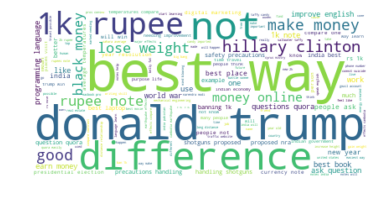

In [75]:
wc = WordCloud(background_color="white", max_words=len(textp_w), stopwords=stopwords)
wc.generate(textp_w)
print ("Word Cloud for Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

__ Word Clouds generated from non duplicate pair question's text __

Word Cloud for non-Duplicate Question pairs:


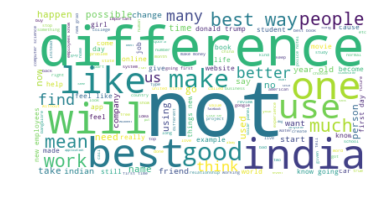

In [76]:
wc = WordCloud(background_color="white", max_words=len(textn_w),stopwords=stopwords)
# generate word cloud
wc.generate(textn_w)
print ("Word Cloud for non-Duplicate Question pairs:")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

<h4> 3.5.1.2 Pair plot of features ['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'] </h4>

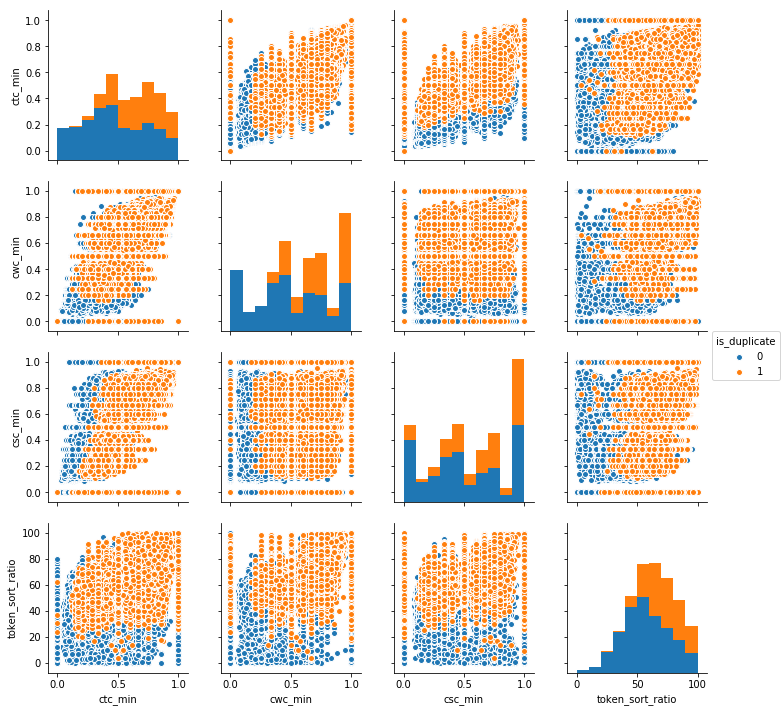

In [77]:
n = df.shape[0]
sns.pairplot(df[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])
plt.show()

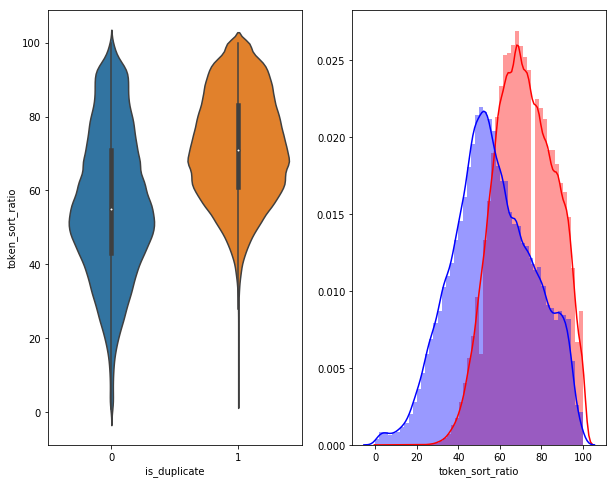

In [78]:
# Distribution of the token_sort_ratio
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'token_sort_ratio', data = df[0:] , )

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['token_sort_ratio'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['token_sort_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

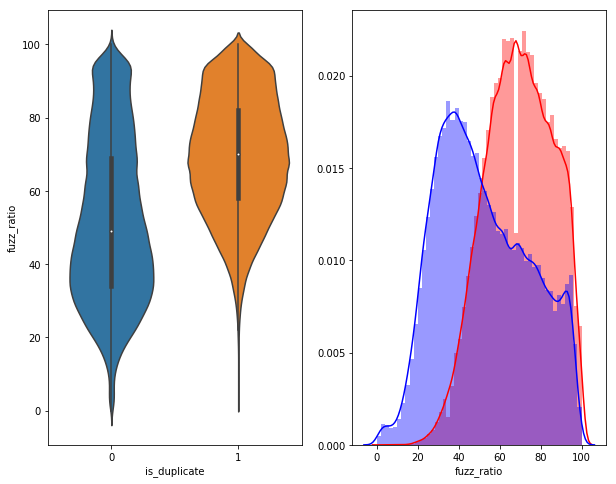

In [79]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'fuzz_ratio', data = df[0:] , )

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['fuzz_ratio'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['fuzz_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

<h3>3.5.2 Visualization </h3>

In [33]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

dfp_subsampled = df[0:5000]
X = MinMaxScaler().fit_transform(dfp_subsampled[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = dfp_subsampled['is_duplicate'].values

In [34]:
tsne2d = TSNE(
    n_components=2,
    perplexity=40,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.009s...
[t-SNE] Computed neighbors for 5000 samples in 0.443s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.128135
[t-SNE] Computed conditional probabilities in 0.299s
[t-SNE] Iteration 50: error = 77.4934921, gradient norm = 0.0392971 (50 iterations in 4.139s)
[t-SNE] Iteration 100: error = 67.5984421, gradient norm = 0.0085402 (50 iterations in 2.590s)
[t-SNE] Iteration 150: error = 66.0523834, gradient norm = 0.0061280 (50 iterations in 2.635s)
[t-SNE] Iteration 200: error = 65.3566742, gradient norm = 0.0038062 (50 iterations in 2.612s)
[t-SNE] Iteration 250: error = 64.9315567, gradient norm = 0.002815

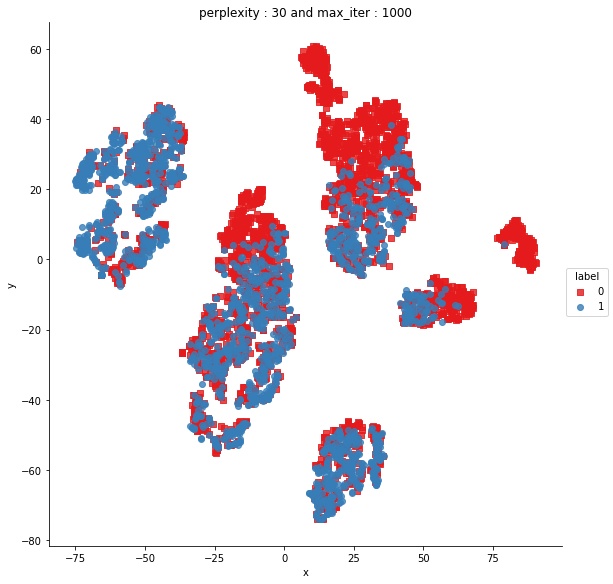

In [35]:
df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))
plt.show()

In [36]:
from sklearn.manifold import TSNE
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.021s...
[t-SNE] Computed neighbors for 5000 samples in 0.454s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.116557
[t-SNE] Computed conditional probabilities in 0.303s
[t-SNE] Iteration 50: error = 80.3552017, gradient norm = 0.0329941 (50 iterations in 13.150s)
[t-SNE] Iteration 100: error = 69.1100388, gradient norm = 0.0034323 (50 iterations in 6.990s)
[t-SNE] Iteration 150: error = 67.6163483, gradient norm = 0.0017810 (50 iterations in 6.077s)
[t-SNE] Iteration 200: error = 67.0578613, gradient norm = 0.0011246 (50 iterations in 6.182s)
[t-SNE] Iteration 250: error = 66.7297821, gradient norm = 0.000927

In [37]:
trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')